# 19 — Uncertainty and Spatial Explanation Maps

This notebook converts the validated repeated-seed Stable Diffusion population into spatial uncertainty evidence.

**Refactor status:** Finished            
**Validation status:** Finished          
**Completion gate passed:** Yes  

It does not run restoration inference. It reuses the 520 candidates and 130 prompt-specific uncertainty groups validated by Notebook 18.

The notebook produces:

- per-pixel empirical seed-variability maps;
- full-image, masked, crop, boundary, and outside-mask views;
- restoration overlays with canonical region geometry;
- integrated absolute-error, signed-improvement, texture, colour, and seam evidence;
- auditable selected explanation panels;
- normalized machine-readable map and provenance manifests.

The maps are empirical variability diagnostics, not calibrated confidence. Low variability does not prove that a restoration is correct, plausible, historically justified, or conservation-appropriate. Evidence components remain separate and are not collapsed into a combined explanation or trustworthiness score.

## Batch 1 — Contract and preflight

This batch establishes repository ownership, exact inputs and outputs, schemas, upstream run state, population arithmetic, map policies, normalization, integration coverage, provenance, and governing-document traceability.

It creates only empty Notebook 19 output directories. It does not calculate maps or persist canonical output files.

In [1]:
from pathlib import Path
import json
import math
import platform
import sys

import cv2
import matplotlib
import numpy as np
import pandas as pd
import PIL
import scipy
import skimage
import yaml
from IPython.display import display


# ---------------------------------------------------------------------------
# Minimal repository bootstrap
# ---------------------------------------------------------------------------

CURRENT_DIRECTORY = Path.cwd().resolve()

PROJECT_ROOT_MATCHES = [
    candidate
    for candidate in (
        CURRENT_DIRECTORY,
        *CURRENT_DIRECTORY.parents,
    )
    if (
        (candidate / ".git").exists()
        and (
            candidate
            / "src"
            / "restoration_eval"
        ).is_dir()
        and (candidate / "notebooks").is_dir()
    )
]

if not PROJECT_ROOT_MATCHES:
    raise FileNotFoundError(
        "Could not locate the painting-restoration "
        f"repository root from {CURRENT_DIRECTORY}."
    )

PROJECT_ROOT = PROJECT_ROOT_MATCHES[0]
SOURCE_DIRECTORY = PROJECT_ROOT / "src"

if str(SOURCE_DIRECTORY) not in sys.path:
    sys.path.insert(
        0,
        str(SOURCE_DIRECTORY),
    )


# ---------------------------------------------------------------------------
# Versioned project helpers
# ---------------------------------------------------------------------------

from restoration_eval import (
    __version__ as PACKAGE_VERSION,
)

from restoration_eval.diffusion_uncertainty import (
    DIFFUSION_UNCERTAINTY_METRIC_VERSION,
    DIFFUSION_UNCERTAINTY_MODULE_VERSION,
)

from restoration_eval.error_maps import (
    ERROR_MAP_VERSION,
    SPATIAL_MAP_MANIFEST_VERSION,
    SPATIAL_MAP_RENDERER_VERSION,
)

from restoration_eval.evaluation_inputs import (
    EVALUATION_INPUTS_MODULE_VERSION,
    EVALUATION_WORKLIST_SCHEMA_VERSION,
)

from restoration_eval.local_consistency import (
    LOCAL_CONSISTENCY_MAP_VERSION,
    LOCAL_CONSISTENCY_MODULE_VERSION,
)

from restoration_eval.manifests import (
    MANIFESTS_MODULE_VERSION,
    sha256_file,
    utc_now_iso,
)

from restoration_eval.paths import (
    PATHS_MODULE_VERSION,
    ensure_output_subdirs,
    load_project_paths_registry,
    notebook_output_root,
    resolve_repo_path,
    to_repo_relative,
    validate_project_paths_registry,
)

from restoration_eval.regions import (
    REGIONS_MODULE_VERSION,
)

from restoration_eval.schemas import (
    SCHEMAS_MODULE_VERSION,
    SPATIAL_EXPLANATION_MAP_IMAGE_SCHEMA,
    SPATIAL_EXPLANATIONS_SCHEMA,
    get_schema,
)

from restoration_eval.spatial_explanations import (
    SPATIAL_EXPLANATIONS_METRIC_VERSION,
    SPATIAL_EXPLANATIONS_MODULE_VERSION,
    SPATIAL_EXPLANATION_MAP_VERSION,
    SPATIAL_EXPLANATION_RENDERER_VERSION,
    load_spatial_explanations_config,
)

from restoration_eval.validation import (
    VALIDATION_MODULE_VERSION,
    ValidationCollector,
)


# ---------------------------------------------------------------------------
# Notebook identity and owned directories
# ---------------------------------------------------------------------------

NOTEBOOK_ID = "19"
NOTEBOOK_STEM = (
    "19_uncertainty_and_spatial_explanation_maps"
)

SUPPORTED_PYTHON_MINORS = {
    (3, 11),
    (3, 12),
}

RUN_STARTED_AT_UTC = utc_now_iso()

NOTEBOOK_OUTPUT_ROOT = notebook_output_root(
    NOTEBOOK_STEM,
    PROJECT_ROOT,
    create=False,
)

OUTPUT_DIRECTORIES = ensure_output_subdirs(
    NOTEBOOK_STEM,
    (
        "data",
        "metrics",
        "images",
        "figures",
        "manifests",
        "validation",
        "work",
    ),
    PROJECT_ROOT,
)

print("Notebook 19 repository bootstrap complete.")
print("Project root:", PROJECT_ROOT)
print("Notebook output root:", NOTEBOOK_OUTPUT_ROOT)
print("Package version:", PACKAGE_VERSION)
print(
    "Spatial-explanations helper:",
    SPATIAL_EXPLANATIONS_MODULE_VERSION,
)
print(
    "Spatial-explanations metric:",
    SPATIAL_EXPLANATIONS_METRIC_VERSION,
)
print(
    "Map-manifest version:",
    SPATIAL_EXPLANATION_MAP_VERSION,
)
print(
    "Renderer version:",
    SPATIAL_EXPLANATION_RENDERER_VERSION,
)
print("Python version:", platform.python_version())
print("Run started at UTC:", RUN_STARTED_AT_UTC)

Notebook 19 repository bootstrap complete.
Project root: D:\Masters\FH\Thesis\painting-restoration-eval
Notebook output root: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\19_uncertainty_and_spatial_explanation_maps
Package version: 0.1.0
Spatial-explanations helper: 1.0.1
Spatial-explanations metric: spatial_explanations.v1
Map-manifest version: spatial_explanation_map_images.v1
Renderer version: spatial_explanation_renderer.v1.1
Python version: 3.12.6
Run started at UTC: 2026-08-30T14:04:52.067647Z


In [2]:
# ---------------------------------------------------------------------------
# Governing paths
# ---------------------------------------------------------------------------

SPATIAL_EXPLANATIONS_CONFIG_PATH = (
    PROJECT_ROOT
    / "config"
    / "evaluation"
    / "spatial_explanations.yaml"
)

NOTEBOOK_PATH = (
    PROJECT_ROOT
    / "notebooks"
    / f"{NOTEBOOK_STEM}.ipynb"
)

LFS_ATTRIBUTES_PATH = (
    PROJECT_ROOT
    / ".gitattributes"
)

HELPER_PATHS = {
    "spatial_explanations_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "spatial_explanations.py"
    ),
    "diffusion_uncertainty_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "diffusion_uncertainty.py"
    ),
    "error_maps_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "error_maps.py"
    ),
    "local_consistency_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "local_consistency.py"
    ),
    "evaluation_inputs_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "evaluation_inputs.py"
    ),
    "regions_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "regions.py"
    ),
    "schemas_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "schemas.py"
    ),
    "paths_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "paths.py"
    ),
    "manifests_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "manifests.py"
    ),
    "validation_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "validation.py"
    ),
}


# ---------------------------------------------------------------------------
# Versioned Notebook 19 configuration
# ---------------------------------------------------------------------------

SPATIAL_CONFIG_DOCUMENT = (
    load_spatial_explanations_config(
        SPATIAL_EXPLANATIONS_CONFIG_PATH
    )
)

SPATIAL_CONFIG = (
    SPATIAL_CONFIG_DOCUMENT[
        "spatial_explanations"
    ]
)

CONFIG_SCHEMA_VERSION = (
    SPATIAL_CONFIG_DOCUMENT[
        "config_schema_version"
    ]
)

CONFIGURED_INPUTS = SPATIAL_CONFIG["inputs"]
CONFIGURED_OUTPUTS = SPATIAL_CONFIG["output"]
EXPECTED_COUNTS = SPATIAL_CONFIG["expected_counts"]
POPULATION_POLICY = SPATIAL_CONFIG["population"]
MAP_POLICY = SPATIAL_CONFIG["map_definition"]
REGION_POLICY = SPATIAL_CONFIG["regions"]
NORMALIZATION_POLICY = (
    SPATIAL_CONFIG["normalization"]
)
OVERLAY_POLICY = SPATIAL_CONFIG["overlays"]
INTEGRATION_POLICY = SPATIAL_CONFIG["integration"]
SELECTION_POLICY = (
    SPATIAL_CONFIG["representative_panels"]
)
EXECUTION_POLICY = SPATIAL_CONFIG["execution"]
EVIDENCE_POLICY = SPATIAL_CONFIG["evidence_policy"]

if SPATIAL_CONFIG["notebook_id"] != NOTEBOOK_ID:
    raise ValueError(
        "Configured notebook ID disagrees with "
        "Notebook 19."
    )

if SPATIAL_CONFIG["notebook_stem"] != NOTEBOOK_STEM:
    raise ValueError(
        "Configured notebook stem disagrees with "
        "Notebook 19."
    )

if (
    CONFIGURED_OUTPUTS["root"]
    != f"outputs/{NOTEBOOK_STEM}"
):
    raise ValueError(
        "Configured output root violates Notebook 19 "
        "ownership."
    )


# ---------------------------------------------------------------------------
# Explicit input paths
# ---------------------------------------------------------------------------

INPUTS = {
    key: resolve_repo_path(
        configured_path,
        PROJECT_ROOT,
        must_exist=True,
    )
    for key, configured_path
    in CONFIGURED_INPUTS.items()
}


# ---------------------------------------------------------------------------
# Canonical output paths
# ---------------------------------------------------------------------------

OUTPUTS = {
    "numeric_maps": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "numeric_maps_path"
        ]
    ),
    "spatial_explanations": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["metrics_path"]
    ),
    "uncertainty_images": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "uncertainty_images_root"
        ]
    ),
    "overlay_images": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "overlay_images_root"
        ]
    ),
    "integrated_local_images": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "integrated_local_images_root"
        ]
    ),
    "selected_panels": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "selected_panels_root"
        ]
    ),
    "map_manifest": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "map_manifest_path"
        ]
    ),
    "run_manifest": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "run_manifest_path"
        ]
    ),
    "artifacts": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "artifacts_path"
        ]
    ),
    "validation": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "validation_path"
        ]
    ),
}

WORK_PATHS = {
    "raw_map_work_root": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "raw_map_work_root"
        ]
    ),
    "map_checkpoint": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "map_checkpoint_path"
        ]
    ),
    "render_checkpoint": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "render_checkpoint_path"
        ]
    ),
}

for output_key in (
    "uncertainty_images",
    "overlay_images",
    "integrated_local_images",
    "selected_panels",
):
    OUTPUTS[output_key].mkdir(
        parents=True,
        exist_ok=True,
    )


# ---------------------------------------------------------------------------
# Provenance paths and checksums
# ---------------------------------------------------------------------------

GOVERNING_PATHS = {
    "notebook": NOTEBOOK_PATH,
    "notebook_roadmap": (
        INPUTS["notebook_roadmap_path"]
    ),
    "implementation_guidelines": (
        INPUTS[
            "implementation_guidelines_path"
        ]
    ),
    "git_lfs_attributes": LFS_ATTRIBUTES_PATH,
}

CONFIGURATION_PATHS = {
    "spatial_explanations": (
        SPATIAL_EXPLANATIONS_CONFIG_PATH
    ),
    "diffusion_uncertainty": (
        INPUTS[
            "diffusion_uncertainty_config_path"
        ]
    ),
    "spatial_diagnostics": (
        INPUTS[
            "spatial_diagnostics_config_path"
        ]
    ),
    "local_consistency": (
        INPUTS[
            "local_consistency_config_path"
        ]
    ),
}

CONFIGURATION_CHECKSUMS = {
    key: sha256_file(path)
    for key, path
    in CONFIGURATION_PATHS.items()
}

HELPER_CHECKSUMS = {
    key: sha256_file(path)
    for key, path
    in HELPER_PATHS.items()
}

print("Notebook 19 paths and configuration loaded.")
print("Declared inputs:", len(INPUTS))
print("Declared canonical outputs:", len(OUTPUTS))
print("Declared work paths:", len(WORK_PATHS))
print(
    "Expected uncertainty groups:",
    EXPECTED_COUNTS["uncertainty_groups"],
)
print(
    "Expected spatial rows:",
    EXPECTED_COUNTS[
        "spatial_explanation_rows"
    ],
)
print(
    "Expected map-manifest rows:",
    EXPECTED_COUNTS["map_manifest_rows"],
)
print(
    "Expected canonical files:",
    EXPECTED_COUNTS[
        "canonical_file_count"
    ],
)

Notebook 19 paths and configuration loaded.
Declared inputs: 29
Declared canonical outputs: 10
Declared work paths: 3
Expected uncertainty groups: 130
Expected spatial rows: 780
Expected map-manifest rows: 1055
Expected canonical files: 431


In [3]:
# ---------------------------------------------------------------------------
# Inventory and project-path registry
# ---------------------------------------------------------------------------

inventory_df = pd.read_csv(
    INPUTS["inventory_path"],
    low_memory=False,
)

with INPUTS["inventory_run_path"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    inventory_run = json.load(handle)

project_paths_registry = (
    load_project_paths_registry(
        PROJECT_ROOT
    )
)

with INPUTS["schema_registry_path"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    upstream_schema_registry = json.load(handle)

inventory_relative_paths = set(
    inventory_df["relative_path"].astype(str)
)

registry_artifacts = {
    record["artifact_key"]: record
    for record
    in project_paths_registry["artifacts"]
}


# ---------------------------------------------------------------------------
# Required upstream run manifests
# ---------------------------------------------------------------------------

UPSTREAM_MANIFEST_KEYS = {
    "notebook_01": (
        "artworks_run_manifest_path"
    ),
    "notebook_02": (
        "geometry_run_manifest_path"
    ),
    "notebook_08": (
        "contracts_run_manifest_path"
    ),
    "notebook_11": (
        "stable_diffusion_run_manifest_path"
    ),
    "notebook_16": (
        "spatial_diagnostics_run_manifest_path"
    ),
    "notebook_17": (
        "local_consistency_run_manifest_path"
    ),
    "notebook_18": (
        "uncertainty_run_manifest_path"
    ),
}

upstream_manifests = {}

for producer, input_key in (
    UPSTREAM_MANIFEST_KEYS.items()
):
    with INPUTS[input_key].open(
        "r",
        encoding="utf-8-sig",
    ) as handle:
        upstream_manifests[producer] = json.load(
            handle
        )


# ---------------------------------------------------------------------------
# Explicit input contract
# ---------------------------------------------------------------------------

INPUT_METADATA = {
    "inventory_path": (
        "global_inventory",
        "inventory_table",
        "project_file_inventory.v1",
    ),
    "inventory_run_path": (
        "global_inventory",
        "run_manifest",
        "inventory_run.v1",
    ),
    "project_paths_path": (
        "global_inventory",
        "artifact_registry",
        "project_paths.v1",
    ),
    "artworks_path": (
        "01_dataset_verification",
        "artwork_metadata",
        "artworks.v1",
    ),
    "artworks_run_manifest_path": (
        "01_dataset_verification",
        "run_manifest",
        "run_manifest.v1",
    ),
    "geometry_path": (
        "02_image_preprocessing",
        "preprocessing_geometry",
        "preprocessed_images.v1",
    ),
    "geometry_run_manifest_path": (
        "02_image_preprocessing",
        "run_manifest",
        "run_manifest.v1",
    ),
    "case_registry_path": (
        "08_experiment_contracts_and_region_policy",
        "case_registry",
        "case_registry.v1",
    ),
    "model_eligibility_path": (
        "08_experiment_contracts_and_region_policy",
        "model_eligibility",
        "model_eligibility.v1",
    ),
    "region_policy_path": (
        "08_experiment_contracts_and_region_policy",
        "region_policy",
        "region_policy.v1",
    ),
    "schema_registry_path": (
        "08_experiment_contracts_and_region_policy",
        "schema_registry",
        "schema_registry.v1",
    ),
    "contracts_run_manifest_path": (
        "08_experiment_contracts_and_region_policy",
        "run_manifest",
        "run_manifest.v1",
    ),
    "stable_diffusion_candidates_path": (
        "11_stable_diffusion_restoration",
        "restoration_candidates",
        "stable_diffusion_candidates.v1",
    ),
    "stable_diffusion_output_root": (
        "11_stable_diffusion_restoration",
        "candidate_asset_root",
        "directory",
    ),
    "stable_diffusion_run_manifest_path": (
        "11_stable_diffusion_restoration",
        "run_manifest",
        "run_manifest.v1",
    ),
    "spatial_diagnostics_config_path": (
        "16_difference_maps_and_spatial_diagnostics",
        "configuration",
        "spatial_diagnostics_config.v1",
    ),
    "spatial_diagnostics_metrics_path": (
        "16_difference_maps_and_spatial_diagnostics",
        "spatial_metrics",
        "spatial_diagnostics.v1",
    ),
    "spatial_diagnostics_map_manifest_path": (
        "16_difference_maps_and_spatial_diagnostics",
        "map_manifest",
        "spatial_map_images.v1",
    ),
    "spatial_diagnostics_run_manifest_path": (
        "16_difference_maps_and_spatial_diagnostics",
        "run_manifest",
        "run_manifest.v1",
    ),
    "local_consistency_config_path": (
        "17_local_consistency_metrics",
        "configuration",
        "local_consistency_config.v1",
    ),
    "local_consistency_metrics_path": (
        "17_local_consistency_metrics",
        "local_metrics",
        "local_consistency.v1",
    ),
    "local_consistency_map_manifest_path": (
        "17_local_consistency_metrics",
        "map_manifest",
        "local_consistency_map_images.v1",
    ),
    "local_consistency_run_manifest_path": (
        "17_local_consistency_metrics",
        "run_manifest",
        "run_manifest.v1",
    ),
    "diffusion_uncertainty_config_path": (
        "18_diffusion_uncertainty_analysis",
        "configuration",
        "diffusion_uncertainty_config.v1",
    ),
    "uncertainty_metrics_path": (
        "18_diffusion_uncertainty_analysis",
        "uncertainty_metrics",
        "diffusion_uncertainty.v1",
    ),
    "uncertainty_calibration_inputs_path": (
        "18_diffusion_uncertainty_analysis",
        "calibration_inputs",
        "uncertainty_calibration_inputs.v1",
    ),
    "uncertainty_run_manifest_path": (
        "18_diffusion_uncertainty_analysis",
        "run_manifest",
        "run_manifest.v1",
    ),
    "implementation_guidelines_path": (
        "repository_documentation",
        "governing_document",
        "markdown",
    ),
    "notebook_roadmap_path": (
        "repository_documentation",
        "governing_document",
        "markdown",
    ),
}

if set(INPUT_METADATA) != set(INPUTS):
    raise ValueError(
        "Input metadata does not match the configured "
        "Notebook 19 input keys."
    )

input_contract_records = []

for input_key, path in INPUTS.items():
    (
        producer,
        artifact_role,
        schema_version,
    ) = INPUT_METADATA[input_key]

    input_contract_records.append(
        {
            "input_key": input_key,
            "producer": producer,
            "artifact_role": artifact_role,
            "schema_version": schema_version,
            "relative_path": to_repo_relative(
                path,
                PROJECT_ROOT,
            ),
            "path_kind": (
                "file"
                if path.is_file()
                else "directory"
            ),
            "exists": path.exists(),
            "size_bytes": (
                int(path.stat().st_size)
                if path.is_file()
                else np.nan
            ),
        }
    )

input_contract_df = pd.DataFrame(
    input_contract_records
)


# ---------------------------------------------------------------------------
# Explicit canonical-output contract
# ---------------------------------------------------------------------------

OUTPUT_METADATA = {
    "numeric_maps": (
        "numeric_map_archive",
        "raw_spatial_uncertainty_evidence",
        "spatial_uncertainty_numeric_archive.v1",
        130,
        1,
    ),
    "spatial_explanations": (
        "metric_table",
        "regional_spatial_explanation_evidence",
        SPATIAL_EXPLANATIONS_METRIC_VERSION,
        780,
        1,
    ),
    "uncertainty_images": (
        "image_collection",
        "uncertainty_variant_panels",
        SPATIAL_EXPLANATION_RENDERER_VERSION,
        np.nan,
        130,
    ),
    "overlay_images": (
        "image_collection",
        "uncertainty_geometry_overlays",
        SPATIAL_EXPLANATION_RENDERER_VERSION,
        np.nan,
        130,
    ),
    "integrated_local_images": (
        "image_collection",
        "scratch_aware_local_map_fill_in",
        LOCAL_CONSISTENCY_MAP_VERSION,
        np.nan,
        150,
    ),
    "selected_panels": (
        "figure_collection",
        "auditable_selected_explanations",
        SPATIAL_EXPLANATION_RENDERER_VERSION,
        np.nan,
        15,
    ),
    "map_manifest": (
        "manifest_table",
        "normalized_map_provenance",
        SPATIAL_EXPLANATION_MAP_VERSION,
        1055,
        1,
    ),
    "run_manifest": (
        "manifest",
        "run_provenance",
        "run_manifest.v1",
        1,
        1,
    ),
    "artifacts": (
        "manifest_table",
        "artifact_registry_handoff",
        "artifact_manifest.v1",
        8,
        1,
    ),
    "validation": (
        "validation_table",
        "consolidated_validation",
        "validation_checks.v1",
        np.nan,
        1,
    ),
}

output_contract_records = []

for output_key, path in OUTPUTS.items():
    (
        artifact_type,
        artifact_role,
        schema_version,
        expected_rows,
        expected_files,
    ) = OUTPUT_METADATA[output_key]

    output_contract_records.append(
        {
            "output_key": output_key,
            "artifact_type": artifact_type,
            "artifact_role": artifact_role,
            "schema_version": schema_version,
            "relative_path": to_repo_relative(
                path,
                PROJECT_ROOT,
            ),
            "expected_rows_or_entries": (
                expected_rows
            ),
            "expected_file_count": expected_files,
            "exists_before_execution": (
                path.exists()
            ),
        }
    )

output_contract_df = pd.DataFrame(
    output_contract_records
)

print("Notebook 19 contracts assembled.")
print(
    "Inventory run ID:",
    inventory_run["inventory_run_id"],
)
print("Inventory rows:", len(inventory_df))
print(
    "Registered artifacts:",
    len(registry_artifacts),
)
print(
    "Upstream run manifests:",
    len(upstream_manifests),
)
print(
    "Input-contract rows:",
    len(input_contract_df),
)
print(
    "Output-contract rows:",
    len(output_contract_df),
)

Notebook 19 contracts assembled.
Inventory run ID: inventory_20260830T130129Z_a4f4f0f8
Inventory rows: 17549
Registered artifacts: 100
Upstream run manifests: 7
Input-contract rows: 29
Output-contract rows: 10


In [4]:
# ---------------------------------------------------------------------------
# Batch 1 preflight validation
# ---------------------------------------------------------------------------

VALIDATION = ValidationCollector()
VALIDATION_STAGE = "batch_1_preflight"


def add_preflight_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=VALIDATION_STAGE,
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


# ---------------------------------------------------------------------------
# Runtime, identity, and output ownership
# ---------------------------------------------------------------------------

observed_python_minor = (
    sys.version_info.major,
    sys.version_info.minor,
)

add_preflight_check(
    "supported_python",
    "The runtime uses an approved Python minor version.",
    sorted(SUPPORTED_PYTHON_MINORS),
    observed_python_minor,
    observed_python_minor
    in SUPPORTED_PYTHON_MINORS,
)

add_preflight_check(
    "notebook_identity",
    "The configuration and notebook identity agree.",
    {
        "notebook_id": NOTEBOOK_ID,
        "notebook_stem": NOTEBOOK_STEM,
    },
    {
        "notebook_id": SPATIAL_CONFIG[
            "notebook_id"
        ],
        "notebook_stem": SPATIAL_CONFIG[
            "notebook_stem"
        ],
    },
    (
        SPATIAL_CONFIG["notebook_id"]
        == NOTEBOOK_ID
        and SPATIAL_CONFIG["notebook_stem"]
        == NOTEBOOK_STEM
    ),
)

expected_output_root = (
    PROJECT_ROOT
    / "outputs"
    / NOTEBOOK_STEM
).resolve()

add_preflight_check(
    "owned_output_root",
    "All Notebook 19 writes remain under its exact owned root.",
    str(expected_output_root),
    str(NOTEBOOK_OUTPUT_ROOT.resolve()),
    (
        NOTEBOOK_OUTPUT_ROOT.resolve()
        == expected_output_root
    ),
)

observed_output_subdirectories = sorted(
    path.name
    for path in NOTEBOOK_OUTPUT_ROOT.iterdir()
    if path.is_dir()
)

add_preflight_check(
    "owned_output_subdirectories",
    "Only approved Notebook 19 top-level output directories exist.",
    sorted(OUTPUT_DIRECTORIES),
    observed_output_subdirectories,
    (
        observed_output_subdirectories
        == sorted(OUTPUT_DIRECTORIES)
    ),
)

existing_canonical_files = sorted(
    to_repo_relative(path, PROJECT_ROOT)
    for path in NOTEBOOK_OUTPUT_ROOT.rglob("*")
    if path.is_file()
)

add_preflight_check(
    "canonical_outputs_not_prematurely_present",
    "No canonical Notebook 19 file exists before computation.",
    [],
    existing_canonical_files,
    not existing_canonical_files,
)


# ---------------------------------------------------------------------------
# Input, governing-file, and helper availability
# ---------------------------------------------------------------------------

missing_inputs = sorted(
    input_key
    for input_key, path in INPUTS.items()
    if not path.exists()
)

add_preflight_check(
    "required_inputs_exist",
    "Every declared Notebook 19 input exists.",
    [],
    missing_inputs,
    not missing_inputs,
)

missing_governing_files = sorted(
    key
    for key, path in GOVERNING_PATHS.items()
    if not path.is_file()
)

add_preflight_check(
    "governing_files_exist",
    "The notebook, roadmap, guidelines, and LFS rules exist.",
    [],
    missing_governing_files,
    not missing_governing_files,
)

missing_helpers = sorted(
    key
    for key, path in HELPER_PATHS.items()
    if not path.is_file()
)

add_preflight_check(
    "required_helpers_exist",
    "Every required canonical helper exists.",
    [],
    missing_helpers,
    not missing_helpers,
)


# ---------------------------------------------------------------------------
# Inventory and project-path registry
# ---------------------------------------------------------------------------

add_preflight_check(
    "inventory_completed",
    "The current inventory run completed.",
    "completed",
    inventory_run.get("status"),
    inventory_run.get("status") == "completed",
)

inventory_read_errors = int(
    pd.to_numeric(
        inventory_df["read_error_count"],
        errors="coerce",
    )
    .fillna(0)
    .sum()
)

add_preflight_check(
    "inventory_has_no_read_errors",
    "The current inventory contains no read errors.",
    0,
    inventory_read_errors,
    inventory_read_errors == 0,
)

add_preflight_check(
    "inventory_row_count",
    "The inventory matches its run summary.",
    inventory_run["summary"]["file_count"],
    len(inventory_df),
    (
        len(inventory_df)
        == inventory_run["summary"]["file_count"]
        and len(inventory_df) > 0
    ),
)

inventory_exempt_input_keys = {
    "inventory_path",
    "inventory_run_path",
    "stable_diffusion_output_root",
}

file_inputs_requiring_inventory = {
    input_key: to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    for input_key, path in INPUTS.items()
    if (
        path.is_file()
        and input_key
        not in inventory_exempt_input_keys
    )
}

missing_input_inventory_records = sorted(
    relative_path
    for relative_path
    in file_inputs_requiring_inventory.values()
    if relative_path
    not in inventory_relative_paths
)

add_preflight_check(
    "inputs_are_in_inventory",
    "Every non-exempt input file appears in the refreshed inventory.",
    [],
    missing_input_inventory_records,
    not missing_input_inventory_records,
)

governing_and_helper_relative_paths = {
    to_repo_relative(path, PROJECT_ROOT)
    for path in (
        *GOVERNING_PATHS.values(),
        *HELPER_PATHS.values(),
        *CONFIGURATION_PATHS.values(),
    )
}

missing_governing_inventory_records = sorted(
    governing_and_helper_relative_paths
    - inventory_relative_paths
)

add_preflight_check(
    "governing_files_are_in_inventory",
    "Every helper, configuration, and governing file is inventoried.",
    [],
    missing_governing_inventory_records,
    not missing_governing_inventory_records,
)

registry_errors = (
    validate_project_paths_registry(
        project_paths_registry
    )
)

add_preflight_check(
    "project_paths_registry_valid",
    "The normalized project-path registry remains valid.",
    [],
    registry_errors,
    not registry_errors,
)


# ---------------------------------------------------------------------------
# Upstream manifests and runtime schemas
# ---------------------------------------------------------------------------

upstream_run_statuses = {
    producer: manifest.get("run_status")
    for producer, manifest
    in upstream_manifests.items()
}

noncompleted_upstream_runs = {
    producer: status
    for producer, status
    in upstream_run_statuses.items()
    if status != "completed"
}

add_preflight_check(
    "upstream_runs_completed",
    "Every required upstream notebook has a completed run manifest.",
    {},
    noncompleted_upstream_runs,
    not noncompleted_upstream_runs,
)

runtime_schema_contract = {
    "spatial_explanations": (
        get_schema("spatial_explanations")
        is SPATIAL_EXPLANATIONS_SCHEMA
    ),
    "spatial_explanation_map_images": (
        get_schema(
            "spatial_explanation_map_images"
        )
        is SPATIAL_EXPLANATION_MAP_IMAGE_SCHEMA
    ),
}

add_preflight_check(
    "runtime_schemas_registered",
    "Both Notebook 19 schemas are registered.",
    {
        "spatial_explanations": True,
        "spatial_explanation_map_images": True,
    },
    runtime_schema_contract,
    all(runtime_schema_contract.values()),
)

add_preflight_check(
    "upstream_schema_registry_version",
    "Notebook 08 exposes the approved schema-registry version.",
    "schema_registry.v1",
    upstream_schema_registry.get(
        "schema_registry_version"
    ),
    (
        upstream_schema_registry.get(
            "schema_registry_version"
        )
        == "schema_registry.v1"
    ),
)


# ---------------------------------------------------------------------------
# Exact population and output arithmetic
# ---------------------------------------------------------------------------

expected_seed_count = len(
    POPULATION_POLICY["expected_seeds"]
)

expected_candidate_count = (
    EXPECTED_COUNTS["uncertainty_groups"]
    * expected_seed_count
)

add_preflight_check(
    "population_arithmetic",
    "Group and seed counts produce the exact candidate population.",
    {
        "groups": 130,
        "seeds_per_group": 4,
        "candidates": 520,
    },
    {
        "groups": EXPECTED_COUNTS[
            "uncertainty_groups"
        ],
        "seeds_per_group": expected_seed_count,
        "candidates": expected_candidate_count,
    },
    (
        expected_seed_count == 4
        and expected_candidate_count
        == EXPECTED_COUNTS["candidates"]
    ),
)

prompt_group_total = (
    EXPECTED_COUNTS["generic_groups"]
    + EXPECTED_COUNTS[
        "scratch_aware_groups"
    ]
)

add_preflight_check(
    "prompt_group_arithmetic",
    "Generic and scratch-aware groups remain separate and complete.",
    130,
    prompt_group_total,
    (
        POPULATION_POLICY[
            "separate_prompt_variants"
        ]
        and prompt_group_total
        == EXPECTED_COUNTS[
            "uncertainty_groups"
        ]
    ),
)

expected_spatial_rows = (
    EXPECTED_COUNTS["uncertainty_groups"]
    * len(REGION_POLICY["region_order"])
)

add_preflight_check(
    "spatial_row_arithmetic",
    "Every group contributes all six canonical regional rows.",
    EXPECTED_COUNTS[
        "spatial_explanation_rows"
    ],
    expected_spatial_rows,
    (
        expected_spatial_rows
        == EXPECTED_COUNTS[
            "spatial_explanation_rows"
        ]
    ),
)

expected_map_manifest_rows = sum(
    EXPECTED_COUNTS[key]
    for key in (
        "numeric_map_archive_entries",
        "uncertainty_panels",
        "overlay_panels",
        "upstream_error_component_links",
        "upstream_generic_local_component_links",
        "owned_scratch_aware_local_component_maps",
        "selected_panels",
    )
)

add_preflight_check(
    "map_manifest_arithmetic",
    "Owned and linked map records sum to the normalized map manifest.",
    EXPECTED_COUNTS["map_manifest_rows"],
    expected_map_manifest_rows,
    (
        expected_map_manifest_rows
        == EXPECTED_COUNTS[
            "map_manifest_rows"
        ]
    ),
)

expected_canonical_files = sum(
    EXPECTED_COUNTS[key]
    for key in (
        "uncertainty_panels",
        "overlay_panels",
        "owned_scratch_aware_local_component_maps",
        "selected_panels",
    )
) + 6

add_preflight_check(
    "canonical_file_arithmetic",
    "Asset files plus six canonical tables/manifests equal the file contract.",
    EXPECTED_COUNTS[
        "canonical_file_count"
    ],
    expected_canonical_files,
    (
        expected_canonical_files
        == EXPECTED_COUNTS[
            "canonical_file_count"
        ]
    ),
)


# ---------------------------------------------------------------------------
# Scientific and rendering policies
# ---------------------------------------------------------------------------

add_preflight_check(
    "map_definition_matches_notebook_18",
    "The spatial map uses Notebook 18's exact RGB seed-variability definition.",
    (
        "mean(std(restored_rgb_across_seeds, "
        "ddof=0), axis=rgb)"
    ),
    MAP_POLICY["formula"],
    (
        MAP_POLICY["formula"]
        == (
            "mean(std(restored_rgb_across_seeds, "
            "ddof=0), axis=rgb)"
        )
    ),
)

add_preflight_check(
    "global_normalization_policy",
    "All regional views share one global robust scale.",
    {
        "policy": "global_content_p99_5.v1",
        "percentile": 99.5,
        "vmin": 0.0,
    },
    {
        "policy": NORMALIZATION_POLICY[
            "policy_id"
        ],
        "percentile": NORMALIZATION_POLICY[
            "percentile"
        ],
        "vmin": NORMALIZATION_POLICY["vmin"],
    },
    (
        NORMALIZATION_POLICY["policy_id"]
        == "global_content_p99_5.v1"
        and float(
            NORMALIZATION_POLICY["percentile"]
        )
        == 99.5
        and float(
            NORMALIZATION_POLICY["vmin"]
        )
        == 0.0
    ),
)

add_preflight_check(
    "prompt_safe_filename_identity",
    "Prompt-specific maps use uncertainty_group_id filenames.",
    "uncertainty_group_id",
    POPULATION_POLICY["filename_identity"],
    (
        POPULATION_POLICY[
            "filename_identity"
        ]
        == "uncertainty_group_id"
    ),
)

add_preflight_check(
    "component_integration_contract",
    "Error maps are linked and only missing scratch-aware local maps are rendered.",
    {
        "upstream_error_links": 260,
        "upstream_generic_local_links": 240,
        "owned_scratch_local_maps": 150,
    },
    {
        "upstream_error_links": (
            EXPECTED_COUNTS[
                "upstream_error_component_links"
            ]
        ),
        "upstream_generic_local_links": (
            EXPECTED_COUNTS[
                "upstream_generic_local_component_links"
            ]
        ),
        "owned_scratch_local_maps": (
            EXPECTED_COUNTS[
                "owned_scratch_aware_local_component_maps"
            ]
        ),
    },
    (
        EXPECTED_COUNTS[
            "upstream_error_component_links"
        ]
        == 260
        and EXPECTED_COUNTS[
            "upstream_generic_local_component_links"
        ]
        == 240
        and EXPECTED_COUNTS[
            "owned_scratch_aware_local_component_maps"
        ]
        == 150
    ),
)

add_preflight_check(
    "sdxl_uncertainty_not_applicable",
    "Single-seed SDXL evidence remains explicitly not applicable.",
    "not_applicable_insufficient_seed_coverage",
    POPULATION_POLICY["sdxl_policy"],
    (
        POPULATION_POLICY["sdxl_policy"]
        == (
            "not_applicable_"
            "insufficient_seed_coverage"
        )
    ),
)

add_preflight_check(
    "no_combined_explanation_score",
    "Notebook 19 does not collapse components into a combined score.",
    False,
    EVIDENCE_POLICY[
        "combined_explanation_score_retained"
    ],
    not EVIDENCE_POLICY[
        "combined_explanation_score_retained"
    ],
)

add_preflight_check(
    "progress_interval",
    "Long stages report progress every ten groups.",
    10,
    EXECUTION_POLICY[
        "progress_interval_groups"
    ],
    (
        EXECUTION_POLICY[
            "progress_interval_groups"
        ]
        == 10
    ),
)

lfs_attributes_text = (
    LFS_ATTRIBUTES_PATH.read_text(
        encoding="utf-8-sig"
    )
)

add_preflight_check(
    "numeric_archive_uses_lfs",
    "Generated NPZ archives are tracked through Git LFS.",
    True,
    (
        "outputs/**/*.npz filter=lfs"
        in lfs_attributes_text
    ),
    (
        "outputs/**/*.npz filter=lfs"
        in lfs_attributes_text
    ),
)


# ---------------------------------------------------------------------------
# Runtime dependencies
# ---------------------------------------------------------------------------

runtime_dependency_df = pd.DataFrame(
    [
        {
            "dependency": "numpy",
            "version": np.__version__,
            "installed": True,
        },
        {
            "dependency": "pandas",
            "version": pd.__version__,
            "installed": True,
        },
        {
            "dependency": "Pillow",
            "version": PIL.__version__,
            "installed": True,
        },
        {
            "dependency": "matplotlib",
            "version": matplotlib.__version__,
            "installed": True,
        },
        {
            "dependency": "PyYAML",
            "version": yaml.__version__,
            "installed": True,
        },
        {
            "dependency": "scipy",
            "version": scipy.__version__,
            "installed": True,
        },
        {
            "dependency": "scikit-image",
            "version": skimage.__version__,
            "installed": True,
        },
        {
            "dependency": "opencv-python",
            "version": cv2.__version__,
            "installed": True,
        },
    ]
)

add_preflight_check(
    "runtime_dependencies",
    "All map-computation and rendering dependencies imported successfully.",
    8,
    int(
        runtime_dependency_df[
            "installed"
        ].sum()
    ),
    (
        runtime_dependency_df[
            "installed"
        ].astype(bool).all()
    ),
)


# ---------------------------------------------------------------------------
# Governing-document traceability
# ---------------------------------------------------------------------------

roadmap_text = INPUTS[
    "notebook_roadmap_path"
].read_text(
    encoding="utf-8-sig"
)

guidelines_text = INPUTS[
    "implementation_guidelines_path"
].read_text(
    encoding="utf-8-sig"
)

roadmap_markers = {
    "notebook_heading": (
        "## 19 — Uncertainty and Spatial Explanation Maps"
        in roadmap_text
    ),
    "depends_on_16_18": (
        "Depends on:** Notebooks 16–18"
        in roadmap_text
    ),
    "uncertainty_maps": (
        "per-pixel diffusion uncertainty heatmaps"
        in roadmap_text
    ),
    "local_map_integration": (
        "Integrate texture-inconsistency maps"
        in roadmap_text
        and "Integrate colour-drift maps"
        in roadmap_text
        and "Integrate seam maps"
        in roadmap_text
    ),
    "group_id_filename_policy": (
        "map filenames use `uncertainty_group_id`"
        in roadmap_text
    ),
    "no_report_contract": (
        "Notebook 19 does not generate a standalone report"
        in roadmap_text
    ),
}

add_preflight_check(
    "roadmap_traceability",
    "The roadmap retains the approved Notebook 19 responsibilities and clarifications.",
    {
        key: True
        for key in roadmap_markers
    },
    roadmap_markers,
    all(roadmap_markers.values()),
)

manual_editing_markers = {
    "manual_editing_section": (
        "### 6.1 Manual notebook editing policy"
        in guidelines_text
    ),
    "assistant_must_not_edit_ipynb": (
        "must not create, replace, patch, or otherwise edit an `.ipynb`"
        in guidelines_text
    ),
    "assistant_must_not_insert_batches": (
        "must not insert Batch 1 or any later cells into a notebook file"
        in guidelines_text
    ),
}

add_preflight_check(
    "manual_notebook_policy",
    "The implementation guidelines retain the manual notebook policy.",
    {
        key: True
        for key in manual_editing_markers
    },
    manual_editing_markers,
    all(manual_editing_markers.values()),
)

report_output_declared = any(
    "report" in output_key.lower()
    or "/reports/" in str(path).replace(
        "\\",
        "/",
    )
    for output_key, path in OUTPUTS.items()
)

add_preflight_check(
    "report_not_applicable",
    "Notebook 19 has no standalone-report output contract.",
    False,
    report_output_declared,
    not report_output_declared,
    severity="info",
)

checksum_lengths_valid = all(
    len(checksum) == 64
    for checksum in (
        *CONFIGURATION_CHECKSUMS.values(),
        *HELPER_CHECKSUMS.values(),
    )
)

add_preflight_check(
    "provenance_checksum_format",
    "Every configuration and helper checksum is a complete SHA-256.",
    True,
    checksum_lengths_valid,
    checksum_lengths_valid,
)

print("Notebook 19 Batch 1 checks assembled.")
print("Preflight checks:", len(VALIDATION.checks))
print(
    "Runtime dependencies checked:",
    len(runtime_dependency_df),
)
print(
    "Canonical output files present:",
    len(existing_canonical_files),
)

Notebook 19 Batch 1 checks assembled.
Preflight checks: 35
Runtime dependencies checked: 8
Canonical output files present: 0


In [5]:
# ---------------------------------------------------------------------------
# Batch 1 gate and review tables
# ---------------------------------------------------------------------------

batch_1_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq("batch_1_preflight")
    ]
    .reset_index(drop=True)
)

display(input_contract_df)
display(output_contract_df)
display(runtime_dependency_df)
display(batch_1_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 19 Batch 1 summary")
print("---------------------------")
print(
    "Validation checks:",
    len(batch_1_validation_df),
)
print(
    "Blocking failures:",
    len(VALIDATION.blocking_failures),
)
print(
    "Inventory run ID:",
    inventory_run["inventory_run_id"],
)
print(
    "Inventory rows:",
    len(inventory_df),
)
print(
    "Expected groups:",
    EXPECTED_COUNTS[
        "uncertainty_groups"
    ],
)
print(
    "Expected candidates:",
    EXPECTED_COUNTS["candidates"],
)
print(
    "Expected regional rows:",
    EXPECTED_COUNTS[
        "spatial_explanation_rows"
    ],
)
print(
    "Expected map-manifest rows:",
    EXPECTED_COUNTS[
        "map_manifest_rows"
    ],
)
print(
    "Expected canonical files:",
    EXPECTED_COUNTS[
        "canonical_file_count"
    ],
)
print(
    "No canonical Notebook 19 files were "
    "persisted in Batch 1."
)
print(
    "Batch 1 passed: ownership, input and output "
    "contracts, inventory coverage, upstream manifests, "
    "schemas, population arithmetic, map policies, "
    "normalization, integration, dependencies, LFS "
    "handling, and governing-document traceability "
    "satisfy the Notebook 19 contract."
)

,input_key,producer,artifact_role,schema_version,relative_path,path_kind,exists,size_bytes
0,inventory_path,global_inventory,inventory_table,project_file_inventory.v1,outputs/inventory/project_file_inventory.csv,file,True,9282486.0
1,inventory_run_path,global_inventory,run_manifest,inventory_run.v1,outputs/inventory/inventory_run.json,file,True,2659.0
2,project_paths_path,global_inventory,artifact_registry,project_paths.v1,outputs/inventory/project_paths.json,file,True,62746.0
3,artworks_path,01_dataset_verification,artwork_metadata,artworks.v1,outputs/01_dataset_verification/data/artworks.csv,file,True,29822.0
4,artworks_run_manifest_path,01_dataset_verification,run_manifest,run_manifest.v1,outputs/01_dataset_verification/manifests/run_...,file,True,8981.0
5,geometry_path,02_image_preprocessing,preprocessing_geometry,preprocessed_images.v1,outputs/02_image_preprocessing/data/preprocess...,file,True,32706.0
6,geometry_run_manifest_path,02_image_preprocessing,run_manifest,run_manifest.v1,outputs/02_image_preprocessing/manifests/run_m...,file,True,10754.0
7,case_registry_path,08_experiment_contracts_and_region_policy,case_registry,case_registry.v1,outputs/08_experiment_contracts_and_region_pol...,file,True,263890.0
8,model_eligibility_path,08_experiment_contracts_and_region_policy,model_eligibility,model_eligibility.v1,outputs/08_experiment_contracts_and_region_pol...,file,True,600509.0
9,region_policy_path,08_experiment_contracts_and_region_policy,region_policy,region_policy.v1,outputs/08_experiment_contracts_and_region_pol...,file,True,51385.0


,output_key,artifact_type,artifact_role,schema_version,relative_path,expected_rows_or_entries,expected_file_count,exists_before_execution
0,numeric_maps,numeric_map_archive,raw_spatial_uncertainty_evidence,spatial_uncertainty_numeric_archive.v1,outputs/19_uncertainty_and_spatial_explanation...,130.0,1,False
1,spatial_explanations,metric_table,regional_spatial_explanation_evidence,spatial_explanations.v1,outputs/19_uncertainty_and_spatial_explanation...,780.0,1,False
2,uncertainty_images,image_collection,uncertainty_variant_panels,spatial_explanation_renderer.v1.1,outputs/19_uncertainty_and_spatial_explanation...,NaN,130,True
3,overlay_images,image_collection,uncertainty_geometry_overlays,spatial_explanation_renderer.v1.1,outputs/19_uncertainty_and_spatial_explanation...,NaN,130,True
4,integrated_local_images,image_collection,scratch_aware_local_map_fill_in,local_consistency_map_images.v1,outputs/19_uncertainty_and_spatial_explanation...,NaN,150,True
5,selected_panels,figure_collection,auditable_selected_explanations,spatial_explanation_renderer.v1.1,outputs/19_uncertainty_and_spatial_explanation...,NaN,15,True
6,map_manifest,manifest_table,normalized_map_provenance,spatial_explanation_map_images.v1,outputs/19_uncertainty_and_spatial_explanation...,1055.0,1,False
7,run_manifest,manifest,run_provenance,run_manifest.v1,outputs/19_uncertainty_and_spatial_explanation...,1.0,1,False
8,artifacts,manifest_table,artifact_registry_handoff,artifact_manifest.v1,outputs/19_uncertainty_and_spatial_explanation...,8.0,1,False
9,validation,validation_table,consolidated_validation,validation_checks.v1,outputs/19_uncertainty_and_spatial_explanation...,NaN,1,False


,dependency,version,installed
0,numpy,1.26.4,True
1,pandas,2.3.3,True
2,Pillow,9.5.0,True
3,matplotlib,3.11.0,True
4,PyYAML,6.0.3,True
5,scipy,1.17.1,True
6,scikit-image,0.24.0,True
7,opencv-python,4.11.0,True


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_1_preflight,supported_python,The runtime uses an approved Python minor vers...,blocking,"[[3, 11], [3, 12]]","[3, 12]",True,
1,batch_1_preflight,notebook_identity,The configuration and notebook identity agree.,blocking,"{""notebook_id"": ""19"", ""notebook_stem"": ""19_unc...","{""notebook_id"": ""19"", ""notebook_stem"": ""19_unc...",True,
2,batch_1_preflight,owned_output_root,All Notebook 19 writes remain under its exact ...,blocking,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,True,
3,batch_1_preflight,owned_output_subdirectories,Only approved Notebook 19 top-level output dir...,blocking,"[""data"", ""figures"", ""images"", ""manifests"", ""me...","[""data"", ""figures"", ""images"", ""manifests"", ""me...",True,
4,batch_1_preflight,canonical_outputs_not_prematurely_present,No canonical Notebook 19 file exists before co...,blocking,[],[],True,
5,batch_1_preflight,required_inputs_exist,Every declared Notebook 19 input exists.,blocking,[],[],True,
6,batch_1_preflight,governing_files_exist,"The notebook, roadmap, guidelines, and LFS rul...",blocking,[],[],True,
7,batch_1_preflight,required_helpers_exist,Every required canonical helper exists.,blocking,[],[],True,
8,batch_1_preflight,inventory_completed,The current inventory run completed.,blocking,completed,completed,True,
9,batch_1_preflight,inventory_has_no_read_errors,The current inventory contains no read errors.,blocking,0,0,True,


Notebook 19 Batch 1 summary
---------------------------
Validation checks: 35
Blocking failures: 0
Inventory run ID: inventory_20260830T130129Z_a4f4f0f8
Inventory rows: 17549
Expected groups: 130
Expected candidates: 520
Expected regional rows: 780
Expected map-manifest rows: 1055
Expected canonical files: 431
No canonical Notebook 19 files were persisted in Batch 1.
Batch 1 passed: ownership, input and output contracts, inventory coverage, upstream manifests, schemas, population arithmetic, map policies, normalization, integration, dependencies, LFS handling, and governing-document traceability satisfy the Notebook 19 contract.


## Batch 2 — Input loading and exact spatial-explanation population

This batch loads and validates the upstream evidence required by Notebook 19.

It:

- normalizes all completed Stable Diffusion candidates through the canonical evaluation-input helper;
- reconstructs Notebook 18's exact 130 prompt-specific uncertainty groups and 520 candidates;
- selects seed `2026` as the representative candidate for every group;
- verifies exact alignment with Notebook 18's uncertainty and calibration tables;
- links the available Notebook 16 absolute-error and signed-improvement maps;
- links the available Notebook 17 texture, colour, and seam maps;
- identifies the 150 scratch-aware local maps that Notebook 19 must render locally;
- audits restored-image and linked-map paths, inventory coverage, and SHA-256 checksums;
- does not compute uncertainty maps, render figures, or persist canonical Notebook 19 outputs.

Stable Diffusion XL remains outside the empirical spatial-uncertainty population because it has only one completed seed per case.

In [6]:
from restoration_eval.diffusion_uncertainty import (
    load_diffusion_uncertainty_config,
)

from restoration_eval.error_maps import (
    load_spatial_diagnostics_config,
)

from restoration_eval.evaluation_inputs import (
    build_evaluation_worklist,
    validate_evaluation_worklist,
)

from restoration_eval.local_consistency import (
    load_local_consistency_config,
)

from restoration_eval.schemas import (
    ARTWORKS_SCHEMA,
    CASE_REGISTRY_SCHEMA,
    DIFFUSION_UNCERTAINTY_SCHEMA,
    LOCAL_CONSISTENCY_MAP_MANIFEST_SCHEMA,
    LOCAL_CONSISTENCY_SCHEMA,
    MODEL_ELIGIBILITY_SCHEMA,
    PREPROCESSED_IMAGES_SCHEMA,
    REGION_POLICY_SCHEMA,
    SPATIAL_DIAGNOSTICS_SCHEMA,
    SPATIAL_MAP_IMAGE_MANIFEST_SCHEMA,
    STABLE_DIFFUSION_CANDIDATES_SCHEMA,
    UNCERTAINTY_CALIBRATION_INPUTS_SCHEMA,
    validate_dataframe,
)

from restoration_eval.spatial_explanations import (
    build_component_integration_plan,
    build_spatial_explanation_population,
    select_representative_candidates,
)


# ---------------------------------------------------------------------------
# Upstream configuration documents
# ---------------------------------------------------------------------------

SPATIAL_DIAGNOSTICS_CONFIG_DOCUMENT = (
    load_spatial_diagnostics_config(
        INPUTS["spatial_diagnostics_config_path"]
    )
)

LOCAL_CONSISTENCY_CONFIG_DOCUMENT = (
    load_local_consistency_config(
        INPUTS["local_consistency_config_path"]
    )
)

DIFFUSION_UNCERTAINTY_CONFIG_DOCUMENT = (
    load_diffusion_uncertainty_config(
        INPUTS["diffusion_uncertainty_config_path"]
    )
)


# ---------------------------------------------------------------------------
# Canonical upstream tables
# ---------------------------------------------------------------------------

artworks_df = pd.read_csv(
    INPUTS["artworks_path"],
    low_memory=False,
)

preprocessing_geometry_df = pd.read_csv(
    INPUTS["geometry_path"],
    low_memory=False,
)

case_registry_df = pd.read_csv(
    INPUTS["case_registry_path"],
    low_memory=False,
)

model_eligibility_df = pd.read_csv(
    INPUTS["model_eligibility_path"],
    low_memory=False,
)

region_policy_df = pd.read_csv(
    INPUTS["region_policy_path"],
    low_memory=False,
)

stable_diffusion_candidates_df = pd.read_csv(
    INPUTS["stable_diffusion_candidates_path"],
    low_memory=False,
)

spatial_diagnostics_df = pd.read_csv(
    INPUTS["spatial_diagnostics_metrics_path"],
    low_memory=False,
)

spatial_map_manifest_df = pd.read_csv(
    INPUTS["spatial_diagnostics_map_manifest_path"],
    low_memory=False,
)

local_consistency_df = pd.read_csv(
    INPUTS["local_consistency_metrics_path"],
    low_memory=False,
)

local_map_manifest_df = pd.read_csv(
    INPUTS["local_consistency_map_manifest_path"],
    low_memory=False,
)

uncertainty_metrics_df = pd.read_csv(
    INPUTS["uncertainty_metrics_path"],
    low_memory=False,
)

uncertainty_calibration_inputs_df = pd.read_csv(
    INPUTS["uncertainty_calibration_inputs_path"],
    low_memory=False,
)


# ---------------------------------------------------------------------------
# Registered schema validation
# ---------------------------------------------------------------------------

SCHEMA_INPUTS = {
    "artworks": (
        artworks_df,
        ARTWORKS_SCHEMA,
    ),
    "preprocessing_geometry": (
        preprocessing_geometry_df,
        PREPROCESSED_IMAGES_SCHEMA,
    ),
    "case_registry": (
        case_registry_df,
        CASE_REGISTRY_SCHEMA,
    ),
    "model_eligibility": (
        model_eligibility_df,
        MODEL_ELIGIBILITY_SCHEMA,
    ),
    "region_policy": (
        region_policy_df,
        REGION_POLICY_SCHEMA,
    ),
    "stable_diffusion_candidates": (
        stable_diffusion_candidates_df,
        STABLE_DIFFUSION_CANDIDATES_SCHEMA,
    ),
    "spatial_diagnostics": (
        spatial_diagnostics_df,
        SPATIAL_DIAGNOSTICS_SCHEMA,
    ),
    "spatial_map_manifest": (
        spatial_map_manifest_df,
        SPATIAL_MAP_IMAGE_MANIFEST_SCHEMA,
    ),
    "local_consistency": (
        local_consistency_df,
        LOCAL_CONSISTENCY_SCHEMA,
    ),
    "local_map_manifest": (
        local_map_manifest_df,
        LOCAL_CONSISTENCY_MAP_MANIFEST_SCHEMA,
    ),
    "uncertainty_metrics": (
        uncertainty_metrics_df,
        DIFFUSION_UNCERTAINTY_SCHEMA,
    ),
    "uncertainty_calibration_inputs": (
        uncertainty_calibration_inputs_df,
        UNCERTAINTY_CALIBRATION_INPUTS_SCHEMA,
    ),
}

schema_validation_records = []

for input_key, (
    dataframe,
    schema,
) in SCHEMA_INPUTS.items():
    result = validate_dataframe(
        dataframe,
        schema,
    )

    schema_validation_records.append(
        {
            "input_key": input_key,
            "schema_name": result.schema_name,
            "schema_version": result.schema_version,
            "rows": result.row_count,
            "columns": result.column_count,
            "duplicate_primary_key_rows": (
                result.duplicate_primary_key_rows
            ),
            "missing_columns": list(
                result.missing_columns
            ),
            "null_violation_count": int(
                sum(result.null_counts.values())
            ),
            "invalid_value_count": int(
                sum(
                    result.invalid_value_counts.values()
                )
            ),
            "passed": result.passed,
        }
    )

schema_validation_df = pd.DataFrame(
    schema_validation_records
)

print("Notebook 19 upstream evidence loaded.")
print(
    "Schema contracts checked:",
    len(schema_validation_df),
)
print(
    "Rows loaded:",
    {
        key: len(dataframe)
        for key, (
            dataframe,
            _,
        ) in SCHEMA_INPUTS.items()
    },
)

Notebook 19 upstream evidence loaded.
Schema contracts checked: 12
Rows loaded: {'artworks': 50, 'preprocessing_geometry': 50, 'case_registry': 525, 'model_eligibility': 2100, 'region_policy': 143, 'stable_diffusion_candidates': 1330, 'spatial_diagnostics': 18896, 'spatial_map_manifest': 10062, 'local_consistency': 271988, 'local_map_manifest': 3282, 'uncertainty_metrics': 20800, 'uncertainty_calibration_inputs': 130}


In [7]:
# ---------------------------------------------------------------------------
# Canonical Stable Diffusion worklist
# ---------------------------------------------------------------------------

stable_diffusion_source_id = (
    "notebook_11_stable_diffusion"
)

evaluation_bundle = build_evaluation_worklist(
    case_registry_df,
    model_eligibility_df,
    preprocessing_geometry_df,
    candidate_tables={
        stable_diffusion_source_id: (
            stable_diffusion_candidates_df
        ),
    },
    candidate_source_roots={
        stable_diffusion_source_id: (
            to_repo_relative(
                INPUTS[
                    "stable_diffusion_output_root"
                ],
                PROJECT_ROOT,
            )
        ),
    },
)

stable_diffusion_worklist_df = (
    evaluation_bundle.worklist
)

stable_diffusion_exclusions_df = (
    evaluation_bundle.exclusions
)

stable_diffusion_source_summary_df = (
    evaluation_bundle.source_summary
)

worklist_validation = (
    validate_evaluation_worklist(
        stable_diffusion_worklist_df
    )
)


# ---------------------------------------------------------------------------
# Exact Notebook 18-compatible population
# ---------------------------------------------------------------------------

spatial_population_df = (
    build_spatial_explanation_population(
        stable_diffusion_worklist_df,
        artworks_df,
        config=SPATIAL_CONFIG_DOCUMENT,
    )
)

representative_candidates_df = (
    select_representative_candidates(
        spatial_population_df,
        config=SPATIAL_CONFIG_DOCUMENT,
    )
)

spatial_group_index_df = (
    spatial_population_df
    .sort_values(
        [
            "uncertainty_group_id",
            "seed",
            "candidate_id",
        ],
        kind="stable",
    )
    .groupby(
        "uncertainty_group_id",
        as_index=False,
        sort=True,
    )
    .agg(
        case_id=("case_id", "first"),
        model_id=("model_id", "first"),
        painting_id=("painting_id", "first"),
        category=("category", "first"),
        style_or_period=(
            "style_or_period",
            "first",
        ),
        dataset_id=("dataset_id", "first"),
        dataset_scope=("dataset_scope", "first"),
        experiment_id=("experiment_id", "first"),
        damage_or_degradation_type=(
            "damage_or_degradation_type",
            "first",
        ),
        case_label=("case_label", "first"),
        target_damage_fraction=(
            "target_damage_fraction",
            "first",
        ),
        realized_damage_fraction=(
            "realized_damage_fraction",
            "first",
        ),
        configuration_id=(
            "configuration_id",
            "first",
        ),
        prompt_policy_id=(
            "prompt_policy_id",
            "first",
        ),
        prompt_variant_id=(
            "prompt_variant_id",
            "first",
        ),
        execution_role=(
            "execution_role",
            "first",
        ),
        seed_count=("seed", "size"),
        seeds=(
            "seed",
            lambda values: "|".join(
                str(value)
                for value in sorted(
                    values.astype(int)
                )
            ),
        ),
        candidate_count=(
            "candidate_id",
            "size",
        ),
    )
)

expected_seed_string = "|".join(
    str(seed)
    for seed in sorted(
        POPULATION_POLICY["expected_seeds"]
    )
)

prompt_group_counts = {
    str(key): int(value)
    for key, value in (
        spatial_group_index_df[
            "prompt_variant_id"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

case_label_group_counts = {
    str(key): int(value)
    for key, value in (
        spatial_group_index_df[
            "case_label"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

category_group_counts = {
    str(key): int(value)
    for key, value in (
        spatial_group_index_df[
            "category"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}


# ---------------------------------------------------------------------------
# Notebook 18 alignment references
# ---------------------------------------------------------------------------

notebook_18_map_reference_df = (
    uncertainty_metrics_df.loc[
        uncertainty_metrics_df[
            "observation_level"
        ].astype(str).eq("group_summary")
        & uncertainty_metrics_df[
            "metric_name"
        ].astype(str).eq(
            "pixel_rgb_std_mean"
        )
        & uncertainty_metrics_df[
            "summary_statistic"
        ].astype(str).eq("mean")
        & uncertainty_metrics_df[
            "status"
        ].astype(str).eq("ok")
    ]
    .copy()
)

population_group_ids = set(
    spatial_group_index_df[
        "uncertainty_group_id"
    ].astype(str)
)

uncertainty_metric_group_ids = set(
    uncertainty_metrics_df[
        "uncertainty_group_id"
    ].astype(str)
)

calibration_group_ids = set(
    uncertainty_calibration_inputs_df[
        "uncertainty_group_id"
    ].astype(str)
)

map_reference_group_ids = set(
    notebook_18_map_reference_df[
        "uncertainty_group_id"
    ].astype(str)
)


# ---------------------------------------------------------------------------
# Representative upstream metric coverage
# ---------------------------------------------------------------------------

representative_candidate_ids = set(
    representative_candidates_df[
        "candidate_id"
    ].astype(str)
)

representative_spatial_metrics_df = (
    spatial_diagnostics_df.loc[
        spatial_diagnostics_df[
            "candidate_id"
        ].astype(str).isin(
            representative_candidate_ids
        )
        & spatial_diagnostics_df[
            "status"
        ].astype(str).eq("ok")
    ]
    .copy()
)

representative_local_metrics_df = (
    local_consistency_df.loc[
        local_consistency_df[
            "candidate_id"
        ].astype(str).isin(
            representative_candidate_ids
        )
        & local_consistency_df[
            "status"
        ].astype(str).eq("ok")
    ]
    .copy()
)


# ---------------------------------------------------------------------------
# Existing-map links and missing local-map worklist
# ---------------------------------------------------------------------------

(
    upstream_component_links_df,
    missing_local_map_worklist_df,
) = build_component_integration_plan(
    representative_candidates_df,
    spatial_map_manifest_df,
    local_map_manifest_df,
    config=SPATIAL_CONFIG_DOCUMENT,
)

component_link_counts = {
    str(key): int(value)
    for key, value in (
        upstream_component_links_df[
            "map_type"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

component_link_source_counts = {
    str(key): int(value)
    for key, value in (
        upstream_component_links_df[
            "source_notebook"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

missing_local_map_counts = {
    str(key): int(value)
    for key, value in (
        missing_local_map_worklist_df[
            "map_type"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

missing_local_prompt_counts = {
    str(key): int(value)
    for key, value in (
        missing_local_map_worklist_df[
            "prompt_variant_id"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

print("Notebook 19 spatial population constructed.")
print(
    "Normalized Stable Diffusion candidates:",
    len(stable_diffusion_worklist_df),
)
print(
    "Eligible spatial candidates:",
    len(spatial_population_df),
)
print(
    "Independent uncertainty groups:",
    len(spatial_group_index_df),
)
print(
    "Representative candidates:",
    len(representative_candidates_df),
)
print(
    "Unique cases:",
    spatial_population_df[
        "case_id"
    ].nunique(),
)
print("Prompt groups:", prompt_group_counts)
print(
    "Upstream component links:",
    len(upstream_component_links_df),
)
print(
    "Missing scratch-aware local maps:",
    len(missing_local_map_worklist_df),
)

Notebook 19 spatial population constructed.
Normalized Stable Diffusion candidates: 1330
Eligible spatial candidates: 520
Independent uncertainty groups: 130
Representative candidates: 130
Unique cases: 80
Prompt groups: {'p00_generic': 80, 'p05_scratch_aware': 50}
Upstream component links: 500
Missing scratch-aware local maps: 150


In [8]:
# ---------------------------------------------------------------------------
# Eligible restored-image integrity audit
# ---------------------------------------------------------------------------

restored_file_audit_records = []

ordered_population_for_audit = (
    spatial_population_df
    .sort_values(
        [
            "uncertainty_group_id",
            "seed",
            "candidate_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

for number, candidate in enumerate(
    ordered_population_for_audit.itertuples(
        index=False
    ),
    start=1,
):
    restored_path = resolve_repo_path(
        candidate.restored_path,
        PROJECT_ROOT,
        must_exist=False,
    )

    exists = restored_path.is_file()

    relative_path = to_repo_relative(
        restored_path,
        PROJECT_ROOT,
    )

    inventoried = (
        relative_path
        in inventory_relative_paths
    )

    observed_sha256 = (
        sha256_file(restored_path)
        if exists
        else ""
    )

    declared_sha256 = str(
        candidate.restored_sha256
    ).strip().lower()

    checksum_matches = bool(
        exists
        and len(declared_sha256) == 64
        and observed_sha256.lower()
        == declared_sha256
    )

    restored_file_audit_records.append(
        {
            "uncertainty_group_id": (
                candidate.uncertainty_group_id
            ),
            "candidate_id": candidate.candidate_id,
            "case_id": candidate.case_id,
            "seed": int(candidate.seed),
            "relative_path": relative_path,
            "exists": exists,
            "inventoried": inventoried,
            "declared_sha256": declared_sha256,
            "observed_sha256": observed_sha256,
            "checksum_matches": checksum_matches,
        }
    )

    if (
        number % EXECUTION_POLICY[
            "progress_interval_groups"
        ]
        == 0
        or number
        == len(ordered_population_for_audit)
    ):
        print(
            "Restored-image audit:",
            f"{number}/"
            f"{len(ordered_population_for_audit)}",
            "latest:",
            candidate.candidate_id,
        )

restored_file_audit_df = pd.DataFrame(
    restored_file_audit_records
)


# ---------------------------------------------------------------------------
# Linked upstream map integrity audit
# ---------------------------------------------------------------------------

component_file_audit_records = []

ordered_component_links_df = (
    upstream_component_links_df
    .sort_values(
        [
            "uncertainty_group_id",
            "map_type",
            "map_asset_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

for number, component in enumerate(
    ordered_component_links_df.itertuples(
        index=False
    ),
    start=1,
):
    component_path = resolve_repo_path(
        component.relative_path,
        PROJECT_ROOT,
        must_exist=False,
    )

    exists = component_path.is_file()

    relative_path = to_repo_relative(
        component_path,
        PROJECT_ROOT,
    )

    inventoried = (
        relative_path
        in inventory_relative_paths
    )

    observed_sha256 = (
        sha256_file(component_path)
        if exists
        else ""
    )

    declared_sha256 = str(
        component.sha256
    ).strip().lower()

    checksum_matches = bool(
        exists
        and len(declared_sha256) == 64
        and observed_sha256.lower()
        == declared_sha256
    )

    component_file_audit_records.append(
        {
            "map_asset_id": component.map_asset_id,
            "uncertainty_group_id": (
                component.uncertainty_group_id
            ),
            "candidate_id": component.candidate_id,
            "map_type": component.map_type,
            "source_notebook": (
                component.source_notebook
            ),
            "relative_path": relative_path,
            "exists": exists,
            "inventoried": inventoried,
            "declared_sha256": declared_sha256,
            "observed_sha256": observed_sha256,
            "checksum_matches": checksum_matches,
        }
    )

    if (
        number % EXECUTION_POLICY[
            "progress_interval_groups"
        ]
        == 0
        or number
        == len(ordered_component_links_df)
    ):
        print(
            "Linked-map audit:",
            f"{number}/"
            f"{len(ordered_component_links_df)}",
            "latest:",
            component.map_asset_id,
        )

component_file_audit_df = pd.DataFrame(
    component_file_audit_records
)

restored_file_failures = {
    "missing_files": int(
        (
            ~restored_file_audit_df[
                "exists"
            ].astype(bool)
        ).sum()
    ),
    "missing_inventory_records": int(
        (
            ~restored_file_audit_df[
                "inventoried"
            ].astype(bool)
        ).sum()
    ),
    "checksum_mismatches": int(
        (
            ~restored_file_audit_df[
                "checksum_matches"
            ].astype(bool)
        ).sum()
    ),
}

component_file_failures = {
    "missing_files": int(
        (
            ~component_file_audit_df[
                "exists"
            ].astype(bool)
        ).sum()
    ),
    "missing_inventory_records": int(
        (
            ~component_file_audit_df[
                "inventoried"
            ].astype(bool)
        ).sum()
    ),
    "checksum_mismatches": int(
        (
            ~component_file_audit_df[
                "checksum_matches"
            ].astype(bool)
        ).sum()
    ),
}

print("Notebook 19 upstream file audit complete.")
print(
    "Restored images audited:",
    len(restored_file_audit_df),
)
print(
    "Restored-image failures:",
    restored_file_failures,
)
print(
    "Linked component maps audited:",
    len(component_file_audit_df),
)
print(
    "Linked-map failures:",
    component_file_failures,
)

Restored-image audit: 10/520 latest: sd15__p00__s2027__1658afadbddf
Restored-image audit: 20/520 latest: sd15__p00__s2029__a2c0c60a0297
Restored-image audit: 30/520 latest: sd15__p05__s2027__0593f94e0744
Restored-image audit: 40/520 latest: sd15__p05__s2029__cf1ab1092d62
Restored-image audit: 50/520 latest: sd15__p00__s2027__e19c43b814a4
Restored-image audit: 60/520 latest: sd15__p00__s2029__7a9d4dcd53ad
Restored-image audit: 70/520 latest: sd15__p00__s2027__7f7c1b18b751
Restored-image audit: 80/520 latest: sd15__p05__s2029__2fc46cf22d45
Restored-image audit: 90/520 latest: sd15__p00__s2027__66de77e8fbe5
Restored-image audit: 100/520 latest: sd15__p05__s2029__a78592f507b3
Restored-image audit: 110/520 latest: sd15__p05__s2027__773ae47a28ec
Restored-image audit: 120/520 latest: sd15__p00__s2029__9d7c3ee3ede1
Restored-image audit: 130/520 latest: sd15__p00__s2027__cc4db2fe6c43
Restored-image audit: 140/520 latest: sd15__p00__s2029__efce63b3364d
Restored-image audit: 150/520 latest: sd15_

In [9]:
# ---------------------------------------------------------------------------
# Batch 2 validation helper
# ---------------------------------------------------------------------------

def add_batch_2_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_2_input_loading"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


# ---------------------------------------------------------------------------
# Upstream schema contracts
# ---------------------------------------------------------------------------

for record in schema_validation_df.to_dict(
    orient="records"
):
    add_batch_2_check(
        f"schema_{record['input_key']}",
        (
            f"{record['input_key']!r} "
            "satisfies its registered schema."
        ),
        {
            "duplicate_primary_key_rows": 0,
            "missing_columns": [],
            "null_violation_count": 0,
            "invalid_value_count": 0,
        },
        {
            "duplicate_primary_key_rows": (
                record[
                    "duplicate_primary_key_rows"
                ]
            ),
            "missing_columns": record[
                "missing_columns"
            ],
            "null_violation_count": record[
                "null_violation_count"
            ],
            "invalid_value_count": record[
                "invalid_value_count"
            ],
        },
        record["passed"],
    )


# ---------------------------------------------------------------------------
# Normalized source accounting
# ---------------------------------------------------------------------------

add_batch_2_check(
    "stable_diffusion_worklist_structure",
    "The normalized Stable Diffusion worklist passes structural validation.",
    True,
    worklist_validation,
    worklist_validation["passed"],
)

add_batch_2_check(
    "stable_diffusion_source_accounting",
    "Every completed Stable Diffusion candidate enters the normalized worklist.",
    {
        "source_rows": len(
            stable_diffusion_candidates_df
        ),
        "worklist_rows": len(
            stable_diffusion_candidates_df
        ),
        "exclusions": 0,
    },
    {
        "source_rows": len(
            stable_diffusion_candidates_df
        ),
        "worklist_rows": len(
            stable_diffusion_worklist_df
        ),
        "exclusions": len(
            stable_diffusion_exclusions_df
        ),
    },
    (
        len(stable_diffusion_worklist_df)
        == len(stable_diffusion_candidates_df)
        and stable_diffusion_exclusions_df.empty
    ),
)


# ---------------------------------------------------------------------------
# Exact population and representative candidate
# ---------------------------------------------------------------------------

expected_population_contract = {
    "groups": EXPECTED_COUNTS[
        "uncertainty_groups"
    ],
    "unique_cases": EXPECTED_COUNTS[
        "unique_cases"
    ],
    "candidates": EXPECTED_COUNTS[
        "candidates"
    ],
    "unique_candidates": EXPECTED_COUNTS[
        "candidates"
    ],
}

observed_population_contract = {
    "groups": int(
        spatial_population_df[
            "uncertainty_group_id"
        ].nunique()
    ),
    "unique_cases": int(
        spatial_population_df[
            "case_id"
        ].nunique()
    ),
    "candidates": len(spatial_population_df),
    "unique_candidates": int(
        spatial_population_df[
            "candidate_id"
        ].nunique()
    ),
}

add_batch_2_check(
    "spatial_population_counts",
    "The exact prompt-specific population matches the Notebook 19 contract.",
    expected_population_contract,
    observed_population_contract,
    (
        observed_population_contract
        == expected_population_contract
    ),
)

incomplete_seed_groups = (
    spatial_group_index_df.loc[
        ~spatial_group_index_df[
            "seeds"
        ].eq(expected_seed_string)
        | ~spatial_group_index_df[
            "seed_count"
        ].eq(
            EXPECTED_COUNTS[
                "seeds_per_group"
            ]
        )
        | ~spatial_group_index_df[
            "candidate_count"
        ].eq(
            EXPECTED_COUNTS[
                "seeds_per_group"
            ]
        ),
        "uncertainty_group_id",
    ]
    .astype(str)
    .tolist()
)

add_batch_2_check(
    "exact_seed_coverage",
    "Every uncertainty group contains exactly the four approved seeds.",
    [],
    incomplete_seed_groups,
    not incomplete_seed_groups,
)

expected_prompt_group_counts = {
    POPULATION_POLICY[
        "generic_prompt_variant_id"
    ]: EXPECTED_COUNTS["generic_groups"],
    POPULATION_POLICY[
        "scratch_aware_prompt_variant_id"
    ]: EXPECTED_COUNTS[
        "scratch_aware_groups"
    ],
}

add_batch_2_check(
    "prompt_group_counts",
    "Generic and scratch-aware uncertainty groups remain separate.",
    expected_prompt_group_counts,
    prompt_group_counts,
    (
        prompt_group_counts
        == expected_prompt_group_counts
    ),
)

expected_case_label_counts = {
    "loss_large": 10,
    "loss_small": 10,
    "mixed_damage": 10,
    "scratch_thin": 100,
}

add_batch_2_check(
    "case_label_group_counts",
    "The population retains all four approved canonical case labels.",
    expected_case_label_counts,
    case_label_group_counts,
    (
        case_label_group_counts
        == expected_case_label_counts
    ),
)

category_counts_balanced = bool(
    len(category_group_counts) == 5
    and len(
        set(category_group_counts.values())
    )
    == 1
    and sum(category_group_counts.values())
    == EXPECTED_COUNTS[
        "uncertainty_groups"
    ]
)

add_batch_2_check(
    "category_group_coverage",
    "All five artwork categories receive balanced group coverage.",
    {
        "categories": 5,
        "groups_per_category": 26,
        "total_groups": EXPECTED_COUNTS[
            "uncertainty_groups"
        ],
    },
    {
        "categories": len(
            category_group_counts
        ),
        "counts": category_group_counts,
        "total_groups": sum(
            category_group_counts.values()
        ),
    },
    category_counts_balanced,
)

representative_contract = {
    "rows": len(
        representative_candidates_df
    ),
    "unique_groups": int(
        representative_candidates_df[
            "uncertainty_group_id"
        ].nunique()
    ),
    "unique_candidates": int(
        representative_candidates_df[
            "candidate_id"
        ].nunique()
    ),
    "seeds": sorted(
        representative_candidates_df[
            "seed"
        ].astype(int).unique().tolist()
    ),
}

expected_representative_contract = {
    "rows": EXPECTED_COUNTS[
        "representative_candidates"
    ],
    "unique_groups": EXPECTED_COUNTS[
        "uncertainty_groups"
    ],
    "unique_candidates": EXPECTED_COUNTS[
        "representative_candidates"
    ],
    "seeds": [
        POPULATION_POLICY[
            "representative_seed"
        ]
    ],
}

add_batch_2_check(
    "representative_seed_selection",
    "Every group has one unique representative candidate at seed 2026.",
    expected_representative_contract,
    representative_contract,
    (
        representative_contract
        == expected_representative_contract
    ),
)


# ---------------------------------------------------------------------------
# Notebook 18 alignment
# ---------------------------------------------------------------------------

group_alignment = {
    "population_groups": len(
        population_group_ids
    ),
    "uncertainty_metric_groups": len(
        uncertainty_metric_group_ids
    ),
    "calibration_groups": len(
        calibration_group_ids
    ),
    "map_reference_groups": len(
        map_reference_group_ids
    ),
    "all_sets_equal": (
        population_group_ids
        == uncertainty_metric_group_ids
        == calibration_group_ids
        == map_reference_group_ids
    ),
}

add_batch_2_check(
    "notebook_18_group_alignment",
    "Notebook 19 reconstructs exactly the groups validated by Notebook 18.",
    {
        "population_groups": 130,
        "uncertainty_metric_groups": 130,
        "calibration_groups": 130,
        "map_reference_groups": 130,
        "all_sets_equal": True,
    },
    group_alignment,
    (
        group_alignment["all_sets_equal"]
        and all(
            group_alignment[key]
            == EXPECTED_COUNTS[
                "uncertainty_groups"
            ]
            for key in (
                "population_groups",
                "uncertainty_metric_groups",
                "calibration_groups",
                "map_reference_groups",
            )
        )
    ),
)

notebook_18_reference_contract = {
    "rows": len(
        notebook_18_map_reference_df
    ),
    "unique_groups": int(
        notebook_18_map_reference_df[
            "uncertainty_group_id"
        ].nunique()
    ),
    "unique_regions": int(
        notebook_18_map_reference_df[
            "region_id"
        ].nunique()
    ),
    "duplicate_group_regions": int(
        notebook_18_map_reference_df
        .duplicated(
            [
                "uncertainty_group_id",
                "region_id",
            ],
            keep=False,
        )
        .sum()
    ),
    "finite_values": bool(
        np.isfinite(
            pd.to_numeric(
                notebook_18_map_reference_df[
                    "value"
                ],
                errors="coerce",
            ).to_numpy(dtype=float)
        ).all()
    ),
}

expected_notebook_18_reference_contract = {
    "rows": EXPECTED_COUNTS[
        "spatial_explanation_rows"
    ],
    "unique_groups": EXPECTED_COUNTS[
        "uncertainty_groups"
    ],
    "unique_regions": len(
        REGION_POLICY["region_order"]
    ),
    "duplicate_group_regions": 0,
    "finite_values": True,
}

add_batch_2_check(
    "notebook_18_map_reference",
    "Notebook 18 provides one finite pixel-RGB standard-deviation mean for every group and region.",
    expected_notebook_18_reference_contract,
    notebook_18_reference_contract,
    (
        notebook_18_reference_contract
        == expected_notebook_18_reference_contract
    ),
)

notebook_18_variability_policy = (
    DIFFUSION_UNCERTAINTY_CONFIG_DOCUMENT[
        "diffusion_uncertainty"
    ]["metrics"]["pixel_variability"]
)

map_definition_agreement = {
    "channel_reduction": (
        notebook_18_variability_policy[
            "per_pixel_channel_reduction"
        ]
        == "mean_rgb_channel_standard_deviation"
    ),
    "seed_standard_deviation_ddof": (
        int(
            notebook_18_variability_policy[
                "seed_standard_deviation_ddof"
            ]
        )
        == 0
    ),
    "metric_name": (
        MAP_POLICY["metric_name"]
        in notebook_18_variability_policy[
            "metric_names"
        ]
    ),
    "value_unit": (
        MAP_POLICY["output_value_unit"]
        == notebook_18_variability_policy[
            "value_unit"
        ]
    ),
    "regions": (
        REGION_POLICY["region_order"]
        == DIFFUSION_UNCERTAINTY_CONFIG_DOCUMENT[
            "diffusion_uncertainty"
        ]["regions"]["pixel_regions"]
    ),
}

add_batch_2_check(
    "notebook_18_map_definition_alignment",
    "Notebook 19 preserves Notebook 18's pixel-variability definition and regions.",
    {
        key: True
        for key in map_definition_agreement
    },
    map_definition_agreement,
    all(map_definition_agreement.values()),
)


# ---------------------------------------------------------------------------
# Upstream metric and component-map integration
# ---------------------------------------------------------------------------

representative_metric_coverage = {
    "expected_representatives": (
        EXPECTED_COUNTS[
            "representative_candidates"
        ]
    ),
    "spatial_metric_candidates": int(
        representative_spatial_metrics_df[
            "candidate_id"
        ].astype(str).nunique()
    ),
    "local_metric_candidates": int(
        representative_local_metrics_df[
            "candidate_id"
        ].astype(str).nunique()
    ),
}

add_batch_2_check(
    "representative_metric_coverage",
    "Notebook 16 and Notebook 17 numeric evidence covers every representative.",
    {
        "expected_representatives": 130,
        "spatial_metric_candidates": 130,
        "local_metric_candidates": 130,
    },
    representative_metric_coverage,
    (
        representative_metric_coverage
        == {
            "expected_representatives": 130,
            "spatial_metric_candidates": 130,
            "local_metric_candidates": 130,
        }
    ),
)

expected_component_link_counts = {
    "colour": 80,
    "restored_absolute_error": 130,
    "seam": 80,
    "signed_improvement": 130,
    "texture": 80,
}

expected_component_source_counts = {
    "16_difference_maps_and_spatial_diagnostics": 260,
    "17_local_consistency_metrics": 240,
}

add_batch_2_check(
    "upstream_component_link_plan",
    "All available error and generic local maps are linked without copying.",
    {
        "rows": 500,
        "map_type_counts": (
            expected_component_link_counts
        ),
        "source_counts": (
            expected_component_source_counts
        ),
        "unique_asset_ids": 500,
    },
    {
        "rows": len(
            upstream_component_links_df
        ),
        "map_type_counts": component_link_counts,
        "source_counts": (
            component_link_source_counts
        ),
        "unique_asset_ids": int(
            upstream_component_links_df[
                "map_asset_id"
            ].nunique()
        ),
    },
    (
        len(upstream_component_links_df) == 500
        and component_link_counts
        == expected_component_link_counts
        and component_link_source_counts
        == expected_component_source_counts
        and upstream_component_links_df[
            "map_asset_id"
        ].is_unique
    ),
)

expected_missing_local_counts = {
    "colour": 50,
    "seam": 50,
    "texture": 50,
}

expected_missing_prompt_counts = {
    POPULATION_POLICY[
        "scratch_aware_prompt_variant_id"
    ]: 150,
}

add_batch_2_check(
    "scratch_aware_local_map_plan",
    "Only the 150 missing scratch-aware local maps require Notebook 19 rendering.",
    {
        "rows": 150,
        "map_type_counts": (
            expected_missing_local_counts
        ),
        "prompt_counts": (
            expected_missing_prompt_counts
        ),
        "case_labels": ["scratch_thin"],
    },
    {
        "rows": len(
            missing_local_map_worklist_df
        ),
        "map_type_counts": (
            missing_local_map_counts
        ),
        "prompt_counts": (
            missing_local_prompt_counts
        ),
        "case_labels": sorted(
            spatial_group_index_df.loc[
                spatial_group_index_df[
                    "uncertainty_group_id"
                ].astype(str).isin(
                    missing_local_map_worklist_df[
                        "uncertainty_group_id"
                    ].astype(str)
                ),
                "case_label",
            ]
            .astype(str)
            .unique()
            .tolist()
        ),
    },
    (
        len(missing_local_map_worklist_df)
        == EXPECTED_COUNTS[
            "owned_scratch_aware_local_component_maps"
        ]
        and missing_local_map_counts
        == expected_missing_local_counts
        and missing_local_prompt_counts
        == expected_missing_prompt_counts
    ),
)


# ---------------------------------------------------------------------------
# File integrity and non-persistence
# ---------------------------------------------------------------------------

add_batch_2_check(
    "restored_image_integrity",
    "Every eligible restored image exists, is inventoried, and matches its SHA-256.",
    {
        "audited_files": EXPECTED_COUNTS[
            "candidates"
        ],
        "missing_files": 0,
        "missing_inventory_records": 0,
        "checksum_mismatches": 0,
    },
    {
        "audited_files": len(
            restored_file_audit_df
        ),
        **restored_file_failures,
    },
    (
        len(restored_file_audit_df)
        == EXPECTED_COUNTS["candidates"]
        and all(
            value == 0
            for value in (
                restored_file_failures.values()
            )
        )
    ),
)

add_batch_2_check(
    "linked_component_integrity",
    "Every linked upstream map exists, is inventoried, and matches its SHA-256.",
    {
        "audited_files": 500,
        "missing_files": 0,
        "missing_inventory_records": 0,
        "checksum_mismatches": 0,
    },
    {
        "audited_files": len(
            component_file_audit_df
        ),
        **component_file_failures,
    },
    (
        len(component_file_audit_df) == 500
        and all(
            value == 0
            for value in (
                component_file_failures.values()
            )
        )
    ),
)

canonical_files_after_batch_2 = sorted(
    to_repo_relative(path, PROJECT_ROOT)
    for path in NOTEBOOK_OUTPUT_ROOT.rglob("*")
    if path.is_file()
)

add_batch_2_check(
    "no_canonical_persistence",
    "Batch 2 does not persist canonical Notebook 19 outputs.",
    [],
    canonical_files_after_batch_2,
    not canonical_files_after_batch_2,
)

print("Notebook 19 Batch 2 checks assembled.")
print(
    "Batch 2 checks added:",
    len(
        VALIDATION.to_dataframe().loc[
            lambda frame: frame[
                "validation_stage"
            ].eq(
                "batch_2_input_loading"
            )
        ]
    ),
)

Notebook 19 Batch 2 checks assembled.
Batch 2 checks added: 29


In [10]:
# ---------------------------------------------------------------------------
# Batch 2 gate and review tables
# ---------------------------------------------------------------------------

all_validation_df = VALIDATION.to_dataframe()

batch_2_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq("batch_2_input_loading")
    ]
    .reset_index(drop=True)
)

integration_summary_df = pd.DataFrame(
    [
        {
            "integration_role": (
                "upstream_error_component_links"
            ),
            "rows": int(
                upstream_component_links_df[
                    "source_notebook"
                ]
                .astype(str)
                .eq(
                    "16_difference_maps_and_spatial_diagnostics"
                )
                .sum()
            ),
            "ownership": "upstream_link",
        },
        {
            "integration_role": (
                "upstream_generic_local_component_links"
            ),
            "rows": int(
                upstream_component_links_df[
                    "source_notebook"
                ]
                .astype(str)
                .eq(
                    "17_local_consistency_metrics"
                )
                .sum()
            ),
            "ownership": "upstream_link",
        },
        {
            "integration_role": (
                "missing_scratch_aware_local_maps"
            ),
            "rows": len(
                missing_local_map_worklist_df
            ),
            "ownership": "notebook_19_owned",
        },
    ]
)

display(schema_validation_df)
display(stable_diffusion_source_summary_df)
display(
    spatial_group_index_df[
        [
            "uncertainty_group_id",
            "case_id",
            "painting_id",
            "category",
            "case_label",
            "prompt_variant_id",
            "seed_count",
            "seeds",
            "candidate_count",
        ]
    ].head(20)
)
display(integration_summary_df)
display(
    missing_local_map_worklist_df.head(20)
)
display(
    restored_file_audit_df[
        [
            "uncertainty_group_id",
            "candidate_id",
            "case_id",
            "seed",
            "exists",
            "inventoried",
            "checksum_matches",
        ]
    ].head(20)
)
display(
    component_file_audit_df[
        [
            "map_asset_id",
            "uncertainty_group_id",
            "candidate_id",
            "map_type",
            "source_notebook",
            "exists",
            "inventoried",
            "checksum_matches",
        ]
    ].head(20)
)
display(batch_2_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 19 Batch 2 summary")
print("---------------------------")
print(
    "Batch 2 validation checks:",
    len(batch_2_validation_df),
)
print(
    "Blocking failures across Batches 1–2:",
    len(VALIDATION.blocking_failures),
)
print(
    "Normalized Stable Diffusion candidates:",
    len(stable_diffusion_worklist_df),
)
print(
    "Eligible spatial candidates:",
    len(spatial_population_df),
)
print(
    "Independent uncertainty groups:",
    len(spatial_group_index_df),
)
print(
    "Representative seed-2026 candidates:",
    len(representative_candidates_df),
)
print(
    "Notebook 18 reference rows:",
    len(notebook_18_map_reference_df),
)
print(
    "Upstream component links:",
    len(upstream_component_links_df),
)
print(
    "Missing scratch-aware local maps:",
    len(missing_local_map_worklist_df),
)
print(
    "Restored-image integrity failures:",
    sum(restored_file_failures.values()),
)
print(
    "Linked-map integrity failures:",
    sum(component_file_failures.values()),
)
print(
    "SDXL uncertainty status:",
    POPULATION_POLICY["sdxl_policy"],
)
print(
    "No uncertainty maps were computed or rendered."
)
print(
    "No canonical Notebook 19 files were persisted in Batch 2."
)
print(
    "Batch 2 passed: the exact Notebook 18-compatible "
    "population, representative candidates, upstream "
    "metric coverage, component-link plan, missing-local-map "
    "plan, and source-file integrity satisfy the Notebook 19 "
    "contract."
)

,input_key,schema_name,schema_version,rows,columns,duplicate_primary_key_rows,missing_columns,null_violation_count,invalid_value_count,passed
0,artworks,artworks,artworks.v1,50,36,0,[],0,0,True
1,preprocessing_geometry,preprocessed_images,preprocessed_images.v1,50,50,0,[],0,0,True
2,case_registry,case_registry,case_registry.v1,525,14,0,[],0,0,True
3,model_eligibility,model_eligibility,model_eligibility.v1,2100,7,0,[],0,0,True
4,region_policy,region_policy,region_policy.v1,143,15,0,[],0,0,True
5,stable_diffusion_candidates,stable_diffusion_candidates,stable_diffusion_candidates.v1,1330,57,0,[],0,0,True
6,spatial_diagnostics,spatial_diagnostics,spatial_diagnostics.v1,18896,42,0,[],0,0,True
7,spatial_map_manifest,spatial_map_images,spatial_map_images.v1,10062,26,0,[],0,0,True
8,local_consistency,local_consistency,local_consistency.v1,271988,35,0,[],0,0,True
9,local_map_manifest,local_consistency_map_images,local_consistency_map_images.v1,3282,26,0,[],0,0,True


,source_table_id,model_id,source_rows,included_rows,excluded_rows,unique_cases,zero_control_candidates
0,notebook_11_stable_diffusion,stable_diffusion_inpainting,1330,1330,0,410,50


,uncertainty_group_id,case_id,painting_id,category,case_label,prompt_variant_id,seed_count,seeds,candidate_count
0,ug_02691ab42d9ccf28ea,canonical__p037__scratch_thin,p037,abstraction_surrealism,scratch_thin,p00_generic,4,2026|2027|2028|2029,4
1,ug_03c8f7fff975f51939,canonical__p050__scratch_thin,p050,high_texture_brushwork,scratch_thin,p00_generic,4,2026|2027|2028|2029,4
2,ug_04f954c19d300ace02,canonical__p016__scratch_thin,p016,landscape_natural,scratch_thin,p00_generic,4,2026|2027|2028|2029,4
3,ug_05092f68b21a871cb8,canonical__p016__scratch_thin,p016,landscape_natural,scratch_thin,p05_scratch_aware,4,2026|2027|2028|2029,4
4,ug_05b4435212558b7035,canonical__p039__scratch_thin,p039,abstraction_surrealism,scratch_thin,p00_generic,4,2026|2027|2028|2029,4
5,ug_09ef9501e730b9111d,canonical__p002__scratch_thin,p002,portrait_figure,scratch_thin,p00_generic,4,2026|2027|2028|2029,4
6,ug_0bcde5e7a6ed71ff16,canonical__p019__loss_large,p019,landscape_natural,loss_large,p00_generic,4,2026|2027|2028|2029,4
7,ug_0c61f68bc3a27d72e2,canonical__p022__scratch_thin,p022,architecture_structured,scratch_thin,p05_scratch_aware,4,2026|2027|2028|2029,4
8,ug_0ff531f2e6a8037bef,canonical__p010__scratch_thin,p010,portrait_figure,scratch_thin,p00_generic,4,2026|2027|2028|2029,4
9,ug_10182275b8ba22a909,canonical__p030__scratch_thin,p030,architecture_structured,scratch_thin,p05_scratch_aware,4,2026|2027|2028|2029,4


,integration_role,rows,ownership
0,upstream_error_component_links,260,upstream_link
1,upstream_generic_local_component_links,240,upstream_link
2,missing_scratch_aware_local_maps,150,notebook_19_owned


,uncertainty_group_id,case_id,candidate_id,model_id,painting_id,prompt_variant_id,map_type,relative_path,source_notebook,source_artifact_key,render_policy,status,issue
0,ug_7863cdf715d7fc4981,canonical__p001__scratch_thin,sd15__p05__s2026__b0c01d8159c0,stable_diffusion_inpainting,p001,p05_scratch_aware,texture,outputs/19_uncertainty_and_spatial_explanation...,17_local_consistency_metrics,local_consistency.metrics,render presentation maps with Notebook 17 help...,planned,validated upstream image absent under primary-...
1,ug_7863cdf715d7fc4981,canonical__p001__scratch_thin,sd15__p05__s2026__b0c01d8159c0,stable_diffusion_inpainting,p001,p05_scratch_aware,colour,outputs/19_uncertainty_and_spatial_explanation...,17_local_consistency_metrics,local_consistency.metrics,render presentation maps with Notebook 17 help...,planned,validated upstream image absent under primary-...
2,ug_7863cdf715d7fc4981,canonical__p001__scratch_thin,sd15__p05__s2026__b0c01d8159c0,stable_diffusion_inpainting,p001,p05_scratch_aware,seam,outputs/19_uncertainty_and_spatial_explanation...,17_local_consistency_metrics,local_consistency.metrics,render presentation maps with Notebook 17 help...,planned,validated upstream image absent under primary-...
3,ug_72e2c41a819e63cd6b,canonical__p002__scratch_thin,sd15__p05__s2026__26d3935e7133,stable_diffusion_inpainting,p002,p05_scratch_aware,texture,outputs/19_uncertainty_and_spatial_explanation...,17_local_consistency_metrics,local_consistency.metrics,render presentation maps with Notebook 17 help...,planned,validated upstream image absent under primary-...
4,ug_72e2c41a819e63cd6b,canonical__p002__scratch_thin,sd15__p05__s2026__26d3935e7133,stable_diffusion_inpainting,p002,p05_scratch_aware,colour,outputs/19_uncertainty_and_spatial_explanation...,17_local_consistency_metrics,local_consistency.metrics,render presentation maps with Notebook 17 help...,planned,validated upstream image absent under primary-...
5,ug_72e2c41a819e63cd6b,canonical__p002__scratch_thin,sd15__p05__s2026__26d3935e7133,stable_diffusion_inpainting,p002,p05_scratch_aware,seam,outputs/19_uncertainty_and_spatial_explanation...,17_local_consistency_metrics,local_consistency.metrics,render presentation maps with Notebook 17 help...,planned,validated upstream image absent under primary-...
6,ug_adb3728b31364bc2ac,canonical__p003__scratch_thin,sd15__p05__s2026__dc2594970bdb,stable_diffusion_inpainting,p003,p05_scratch_aware,texture,outputs/19_uncertainty_and_spatial_explanation...,17_local_consistency_metrics,local_consistency.metrics,render presentation maps with Notebook 17 help...,planned,validated upstream image absent under primary-...
7,ug_adb3728b31364bc2ac,canonical__p003__scratch_thin,sd15__p05__s2026__dc2594970bdb,stable_diffusion_inpainting,p003,p05_scratch_aware,colour,outputs/19_uncertainty_and_spatial_explanation...,17_local_consistency_metrics,local_consistency.metrics,render presentation maps with Notebook 17 help...,planned,validated upstream image absent under primary-...
8,ug_adb3728b31364bc2ac,canonical__p003__scratch_thin,sd15__p05__s2026__dc2594970bdb,stable_diffusion_inpainting,p003,p05_scratch_aware,seam,outputs/19_uncertainty_and_spatial_explanation...,17_local_consistency_metrics,local_consistency.metrics,render presentation maps with Notebook 17 help...,planned,validated upstream image absent under primary-...
9,ug_d78bf5433741367943,canonical__p004__scratch_thin,sd15__p05__s2026__be19ce2e1d0a,stable_diffusion_inpainting,p004,p05_scratch_aware,texture,outputs/19_uncertainty_and_spatial_explanation...,17_local_consistency_metrics,local_consistency.metrics,render presentation maps with Notebook 17 help...,planned,validated upstream image absent under primary-...


,uncertainty_group_id,candidate_id,case_id,seed,exists,inventoried,checksum_matches
0,ug_02691ab42d9ccf28ea,sd15__p00__s2026__6c045bfd77f6,canonical__p037__scratch_thin,2026,True,True,True
1,ug_02691ab42d9ccf28ea,sd15__p00__s2027__fdfacc6047aa,canonical__p037__scratch_thin,2027,True,True,True
2,ug_02691ab42d9ccf28ea,sd15__p00__s2028__4452b3aa0987,canonical__p037__scratch_thin,2028,True,True,True
3,ug_02691ab42d9ccf28ea,sd15__p00__s2029__67df17b8032e,canonical__p037__scratch_thin,2029,True,True,True
4,ug_03c8f7fff975f51939,sd15__p00__s2026__4fda4473b132,canonical__p050__scratch_thin,2026,True,True,True
5,ug_03c8f7fff975f51939,sd15__p00__s2027__0b114c5065f3,canonical__p050__scratch_thin,2027,True,True,True
6,ug_03c8f7fff975f51939,sd15__p00__s2028__aa474d7762e9,canonical__p050__scratch_thin,2028,True,True,True
7,ug_03c8f7fff975f51939,sd15__p00__s2029__ccd2cef63cac,canonical__p050__scratch_thin,2029,True,True,True
8,ug_04f954c19d300ace02,sd15__p00__s2026__7315824f8629,canonical__p016__scratch_thin,2026,True,True,True
9,ug_04f954c19d300ace02,sd15__p00__s2027__1658afadbddf,canonical__p016__scratch_thin,2027,True,True,True


,map_asset_id,uncertainty_group_id,candidate_id,map_type,source_notebook,exists,inventoried,checksum_matches
0,sxa_9db6b675481d2c723aa8,ug_02691ab42d9ccf28ea,sd15__p00__s2026__6c045bfd77f6,colour,17_local_consistency_metrics,True,True,True
1,sxa_344e45362e9eb0279461,ug_02691ab42d9ccf28ea,sd15__p00__s2026__6c045bfd77f6,restored_absolute_error,16_difference_maps_and_spatial_diagnostics,True,True,True
2,sxa_bb9ea2a67dada30fe4bf,ug_02691ab42d9ccf28ea,sd15__p00__s2026__6c045bfd77f6,seam,17_local_consistency_metrics,True,True,True
3,sxa_37ba1d2daed960ce11ce,ug_02691ab42d9ccf28ea,sd15__p00__s2026__6c045bfd77f6,signed_improvement,16_difference_maps_and_spatial_diagnostics,True,True,True
4,sxa_569db83617c9be38ed21,ug_02691ab42d9ccf28ea,sd15__p00__s2026__6c045bfd77f6,texture,17_local_consistency_metrics,True,True,True
5,sxa_7a219d1b0073a3ff82fe,ug_03c8f7fff975f51939,sd15__p00__s2026__4fda4473b132,colour,17_local_consistency_metrics,True,True,True
6,sxa_35fd64034f3538237ba8,ug_03c8f7fff975f51939,sd15__p00__s2026__4fda4473b132,restored_absolute_error,16_difference_maps_and_spatial_diagnostics,True,True,True
7,sxa_7386ea86c88b62f15848,ug_03c8f7fff975f51939,sd15__p00__s2026__4fda4473b132,seam,17_local_consistency_metrics,True,True,True
8,sxa_338adbdb2d621d9c5554,ug_03c8f7fff975f51939,sd15__p00__s2026__4fda4473b132,signed_improvement,16_difference_maps_and_spatial_diagnostics,True,True,True
9,sxa_9fd9e12e44e340a7cf65,ug_03c8f7fff975f51939,sd15__p00__s2026__4fda4473b132,texture,17_local_consistency_metrics,True,True,True


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_2_input_loading,schema_artworks,'artworks' satisfies its registered schema.,blocking,"{""duplicate_primary_key_rows"": 0, ""invalid_val...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
1,batch_2_input_loading,schema_preprocessing_geometry,'preprocessing_geometry' satisfies its registe...,blocking,"{""duplicate_primary_key_rows"": 0, ""invalid_val...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
2,batch_2_input_loading,schema_case_registry,'case_registry' satisfies its registered schema.,blocking,"{""duplicate_primary_key_rows"": 0, ""invalid_val...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
3,batch_2_input_loading,schema_model_eligibility,'model_eligibility' satisfies its registered s...,blocking,"{""duplicate_primary_key_rows"": 0, ""invalid_val...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
4,batch_2_input_loading,schema_region_policy,'region_policy' satisfies its registered schema.,blocking,"{""duplicate_primary_key_rows"": 0, ""invalid_val...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
5,batch_2_input_loading,schema_stable_diffusion_candidates,'stable_diffusion_candidates' satisfies its re...,blocking,"{""duplicate_primary_key_rows"": 0, ""invalid_val...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
6,batch_2_input_loading,schema_spatial_diagnostics,'spatial_diagnostics' satisfies its registered...,blocking,"{""duplicate_primary_key_rows"": 0, ""invalid_val...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
7,batch_2_input_loading,schema_spatial_map_manifest,'spatial_map_manifest' satisfies its registere...,blocking,"{""duplicate_primary_key_rows"": 0, ""invalid_val...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
8,batch_2_input_loading,schema_local_consistency,'local_consistency' satisfies its registered s...,blocking,"{""duplicate_primary_key_rows"": 0, ""invalid_val...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
9,batch_2_input_loading,schema_local_map_manifest,'local_map_manifest' satisfies its registered ...,blocking,"{""duplicate_primary_key_rows"": 0, ""invalid_val...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,


Notebook 19 Batch 2 summary
---------------------------
Batch 2 validation checks: 29
Blocking failures across Batches 1–2: 0
Normalized Stable Diffusion candidates: 1330
Eligible spatial candidates: 520
Independent uncertainty groups: 130
Representative seed-2026 candidates: 130
Notebook 18 reference rows: 780
Upstream component links: 500
Missing scratch-aware local maps: 150
Restored-image integrity failures: 0
Linked-map integrity failures: 0
SDXL uncertainty status: not_applicable_insufficient_seed_coverage
No uncertainty maps were computed or rendered.
No canonical Notebook 19 files were persisted in Batch 2.
Batch 2 passed: the exact Notebook 18-compatible population, representative candidates, upstream metric coverage, component-link plan, missing-local-map plan, and source-file integrity satisfy the Notebook 19 contract.


## Batch 3 — Representative spatial-map smoke test

This bounded smoke test exercises the complete spatial-map computation and rendering path before the full 130-group execution.

It deterministically selects:

- one generic `scratch_thin` group;
- the scratch-aware prompt group for the same case;
- one generic non-scratch `mixed_damage` group from a different painting.

For these three groups, the batch:

- computes the exact per-pixel mean RGB population-standard-deviation map;
- constructs all six canonical evaluation regions;
- compares the regional mean and p95 values directly with Notebook 18;
- tests the documented float16 archive tolerance in memory;
- exercises the uncertainty-panel and geometry-overlay renderers in a temporary directory;
- renders the resulting QA images inline;
- writes no canonical Notebook 19 outputs.

The normalization calculated here is smoke-test-only. The canonical global normalization is calculated later across all 130 groups.

In [11]:
# ---------------------------------------------------------------------------
# Deterministic paired scratch selection
# ---------------------------------------------------------------------------

generic_prompt_id = (
    POPULATION_POLICY[
        "generic_prompt_variant_id"
    ]
)

scratch_aware_prompt_id = (
    POPULATION_POLICY[
        "scratch_aware_prompt_variant_id"
    ]
)

scratch_group_index_df = (
    spatial_group_index_df.loc[
        spatial_group_index_df[
            "case_label"
        ].astype(str).eq("scratch_thin")
        & spatial_group_index_df[
            "prompt_variant_id"
        ].astype(str).isin(
            [
                generic_prompt_id,
                scratch_aware_prompt_id,
            ]
        )
    ]
    .copy()
)

scratch_prompt_coverage_df = (
    scratch_group_index_df.groupby(
        "case_id",
        as_index=False,
    )
    .agg(
        painting_id=("painting_id", "first"),
        category=("category", "first"),
        prompt_variant_count=(
            "prompt_variant_id",
            "nunique",
        ),
        uncertainty_group_count=(
            "uncertainty_group_id",
            "nunique",
        ),
    )
)

paired_scratch_cases = (
    scratch_prompt_coverage_df.loc[
        scratch_prompt_coverage_df[
            "prompt_variant_count"
        ].eq(2)
        & scratch_prompt_coverage_df[
            "uncertainty_group_count"
        ].eq(2)
    ]
    .sort_values(
        ["case_id", "painting_id"],
        kind="stable",
    )
    .reset_index(drop=True)
)

if paired_scratch_cases.empty:
    raise ValueError(
        "No complete generic/scratch-aware prompt pair "
        "is available for the smoke test."
    )

smoke_scratch_case_id = str(
    paired_scratch_cases.iloc[0]["case_id"]
)

smoke_scratch_painting_id = str(
    paired_scratch_cases.iloc[0][
        "painting_id"
    ]
)

generic_scratch_row = (
    scratch_group_index_df.loc[
        scratch_group_index_df[
            "case_id"
        ].astype(str).eq(
            smoke_scratch_case_id
        )
        & scratch_group_index_df[
            "prompt_variant_id"
        ].astype(str).eq(
            generic_prompt_id
        )
    ]
    .sort_values(
        "uncertainty_group_id",
        kind="stable",
    )
    .iloc[0]
)

aware_scratch_row = (
    scratch_group_index_df.loc[
        scratch_group_index_df[
            "case_id"
        ].astype(str).eq(
            smoke_scratch_case_id
        )
        & scratch_group_index_df[
            "prompt_variant_id"
        ].astype(str).eq(
            scratch_aware_prompt_id
        )
    ]
    .sort_values(
        "uncertainty_group_id",
        kind="stable",
    )
    .iloc[0]
)


# ---------------------------------------------------------------------------
# Generic non-scratch comparison group
# ---------------------------------------------------------------------------

non_scratch_candidates_df = (
    spatial_group_index_df.loc[
        spatial_group_index_df[
            "prompt_variant_id"
        ].astype(str).eq(
            generic_prompt_id
        )
        & spatial_group_index_df[
            "case_label"
        ].astype(str).eq("mixed_damage")
        & ~spatial_group_index_df[
            "painting_id"
        ].astype(str).eq(
            smoke_scratch_painting_id
        )
    ]
    .sort_values(
        [
            "category",
            "case_id",
            "uncertainty_group_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

if non_scratch_candidates_df.empty:
    raise ValueError(
        "No generic mixed-damage group from a "
        "different painting is available."
    )

generic_non_scratch_row = (
    non_scratch_candidates_df.iloc[0]
)


# ---------------------------------------------------------------------------
# Normalized smoke selection table
# ---------------------------------------------------------------------------

smoke_selection_df = pd.DataFrame(
    [
        {
            **generic_scratch_row.to_dict(),
            "smoke_role": (
                "paired_scratch_generic"
            ),
        },
        {
            **aware_scratch_row.to_dict(),
            "smoke_role": (
                "paired_scratch_aware"
            ),
        },
        {
            **generic_non_scratch_row.to_dict(),
            "smoke_role": (
                "generic_non_scratch"
            ),
        },
    ]
)

smoke_group_ids = (
    smoke_selection_df[
        "uncertainty_group_id"
    ]
    .astype(str)
    .tolist()
)

smoke_population_df = (
    spatial_population_df.loc[
        spatial_population_df[
            "uncertainty_group_id"
        ].astype(str).isin(
            smoke_group_ids
        )
    ]
    .copy()
    .sort_values(
        [
            "uncertainty_group_id",
            "seed",
            "candidate_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

smoke_role_lookup = dict(
    zip(
        smoke_selection_df[
            "uncertainty_group_id"
        ].astype(str),
        smoke_selection_df[
            "smoke_role"
        ].astype(str),
    )
)

print("Notebook 19 smoke population selected.")
print(
    "Smoke groups:",
    len(smoke_group_ids),
)
print(
    "Smoke candidates:",
    len(smoke_population_df),
)
print(
    "Paired scratch case:",
    smoke_scratch_case_id,
)
print(
    "Paired scratch painting:",
    smoke_scratch_painting_id,
)
print(
    "Smoke roles:",
    smoke_selection_df[
        "smoke_role"
    ].tolist(),
)

Notebook 19 smoke population selected.
Smoke groups: 3
Smoke candidates: 12
Paired scratch case: canonical__p001__scratch_thin
Paired scratch painting: p001
Smoke roles: ['paired_scratch_generic', 'paired_scratch_aware', 'generic_non_scratch']


In [12]:
from restoration_eval.diffusion_uncertainty import (
    load_rgb_array,
)

from restoration_eval.spatial_explanations import (
    compute_global_normalization,
    compute_group_uncertainty_map,
    render_uncertainty_overlay,
    render_uncertainty_panel,
    summarize_group_uncertainty_map,
)


# ---------------------------------------------------------------------------
# Compute three in-memory uncertainty maps
# ---------------------------------------------------------------------------

smoke_maps = {}
smoke_regions = {}
smoke_map_audit_records = []

for group_number, uncertainty_group_id in enumerate(
    smoke_group_ids,
    start=1,
):
    group_df = (
        smoke_population_df.loc[
            smoke_population_df[
                "uncertainty_group_id"
            ].astype(str).eq(
                uncertainty_group_id
            )
        ]
        .copy()
    )

    (
        uncertainty_map,
        uncertainty_regions,
    ) = compute_group_uncertainty_map(
        group_df,
        project_root=PROJECT_ROOT,
        config=SPATIAL_CONFIG_DOCUMENT,
    )

    smoke_maps[uncertainty_group_id] = (
        uncertainty_map
    )

    smoke_regions[uncertainty_group_id] = (
        uncertainty_regions
    )

    float16_round_trip = (
        uncertainty_map
        .astype(np.float16)
        .astype(np.float32)
    )

    quantization_max_absolute_error = float(
        np.max(
            np.abs(
                uncertainty_map
                - float16_round_trip
            )
        )
    )

    smoke_map_audit_records.append(
        {
            "uncertainty_group_id": (
                uncertainty_group_id
            ),
            "smoke_role": (
                smoke_role_lookup[
                    uncertainty_group_id
                ]
            ),
            "height": int(
                uncertainty_map.shape[0]
            ),
            "width": int(
                uncertainty_map.shape[1]
            ),
            "dtype": str(
                uncertainty_map.dtype
            ),
            "minimum": float(
                uncertainty_map.min()
            ),
            "maximum": float(
                uncertainty_map.max()
            ),
            "mean": float(
                uncertainty_map.mean()
            ),
            "all_finite": bool(
                np.isfinite(
                    uncertainty_map
                ).all()
            ),
            "nonnegative": bool(
                (
                    uncertainty_map >= 0.0
                ).all()
            ),
            "region_count": len(
                uncertainty_regions
            ),
            "float16_max_absolute_error": (
                quantization_max_absolute_error
            ),
        }
    )

    print(
        "Smoke map computed:",
        f"{group_number}/"
        f"{len(smoke_group_ids)}",
        uncertainty_group_id,
        smoke_role_lookup[
            uncertainty_group_id
        ],
    )

smoke_map_audit_df = pd.DataFrame(
    smoke_map_audit_records
)


# ---------------------------------------------------------------------------
# Smoke-only shared normalization
# ---------------------------------------------------------------------------

smoke_content_masks = {
    group_id: regions[
        "content_region"
    ].mask
    for group_id, regions
    in smoke_regions.items()
}

smoke_normalization = (
    compute_global_normalization(
        smoke_maps,
        smoke_content_masks,
        config=SPATIAL_CONFIG_DOCUMENT,
    )
)

smoke_summary_frames = []

for uncertainty_group_id in smoke_group_ids:
    group_df = (
        smoke_population_df.loc[
            smoke_population_df[
                "uncertainty_group_id"
            ].astype(str).eq(
                uncertainty_group_id
            )
        ]
        .copy()
    )

    group_summary_df = (
        summarize_group_uncertainty_map(
            group_df,
            smoke_maps[
                uncertainty_group_id
            ],
            smoke_regions[
                uncertainty_group_id
            ],
            config=SPATIAL_CONFIG_DOCUMENT,
            normalization_vmax=(
                smoke_normalization["vmax"]
            ),
        )
    )

    group_summary_df.insert(
        1,
        "smoke_role",
        smoke_role_lookup[
            uncertainty_group_id
        ],
    )

    smoke_summary_frames.append(
        group_summary_df
    )

smoke_spatial_explanations_df = (
    pd.concat(
        smoke_summary_frames,
        ignore_index=True,
    )
)

smoke_schema_result = validate_dataframe(
    smoke_spatial_explanations_df.drop(
        columns=["smoke_role"]
    ),
    SPATIAL_EXPLANATIONS_SCHEMA,
)


# ---------------------------------------------------------------------------
# Direct Notebook 18 regional cross-check
# ---------------------------------------------------------------------------

smoke_reference_mean_df = (
    uncertainty_metrics_df.loc[
        uncertainty_metrics_df[
            "uncertainty_group_id"
        ].astype(str).isin(
            smoke_group_ids
        )
        & uncertainty_metrics_df[
            "observation_level"
        ].astype(str).eq("group_summary")
        & uncertainty_metrics_df[
            "metric_name"
        ].astype(str).eq(
            "pixel_rgb_std_mean"
        )
        & uncertainty_metrics_df[
            "summary_statistic"
        ].astype(str).eq("mean")
        & uncertainty_metrics_df[
            "status"
        ].astype(str).eq("ok"),
        [
            "uncertainty_group_id",
            "region_id",
            "value",
        ],
    ]
    .rename(
        columns={
            "value": (
                "notebook_18_mean_value"
            ),
        }
    )
)

smoke_reference_p95_df = (
    uncertainty_metrics_df.loc[
        uncertainty_metrics_df[
            "uncertainty_group_id"
        ].astype(str).isin(
            smoke_group_ids
        )
        & uncertainty_metrics_df[
            "observation_level"
        ].astype(str).eq("group_summary")
        & uncertainty_metrics_df[
            "metric_name"
        ].astype(str).eq(
            "pixel_rgb_std_p95"
        )
        & uncertainty_metrics_df[
            "summary_statistic"
        ].astype(str).eq("p95")
        & uncertainty_metrics_df[
            "status"
        ].astype(str).eq("ok"),
        [
            "uncertainty_group_id",
            "region_id",
            "value",
        ],
    ]
    .rename(
        columns={
            "value": (
                "notebook_18_p95_value"
            ),
        }
    )
)

smoke_crosscheck_df = (
    smoke_spatial_explanations_df[
        [
            "uncertainty_group_id",
            "smoke_role",
            "case_id",
            "prompt_variant_id",
            "region_id",
            "mean_value",
            "p95_value",
        ]
    ]
    .merge(
        smoke_reference_mean_df,
        on=[
            "uncertainty_group_id",
            "region_id",
        ],
        how="left",
        validate="one_to_one",
    )
    .merge(
        smoke_reference_p95_df,
        on=[
            "uncertainty_group_id",
            "region_id",
        ],
        how="left",
        validate="one_to_one",
    )
)

for column in (
    "mean_value",
    "p95_value",
    "notebook_18_mean_value",
    "notebook_18_p95_value",
):
    smoke_crosscheck_df[column] = (
        pd.to_numeric(
            smoke_crosscheck_df[column],
            errors="raise",
        )
    )

smoke_crosscheck_df[
    "mean_absolute_difference"
] = np.abs(
    smoke_crosscheck_df["mean_value"]
    - smoke_crosscheck_df[
        "notebook_18_mean_value"
    ]
)

smoke_crosscheck_df[
    "p95_absolute_difference"
] = np.abs(
    smoke_crosscheck_df["p95_value"]
    - smoke_crosscheck_df[
        "notebook_18_p95_value"
    ]
)

print("Notebook 19 smoke computation complete.")
print(
    "Smoke spatial rows:",
    len(smoke_spatial_explanations_df),
)
print(
    "Smoke normalization vmax:",
    smoke_normalization["vmax"],
)
print(
    "Maximum Notebook 18 mean difference:",
    float(
        smoke_crosscheck_df[
            "mean_absolute_difference"
        ].max()
    ),
)
print(
    "Maximum Notebook 18 p95 difference:",
    float(
        smoke_crosscheck_df[
            "p95_absolute_difference"
        ].max()
    ),
)
print(
    "Maximum float16 round-trip error:",
    float(
        smoke_map_audit_df[
            "float16_max_absolute_error"
        ].max()
    ),
)

Smoke map computed: 1/3 ug_bd6fc0b06f58acc4f1 paired_scratch_generic
Smoke map computed: 2/3 ug_7863cdf715d7fc4981 paired_scratch_aware
Smoke map computed: 3/3 ug_8433e2d8c521da9794 generic_non_scratch
Notebook 19 smoke computation complete.
Smoke spatial rows: 18
Smoke normalization vmax: 0.12778315506875515
Maximum Notebook 18 mean difference: 5.086637909490488e-09
Maximum Notebook 18 p95 difference: 9.71445146547012e-17
Maximum float16 round-trip error: 0.00011625885963439941


Smoke visual: 1/3 paired_scratch_generic | canonical__p001__scratch_thin | p00_generic


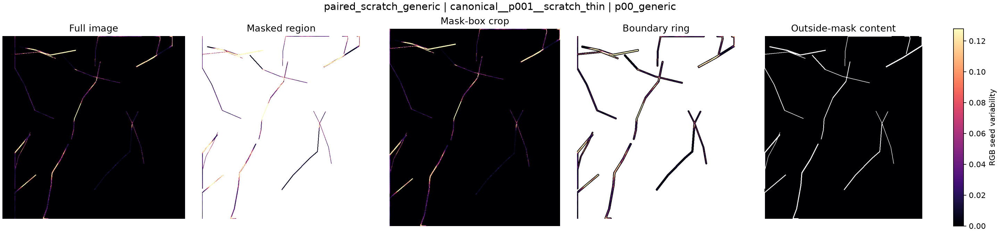

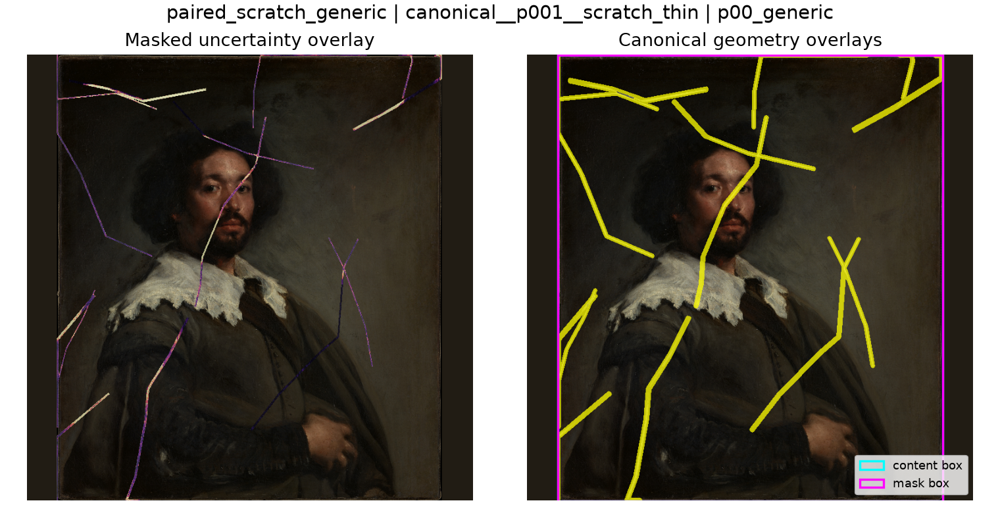

Smoke visual: 2/3 paired_scratch_aware | canonical__p001__scratch_thin | p05_scratch_aware


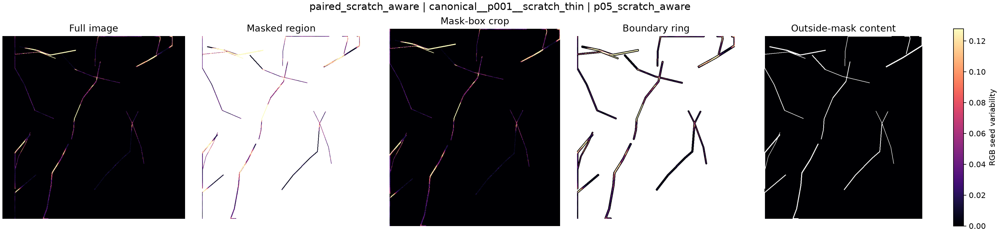

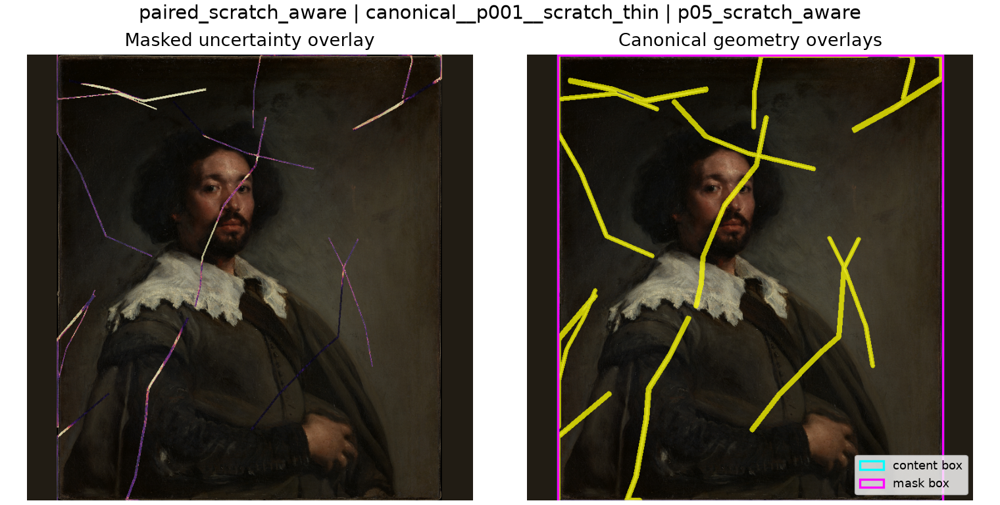

Smoke visual: 3/3 generic_non_scratch | canonical__p031__mixed_damage | p00_generic


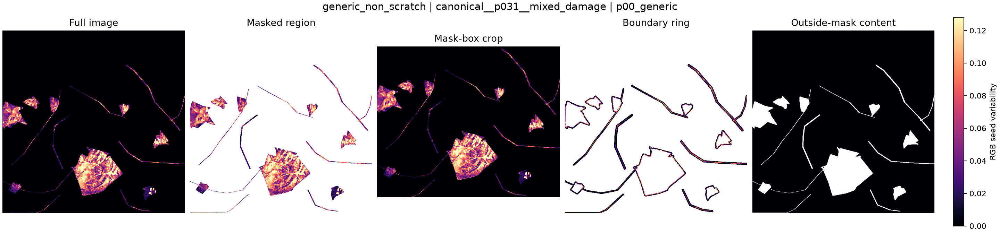

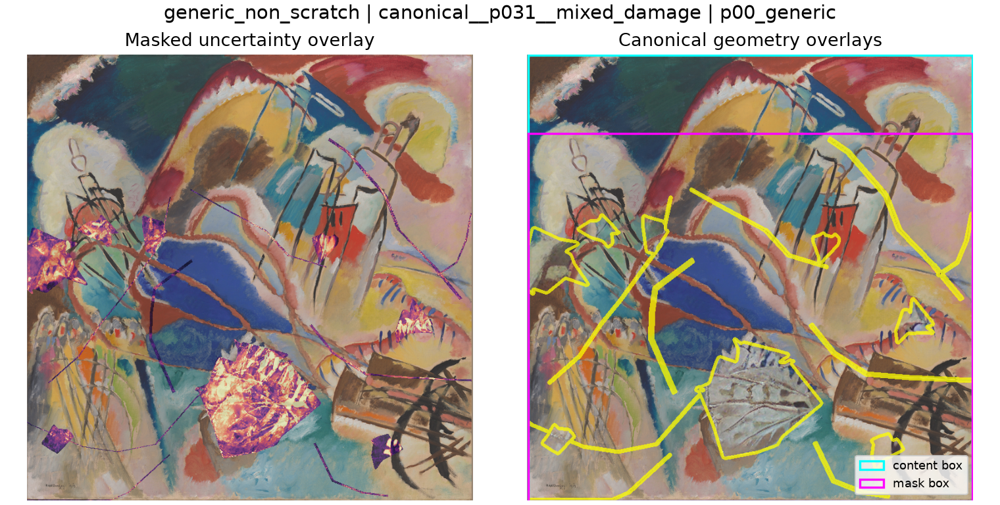

Notebook 19 inline smoke QA complete.
Rendered temporary images: 6
Temporary directory cleaned: True
No smoke image was persisted under the Notebook 19 output root.


In [13]:
from tempfile import TemporaryDirectory

from PIL import Image


# ---------------------------------------------------------------------------
# Exercise both canonical renderers outside the repository
# ---------------------------------------------------------------------------

smoke_render_audit_records = []
SMOKE_INLINE_QA_RENDERED = False

with TemporaryDirectory(
    prefix="notebook_19_smoke_"
) as temporary_directory:
    smoke_temporary_root = Path(
        temporary_directory
    )

    for group_number, uncertainty_group_id in enumerate(
        smoke_group_ids,
        start=1,
    ):
        selection = (
            smoke_selection_df.loc[
                smoke_selection_df[
                    "uncertainty_group_id"
                ].astype(str).eq(
                    uncertainty_group_id
                )
            ]
            .iloc[0]
        )

        representative = (
            representative_candidates_df.loc[
                representative_candidates_df[
                    "uncertainty_group_id"
                ].astype(str).eq(
                    uncertainty_group_id
                )
            ]
            .iloc[0]
        )

        base_rgb = load_rgb_array(
            representative[
                "restored_path"
            ],
            PROJECT_ROOT,
        )

        title = (
            f"{selection['smoke_role']} | "
            f"{selection['case_id']} | "
            f"{selection['prompt_variant_id']}"
        )

        panel_path = (
            smoke_temporary_root
            / f"{uncertainty_group_id}_panel.png"
        )

        overlay_path = (
            smoke_temporary_root
            / f"{uncertainty_group_id}_overlay.png"
        )

        render_uncertainty_panel(
            smoke_maps[
                uncertainty_group_id
            ],
            smoke_regions[
                uncertainty_group_id
            ],
            panel_path,
            title=title,
            vmin=smoke_normalization[
                "vmin"
            ],
            vmax=smoke_normalization[
                "vmax"
            ],
            cmap=NORMALIZATION_POLICY["cmap"],
        )

        render_uncertainty_overlay(
            base_rgb,
            smoke_maps[
                uncertainty_group_id
            ],
            smoke_regions[
                uncertainty_group_id
            ],
            overlay_path,
            title=title,
            vmin=smoke_normalization[
                "vmin"
            ],
            vmax=smoke_normalization[
                "vmax"
            ],
            cmap=NORMALIZATION_POLICY["cmap"],
            alpha_max=NORMALIZATION_POLICY[
                "overlay_alpha_max"
            ],
        )

        print(
            "Smoke visual:",
            f"{group_number}/"
            f"{len(smoke_group_ids)}",
            title,
        )

        for asset_role, path in (
            (
                "uncertainty_panel",
                panel_path,
            ),
            (
                "uncertainty_overlay",
                overlay_path,
            ),
        ):
            with Image.open(path) as image:
                image.load()

                smoke_render_audit_records.append(
                    {
                        "uncertainty_group_id": (
                            uncertainty_group_id
                        ),
                        "smoke_role": (
                            selection["smoke_role"]
                        ),
                        "asset_role": asset_role,
                        "format": image.format,
                        "mode": image.mode,
                        "width": int(image.width),
                        "height": int(image.height),
                        "size_bytes": int(
                            path.stat().st_size
                        ),
                    }
                )

                display(
                    image.convert("RGBA").copy()
                )

    SMOKE_INLINE_QA_RENDERED = True

SMOKE_TEMP_DIRECTORY_CLEANED = (
    not smoke_temporary_root.exists()
)

smoke_render_audit_df = pd.DataFrame(
    smoke_render_audit_records
)

print("Notebook 19 inline smoke QA complete.")
print(
    "Rendered temporary images:",
    len(smoke_render_audit_df),
)
print(
    "Temporary directory cleaned:",
    SMOKE_TEMP_DIRECTORY_CLEANED,
)
print(
    "No smoke image was persisted under the "
    "Notebook 19 output root."
)

In [14]:
# ---------------------------------------------------------------------------
# Batch 3 validation helper
# ---------------------------------------------------------------------------

VALIDATION_STAGE = "batch_3_smoke_test"


def add_batch_3_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=VALIDATION_STAGE,
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


# ---------------------------------------------------------------------------
# Selection and seed coverage
# ---------------------------------------------------------------------------

observed_smoke_roles = sorted(
    smoke_selection_df[
        "smoke_role"
    ].astype(str).tolist()
)

expected_smoke_roles = sorted(
    [
        "paired_scratch_generic",
        "paired_scratch_aware",
        "generic_non_scratch",
    ]
)

add_batch_3_check(
    "smoke_selection_contract",
    "The smoke test contains the three approved evidence roles.",
    {
        "groups": 3,
        "roles": expected_smoke_roles,
    },
    {
        "groups": int(
            smoke_selection_df[
                "uncertainty_group_id"
            ].nunique()
        ),
        "roles": observed_smoke_roles,
    },
    (
        smoke_selection_df[
            "uncertainty_group_id"
        ].nunique()
        == 3
        and observed_smoke_roles
        == expected_smoke_roles
    ),
)

scratch_smoke_rows = (
    smoke_selection_df.loc[
        smoke_selection_df[
            "smoke_role"
        ].astype(str).isin(
            [
                "paired_scratch_generic",
                "paired_scratch_aware",
            ]
        )
    ]
)

scratch_pair_contract = {
    "unique_cases": int(
        scratch_smoke_rows[
            "case_id"
        ].nunique()
    ),
    "unique_paintings": int(
        scratch_smoke_rows[
            "painting_id"
        ].nunique()
    ),
    "prompt_variants": sorted(
        scratch_smoke_rows[
            "prompt_variant_id"
        ].astype(str).unique().tolist()
    ),
    "case_labels": sorted(
        scratch_smoke_rows[
            "case_label"
        ].astype(str).unique().tolist()
    ),
}

add_batch_3_check(
    "paired_scratch_prompt_contract",
    "Generic and scratch-aware smoke groups use the same scratch case.",
    {
        "unique_cases": 1,
        "unique_paintings": 1,
        "prompt_variants": sorted(
            [
                generic_prompt_id,
                scratch_aware_prompt_id,
            ]
        ),
        "case_labels": ["scratch_thin"],
    },
    scratch_pair_contract,
    (
        scratch_pair_contract
        == {
            "unique_cases": 1,
            "unique_paintings": 1,
            "prompt_variants": sorted(
                [
                    generic_prompt_id,
                    scratch_aware_prompt_id,
                ]
            ),
            "case_labels": [
                "scratch_thin"
            ],
        }
    ),
)

non_scratch_smoke_row = (
    smoke_selection_df.loc[
        smoke_selection_df[
            "smoke_role"
        ].astype(str).eq(
            "generic_non_scratch"
        )
    ]
    .iloc[0]
)

non_scratch_contract = {
    "case_label": str(
        non_scratch_smoke_row[
            "case_label"
        ]
    ),
    "prompt_variant_id": str(
        non_scratch_smoke_row[
            "prompt_variant_id"
        ]
    ),
    "different_painting": (
        str(
            non_scratch_smoke_row[
                "painting_id"
            ]
        )
        != smoke_scratch_painting_id
    ),
}

add_batch_3_check(
    "non_scratch_smoke_contract",
    "The third smoke group is generic mixed damage from another painting.",
    {
        "case_label": "mixed_damage",
        "prompt_variant_id": (
            generic_prompt_id
        ),
        "different_painting": True,
    },
    non_scratch_contract,
    (
        non_scratch_contract
        == {
            "case_label": "mixed_damage",
            "prompt_variant_id": (
                generic_prompt_id
            ),
            "different_painting": True,
        }
    ),
)

smoke_seed_coverage = (
    smoke_population_df.groupby(
        "uncertainty_group_id"
    )["seed"]
    .apply(
        lambda values: tuple(
            sorted(
                int(value)
                for value in values
            )
        )
    )
    .to_dict()
)

expected_smoke_seeds = tuple(
    sorted(
        int(value)
        for value in POPULATION_POLICY[
            "expected_seeds"
        ]
    )
)

add_batch_3_check(
    "smoke_candidate_and_seed_coverage",
    "Every smoke group contains all four approved seeds.",
    {
        "candidates": 12,
        "seeds_per_group": (
            expected_smoke_seeds
        ),
    },
    {
        "candidates": len(
            smoke_population_df
        ),
        "seed_coverage": (
            smoke_seed_coverage
        ),
    },
    (
        len(smoke_population_df) == 12
        and all(
            seeds == expected_smoke_seeds
            for seeds
            in smoke_seed_coverage.values()
        )
    ),
)


# ---------------------------------------------------------------------------
# Map and regional-summary integrity
# ---------------------------------------------------------------------------

map_contract_passed = bool(
    len(smoke_map_audit_df) == 3
    and smoke_map_audit_df[
        "dtype"
    ].eq("float32").all()
    and smoke_map_audit_df[
        "all_finite"
    ].astype(bool).all()
    and smoke_map_audit_df[
        "nonnegative"
    ].astype(bool).all()
    and smoke_map_audit_df[
        "region_count"
    ].ge(
        len(REGION_POLICY["region_order"])
    ).all()
)

add_batch_3_check(
    "smoke_map_integrity",
    "Each smoke map is finite, non-negative, two-dimensional float32 evidence.",
    {
        "maps": 3,
        "dtype": "float32",
        "all_finite": True,
        "nonnegative": True,
    },
    {
        "maps": len(
            smoke_map_audit_df
        ),
        "dtypes": sorted(
            smoke_map_audit_df[
                "dtype"
            ].unique().tolist()
        ),
        "all_finite": bool(
            smoke_map_audit_df[
                "all_finite"
            ].astype(bool).all()
        ),
        "nonnegative": bool(
            smoke_map_audit_df[
                "nonnegative"
            ].astype(bool).all()
        ),
    },
    map_contract_passed,
)

smoke_region_sets = (
    smoke_spatial_explanations_df.groupby(
        "uncertainty_group_id"
    )["region_id"]
    .agg(set)
)

expected_region_set = set(
    REGION_POLICY["region_order"]
)

regional_summary_contract = {
    "rows": len(
        smoke_spatial_explanations_df
    ),
    "groups": int(
        smoke_spatial_explanations_df[
            "uncertainty_group_id"
        ].nunique()
    ),
    "complete_region_groups": int(
        smoke_region_sets.map(
            lambda values: (
                values
                == expected_region_set
            )
        ).sum()
    ),
    "schema_passed": (
        smoke_schema_result.passed
    ),
}

add_batch_3_check(
    "smoke_regional_summaries",
    "Every smoke map produces all six schema-valid regional summaries.",
    {
        "rows": 18,
        "groups": 3,
        "complete_region_groups": 3,
        "schema_passed": True,
    },
    regional_summary_contract,
    (
        regional_summary_contract
        == {
            "rows": 18,
            "groups": 3,
            "complete_region_groups": 3,
            "schema_passed": True,
        }
    ),
)

crosscheck_contract = {
    "rows": len(smoke_crosscheck_df),
    "missing_reference_values": int(
        smoke_crosscheck_df[
            [
                "notebook_18_mean_value",
                "notebook_18_p95_value",
            ]
        ]
        .isna()
        .sum()
        .sum()
    ),
    "maximum_mean_difference": float(
        smoke_crosscheck_df[
            "mean_absolute_difference"
        ].max()
    ),
    "maximum_p95_difference": float(
        smoke_crosscheck_df[
            "p95_absolute_difference"
        ].max()
    ),
}

add_batch_3_check(
    "notebook_18_numeric_crosscheck",
    "Smoke regional means and p95 values reproduce Notebook 18.",
    {
        "rows": 18,
        "missing_reference_values": 0,
        "maximum_mean_difference": "<= 0.000001",
        "maximum_p95_difference": "<= 0.000001",
    },
    crosscheck_contract,
    (
        crosscheck_contract["rows"] == 18
        and crosscheck_contract[
            "missing_reference_values"
        ]
        == 0
        and crosscheck_contract[
            "maximum_mean_difference"
        ]
        <= MAP_POLICY[
            "cross_notebook_summary_tolerance"
        ]
        and crosscheck_contract[
            "maximum_p95_difference"
        ]
        <= MAP_POLICY[
            "cross_notebook_summary_tolerance"
        ]
    ),
)

maximum_quantization_error = float(
    smoke_map_audit_df[
        "float16_max_absolute_error"
    ].max()
)

add_batch_3_check(
    "float16_archive_tolerance",
    "The documented float16 archive conversion remains within tolerance.",
    (
        "<= "
        f"{MAP_POLICY['archive_quantization_tolerance']}"
    ),
    maximum_quantization_error,
    (
        maximum_quantization_error
        <= MAP_POLICY[
            "archive_quantization_tolerance"
        ]
    ),
)

smoke_normalization_contract = {
    "policy": smoke_normalization[
        "normalization_policy_id"
    ],
    "vmin": smoke_normalization["vmin"],
    "vmax_finite_positive": bool(
        np.isfinite(
            smoke_normalization["vmax"]
        )
        and smoke_normalization["vmax"] > 0.0
    ),
    "scope": "smoke_test_only_3_groups",
}

add_batch_3_check(
    "smoke_normalization",
    "The smoke-only shared scale is finite and clearly non-canonical.",
    {
        "policy": (
            NORMALIZATION_POLICY[
                "policy_id"
            ]
        ),
        "vmin": 0.0,
        "vmax_finite_positive": True,
        "scope": "smoke_test_only_3_groups",
    },
    smoke_normalization_contract,
    (
        smoke_normalization_contract
        == {
            "policy": (
                NORMALIZATION_POLICY[
                    "policy_id"
                ]
            ),
            "vmin": 0.0,
            "vmax_finite_positive": True,
            "scope": (
                "smoke_test_only_3_groups"
            ),
        }
    ),
)


# ---------------------------------------------------------------------------
# Renderer and non-persistence checks
# ---------------------------------------------------------------------------

render_contract = {
    "rendered_images": len(
        smoke_render_audit_df
    ),
    "formats": sorted(
        smoke_render_audit_df[
            "format"
        ].astype(str).unique().tolist()
    ),
    "minimum_width": int(
        smoke_render_audit_df[
            "width"
        ].min()
    ),
    "minimum_height": int(
        smoke_render_audit_df[
            "height"
        ].min()
    ),
    "positive_file_sizes": bool(
        smoke_render_audit_df[
            "size_bytes"
        ].gt(0).all()
    ),
    "inline_qa_rendered": (
        SMOKE_INLINE_QA_RENDERED
    ),
}

add_batch_3_check(
    "smoke_renderers",
    "Both renderers produce valid inline PNG evidence for all three groups.",
    {
        "rendered_images": 6,
        "formats": ["PNG"],
        "minimum_width": "> 500",
        "minimum_height": "> 300",
        "positive_file_sizes": True,
        "inline_qa_rendered": True,
    },
    render_contract,
    (
        render_contract[
            "rendered_images"
        ]
        == 6
        and render_contract["formats"]
        == ["PNG"]
        and render_contract[
            "minimum_width"
        ]
        > 500
        and render_contract[
            "minimum_height"
        ]
        > 300
        and render_contract[
            "positive_file_sizes"
        ]
        and render_contract[
            "inline_qa_rendered"
        ]
    ),
)

add_batch_3_check(
    "temporary_render_cleanup",
    "The system-temporary smoke directory is removed after rendering.",
    True,
    SMOKE_TEMP_DIRECTORY_CLEANED,
    SMOKE_TEMP_DIRECTORY_CLEANED,
)

canonical_files_after_batch_3 = sorted(
    to_repo_relative(path, PROJECT_ROOT)
    for path in NOTEBOOK_OUTPUT_ROOT.rglob("*")
    if path.is_file()
)

add_batch_3_check(
    "no_canonical_smoke_outputs",
    "Batch 3 does not persist canonical Notebook 19 artifacts.",
    [],
    canonical_files_after_batch_3,
    not canonical_files_after_batch_3,
)

print("Notebook 19 Batch 3 checks assembled.")
print(
    "Batch 3 checks added:",
    int(
        VALIDATION.to_dataframe()[
            "validation_stage"
        ].eq(VALIDATION_STAGE).sum()
    ),
)

Notebook 19 Batch 3 checks assembled.
Batch 3 checks added: 12


In [15]:
# ---------------------------------------------------------------------------
# Batch 3 review tables and gate
# ---------------------------------------------------------------------------

all_validation_df = VALIDATION.to_dataframe()

batch_3_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq(VALIDATION_STAGE)
    ]
    .reset_index(drop=True)
)

display(
    smoke_selection_df[
        [
            "smoke_role",
            "uncertainty_group_id",
            "case_id",
            "painting_id",
            "category",
            "case_label",
            "prompt_variant_id",
            "seeds",
        ]
    ]
)

display(smoke_map_audit_df)

display(
    smoke_crosscheck_df[
        [
            "smoke_role",
            "uncertainty_group_id",
            "region_id",
            "mean_value",
            "notebook_18_mean_value",
            "mean_absolute_difference",
            "p95_value",
            "notebook_18_p95_value",
            "p95_absolute_difference",
        ]
    ]
)

display(smoke_render_audit_df)
display(batch_3_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 19 Batch 3 summary")
print("---------------------------")
print(
    "Batch 3 validation checks:",
    len(batch_3_validation_df),
)
print(
    "Blocking failures across Batches 1–3:",
    len(VALIDATION.blocking_failures),
)
print(
    "Smoke groups:",
    len(smoke_group_ids),
)
print(
    "Smoke candidates:",
    len(smoke_population_df),
)
print(
    "Smoke regional rows:",
    len(smoke_spatial_explanations_df),
)
print(
    "Smoke render outputs displayed:",
    len(smoke_render_audit_df),
)
print(
    "Maximum Notebook 18 cross-check difference:",
    max(
        float(
            smoke_crosscheck_df[
                "mean_absolute_difference"
            ].max()
        ),
        float(
            smoke_crosscheck_df[
                "p95_absolute_difference"
            ].max()
        ),
    ),
)
print(
    "Maximum float16 round-trip error:",
    maximum_quantization_error,
)
print(
    "Temporary render directory cleaned:",
    SMOKE_TEMP_DIRECTORY_CLEANED,
)
print(
    "No canonical Notebook 19 files were persisted in Batch 3."
)
print(
    "Batch 3 passed: generic scratch, scratch-aware "
    "scratch, and non-scratch maps reproduce Notebook 18, "
    "satisfy the regional and archive contracts, render "
    "successfully, and leave no persistent smoke artifacts."
)

,smoke_role,uncertainty_group_id,case_id,painting_id,category,case_label,prompt_variant_id,seeds
0,paired_scratch_generic,ug_bd6fc0b06f58acc4f1,canonical__p001__scratch_thin,p001,portrait_figure,scratch_thin,p00_generic,2026|2027|2028|2029
1,paired_scratch_aware,ug_7863cdf715d7fc4981,canonical__p001__scratch_thin,p001,portrait_figure,scratch_thin,p05_scratch_aware,2026|2027|2028|2029
2,generic_non_scratch,ug_8433e2d8c521da9794,canonical__p031__mixed_damage,p031,abstraction_surrealism,mixed_damage,p00_generic,2026|2027|2028|2029


,uncertainty_group_id,smoke_role,height,width,dtype,minimum,maximum,mean,all_finite,nonnegative,region_count,float16_max_absolute_error
0,ug_bd6fc0b06f58acc4f1,paired_scratch_generic,768,768,float32,0.0,0.278899,0.001150,True,True,6,0.000107
1,ug_7863cdf715d7fc4981,paired_scratch_aware,768,768,float32,0.0,0.280334,0.001126,True,True,6,0.000116
2,ug_8433e2d8c521da9794,generic_non_scratch,768,768,float32,0.0,0.257707,0.006722,True,True,6,0.000105


,smoke_role,uncertainty_group_id,region_id,mean_value,notebook_18_mean_value,mean_absolute_difference,p95_value,notebook_18_p95_value,p95_absolute_difference
0,paired_scratch_generic,ug_bd6fc0b06f58acc4f1,full_image,0.001150,0.001150,8.896005e-11,0.000000,0.000000,0.000000e+00
1,paired_scratch_generic,ug_bd6fc0b06f58acc4f1,content_region,0.001332,0.001332,3.759776e-11,0.000000,0.000000,0.000000e+00
2,paired_scratch_generic,ug_bd6fc0b06f58acc4f1,masked_region,0.061328,0.061328,5.086638e-09,0.179442,0.179442,2.775558e-17
3,paired_scratch_generic,ug_bd6fc0b06f58acc4f1,mask_bbox_crop,0.001332,0.001332,3.759776e-11,0.000000,0.000000,0.000000e+00
4,paired_scratch_generic,ug_bd6fc0b06f58acc4f1,boundary_ring,0.022364,0.022364,1.757993e-09,0.137331,0.137331,2.775558e-17
5,paired_scratch_generic,ug_bd6fc0b06f58acc4f1,outside_mask_content,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00
6,paired_scratch_aware,ug_7863cdf715d7fc4981,full_image,0.001126,0.001126,7.746505e-11,0.000000,0.000000,0.000000e+00
7,paired_scratch_aware,ug_7863cdf715d7fc4981,content_region,0.001304,0.001304,3.274655e-10,0.000000,0.000000,0.000000e+00
8,paired_scratch_aware,ug_7863cdf715d7fc4981,masked_region,0.060038,0.060038,2.334276e-09,0.182178,0.182178,5.551115e-17
9,paired_scratch_aware,ug_7863cdf715d7fc4981,mask_bbox_crop,0.001304,0.001304,3.274655e-10,0.000000,0.000000,0.000000e+00


,uncertainty_group_id,smoke_role,asset_role,format,mode,width,height,size_bytes
0,ug_bd6fc0b06f58acc4f1,paired_scratch_generic,uncertainty_panel,PNG,RGBA,2880,672,224023
1,ug_bd6fc0b06f58acc4f1,paired_scratch_generic,uncertainty_overlay,PNG,RGBA,1520,768,1164442
2,ug_7863cdf715d7fc4981,paired_scratch_aware,uncertainty_panel,PNG,RGBA,2880,672,225722
3,ug_7863cdf715d7fc4981,paired_scratch_aware,uncertainty_overlay,PNG,RGBA,1520,768,1168006
4,ug_8433e2d8c521da9794,generic_non_scratch,uncertainty_panel,PNG,RGBA,2880,672,423143
5,ug_8433e2d8c521da9794,generic_non_scratch,uncertainty_overlay,PNG,RGBA,1520,768,1704245


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_3_smoke_test,smoke_selection_contract,The smoke test contains the three approved evi...,blocking,"{""groups"": 3, ""roles"": [""generic_non_scratch"",...","{""groups"": 3, ""roles"": [""generic_non_scratch"",...",True,
1,batch_3_smoke_test,paired_scratch_prompt_contract,Generic and scratch-aware smoke groups use the...,blocking,"{""case_labels"": [""scratch_thin""], ""prompt_vari...","{""case_labels"": [""scratch_thin""], ""prompt_vari...",True,
2,batch_3_smoke_test,non_scratch_smoke_contract,The third smoke group is generic mixed damage ...,blocking,"{""case_label"": ""mixed_damage"", ""different_pain...","{""case_label"": ""mixed_damage"", ""different_pain...",True,
3,batch_3_smoke_test,smoke_candidate_and_seed_coverage,Every smoke group contains all four approved s...,blocking,"{""candidates"": 12, ""seeds_per_group"": [2026, 2...","{""candidates"": 12, ""seed_coverage"": {""ug_7863c...",True,
4,batch_3_smoke_test,smoke_map_integrity,"Each smoke map is finite, non-negative, two-di...",blocking,"{""all_finite"": true, ""dtype"": ""float32"", ""maps...","{""all_finite"": true, ""dtypes"": [""float32""], ""m...",True,
5,batch_3_smoke_test,smoke_regional_summaries,Every smoke map produces all six schema-valid ...,blocking,"{""complete_region_groups"": 3, ""groups"": 3, ""ro...","{""complete_region_groups"": 3, ""groups"": 3, ""ro...",True,
6,batch_3_smoke_test,notebook_18_numeric_crosscheck,Smoke regional means and p95 values reproduce ...,blocking,"{""maximum_mean_difference"": ""<= 0.000001"", ""ma...","{""maximum_mean_difference"": 5.086637909490488e...",True,
7,batch_3_smoke_test,float16_archive_tolerance,The documented float16 archive conversion rema...,blocking,<= 0.0005,0.00011625885963439941,True,
8,batch_3_smoke_test,smoke_normalization,The smoke-only shared scale is finite and clea...,blocking,"{""policy"": ""global_content_p99_5.v1"", ""scope"":...","{""policy"": ""global_content_p99_5.v1"", ""scope"":...",True,
9,batch_3_smoke_test,smoke_renderers,Both renderers produce valid inline PNG eviden...,blocking,"{""formats"": [""PNG""], ""inline_qa_rendered"": tru...","{""formats"": [""PNG""], ""inline_qa_rendered"": tru...",True,


Notebook 19 Batch 3 summary
---------------------------
Batch 3 validation checks: 12
Blocking failures across Batches 1–3: 0
Smoke groups: 3
Smoke candidates: 12
Smoke regional rows: 18
Smoke render outputs displayed: 6
Maximum Notebook 18 cross-check difference: 5.086637909490488e-09
Maximum float16 round-trip error: 0.00011625885963439941
Temporary render directory cleaned: True
No canonical Notebook 19 files were persisted in Batch 3.
Batch 3 passed: generic scratch, scratch-aware scratch, and non-scratch maps reproduce Notebook 18, satisfy the regional and archive contracts, render successfully, and leave no persistent smoke artifacts.


## Batch 4 — Full image-space uncertainty computation

This batch computes the complete 130-group per-pixel spatial-uncertainty population.

For every prompt-specific group, it:

- loads the four approved seeds;
- computes the mean RGB-channel population-standard-deviation map in float32;
- builds the six canonical evaluation regions;
- stores a resumable float32 work map under the notebook-owned `work/` directory;
- records a population/configuration fingerprint and map checksum;
- reports progress and checkpoints every ten groups;
- computes one global p99.5 content-region normalization across all 130 maps;
- constructs all 780 canonical regional evidence rows in memory;
- reproduces Notebook 18's regional mean and p95 values within tolerance.

Notebook 18's pairwise RGB evidence is not recomputed because it is already canonical and validated upstream. Batch 4 writes resumable temporary state only; the canonical numeric archive and metric table are persisted in the next batch.

In [16]:
import hashlib

from restoration_eval.diffusion_uncertainty import (
    build_uncertainty_regions,
    load_mask_array,
)

from restoration_eval.spatial_explanations import (
    load_group_work_map,
    validate_spatial_explanations,
    write_dataframe_atomic,
    write_group_work_map,
)


# ---------------------------------------------------------------------------
# Versioned work-map checkpoint contract
# ---------------------------------------------------------------------------

MAP_CHECKPOINT_COLUMNS = [
    "uncertainty_group_id",
    "population_fingerprint",
    "seeds",
    "height",
    "width",
    "work_map_relative_path",
    "work_map_sha256",
    "completed_at_utc",
    "status",
    "issue",
]

WORK_PATHS[
    "raw_map_work_root"
].mkdir(
    parents=True,
    exist_ok=True,
)


# ---------------------------------------------------------------------------
# Canonical output-geometry lookup
# ---------------------------------------------------------------------------

execution_geometry_df = (
    preprocessing_geometry_df[
        [
            "painting_id",
            "height",
            "width",
            "sha256",
            "processed_path",
        ]
    ]
    .copy()
)

if execution_geometry_df[
    "painting_id"
].astype(str).duplicated().any():
    raise ValueError(
        "Preprocessing geometry contains duplicate "
        "painting identifiers."
    )

for column in ("height", "width"):
    execution_geometry_df[column] = (
        pd.to_numeric(
            execution_geometry_df[column],
            errors="raise",
        )
        .astype(int)
    )

execution_geometry_lookup = {
    str(record["painting_id"]): record
    for record in execution_geometry_df.to_dict(
        orient="records"
    )
}

mask_checksum_cache = {}


# ---------------------------------------------------------------------------
# One fingerprinted execution-plan row per group
# ---------------------------------------------------------------------------

execution_plan_records = []

for uncertainty_group_id, group_df in (
    spatial_population_df.groupby(
        "uncertainty_group_id",
        sort=True,
    )
):
    ordered_group_df = (
        group_df.sort_values(
            [
                "seed",
                "candidate_id",
            ],
            kind="stable",
        )
        .reset_index(drop=True)
    )

    representative = (
        ordered_group_df.iloc[0]
    )

    painting_id = str(
        representative["painting_id"]
    )

    if (
        painting_id
        not in execution_geometry_lookup
    ):
        raise ValueError(
            "No canonical preprocessing geometry exists "
            f"for {painting_id}."
        )

    geometry_record = (
        execution_geometry_lookup[
            painting_id
        ]
    )

    output_height = int(
        geometry_record["height"]
    )

    output_width = int(
        geometry_record["width"]
    )

    content_bbox = {
        coordinate: sorted(
            pd.to_numeric(
                ordered_group_df[
                    coordinate
                ],
                errors="raise",
            )
            .astype(int)
            .unique()
            .tolist()
        )
        for coordinate in (
            "content_x_min",
            "content_y_min",
            "content_x_max",
            "content_y_max",
        )
    }

    if any(
        len(values) != 1
        for values
        in content_bbox.values()
    ):
        raise ValueError(
            "Content geometry differs within "
            f"{uncertainty_group_id}."
        )

    observed_content_bbox = (
        int(
            content_bbox[
                "content_x_min"
            ][0]
        ),
        int(
            content_bbox[
                "content_y_min"
            ][0]
        ),
        int(
            content_bbox[
                "content_x_max"
            ][0]
        ),
        int(
            content_bbox[
                "content_y_max"
            ][0]
        ),
    )

    if not (
        0
        <= observed_content_bbox[0]
        < observed_content_bbox[2]
        <= output_width
        and 0
        <= observed_content_bbox[1]
        < observed_content_bbox[3]
        <= output_height
    ):
        raise ValueError(
            "Content geometry falls outside the "
            f"canonical canvas for {uncertainty_group_id}: "
            f"{observed_content_bbox} versus "
            f"{output_width}x{output_height}."
        )

    seeds = tuple(
        ordered_group_df[
            "seed"
        ].astype(int).tolist()
    )

    mask_paths = sorted(
        ordered_group_df[
            "mask_or_effect_path"
        ].astype(str).unique().tolist()
    )

    if len(mask_paths) != 1:
        raise ValueError(
            "Mask paths differ within "
            f"{uncertainty_group_id}."
        )

    mask_relative_path = str(
        mask_paths[0]
    )

    if (
        mask_relative_path
        not in mask_checksum_cache
    ):
        mask_path = resolve_repo_path(
            mask_relative_path,
            PROJECT_ROOT,
            must_exist=True,
        )

        mask_checksum_cache[
            mask_relative_path
        ] = sha256_file(mask_path)

    mask_sha256 = (
        mask_checksum_cache[
            mask_relative_path
        ]
    )

    fingerprint_payload = {
        "uncertainty_group_id": str(
            uncertainty_group_id
        ),
        "candidate_ids": (
            ordered_group_df[
                "candidate_id"
            ].astype(str).tolist()
        ),
        "seeds": list(seeds),
        "restored_sha256": (
            ordered_group_df[
                "restored_sha256"
            ].astype(str).tolist()
        ),
        "mask_path": mask_relative_path,
        "mask_sha256": mask_sha256,
        "mask_thresholds": sorted(
            pd.to_numeric(
                ordered_group_df[
                    "mask_threshold"
                ],
                errors="raise",
            )
            .astype(float)
            .unique()
            .tolist()
        ),
        "output_geometry": {
            "height": output_height,
            "width": output_width,
            "processed_sha256": str(
                geometry_record["sha256"]
            ),
            "processed_path": str(
                geometry_record[
                    "processed_path"
                ]
            ),
            "content_bbox": (
                observed_content_bbox
            ),
        },
        "map_definition": {
            "metric_name": (
                MAP_POLICY["metric_name"]
            ),
            "formula": MAP_POLICY["formula"],
            "input_data_range": (
                MAP_POLICY[
                    "input_data_range"
                ]
            ),
            "compute_dtype": (
                MAP_POLICY["compute_dtype"]
            ),
        },
        "region_definition": {
            "policy_version": (
                REGION_POLICY[
                    "policy_version"
                ]
            ),
            "mask_bbox_margin_pixels": (
                REGION_POLICY[
                    "mask_bbox_margin_pixels"
                ]
            ),
            "boundary_width_pixels": (
                REGION_POLICY[
                    "boundary_width_pixels"
                ]
            ),
            "region_order": list(
                REGION_POLICY["region_order"]
            ),
        },
    }

    population_fingerprint = (
        hashlib.sha256(
            json.dumps(
                fingerprint_payload,
                sort_keys=True,
                separators=(",", ":"),
            ).encode("utf-8")
        )
        .hexdigest()
    )

    work_map_path = (
        WORK_PATHS[
            "raw_map_work_root"
        ]
        / f"{uncertainty_group_id}.npz"
    )

    execution_plan_records.append(
        {
            "uncertainty_group_id": str(
                uncertainty_group_id
            ),
            "case_id": str(
                representative["case_id"]
            ),
            "painting_id": painting_id,
            "category": str(
                representative["category"]
            ),
            "case_label": str(
                representative["case_label"]
            ),
            "prompt_variant_id": str(
                representative[
                    "prompt_variant_id"
                ]
            ),
            "population_fingerprint": (
                population_fingerprint
            ),
            "seeds": "|".join(
                str(seed)
                for seed in seeds
            ),
            "candidate_count": len(
                ordered_group_df
            ),
            "height": output_height,
            "width": output_width,
            "work_map_relative_path": (
                to_repo_relative(
                    work_map_path,
                    PROJECT_ROOT,
                )
            ),
        }
    )

map_execution_plan_df = (
    pd.DataFrame(
        execution_plan_records
    )
    .sort_values(
        "uncertainty_group_id",
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Load and strictly validate any resumable checkpoint
# ---------------------------------------------------------------------------

if WORK_PATHS["map_checkpoint"].is_file():
    existing_map_checkpoint_df = (
        pd.read_csv(
            WORK_PATHS["map_checkpoint"],
            low_memory=False,
        )
    )

    missing_checkpoint_columns = sorted(
        set(MAP_CHECKPOINT_COLUMNS)
        - set(
            existing_map_checkpoint_df.columns
        )
    )

    if missing_checkpoint_columns:
        raise ValueError(
            "Map checkpoint is missing columns: "
            f"{missing_checkpoint_columns}"
        )

    if existing_map_checkpoint_df[
        "uncertainty_group_id"
    ].astype(str).duplicated().any():
        raise ValueError(
            "Map checkpoint contains duplicate "
            "uncertainty groups."
        )
else:
    existing_map_checkpoint_df = (
        pd.DataFrame(
            columns=MAP_CHECKPOINT_COLUMNS
        )
    )

existing_checkpoint_lookup = {
    str(record["uncertainty_group_id"]): (
        record
    )
    for record in (
        existing_map_checkpoint_df[
            MAP_CHECKPOINT_COLUMNS
        ].to_dict(orient="records")
    )
}

resumed_map_cache = {}
resumed_checkpoint_records = {}
resume_audit_records = []

expected_seeds = tuple(
    sorted(
        int(seed)
        for seed in POPULATION_POLICY[
            "expected_seeds"
        ]
    )
)

for plan in map_execution_plan_df.itertuples(
    index=False
):
    uncertainty_group_id = str(
        plan.uncertainty_group_id
    )

    checkpoint_record = (
        existing_checkpoint_lookup.get(
            uncertainty_group_id
        )
    )

    resume_valid = False
    resume_issue = "checkpoint row absent"

    if checkpoint_record is not None:
        resume_issues = []

        if (
            str(
                checkpoint_record["status"]
            )
            != "completed"
        ):
            resume_issues.append(
                "status is not completed"
            )

        if (
            str(
                checkpoint_record[
                    "population_fingerprint"
                ]
            )
            != str(
                plan.population_fingerprint
            )
        ):
            resume_issues.append(
                "population fingerprint differs"
            )

        if (
            str(
                checkpoint_record["seeds"]
            )
            != str(plan.seeds)
        ):
            resume_issues.append(
                "seed coverage differs"
            )

        if (
            str(
                checkpoint_record[
                    "work_map_relative_path"
                ]
            )
            != str(
                plan.work_map_relative_path
            )
        ):
            resume_issues.append(
                "work-map path differs"
            )

        work_map_path = resolve_repo_path(
            plan.work_map_relative_path,
            PROJECT_ROOT,
            must_exist=False,
        )

        if not work_map_path.is_file():
            resume_issues.append(
                "work-map file is missing"
            )

        if not resume_issues:
            declared_sha256 = str(
                checkpoint_record[
                    "work_map_sha256"
                ]
            ).strip().lower()

            observed_sha256 = sha256_file(
                work_map_path
            )

            if (
                len(declared_sha256) != 64
                or observed_sha256.lower()
                != declared_sha256
            ):
                resume_issues.append(
                    "work-map checksum differs"
                )

        if not resume_issues:
            try:
                loaded_map = (
                    load_group_work_map(
                        work_map_path,
                        expected_group_id=(
                            uncertainty_group_id
                        ),
                        expected_seeds=(
                            expected_seeds
                        ),
                    )
                )

                if loaded_map.shape != (
                    int(plan.height),
                    int(plan.width),
                ):
                    resume_issues.append(
                        "work-map geometry differs"
                    )
                else:
                    resumed_map_cache[
                        uncertainty_group_id
                    ] = loaded_map

                    resumed_checkpoint_records[
                        uncertainty_group_id
                    ] = {
                        column: (
                            checkpoint_record[
                                column
                            ]
                        )
                        for column in (
                            MAP_CHECKPOINT_COLUMNS
                        )
                    }

            except Exception as error:
                resume_issues.append(
                    f"{type(error).__name__}: "
                    f"{error}"
                )

        resume_valid = not resume_issues
        resume_issue = "; ".join(
            resume_issues
        )

    resume_audit_records.append(
        {
            "uncertainty_group_id": (
                uncertainty_group_id
            ),
            "checkpoint_row_present": (
                checkpoint_record is not None
            ),
            "resume_valid": resume_valid,
            "resume_issue": resume_issue,
        }
    )

resume_audit_df = pd.DataFrame(
    resume_audit_records
)

print("Notebook 19 full execution plan assembled.")
print(
    "Planned groups:",
    len(map_execution_plan_df),
)
print(
    "Unique population fingerprints:",
    map_execution_plan_df[
        "population_fingerprint"
    ].nunique(),
)
print(
    "Unique mask files hashed:",
    len(mask_checksum_cache),
)
print(
    "Existing checkpoint rows:",
    len(existing_map_checkpoint_df),
)
print(
    "Strictly resumable groups:",
    len(resumed_map_cache),
)
print(
    "Groups requiring computation:",
    (
        len(map_execution_plan_df)
        - len(resumed_map_cache)
    ),
)

Notebook 19 full execution plan assembled.
Planned groups: 130
Unique population fingerprints: 130
Unique mask files hashed: 80
Existing checkpoint rows: 0
Strictly resumable groups: 0
Groups requiring computation: 130


In [17]:
# ---------------------------------------------------------------------------
# Full map computation or strict resume
# ---------------------------------------------------------------------------

full_execution_started_at_utc = (
    utc_now_iso()
)

full_uncertainty_maps = {}
full_uncertainty_regions = {}

computed_group_ids = []
resumed_group_ids = []

checkpoint_records_by_group = dict(
    resumed_checkpoint_records
)

checkpoint_interval = int(
    EXECUTION_POLICY[
        "checkpoint_interval_groups"
    ]
)

progress_interval = int(
    EXECUTION_POLICY[
        "progress_interval_groups"
    ]
)

diffusion_compatible_region_config = {
    "diffusion_uncertainty": {
        "regions": {
            "mask_bbox_margin_pixels": (
                REGION_POLICY[
                    "mask_bbox_margin_pixels"
                ]
            ),
            "boundary_width_pixels": (
                REGION_POLICY[
                    "boundary_width_pixels"
                ]
            ),
            "pixel_regions": list(
                REGION_POLICY["region_order"]
            ),
        },
    },
}

for group_number, plan in enumerate(
    map_execution_plan_df.itertuples(
        index=False
    ),
    start=1,
):
    uncertainty_group_id = str(
        plan.uncertainty_group_id
    )

    group_df = (
        spatial_population_df.loc[
            spatial_population_df[
                "uncertainty_group_id"
            ].astype(str).eq(
                uncertainty_group_id
            )
        ]
        .copy()
        .sort_values(
            [
                "seed",
                "candidate_id",
            ],
            kind="stable",
        )
        .reset_index(drop=True)
    )

    if uncertainty_group_id in resumed_map_cache:
        uncertainty_map = (
            resumed_map_cache[
                uncertainty_group_id
            ]
        )

        representative = group_df.iloc[0]

        raw_mask = load_mask_array(
            representative[
                "mask_or_effect_path"
            ],
            PROJECT_ROOT,
        )

        uncertainty_regions = (
            build_uncertainty_regions(
                representative,
                raw_mask,
                config=(
                    diffusion_compatible_region_config
                ),
            )
        )

        resumed_group_ids.append(
            uncertainty_group_id
        )

    else:
        (
            uncertainty_map,
            uncertainty_regions,
        ) = compute_group_uncertainty_map(
            group_df,
            project_root=PROJECT_ROOT,
            config=SPATIAL_CONFIG_DOCUMENT,
        )

        work_map_path = resolve_repo_path(
            plan.work_map_relative_path,
            PROJECT_ROOT,
            must_exist=False,
        )

        write_group_work_map(
            work_map_path,
            uncertainty_group_id,
            expected_seeds,
            uncertainty_map,
            attempts=EXECUTION_POLICY[
                "atomic_replace_attempts"
            ],
            retry_delay_seconds=(
                EXECUTION_POLICY[
                    "atomic_replace_retry_seconds"
                ]
            ),
        )

        work_map_sha256 = sha256_file(
            work_map_path
        )

        checkpoint_records_by_group[
            uncertainty_group_id
        ] = {
            "uncertainty_group_id": (
                uncertainty_group_id
            ),
            "population_fingerprint": str(
                plan.population_fingerprint
            ),
            "seeds": str(plan.seeds),
            "height": int(
                uncertainty_map.shape[0]
            ),
            "width": int(
                uncertainty_map.shape[1]
            ),
            "work_map_relative_path": str(
                plan.work_map_relative_path
            ),
            "work_map_sha256": (
                work_map_sha256
            ),
            "completed_at_utc": (
                utc_now_iso()
            ),
            "status": "completed",
            "issue": "",
        }

        computed_group_ids.append(
            uncertainty_group_id
        )

    full_uncertainty_maps[
        uncertainty_group_id
    ] = np.asarray(
        uncertainty_map,
        dtype=np.float32,
    )

    full_uncertainty_regions[
        uncertainty_group_id
    ] = uncertainty_regions

    if (
        group_number % checkpoint_interval
        == 0
        or group_number
        == len(map_execution_plan_df)
    ):
        checkpoint_frame = (
            pd.DataFrame(
                list(
                    checkpoint_records_by_group.values()
                ),
                columns=MAP_CHECKPOINT_COLUMNS,
            )
            .sort_values(
                "uncertainty_group_id",
                kind="stable",
            )
            .reset_index(drop=True)
        )

        write_dataframe_atomic(
            checkpoint_frame,
            WORK_PATHS["map_checkpoint"],
            attempts=EXECUTION_POLICY[
                "atomic_replace_attempts"
            ],
            retry_delay_seconds=(
                EXECUTION_POLICY[
                    "atomic_replace_retry_seconds"
                ]
            ),
        )

    if (
        group_number % progress_interval == 0
        or group_number
        == len(map_execution_plan_df)
    ):
        print(
            "Full uncertainty execution:",
            f"{group_number}/"
            f"{len(map_execution_plan_df)}",
            "computed:",
            len(computed_group_ids),
            "resumed:",
            len(resumed_group_ids),
            "latest:",
            uncertainty_group_id,
        )

full_execution_completed_at_utc = (
    utc_now_iso()
)

map_checkpoint_df = (
    pd.read_csv(
        WORK_PATHS["map_checkpoint"],
        low_memory=False,
    )
    .sort_values(
        "uncertainty_group_id",
        kind="stable",
    )
    .reset_index(drop=True)
)

print("Notebook 19 full map execution complete.")
print(
    "Maps available in memory:",
    len(full_uncertainty_maps),
)
print(
    "Groups computed:",
    len(computed_group_ids),
)
print(
    "Groups resumed:",
    len(resumed_group_ids),
)
print(
    "Checkpoint rows:",
    len(map_checkpoint_df),
)
print(
    "Execution started:",
    full_execution_started_at_utc,
)
print(
    "Execution completed:",
    full_execution_completed_at_utc,
)

Full uncertainty execution: 10/130 computed: 10 resumed: 0 latest: ug_10182275b8ba22a909
Full uncertainty execution: 20/130 computed: 20 resumed: 0 latest: ug_1b5764d6207674fea5
Full uncertainty execution: 30/130 computed: 30 resumed: 0 latest: ug_3523dbcb9f330eec3f
Full uncertainty execution: 40/130 computed: 40 resumed: 0 latest: ug_46eccc35c9131bf9e7
Full uncertainty execution: 50/130 computed: 50 resumed: 0 latest: ug_5cbb88ab9e7d4414ca
Full uncertainty execution: 60/130 computed: 60 resumed: 0 latest: ug_75b99a0212e0cd9c81
Full uncertainty execution: 70/130 computed: 70 resumed: 0 latest: ug_87b2a541fba26caa8f
Full uncertainty execution: 80/130 computed: 80 resumed: 0 latest: ug_95abbbf9946968f5ac
Full uncertainty execution: 90/130 computed: 90 resumed: 0 latest: ug_ad8b84bd7a8f48e613
Full uncertainty execution: 100/130 computed: 100 resumed: 0 latest: ug_c6894b382081714b0c
Full uncertainty execution: 110/130 computed: 110 resumed: 0 latest: ug_d78bf5433741367943
Full uncertainty 

In [18]:
# ---------------------------------------------------------------------------
# Validate every work map against its checkpoint
# ---------------------------------------------------------------------------

checkpoint_lookup = {
    str(record["uncertainty_group_id"]): (
        record
    )
    for record in map_checkpoint_df.to_dict(
        orient="records"
    )
}

raw_map_audit_records = []

for group_number, plan in enumerate(
    map_execution_plan_df.itertuples(
        index=False
    ),
    start=1,
):
    uncertainty_group_id = str(
        plan.uncertainty_group_id
    )

    checkpoint_record = checkpoint_lookup[
        uncertainty_group_id
    ]

    work_map_path = resolve_repo_path(
        plan.work_map_relative_path,
        PROJECT_ROOT,
        must_exist=False,
    )

    exists = work_map_path.is_file()

    observed_sha256 = (
        sha256_file(work_map_path)
        if exists
        else ""
    )

    declared_sha256 = str(
        checkpoint_record[
            "work_map_sha256"
        ]
    ).strip().lower()

    checksum_matches = bool(
        exists
        and len(declared_sha256) == 64
        and observed_sha256.lower()
        == declared_sha256
    )

    loaded_map = (
        load_group_work_map(
            work_map_path,
            expected_group_id=(
                uncertainty_group_id
            ),
            expected_seeds=expected_seeds,
        )
        if exists
        else np.empty(
            (0, 0),
            dtype=np.float32,
        )
    )

    in_memory_map = (
        full_uncertainty_maps[
            uncertainty_group_id
        ]
    )

    raw_map_audit_records.append(
        {
            "uncertainty_group_id": (
                uncertainty_group_id
            ),
            "relative_path": str(
                plan.work_map_relative_path
            ),
            "exists": exists,
            "checksum_matches": (
                checksum_matches
            ),
            "height": (
                int(loaded_map.shape[0])
                if loaded_map.ndim == 2
                else 0
            ),
            "width": (
                int(loaded_map.shape[1])
                if loaded_map.ndim == 2
                else 0
            ),
            "dtype": str(
                loaded_map.dtype
            ),
            "all_finite": bool(
                loaded_map.size > 0
                and np.isfinite(
                    loaded_map
                ).all()
            ),
            "matches_in_memory": bool(
                loaded_map.shape
                == in_memory_map.shape
                and np.array_equal(
                    loaded_map,
                    in_memory_map,
                )
            ),
        }
    )

    if (
        group_number % progress_interval == 0
        or group_number
        == len(map_execution_plan_df)
    ):
        print(
            "Raw-map verification:",
            f"{group_number}/"
            f"{len(map_execution_plan_df)}",
            "latest:",
            uncertainty_group_id,
        )

raw_map_audit_df = pd.DataFrame(
    raw_map_audit_records
)


# ---------------------------------------------------------------------------
# One canonical global scale across all 130 groups
# ---------------------------------------------------------------------------

full_content_masks = {
    group_id: regions[
        "content_region"
    ].mask
    for group_id, regions
    in full_uncertainty_regions.items()
}

global_uncertainty_normalization = (
    compute_global_normalization(
        full_uncertainty_maps,
        full_content_masks,
        config=SPATIAL_CONFIG_DOCUMENT,
    )
)


# ---------------------------------------------------------------------------
# Complete 780-row spatial-explanation table in memory
# ---------------------------------------------------------------------------

full_summary_frames = []

for group_number, uncertainty_group_id in enumerate(
    sorted(full_uncertainty_maps),
    start=1,
):
    group_df = (
        spatial_population_df.loc[
            spatial_population_df[
                "uncertainty_group_id"
            ].astype(str).eq(
                uncertainty_group_id
            )
        ]
        .copy()
    )

    summary_df = (
        summarize_group_uncertainty_map(
            group_df,
            full_uncertainty_maps[
                uncertainty_group_id
            ],
            full_uncertainty_regions[
                uncertainty_group_id
            ],
            config=SPATIAL_CONFIG_DOCUMENT,
            normalization_vmax=(
                global_uncertainty_normalization[
                    "vmax"
                ]
            ),
        )
    )

    full_summary_frames.append(
        summary_df
    )

    if (
        group_number % progress_interval == 0
        or group_number
        == len(full_uncertainty_maps)
    ):
        print(
            "Regional summarization:",
            f"{group_number}/"
            f"{len(full_uncertainty_maps)}",
            "latest:",
            uncertainty_group_id,
        )

spatial_explanations_full_df = (
    pd.concat(
        full_summary_frames,
        ignore_index=True,
    )
    .sort_values(
        [
            "uncertainty_group_id",
            "region_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

full_spatial_validation = (
    validate_spatial_explanations(
        spatial_explanations_full_df,
        config=SPATIAL_CONFIG_DOCUMENT,
    )
)


# ---------------------------------------------------------------------------
# Full Notebook 18 numeric cross-check
# ---------------------------------------------------------------------------

full_reference_mean_df = (
    uncertainty_metrics_df.loc[
        uncertainty_metrics_df[
            "observation_level"
        ].astype(str).eq("group_summary")
        & uncertainty_metrics_df[
            "metric_name"
        ].astype(str).eq(
            "pixel_rgb_std_mean"
        )
        & uncertainty_metrics_df[
            "summary_statistic"
        ].astype(str).eq("mean")
        & uncertainty_metrics_df[
            "status"
        ].astype(str).eq("ok"),
        [
            "uncertainty_group_id",
            "region_id",
            "value",
        ],
    ]
    .rename(
        columns={
            "value": (
                "notebook_18_mean_value"
            ),
        }
    )
)

full_reference_p95_df = (
    uncertainty_metrics_df.loc[
        uncertainty_metrics_df[
            "observation_level"
        ].astype(str).eq("group_summary")
        & uncertainty_metrics_df[
            "metric_name"
        ].astype(str).eq(
            "pixel_rgb_std_p95"
        )
        & uncertainty_metrics_df[
            "summary_statistic"
        ].astype(str).eq("p95")
        & uncertainty_metrics_df[
            "status"
        ].astype(str).eq("ok"),
        [
            "uncertainty_group_id",
            "region_id",
            "value",
        ],
    ]
    .rename(
        columns={
            "value": (
                "notebook_18_p95_value"
            ),
        }
    )
)

full_crosscheck_df = (
    spatial_explanations_full_df[
        [
            "uncertainty_group_id",
            "case_id",
            "prompt_variant_id",
            "region_id",
            "mean_value",
            "p95_value",
        ]
    ]
    .merge(
        full_reference_mean_df,
        on=[
            "uncertainty_group_id",
            "region_id",
        ],
        how="left",
        validate="one_to_one",
    )
    .merge(
        full_reference_p95_df,
        on=[
            "uncertainty_group_id",
            "region_id",
        ],
        how="left",
        validate="one_to_one",
    )
)

for column in (
    "mean_value",
    "p95_value",
    "notebook_18_mean_value",
    "notebook_18_p95_value",
):
    full_crosscheck_df[column] = (
        pd.to_numeric(
            full_crosscheck_df[column],
            errors="raise",
        )
    )

full_crosscheck_df[
    "mean_absolute_difference"
] = np.abs(
    full_crosscheck_df["mean_value"]
    - full_crosscheck_df[
        "notebook_18_mean_value"
    ]
)

full_crosscheck_df[
    "p95_absolute_difference"
] = np.abs(
    full_crosscheck_df["p95_value"]
    - full_crosscheck_df[
        "notebook_18_p95_value"
    ]
)

maximum_full_quantization_error = max(
    float(
        np.max(
            np.abs(
                uncertainty_map
                - uncertainty_map
                .astype(np.float16)
                .astype(np.float32)
            )
        )
    )
    for uncertainty_map
    in full_uncertainty_maps.values()
)

print("Notebook 19 full spatial evidence assembled.")
print(
    "Raw work maps:",
    len(raw_map_audit_df),
)
print(
    "Global normalization:",
    global_uncertainty_normalization,
)
print(
    "Spatial-explanation rows:",
    len(spatial_explanations_full_df),
)
print(
    "Spatial schema/contract passed:",
    full_spatial_validation["passed"],
)
print(
    "Maximum Notebook 18 mean difference:",
    float(
        full_crosscheck_df[
            "mean_absolute_difference"
        ].max()
    ),
)
print(
    "Maximum Notebook 18 p95 difference:",
    float(
        full_crosscheck_df[
            "p95_absolute_difference"
        ].max()
    ),
)
print(
    "Maximum float16 conversion error:",
    maximum_full_quantization_error,
)

Raw-map verification: 10/130 latest: ug_10182275b8ba22a909
Raw-map verification: 20/130 latest: ug_1b5764d6207674fea5
Raw-map verification: 30/130 latest: ug_3523dbcb9f330eec3f
Raw-map verification: 40/130 latest: ug_46eccc35c9131bf9e7
Raw-map verification: 50/130 latest: ug_5cbb88ab9e7d4414ca
Raw-map verification: 60/130 latest: ug_75b99a0212e0cd9c81
Raw-map verification: 70/130 latest: ug_87b2a541fba26caa8f
Raw-map verification: 80/130 latest: ug_95abbbf9946968f5ac
Raw-map verification: 90/130 latest: ug_ad8b84bd7a8f48e613
Raw-map verification: 100/130 latest: ug_c6894b382081714b0c
Raw-map verification: 110/130 latest: ug_d78bf5433741367943
Raw-map verification: 120/130 latest: ug_ea66db582087e4ff84
Raw-map verification: 130/130 latest: ug_ff88206795a2db5b66
Regional summarization: 10/130 latest: ug_10182275b8ba22a909
Regional summarization: 20/130 latest: ug_1b5764d6207674fea5
Regional summarization: 30/130 latest: ug_3523dbcb9f330eec3f
Regional summarization: 40/130 latest: ug_46ec

In [19]:
# ---------------------------------------------------------------------------
# Batch 4 validation helper
# ---------------------------------------------------------------------------

VALIDATION_STAGE = (
    "batch_4_full_execution"
)


def add_batch_4_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=VALIDATION_STAGE,
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


# ---------------------------------------------------------------------------
# Plan, execution, checkpoint, and map integrity
# ---------------------------------------------------------------------------

execution_plan_contract = {
    "rows": len(
        map_execution_plan_df
    ),
    "unique_groups": int(
        map_execution_plan_df[
            "uncertainty_group_id"
        ].nunique()
    ),
    "unique_fingerprints": int(
        map_execution_plan_df[
            "population_fingerprint"
        ].nunique()
    ),
    "candidate_count_sum": int(
        map_execution_plan_df[
            "candidate_count"
        ].sum()
    ),
}

add_batch_4_check(
    "full_execution_plan",
    "The execution plan contains one unique fingerprinted row per group.",
    {
        "rows": 130,
        "unique_groups": 130,
        "unique_fingerprints": 130,
        "candidate_count_sum": 520,
    },
    execution_plan_contract,
    (
        execution_plan_contract
        == {
            "rows": 130,
            "unique_groups": 130,
            "unique_fingerprints": 130,
            "candidate_count_sum": 520,
        }
    ),
)

execution_outcome = {
    "computed": len(
        computed_group_ids
    ),
    "resumed": len(
        resumed_group_ids
    ),
    "total": (
        len(computed_group_ids)
        + len(resumed_group_ids)
    ),
    "maps_in_memory": len(
        full_uncertainty_maps
    ),
}

add_batch_4_check(
    "full_execution_outcome",
    "Every planned group was either computed or strictly resumed.",
    {
        "total": 130,
        "maps_in_memory": 130,
    },
    execution_outcome,
    (
        execution_outcome["total"] == 130
        and execution_outcome[
            "maps_in_memory"
        ]
        == 130
        and set(computed_group_ids).isdisjoint(
            set(resumed_group_ids)
        )
    ),
)

checkpoint_contract = {
    "rows": len(map_checkpoint_df),
    "unique_groups": int(
        map_checkpoint_df[
            "uncertainty_group_id"
        ].nunique()
    ),
    "completed_rows": int(
        map_checkpoint_df[
            "status"
        ].astype(str).eq(
            "completed"
        ).sum()
    ),
    "unique_fingerprints": int(
        map_checkpoint_df[
            "population_fingerprint"
        ].nunique()
    ),
    "unique_paths": int(
        map_checkpoint_df[
            "work_map_relative_path"
        ].nunique()
    ),
}

add_batch_4_check(
    "map_checkpoint_contract",
    "The resumable checkpoint covers every group exactly once.",
    {
        "rows": 130,
        "unique_groups": 130,
        "completed_rows": 130,
        "unique_fingerprints": 130,
        "unique_paths": 130,
    },
    checkpoint_contract,
    (
        checkpoint_contract
        == {
            "rows": 130,
            "unique_groups": 130,
            "completed_rows": 130,
            "unique_fingerprints": 130,
            "unique_paths": 130,
        }
    ),
)

raw_map_integrity = {
    "rows": len(raw_map_audit_df),
    "existing": int(
        raw_map_audit_df[
            "exists"
        ].astype(bool).sum()
    ),
    "checksum_matches": int(
        raw_map_audit_df[
            "checksum_matches"
        ].astype(bool).sum()
    ),
    "finite": int(
        raw_map_audit_df[
            "all_finite"
        ].astype(bool).sum()
    ),
    "matches_in_memory": int(
        raw_map_audit_df[
            "matches_in_memory"
        ].astype(bool).sum()
    ),
    "float32": int(
        raw_map_audit_df[
            "dtype"
        ].astype(str).eq(
            "float32"
        ).sum()
    ),
}

add_batch_4_check(
    "raw_work_map_integrity",
    "Every work map exists, matches its checksum, and reloads exactly.",
    {
        "rows": 130,
        "existing": 130,
        "checksum_matches": 130,
        "finite": 130,
        "matches_in_memory": 130,
        "float32": 130,
    },
    raw_map_integrity,
    (
        raw_map_integrity
        == {
            "rows": 130,
            "existing": 130,
            "checksum_matches": 130,
            "finite": 130,
            "matches_in_memory": 130,
            "float32": 130,
        }
    ),
)


# ---------------------------------------------------------------------------
# Global normalization and scientific agreement
# ---------------------------------------------------------------------------

normalization_contract = {
    "policy": (
        global_uncertainty_normalization[
            "normalization_policy_id"
        ]
    ),
    "vmin": (
        global_uncertainty_normalization[
            "vmin"
        ]
    ),
    "vmax_finite_positive": bool(
        np.isfinite(
            global_uncertainty_normalization[
                "vmax"
            ]
        )
        and global_uncertainty_normalization[
            "vmax"
        ]
        > 0.0
    ),
    "evaluated_pixel_count_positive": bool(
        global_uncertainty_normalization[
            "evaluated_pixel_count"
        ]
        > 0
    ),
    "sampled_pixel_count_positive": bool(
        global_uncertainty_normalization[
            "sampled_pixel_count"
        ]
        > 0
    ),
    "clipped_pixel_fraction": float(
        global_uncertainty_normalization[
            "clipped_pixel_fraction"
        ]
    ),
}

add_batch_4_check(
    "global_normalization_contract",
    "One finite robust scale covers all 130 content-region maps.",
    {
        "policy": (
            NORMALIZATION_POLICY[
                "policy_id"
            ]
        ),
        "vmin": 0.0,
        "vmax_finite_positive": True,
        "evaluated_pixel_count_positive": True,
        "sampled_pixel_count_positive": True,
        "clipped_pixel_fraction": "<= 0.02",
    },
    normalization_contract,
    (
        normalization_contract["policy"]
        == NORMALIZATION_POLICY[
            "policy_id"
        ]
        and normalization_contract[
            "vmin"
        ]
        == 0.0
        and normalization_contract[
            "vmax_finite_positive"
        ]
        and normalization_contract[
            "evaluated_pixel_count_positive"
        ]
        and normalization_contract[
            "sampled_pixel_count_positive"
        ]
        and normalization_contract[
            "clipped_pixel_fraction"
        ]
        <= 0.02
    ),
)

add_batch_4_check(
    "full_spatial_explanations_contract",
    "The complete 780-row spatial table satisfies its schema and regional contract.",
    {
        "passed": True,
        "rows": 780,
        "groups": 130,
        "complete_region_groups": 130,
    },
    full_spatial_validation,
    full_spatial_validation["passed"],
)

full_crosscheck_contract = {
    "rows": len(full_crosscheck_df),
    "missing_reference_values": int(
        full_crosscheck_df[
            [
                "notebook_18_mean_value",
                "notebook_18_p95_value",
            ]
        ]
        .isna()
        .sum()
        .sum()
    ),
    "maximum_mean_difference": float(
        full_crosscheck_df[
            "mean_absolute_difference"
        ].max()
    ),
    "maximum_p95_difference": float(
        full_crosscheck_df[
            "p95_absolute_difference"
        ].max()
    ),
}

add_batch_4_check(
    "full_notebook_18_crosscheck",
    "All regional means and p95 values reproduce Notebook 18.",
    {
        "rows": 780,
        "missing_reference_values": 0,
        "maximum_mean_difference": (
            "<= "
            f"{MAP_POLICY['cross_notebook_summary_tolerance']}"
        ),
        "maximum_p95_difference": (
            "<= "
            f"{MAP_POLICY['cross_notebook_summary_tolerance']}"
        ),
    },
    full_crosscheck_contract,
    (
        full_crosscheck_contract["rows"]
        == 780
        and full_crosscheck_contract[
            "missing_reference_values"
        ]
        == 0
        and full_crosscheck_contract[
            "maximum_mean_difference"
        ]
        <= MAP_POLICY[
            "cross_notebook_summary_tolerance"
        ]
        and full_crosscheck_contract[
            "maximum_p95_difference"
        ]
        <= MAP_POLICY[
            "cross_notebook_summary_tolerance"
        ]
    ),
)

add_batch_4_check(
    "full_float16_tolerance",
    "Every map remains within the declared canonical archive tolerance.",
    (
        "<= "
        f"{MAP_POLICY['archive_quantization_tolerance']}"
    ),
    maximum_full_quantization_error,
    (
        maximum_full_quantization_error
        <= MAP_POLICY[
            "archive_quantization_tolerance"
        ]
    ),
)


# ---------------------------------------------------------------------------
# Temporary-state ownership and canonical non-persistence
# ---------------------------------------------------------------------------

raw_work_map_files = sorted(
    WORK_PATHS[
        "raw_map_work_root"
    ].glob("*.npz")
)

work_state_contract = {
    "raw_map_files": len(
        raw_work_map_files
    ),
    "checkpoint_exists": (
        WORK_PATHS[
            "map_checkpoint"
        ].is_file()
    ),
    "unexpected_raw_work_files": sorted(
        path.name
        for path in (
            WORK_PATHS[
                "raw_map_work_root"
            ].iterdir()
        )
        if (
            path.is_file()
            and path.suffix.lower()
            != ".npz"
        )
    ),
}

add_batch_4_check(
    "notebook_owned_work_state",
    "Full execution leaves only the approved resumable work state.",
    {
        "raw_map_files": 130,
        "checkpoint_exists": True,
        "unexpected_raw_work_files": [],
    },
    work_state_contract,
    (
        work_state_contract
        == {
            "raw_map_files": 130,
            "checkpoint_exists": True,
            "unexpected_raw_work_files": [],
        }
    ),
)

canonical_files_after_batch_4 = []

for output_key, path in OUTPUTS.items():
    if path.is_file():
        canonical_files_after_batch_4.append(
            to_repo_relative(
                path,
                PROJECT_ROOT,
            )
        )
    elif path.is_dir():
        canonical_files_after_batch_4.extend(
            to_repo_relative(
                child,
                PROJECT_ROOT,
            )
            for child in path.rglob("*")
            if child.is_file()
        )

canonical_files_after_batch_4 = sorted(
    set(canonical_files_after_batch_4)
)

add_batch_4_check(
    "no_canonical_full_execution_outputs",
    "Batch 4 persists resumable work state but no canonical artifacts.",
    [],
    canonical_files_after_batch_4,
    not canonical_files_after_batch_4,
)

print("Notebook 19 Batch 4 checks assembled.")
print(
    "Batch 4 checks added:",
    int(
        VALIDATION.to_dataframe()[
            "validation_stage"
        ].eq(VALIDATION_STAGE).sum()
    ),
)

Notebook 19 Batch 4 checks assembled.
Batch 4 checks added: 10


In [20]:
# ---------------------------------------------------------------------------
# Batch 4 review tables and gate
# ---------------------------------------------------------------------------

all_validation_df = VALIDATION.to_dataframe()

batch_4_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq(VALIDATION_STAGE)
    ]
    .reset_index(drop=True)
)

normalization_review_df = pd.DataFrame(
    [
        {
            **global_uncertainty_normalization,
            "normalization_role": (
                "canonical_all_130_groups"
            ),
        }
    ]
)

crosscheck_worst_cases_df = (
    full_crosscheck_df.assign(
        maximum_absolute_difference=(
            full_crosscheck_df[
                [
                    "mean_absolute_difference",
                    "p95_absolute_difference",
                ]
            ].max(axis=1)
        )
    )
    .sort_values(
        [
            "maximum_absolute_difference",
            "uncertainty_group_id",
            "region_id",
        ],
        ascending=[
            False,
            True,
            True,
        ],
        kind="stable",
    )
    .head(20)
)

display(
    map_execution_plan_df.head(20)
)

display(
    resume_audit_df[
        [
            "checkpoint_row_present",
            "resume_valid",
        ]
    ]
    .value_counts(
        dropna=False
    )
    .rename("groups")
    .reset_index()
)

display(map_checkpoint_df.head(20))
display(raw_map_audit_df.head(20))
display(normalization_review_df)
display(crosscheck_worst_cases_df)
display(batch_4_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 19 Batch 4 summary")
print("---------------------------")
print(
    "Batch 4 validation checks:",
    len(batch_4_validation_df),
)
print(
    "Blocking failures across Batches 1–4:",
    len(VALIDATION.blocking_failures),
)
print(
    "Full uncertainty groups:",
    len(full_uncertainty_maps),
)
print(
    "Groups computed:",
    len(computed_group_ids),
)
print(
    "Groups strictly resumed:",
    len(resumed_group_ids),
)
print(
    "Raw work maps:",
    len(raw_work_map_files),
)
print(
    "Checkpoint rows:",
    len(map_checkpoint_df),
)
print(
    "Spatial-explanation rows in memory:",
    len(spatial_explanations_full_df),
)
print(
    "Canonical global vmax:",
    global_uncertainty_normalization[
        "vmax"
    ],
)
print(
    "Maximum Notebook 18 cross-check difference:",
    max(
        full_crosscheck_contract[
            "maximum_mean_difference"
        ],
        full_crosscheck_contract[
            "maximum_p95_difference"
        ],
    ),
)
print(
    "Maximum float16 conversion error:",
    maximum_full_quantization_error,
)
print(
    "Canonical files persisted:",
    len(canonical_files_after_batch_4),
)
print(
    "Batch 4 passed: all 130 prompt-specific maps "
    "were computed or strictly resumed, all 780 regional "
    "rows reproduce Notebook 18, one global normalization "
    "was established, and only notebook-owned resumable "
    "work state was persisted."
)

,uncertainty_group_id,case_id,painting_id,category,case_label,prompt_variant_id,population_fingerprint,seeds,candidate_count,height,width,work_map_relative_path
0,ug_02691ab42d9ccf28ea,canonical__p037__scratch_thin,p037,abstraction_surrealism,scratch_thin,p00_generic,49e868fcf3c65417985c6a0fb5aac1328310be795ee7ef...,2026|2027|2028|2029,4,768,768,outputs/19_uncertainty_and_spatial_explanation...
1,ug_03c8f7fff975f51939,canonical__p050__scratch_thin,p050,high_texture_brushwork,scratch_thin,p00_generic,88a4dcba0479faf8827cecf9957a3d431e40264dc87fa8...,2026|2027|2028|2029,4,768,768,outputs/19_uncertainty_and_spatial_explanation...
2,ug_04f954c19d300ace02,canonical__p016__scratch_thin,p016,landscape_natural,scratch_thin,p00_generic,dbe9e9c1612fa9072e565f5c2213763cb5a66cc9b7b4ea...,2026|2027|2028|2029,4,768,768,outputs/19_uncertainty_and_spatial_explanation...
3,ug_05092f68b21a871cb8,canonical__p016__scratch_thin,p016,landscape_natural,scratch_thin,p05_scratch_aware,780ea795635f532dafb20b5ca02113244f96d4733e0c98...,2026|2027|2028|2029,4,768,768,outputs/19_uncertainty_and_spatial_explanation...
4,ug_05b4435212558b7035,canonical__p039__scratch_thin,p039,abstraction_surrealism,scratch_thin,p00_generic,454fdf985a64bbea1e87c1eca8a7657242d34b19991699...,2026|2027|2028|2029,4,768,768,outputs/19_uncertainty_and_spatial_explanation...
5,ug_09ef9501e730b9111d,canonical__p002__scratch_thin,p002,portrait_figure,scratch_thin,p00_generic,616a857739dfb7e7049d08e02840de59b88531c03e24ad...,2026|2027|2028|2029,4,768,768,outputs/19_uncertainty_and_spatial_explanation...
6,ug_0bcde5e7a6ed71ff16,canonical__p019__loss_large,p019,landscape_natural,loss_large,p00_generic,7f99bbe29f80a3dde2d50007dd5f9ee25b8a6c99863627...,2026|2027|2028|2029,4,768,768,outputs/19_uncertainty_and_spatial_explanation...
7,ug_0c61f68bc3a27d72e2,canonical__p022__scratch_thin,p022,architecture_structured,scratch_thin,p05_scratch_aware,e895f8c1953d08244e234d27087c380be67a4b57a62906...,2026|2027|2028|2029,4,768,768,outputs/19_uncertainty_and_spatial_explanation...
8,ug_0ff531f2e6a8037bef,canonical__p010__scratch_thin,p010,portrait_figure,scratch_thin,p00_generic,7065dec980ca7f6ef0e120d732332041c0ef36a300db29...,2026|2027|2028|2029,4,768,768,outputs/19_uncertainty_and_spatial_explanation...
9,ug_10182275b8ba22a909,canonical__p030__scratch_thin,p030,architecture_structured,scratch_thin,p05_scratch_aware,54be9b683a335d940ef6c8b5d89c328e56ce599ef490e9...,2026|2027|2028|2029,4,768,768,outputs/19_uncertainty_and_spatial_explanation...


,checkpoint_row_present,resume_valid,groups
0,False,False,130


,uncertainty_group_id,population_fingerprint,seeds,height,width,work_map_relative_path,work_map_sha256,completed_at_utc,status,issue
0,ug_02691ab42d9ccf28ea,49e868fcf3c65417985c6a0fb5aac1328310be795ee7ef...,2026|2027|2028|2029,768,768,outputs/19_uncertainty_and_spatial_explanation...,3ccaa471f072ec5037faa422e2034114268ea5182da4db...,2026-08-30T14:05:36.070175Z,completed,NaN
1,ug_03c8f7fff975f51939,88a4dcba0479faf8827cecf9957a3d431e40264dc87fa8...,2026|2027|2028|2029,768,768,outputs/19_uncertainty_and_spatial_explanation...,4c3ba13f1e42c3e101672eeccafd75ac8e5764c347ddb3...,2026-08-30T14:05:36.580451Z,completed,NaN
2,ug_04f954c19d300ace02,dbe9e9c1612fa9072e565f5c2213763cb5a66cc9b7b4ea...,2026|2027|2028|2029,768,768,outputs/19_uncertainty_and_spatial_explanation...,5f20222359b98e93a2d8da164464ce549f506f3b5fdcff...,2026-08-30T14:05:37.017592Z,completed,NaN
3,ug_05092f68b21a871cb8,780ea795635f532dafb20b5ca02113244f96d4733e0c98...,2026|2027|2028|2029,768,768,outputs/19_uncertainty_and_spatial_explanation...,67fd4c5659f9b01231adac6b6c29b5d6502f73fafb1d61...,2026-08-30T14:05:37.536005Z,completed,NaN
4,ug_05b4435212558b7035,454fdf985a64bbea1e87c1eca8a7657242d34b19991699...,2026|2027|2028|2029,768,768,outputs/19_uncertainty_and_spatial_explanation...,bb92fb568fd2b6a1195caa0e2d14ac14b8553553e52161...,2026-08-30T14:05:38.035072Z,completed,NaN
5,ug_09ef9501e730b9111d,616a857739dfb7e7049d08e02840de59b88531c03e24ad...,2026|2027|2028|2029,768,768,outputs/19_uncertainty_and_spatial_explanation...,0b11f4aebf12956bca152813f7e193c4bc4dfa65e68713...,2026-08-30T14:05:38.524870Z,completed,NaN
6,ug_0bcde5e7a6ed71ff16,7f99bbe29f80a3dde2d50007dd5f9ee25b8a6c99863627...,2026|2027|2028|2029,768,768,outputs/19_uncertainty_and_spatial_explanation...,9c9b8365748d33bcf73acf476786c755e034b80c615ce0...,2026-08-30T14:05:39.194356Z,completed,NaN
7,ug_0c61f68bc3a27d72e2,e895f8c1953d08244e234d27087c380be67a4b57a62906...,2026|2027|2028|2029,768,768,outputs/19_uncertainty_and_spatial_explanation...,9ef7ddc311f3be7c2cc00285ee20b6f5b5e58524746b5d...,2026-08-30T14:05:39.669871Z,completed,NaN
8,ug_0ff531f2e6a8037bef,7065dec980ca7f6ef0e120d732332041c0ef36a300db29...,2026|2027|2028|2029,768,768,outputs/19_uncertainty_and_spatial_explanation...,07723e101186db8b53cf59609439ce991f4c592736babe...,2026-08-30T14:05:40.213046Z,completed,NaN
9,ug_10182275b8ba22a909,54be9b683a335d940ef6c8b5d89c328e56ce599ef490e9...,2026|2027|2028|2029,768,768,outputs/19_uncertainty_and_spatial_explanation...,4e6dbabc4a5f0c7e2429cedc324a55d1caffb7a769760e...,2026-08-30T14:05:40.741448Z,completed,NaN


,uncertainty_group_id,relative_path,exists,checksum_matches,height,width,dtype,all_finite,matches_in_memory
0,ug_02691ab42d9ccf28ea,outputs/19_uncertainty_and_spatial_explanation...,True,True,768,768,float32,True,True
1,ug_03c8f7fff975f51939,outputs/19_uncertainty_and_spatial_explanation...,True,True,768,768,float32,True,True
2,ug_04f954c19d300ace02,outputs/19_uncertainty_and_spatial_explanation...,True,True,768,768,float32,True,True
3,ug_05092f68b21a871cb8,outputs/19_uncertainty_and_spatial_explanation...,True,True,768,768,float32,True,True
4,ug_05b4435212558b7035,outputs/19_uncertainty_and_spatial_explanation...,True,True,768,768,float32,True,True
5,ug_09ef9501e730b9111d,outputs/19_uncertainty_and_spatial_explanation...,True,True,768,768,float32,True,True
6,ug_0bcde5e7a6ed71ff16,outputs/19_uncertainty_and_spatial_explanation...,True,True,768,768,float32,True,True
7,ug_0c61f68bc3a27d72e2,outputs/19_uncertainty_and_spatial_explanation...,True,True,768,768,float32,True,True
8,ug_0ff531f2e6a8037bef,outputs/19_uncertainty_and_spatial_explanation...,True,True,768,768,float32,True,True
9,ug_10182275b8ba22a909,outputs/19_uncertainty_and_spatial_explanation...,True,True,768,768,float32,True,True


,normalization_policy_id,vmin,vmax,percentile,sampled_pixel_count,evaluated_pixel_count,clipped_pixel_count,clipped_pixel_fraction,scale_scope,normalization_role
0,global_content_p99_5.v1,0.0,0.138266,99.5,1064960,59107584,300948,0.005092,all 130 eligible prompt-specific uncertainty g...,canonical_all_130_groups


,uncertainty_group_id,case_id,prompt_variant_id,region_id,mean_value,p95_value,notebook_18_mean_value,notebook_18_p95_value,mean_absolute_difference,p95_absolute_difference,maximum_absolute_difference
610,ug_c9b7dd630f4369c17e,canonical__p007__loss_large,p00_generic,masked_region,0.123133,0.225450,0.123133,0.225450,1.755796e-08,5.551115e-17,1.755796e-08
520,ug_a8dc22d3d5e2064982,canonical__p031__loss_large,p00_generic,masked_region,0.116079,0.199970,0.116079,0.199970,1.309048e-08,2.775558e-17,1.309048e-08
40,ug_0bcde5e7a6ed71ff16,canonical__p019__loss_large,p00_generic,masked_region,0.093441,0.266393,0.093441,0.266393,1.083742e-08,0.000000e+00,1.083742e-08
202,ug_393727bd6f113674b8,canonical__p027__loss_large,p00_generic,masked_region,0.092874,0.163485,0.092874,0.163485,1.047868e-08,8.326673e-17,1.047868e-08
316,ug_60fe4031e7e3cacc0b,canonical__p002__loss_large,p00_generic,masked_region,0.113104,0.261095,0.113104,0.261095,9.498964e-09,0.000000e+00,9.498964e-09
244,ug_47af1d1d6e8b8048ce,canonical__p036__scratch_thin,p00_generic,masked_region,0.090971,0.210779,0.090971,0.210779,8.392035e-09,5.551115e-17,8.392035e-09
166,ug_30f3783630b3acdd0b,canonical__p017__scratch_thin,p05_scratch_aware,masked_region,0.063402,0.145392,0.063402,0.145392,8.197434e-09,2.775558e-17,8.197434e-09
454,ug_90b41fd17b3769b65a,canonical__p031__loss_small,p00_generic,masked_region,0.065745,0.138468,0.065745,0.138468,7.638776e-09,2.775558e-17,7.638776e-09
34,ug_09ef9501e730b9111d,canonical__p002__scratch_thin,p00_generic,masked_region,0.066845,0.203726,0.066845,0.203726,7.152867e-09,2.775558e-17,7.152867e-09
634,ug_cdeb20b254c65b5509,canonical__p020__scratch_thin,p00_generic,masked_region,0.072906,0.178275,0.072906,0.178275,6.190003e-09,2.775558e-17,6.190003e-09


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_4_full_execution,full_execution_plan,The execution plan contains one unique fingerp...,blocking,"{""candidate_count_sum"": 520, ""rows"": 130, ""uni...","{""candidate_count_sum"": 520, ""rows"": 130, ""uni...",True,
1,batch_4_full_execution,full_execution_outcome,Every planned group was either computed or str...,blocking,"{""maps_in_memory"": 130, ""total"": 130}","{""computed"": 130, ""maps_in_memory"": 130, ""resu...",True,
2,batch_4_full_execution,map_checkpoint_contract,The resumable checkpoint covers every group ex...,blocking,"{""completed_rows"": 130, ""rows"": 130, ""unique_f...","{""completed_rows"": 130, ""rows"": 130, ""unique_f...",True,
3,batch_4_full_execution,raw_work_map_integrity,"Every work map exists, matches its checksum, a...",blocking,"{""checksum_matches"": 130, ""existing"": 130, ""fi...","{""checksum_matches"": 130, ""existing"": 130, ""fi...",True,
4,batch_4_full_execution,global_normalization_contract,One finite robust scale covers all 130 content...,blocking,"{""clipped_pixel_fraction"": ""<= 0.02"", ""evaluat...","{""clipped_pixel_fraction"": 0.00509152937125631...",True,
5,batch_4_full_execution,full_spatial_explanations_contract,The complete 780-row spatial table satisfies i...,blocking,"{""complete_region_groups"": 130, ""groups"": 130,...","{""complete_region_groups"": 130, ""group_count"":...",True,
6,batch_4_full_execution,full_notebook_18_crosscheck,All regional means and p95 values reproduce No...,blocking,"{""maximum_mean_difference"": ""<= 1e-06"", ""maxim...","{""maximum_mean_difference"": 1.7557959086644814...",True,
7,batch_4_full_execution,full_float16_tolerance,Every map remains within the declared canonica...,blocking,<= 0.0005,0.0001220703125,True,
8,batch_4_full_execution,notebook_owned_work_state,Full execution leaves only the approved resuma...,blocking,"{""checkpoint_exists"": true, ""raw_map_files"": 1...","{""checkpoint_exists"": true, ""raw_map_files"": 1...",True,
9,batch_4_full_execution,no_canonical_full_execution_outputs,Batch 4 persists resumable work state but no c...,blocking,[],[],True,


Notebook 19 Batch 4 summary
---------------------------
Batch 4 validation checks: 10
Blocking failures across Batches 1–4: 0
Full uncertainty groups: 130
Groups computed: 130
Groups strictly resumed: 0
Raw work maps: 130
Checkpoint rows: 130
Spatial-explanation rows in memory: 780
Canonical global vmax: 0.1382661811262417
Maximum Notebook 18 cross-check difference: 1.7557959086644814e-08
Maximum float16 conversion error: 0.0001220703125
Canonical files persisted: 0
Batch 4 passed: all 130 prompt-specific maps were computed or strictly resumed, all 780 regional rows reproduce Notebook 18, one global normalization was established, and only notebook-owned resumable work state was persisted.


## Batch 5 — Canonical numeric archive and spatial-evidence persistence

This batch persists the two canonical numerical outputs of Notebook 19:

- `data/uncertainty_maps.npz`, containing all 130 prompt-specific uncertainty maps as float16 arrays;
- `metrics/spatial_explanations.csv`, containing all 780 six-region evidence rows.

The float32 work maps remain the computation source. The compressed canonical archive uses the documented float16 storage policy and is reloaded group by group to verify:

- archive-key coverage;
- array geometry and dtype;
- finite values;
- maximum quantization error;
- agreement with the original float32 work maps.

The canonical metric table is also reloaded and schema-validated. This batch prepares the 130 normalized raw-map manifest records in memory but does not yet persist the final combined map manifest.

In [21]:
import time

from restoration_eval.spatial_explanations import (
    build_map_asset_record,
    load_numeric_map_archive,
    write_numeric_map_archive,
)


# ---------------------------------------------------------------------------
# Final in-memory contract before persistence
# ---------------------------------------------------------------------------

if len(full_uncertainty_maps) != int(
    EXPECTED_COUNTS[
        "numeric_map_archive_entries"
    ]
):
    raise ValueError(
        "The in-memory uncertainty population is "
        "incomplete."
    )

if not full_spatial_validation[
    "passed"
]:
    raise ValueError(
        "The in-memory spatial-explanation table "
        "does not satisfy its canonical contract."
    )

archive_group_ids = sorted(
    full_uncertainty_maps
)

metric_group_ids = sorted(
    spatial_explanations_full_df[
        "uncertainty_group_id"
    ].astype(str).unique().tolist()
)

if archive_group_ids != metric_group_ids:
    raise ValueError(
        "Numeric-map and spatial-table group "
        "identifiers differ."
    )


# ---------------------------------------------------------------------------
# Canonical directories
# ---------------------------------------------------------------------------

OUTPUTS["numeric_maps"].parent.mkdir(
    parents=True,
    exist_ok=True,
)

OUTPUTS[
    "spatial_explanations"
].parent.mkdir(
    parents=True,
    exist_ok=True,
)


# ---------------------------------------------------------------------------
# Canonical compressed numeric archive
# ---------------------------------------------------------------------------

print(
    "Writing canonical float16 uncertainty archive "
    f"for {len(full_uncertainty_maps)} groups..."
)

archive_write_attempts = int(
    EXECUTION_POLICY[
        "atomic_replace_attempts"
    ]
)

archive_retry_delay = float(
    EXECUTION_POLICY[
        "atomic_replace_retry_seconds"
    ]
)

for attempt in range(
    1,
    archive_write_attempts + 1,
):
    try:
        write_numeric_map_archive(
            full_uncertainty_maps,
            OUTPUTS["numeric_maps"],
            archive_dtype=(
                MAP_POLICY[
                    "archive_dtype"
                ]
            ),
        )
        break
    except PermissionError:
        if attempt >= archive_write_attempts:
            raise

        print(
            "Numeric archive replace retry:",
            f"{attempt}/"
            f"{archive_write_attempts}",
        )

        time.sleep(
            archive_retry_delay * attempt
        )


# ---------------------------------------------------------------------------
# Canonical spatial-explanation metric table
# ---------------------------------------------------------------------------

print(
    "Writing canonical spatial-explanation table "
    f"with {len(spatial_explanations_full_df)} rows..."
)

write_dataframe_atomic(
    spatial_explanations_full_df,
    OUTPUTS[
        "spatial_explanations"
    ],
    attempts=EXECUTION_POLICY[
        "atomic_replace_attempts"
    ],
    retry_delay_seconds=(
        EXECUTION_POLICY[
            "atomic_replace_retry_seconds"
        ]
    ),
)

numeric_archive_sha256 = sha256_file(
    OUTPUTS["numeric_maps"]
)

spatial_metrics_sha256 = sha256_file(
    OUTPUTS[
        "spatial_explanations"
    ]
)

print("Notebook 19 canonical numerical outputs written.")
print(
    "Numeric archive:",
    to_repo_relative(
        OUTPUTS["numeric_maps"],
        PROJECT_ROOT,
    ),
)
print(
    "Numeric archive size bytes:",
    OUTPUTS["numeric_maps"].stat().st_size,
)
print(
    "Numeric archive SHA-256:",
    numeric_archive_sha256,
)
print(
    "Spatial metrics:",
    to_repo_relative(
        OUTPUTS[
            "spatial_explanations"
        ],
        PROJECT_ROOT,
    ),
)
print(
    "Spatial metric rows:",
    len(spatial_explanations_full_df),
)
print(
    "Spatial metrics SHA-256:",
    spatial_metrics_sha256,
)

Writing canonical float16 uncertainty archive for 130 groups...
Writing canonical spatial-explanation table with 780 rows...
Notebook 19 canonical numerical outputs written.
Numeric archive: outputs/19_uncertainty_and_spatial_explanation_maps/data/uncertainty_maps.npz
Numeric archive size bytes: 4862090
Numeric archive SHA-256: dcadaaefa27047ce9eb0f4149b4938b5912ea4bc228b9b42509f00d9e1ae4b3f
Spatial metrics: outputs/19_uncertainty_and_spatial_explanation_maps/metrics/spatial_explanations.csv
Spatial metric rows: 780
Spatial metrics SHA-256: 97db00153de398b8a2cc61e156addb5a092d817e87b2f2ac6a009edaebc43a94


In [22]:
# ---------------------------------------------------------------------------
# Reload canonical numeric archive
# ---------------------------------------------------------------------------

reloaded_numeric_maps = (
    load_numeric_map_archive(
        OUTPUTS["numeric_maps"]
    )
)

numeric_archive_audit_records = []

for group_number, uncertainty_group_id in enumerate(
    sorted(reloaded_numeric_maps),
    start=1,
):
    archived_map = (
        reloaded_numeric_maps[
            uncertainty_group_id
        ]
    )

    source_map = (
        full_uncertainty_maps[
            uncertainty_group_id
        ]
    )

    maximum_absolute_error = float(
        np.max(
            np.abs(
                source_map
                - archived_map.astype(
                    np.float32
                )
            )
        )
    )

    plan = (
        map_execution_plan_df.loc[
            map_execution_plan_df[
                "uncertainty_group_id"
            ].astype(str).eq(
                uncertainty_group_id
            )
        ]
        .iloc[0]
    )

    numeric_archive_audit_records.append(
        {
            "uncertainty_group_id": (
                uncertainty_group_id
            ),
            "height": int(
                archived_map.shape[0]
            ),
            "width": int(
                archived_map.shape[1]
            ),
            "expected_height": int(
                plan["height"]
            ),
            "expected_width": int(
                plan["width"]
            ),
            "dtype": str(
                archived_map.dtype
            ),
            "all_finite": bool(
                np.isfinite(
                    archived_map
                ).all()
            ),
            "minimum": float(
                archived_map.min()
            ),
            "maximum": float(
                archived_map.max()
            ),
            "maximum_absolute_error": (
                maximum_absolute_error
            ),
            "within_tolerance": bool(
                maximum_absolute_error
                <= MAP_POLICY[
                    "archive_quantization_tolerance"
                ]
            ),
        }
    )

    if (
        group_number % progress_interval == 0
        or group_number
        == len(reloaded_numeric_maps)
    ):
        print(
            "Numeric archive verification:",
            f"{group_number}/"
            f"{len(reloaded_numeric_maps)}",
            "latest:",
            uncertainty_group_id,
        )

numeric_archive_audit_df = pd.DataFrame(
    numeric_archive_audit_records
)


# ---------------------------------------------------------------------------
# Reload canonical metric table
# ---------------------------------------------------------------------------

reloaded_spatial_explanations_df = (
    pd.read_csv(
        OUTPUTS[
            "spatial_explanations"
        ],
        low_memory=False,
        keep_default_na=False,
    )
)

reloaded_spatial_validation = (
    validate_spatial_explanations(
        reloaded_spatial_explanations_df,
        config=SPATIAL_CONFIG_DOCUMENT,
    )
)

metric_numeric_columns = [
    "target_damage_fraction",
    "realized_damage_fraction",
    "mean_value",
    "median_value",
    "p95_value",
    "max_value",
    "nonzero_fraction",
    "normalization_vmin",
    "normalization_vmax",
]

metric_round_trip_differences = {}

for column in metric_numeric_columns:
    original_values = pd.to_numeric(
        spatial_explanations_full_df[
            column
        ],
        errors="coerce",
    ).to_numpy(dtype=float)

    reloaded_values = pd.to_numeric(
        reloaded_spatial_explanations_df[
            column
        ],
        errors="coerce",
    ).to_numpy(dtype=float)

    finite_pairs = (
        np.isfinite(original_values)
        & np.isfinite(reloaded_values)
    )

    metric_round_trip_differences[
        column
    ] = (
        float(
            np.max(
                np.abs(
                    original_values[
                        finite_pairs
                    ]
                    - reloaded_values[
                        finite_pairs
                    ]
                )
            )
        )
        if finite_pairs.any()
        else 0.0
    )

maximum_metric_round_trip_difference = max(
    metric_round_trip_differences.values()
)

metric_identifier_round_trip = bool(
    spatial_explanations_full_df[
        "spatial_explanation_id"
    ].astype(str).tolist()
    == reloaded_spatial_explanations_df[
        "spatial_explanation_id"
    ].astype(str).tolist()
)


# ---------------------------------------------------------------------------
# Normalized raw-map manifest records
# ---------------------------------------------------------------------------

representative_lookup = {
    str(record["uncertainty_group_id"]): (
        record
    )
    for record in (
        representative_candidates_df.to_dict(
            orient="records"
        )
    )
}

plan_lookup = {
    str(record["uncertainty_group_id"]): (
        record
    )
    for record in (
        map_execution_plan_df.to_dict(
            orient="records"
        )
    )
}

numeric_map_record_list = []

for uncertainty_group_id in sorted(
    reloaded_numeric_maps
):
    representative = dict(
        representative_lookup[
            uncertainty_group_id
        ]
    )

    representative[
        "uncertainty_group_id"
    ] = uncertainty_group_id

    plan = plan_lookup[
        uncertainty_group_id
    ]

    numeric_map_record_list.append(
        build_map_asset_record(
            representative,
            asset_kind="raw_numeric_map",
            ownership="owned",
            map_type="uncertainty_numeric",
            relative_path=(
                to_repo_relative(
                    OUTPUTS[
                        "numeric_maps"
                    ],
                    PROJECT_ROOT,
                )
            ),
            status="passed",
            region_scope="full_image",
            archive_key=(
                uncertainty_group_id
            ),
            source_artifact_key=(
                "spatial_explanations.numeric_maps"
            ),
            sha256=numeric_archive_sha256,
            size_bytes=int(
                OUTPUTS[
                    "numeric_maps"
                ].stat().st_size
            ),
            width=int(plan["width"]),
            height=int(plan["height"]),
            image_mode="",
            format="NPZ",
            cmap="",
            vmin=np.nan,
            vmax=np.nan,
            center=np.nan,
            scale_scope=(
                "raw_unclipped_numeric_values"
            ),
            normalization_policy_id=(
                NORMALIZATION_POLICY[
                    "policy_id"
                ]
            ),
            quantization_policy=(
                "float32_compute_to_float16_"
                "archive_atol_"
                f"{MAP_POLICY['archive_quantization_tolerance']}"
            ),
            no_data_policy=(
                "none_numeric_map_full_canvas"
            ),
            renderer_version=(
                SPATIAL_EXPLANATION_RENDERER_VERSION
            ),
        )
    )

numeric_map_records_df = pd.DataFrame(
    numeric_map_record_list
)

numeric_map_record_schema = (
    validate_dataframe(
        numeric_map_records_df,
        SPATIAL_EXPLANATION_MAP_IMAGE_SCHEMA,
        allow_extra_columns=False,
    )
)

print("Notebook 19 canonical numerical outputs reloaded.")
print(
    "Archive entries:",
    len(reloaded_numeric_maps),
)
print(
    "Archive dtypes:",
    sorted(
        numeric_archive_audit_df[
            "dtype"
        ].unique().tolist()
    ),
)
print(
    "Maximum archive quantization error:",
    float(
        numeric_archive_audit_df[
            "maximum_absolute_error"
        ].max()
    ),
)
print(
    "Reloaded metric rows:",
    len(
        reloaded_spatial_explanations_df
    ),
)
print(
    "Reloaded metric contract passed:",
    reloaded_spatial_validation[
        "passed"
    ],
)
print(
    "Maximum CSV round-trip difference:",
    maximum_metric_round_trip_difference,
)
print(
    "Raw-map manifest records:",
    len(numeric_map_records_df),
)
print(
    "Raw-map record schema passed:",
    numeric_map_record_schema.passed,
)

Numeric archive verification: 10/130 latest: ug_10182275b8ba22a909
Numeric archive verification: 20/130 latest: ug_1b5764d6207674fea5
Numeric archive verification: 30/130 latest: ug_3523dbcb9f330eec3f
Numeric archive verification: 40/130 latest: ug_46eccc35c9131bf9e7
Numeric archive verification: 50/130 latest: ug_5cbb88ab9e7d4414ca
Numeric archive verification: 60/130 latest: ug_75b99a0212e0cd9c81
Numeric archive verification: 70/130 latest: ug_87b2a541fba26caa8f
Numeric archive verification: 80/130 latest: ug_95abbbf9946968f5ac
Numeric archive verification: 90/130 latest: ug_ad8b84bd7a8f48e613
Numeric archive verification: 100/130 latest: ug_c6894b382081714b0c
Numeric archive verification: 110/130 latest: ug_d78bf5433741367943
Numeric archive verification: 120/130 latest: ug_ea66db582087e4ff84
Numeric archive verification: 130/130 latest: ug_ff88206795a2db5b66
Notebook 19 canonical numerical outputs reloaded.
Archive entries: 130
Archive dtypes: ['float16']
Maximum archive quantizati

In [23]:
# ---------------------------------------------------------------------------
# Batch 5 validation helper
# ---------------------------------------------------------------------------

VALIDATION_STAGE = (
    "batch_5_numeric_persistence"
)


def add_batch_5_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=VALIDATION_STAGE,
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


# ---------------------------------------------------------------------------
# Canonical archive
# ---------------------------------------------------------------------------

archive_file_contract = {
    "exists": (
        OUTPUTS[
            "numeric_maps"
        ].is_file()
    ),
    "size_bytes": int(
        OUTPUTS[
            "numeric_maps"
        ].stat().st_size
    ),
    "sha256_length": len(
        numeric_archive_sha256
    ),
    "git_lfs_configured": (
        "outputs/**/*.npz filter=lfs"
        in lfs_attributes_text
    ),
}

add_batch_5_check(
    "numeric_archive_file",
    "The canonical compressed numeric archive exists and is covered by Git LFS.",
    {
        "exists": True,
        "size_bytes": "> 0",
        "sha256_length": 64,
        "git_lfs_configured": True,
    },
    archive_file_contract,
    (
        archive_file_contract["exists"]
        and archive_file_contract[
            "size_bytes"
        ]
        > 0
        and archive_file_contract[
            "sha256_length"
        ]
        == 64
        and archive_file_contract[
            "git_lfs_configured"
        ]
    ),
)

archive_entry_contract = {
    "entries": len(
        reloaded_numeric_maps
    ),
    "unique_audit_rows": int(
        numeric_archive_audit_df[
            "uncertainty_group_id"
        ].nunique()
    ),
    "group_ids_match": (
        set(reloaded_numeric_maps)
        == set(full_uncertainty_maps)
    ),
    "dtypes": sorted(
        numeric_archive_audit_df[
            "dtype"
        ].unique().tolist()
    ),
    "finite_entries": int(
        numeric_archive_audit_df[
            "all_finite"
        ].astype(bool).sum()
    ),
    "geometry_matches": int(
        (
            numeric_archive_audit_df[
                "height"
            ].astype(int).eq(
                numeric_archive_audit_df[
                    "expected_height"
                ].astype(int)
            )
            & numeric_archive_audit_df[
                "width"
            ].astype(int).eq(
                numeric_archive_audit_df[
                    "expected_width"
                ].astype(int)
            )
        ).sum()
    ),
}

add_batch_5_check(
    "numeric_archive_entries",
    "The archive contains every group once as a finite float16 map with correct geometry.",
    {
        "entries": 130,
        "unique_audit_rows": 130,
        "group_ids_match": True,
        "dtypes": ["float16"],
        "finite_entries": 130,
        "geometry_matches": 130,
    },
    archive_entry_contract,
    (
        archive_entry_contract
        == {
            "entries": 130,
            "unique_audit_rows": 130,
            "group_ids_match": True,
            "dtypes": ["float16"],
            "finite_entries": 130,
            "geometry_matches": 130,
        }
    ),
)

archive_quantization_contract = {
    "maximum_absolute_error": float(
        numeric_archive_audit_df[
            "maximum_absolute_error"
        ].max()
    ),
    "within_tolerance_entries": int(
        numeric_archive_audit_df[
            "within_tolerance"
        ].astype(bool).sum()
    ),
}

add_batch_5_check(
    "numeric_archive_quantization",
    "Every archived map remains within the declared float16 tolerance.",
    {
        "maximum_absolute_error": (
            "<= "
            f"{MAP_POLICY['archive_quantization_tolerance']}"
        ),
        "within_tolerance_entries": 130,
    },
    archive_quantization_contract,
    (
        archive_quantization_contract[
            "maximum_absolute_error"
        ]
        <= MAP_POLICY[
            "archive_quantization_tolerance"
        ]
        and archive_quantization_contract[
            "within_tolerance_entries"
        ]
        == 130
    ),
)


# ---------------------------------------------------------------------------
# Canonical spatial metric table
# ---------------------------------------------------------------------------

metric_file_contract = {
    "exists": (
        OUTPUTS[
            "spatial_explanations"
        ].is_file()
    ),
    "size_bytes": int(
        OUTPUTS[
            "spatial_explanations"
        ].stat().st_size
    ),
    "sha256_length": len(
        spatial_metrics_sha256
    ),
    "rows": len(
        reloaded_spatial_explanations_df
    ),
}

add_batch_5_check(
    "spatial_metric_file",
    "The canonical spatial-explanation table exists and contains 780 rows.",
    {
        "exists": True,
        "size_bytes": "> 0",
        "sha256_length": 64,
        "rows": 780,
    },
    metric_file_contract,
    (
        metric_file_contract["exists"]
        and metric_file_contract[
            "size_bytes"
        ]
        > 0
        and metric_file_contract[
            "sha256_length"
        ]
        == 64
        and metric_file_contract["rows"]
        == 780
    ),
)

add_batch_5_check(
    "reloaded_spatial_metric_contract",
    "The reloaded canonical metric table satisfies spatial_explanations.v1.",
    {
        "passed": True,
        "row_count": 780,
        "group_count": 130,
        "complete_region_groups": 130,
        "numeric_values_finite": True,
    },
    reloaded_spatial_validation,
    reloaded_spatial_validation[
        "passed"
    ],
)

metric_round_trip_contract = {
    "identifier_order_matches": (
        metric_identifier_round_trip
    ),
    "maximum_numeric_difference": (
        maximum_metric_round_trip_difference
    ),
    "column_order_matches": (
        list(
            reloaded_spatial_explanations_df.columns
        )
        == list(
            spatial_explanations_full_df.columns
        )
    ),
}

add_batch_5_check(
    "spatial_metric_round_trip",
    "Canonical CSV reload preserves identifiers, columns, and numerical values.",
    {
        "identifier_order_matches": True,
        "maximum_numeric_difference": (
            "<= 1e-12"
        ),
        "column_order_matches": True,
    },
    metric_round_trip_contract,
    (
        metric_round_trip_contract[
            "identifier_order_matches"
        ]
        and metric_round_trip_contract[
            "maximum_numeric_difference"
        ]
        <= 1e-12
        and metric_round_trip_contract[
            "column_order_matches"
        ]
    ),
)

normalization_values = pd.to_numeric(
    reloaded_spatial_explanations_df[
        "normalization_vmax"
    ],
    errors="raise",
)

normalization_persistence_contract = {
    "unique_vmax_values": int(
        normalization_values.nunique()
    ),
    "persisted_vmax": float(
        normalization_values.iloc[0]
    ),
    "expected_vmax": float(
        global_uncertainty_normalization[
            "vmax"
        ]
    ),
    "maximum_difference": float(
        np.max(
            np.abs(
                normalization_values.to_numpy(
                    dtype=float
                )
                - global_uncertainty_normalization[
                    "vmax"
                ]
            )
        )
    ),
}

add_batch_5_check(
    "global_normalization_persistence",
    "All 780 metric rows retain the same canonical global normalization.",
    {
        "unique_vmax_values": 1,
        "maximum_difference": (
            "<= 1e-12"
        ),
    },
    normalization_persistence_contract,
    (
        normalization_persistence_contract[
            "unique_vmax_values"
        ]
        == 1
        and normalization_persistence_contract[
            "maximum_difference"
        ]
        <= 1e-12
    ),
)


# ---------------------------------------------------------------------------
# Raw-map records and file ownership
# ---------------------------------------------------------------------------

raw_map_record_contract = {
    "rows": len(
        numeric_map_records_df
    ),
    "unique_asset_ids": int(
        numeric_map_records_df[
            "map_asset_id"
        ].nunique()
    ),
    "unique_archive_keys": int(
        numeric_map_records_df[
            "archive_key"
        ].nunique()
    ),
    "schema_passed": (
        numeric_map_record_schema.passed
    ),
    "statuses": sorted(
        numeric_map_records_df[
            "status"
        ].astype(str).unique().tolist()
    ),
}

add_batch_5_check(
    "raw_numeric_map_records",
    "One schema-valid manifest record represents every archive entry.",
    {
        "rows": 130,
        "unique_asset_ids": 130,
        "unique_archive_keys": 130,
        "schema_passed": True,
        "statuses": ["passed"],
    },
    raw_map_record_contract,
    (
        raw_map_record_contract
        == {
            "rows": 130,
            "unique_asset_ids": 130,
            "unique_archive_keys": 130,
            "schema_passed": True,
            "statuses": ["passed"],
        }
    ),
)

canonical_files_after_batch_5 = sorted(
    to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    for path in NOTEBOOK_OUTPUT_ROOT.rglob("*")
    if (
        path.is_file()
        and "work" not in path.relative_to(
            NOTEBOOK_OUTPUT_ROOT
        ).parts
    )
)

expected_canonical_files_after_batch_5 = sorted(
    [
        to_repo_relative(
            OUTPUTS["numeric_maps"],
            PROJECT_ROOT,
        ),
        to_repo_relative(
            OUTPUTS[
                "spatial_explanations"
            ],
            PROJECT_ROOT,
        ),
    ]
)

add_batch_5_check(
    "batch_5_canonical_file_scope",
    "Only the two approved numerical canonical files exist after Batch 5.",
    expected_canonical_files_after_batch_5,
    canonical_files_after_batch_5,
    (
        canonical_files_after_batch_5
        == expected_canonical_files_after_batch_5
    ),
)

add_batch_5_check(
    "work_state_retained",
    "The validated resumable work state remains available until final cleanup.",
    {
        "raw_map_files": 130,
        "checkpoint_exists": True,
    },
    {
        "raw_map_files": len(
            list(
                WORK_PATHS[
                    "raw_map_work_root"
                ].glob("*.npz")
            )
        ),
        "checkpoint_exists": (
            WORK_PATHS[
                "map_checkpoint"
            ].is_file()
        ),
    },
    (
        len(
            list(
                WORK_PATHS[
                    "raw_map_work_root"
                ].glob("*.npz")
            )
        )
        == 130
        and WORK_PATHS[
            "map_checkpoint"
        ].is_file()
    ),
)

print("Notebook 19 Batch 5 checks assembled.")
print(
    "Batch 5 checks added:",
    int(
        VALIDATION.to_dataframe()[
            "validation_stage"
        ].eq(VALIDATION_STAGE).sum()
    ),
)

Notebook 19 Batch 5 checks assembled.
Batch 5 checks added: 10


In [24]:
# ---------------------------------------------------------------------------
# Batch 5 review tables and gate
# ---------------------------------------------------------------------------

all_validation_df = VALIDATION.to_dataframe()

batch_5_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq(VALIDATION_STAGE)
    ]
    .reset_index(drop=True)
)

archive_summary_df = pd.DataFrame(
    [
        {
            "relative_path": (
                to_repo_relative(
                    OUTPUTS[
                        "numeric_maps"
                    ],
                    PROJECT_ROOT,
                )
            ),
            "archive_entries": len(
                reloaded_numeric_maps
            ),
            "archive_dtype": "|".join(
                sorted(
                    numeric_archive_audit_df[
                        "dtype"
                    ].unique().tolist()
                )
            ),
            "size_bytes": int(
                OUTPUTS[
                    "numeric_maps"
                ].stat().st_size
            ),
            "sha256": (
                numeric_archive_sha256
            ),
            "maximum_quantization_error": float(
                numeric_archive_audit_df[
                    "maximum_absolute_error"
                ].max()
            ),
        }
    ]
)

metric_summary_df = pd.DataFrame(
    [
        {
            "relative_path": (
                to_repo_relative(
                    OUTPUTS[
                        "spatial_explanations"
                    ],
                    PROJECT_ROOT,
                )
            ),
            "rows": len(
                reloaded_spatial_explanations_df
            ),
            "groups": int(
                reloaded_spatial_explanations_df[
                    "uncertainty_group_id"
                ].nunique()
            ),
            "regions": int(
                reloaded_spatial_explanations_df[
                    "region_id"
                ].nunique()
            ),
            "size_bytes": int(
                OUTPUTS[
                    "spatial_explanations"
                ].stat().st_size
            ),
            "sha256": spatial_metrics_sha256,
            "maximum_round_trip_difference": (
                maximum_metric_round_trip_difference
            ),
        }
    ]
)

display(archive_summary_df)
display(metric_summary_df)
display(
    numeric_archive_audit_df.sort_values(
        [
            "maximum_absolute_error",
            "uncertainty_group_id",
        ],
        ascending=[False, True],
        kind="stable",
    ).head(20)
)
display(numeric_map_records_df.head(20))
display(batch_5_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 19 Batch 5 summary")
print("---------------------------")
print(
    "Batch 5 validation checks:",
    len(batch_5_validation_df),
)
print(
    "Blocking failures across Batches 1–5:",
    len(VALIDATION.blocking_failures),
)
print(
    "Canonical numeric archive entries:",
    len(reloaded_numeric_maps),
)
print(
    "Canonical metric rows:",
    len(
        reloaded_spatial_explanations_df
    ),
)
print(
    "Raw numeric map records in memory:",
    len(numeric_map_records_df),
)
print(
    "Maximum archive quantization error:",
    archive_quantization_contract[
        "maximum_absolute_error"
    ],
)
print(
    "Maximum metric CSV round-trip difference:",
    maximum_metric_round_trip_difference,
)
print(
    "Canonical files currently persisted:",
    len(canonical_files_after_batch_5),
)
print(
    "Resumable work maps retained:",
    len(
        list(
            WORK_PATHS[
                "raw_map_work_root"
            ].glob("*.npz")
        )
    ),
)
print(
    "Batch 5 passed: the 130-entry float16 archive "
    "and 780-row spatial-explanation table were written, "
    "reloaded, schema-validated, and confirmed within "
    "their numerical tolerances."
)

,relative_path,archive_entries,archive_dtype,size_bytes,sha256,maximum_quantization_error
0,outputs/19_uncertainty_and_spatial_explanation...,130,float16,4862090,dcadaaefa27047ce9eb0f4149b4938b5912ea4bc228b9b...,0.000122


,relative_path,rows,groups,regions,size_bytes,sha256,maximum_round_trip_difference
0,outputs/19_uncertainty_and_spatial_explanation...,780,130,6,794959,97db00153de398b8a2cc61e156addb5a092d817e87b2f2...,1.110223e-16


,uncertainty_group_id,height,width,expected_height,expected_width,dtype,all_finite,minimum,maximum,maximum_absolute_error,within_tolerance
52,ug_60fe4031e7e3cacc0b,768,768,768,768,float16,True,0.0,0.352539,0.000122,True
93,ug_b399a01cdd0ca75b33,768,768,768,768,float16,True,0.0,0.326660,0.000122,True
118,ug_e79f62f87d08df5ad2,768,768,768,768,float16,True,0.0,0.326904,0.000122,True
40,ug_47af1d1d6e8b8048ce,768,768,768,768,float16,True,0.0,0.353271,0.000122,True
6,ug_0bcde5e7a6ed71ff16,768,768,768,768,float16,True,0.0,0.369141,0.000122,True
70,ug_88efbcd1a02499155e,768,768,768,768,float16,True,0.0,0.363281,0.000122,True
14,ug_1311af4a4dd5ed0f71,768,768,768,768,float16,True,0.0,0.339600,0.000122,True
13,ug_12969d12af73cb59aa,768,768,768,768,float16,True,0.0,0.326416,0.000122,True
58,ug_72e2c41a819e63cd6b,768,768,768,768,float16,True,0.0,0.337891,0.000122,True
115,ug_e0ab12d9237cac2765,768,768,768,768,float16,True,0.0,0.302490,0.000122,True


,map_asset_id,asset_kind,ownership,uncertainty_group_id,case_id,candidate_id,model_id,painting_id,prompt_variant_id,map_type,...,vmin,vmax,center,scale_scope,normalization_policy_id,quantization_policy,no_data_policy,renderer_version,status,issue
0,sxa_d162c811ddc6ec3a61ea,raw_numeric_map,owned,ug_02691ab42d9ccf28ea,canonical__p037__scratch_thin,sd15__p00__s2026__6c045bfd77f6,stable_diffusion_inpainting,p037,p00_generic,uncertainty_numeric,...,NaN,NaN,NaN,raw_unclipped_numeric_values,global_content_p99_5.v1,float32_compute_to_float16_archive_atol_0.0005,none_numeric_map_full_canvas,spatial_explanation_renderer.v1.1,passed,
1,sxa_544b1457ab4c9aff21af,raw_numeric_map,owned,ug_03c8f7fff975f51939,canonical__p050__scratch_thin,sd15__p00__s2026__4fda4473b132,stable_diffusion_inpainting,p050,p00_generic,uncertainty_numeric,...,NaN,NaN,NaN,raw_unclipped_numeric_values,global_content_p99_5.v1,float32_compute_to_float16_archive_atol_0.0005,none_numeric_map_full_canvas,spatial_explanation_renderer.v1.1,passed,
2,sxa_651d24fae0eddf314c36,raw_numeric_map,owned,ug_04f954c19d300ace02,canonical__p016__scratch_thin,sd15__p00__s2026__7315824f8629,stable_diffusion_inpainting,p016,p00_generic,uncertainty_numeric,...,NaN,NaN,NaN,raw_unclipped_numeric_values,global_content_p99_5.v1,float32_compute_to_float16_archive_atol_0.0005,none_numeric_map_full_canvas,spatial_explanation_renderer.v1.1,passed,
3,sxa_f37139fcdd261454f774,raw_numeric_map,owned,ug_05092f68b21a871cb8,canonical__p016__scratch_thin,sd15__p05__s2026__5c49321db0c7,stable_diffusion_inpainting,p016,p05_scratch_aware,uncertainty_numeric,...,NaN,NaN,NaN,raw_unclipped_numeric_values,global_content_p99_5.v1,float32_compute_to_float16_archive_atol_0.0005,none_numeric_map_full_canvas,spatial_explanation_renderer.v1.1,passed,
4,sxa_6b39248d562fe8d83393,raw_numeric_map,owned,ug_05b4435212558b7035,canonical__p039__scratch_thin,sd15__p00__s2026__7dee66f847f4,stable_diffusion_inpainting,p039,p00_generic,uncertainty_numeric,...,NaN,NaN,NaN,raw_unclipped_numeric_values,global_content_p99_5.v1,float32_compute_to_float16_archive_atol_0.0005,none_numeric_map_full_canvas,spatial_explanation_renderer.v1.1,passed,
5,sxa_18c1cb07af0454110f35,raw_numeric_map,owned,ug_09ef9501e730b9111d,canonical__p002__scratch_thin,sd15__p00__s2026__6d1f33f5db6f,stable_diffusion_inpainting,p002,p00_generic,uncertainty_numeric,...,NaN,NaN,NaN,raw_unclipped_numeric_values,global_content_p99_5.v1,float32_compute_to_float16_archive_atol_0.0005,none_numeric_map_full_canvas,spatial_explanation_renderer.v1.1,passed,
6,sxa_87186e621c81b470d948,raw_numeric_map,owned,ug_0bcde5e7a6ed71ff16,canonical__p019__loss_large,sd15__p00__s2026__a62b6edc270e,stable_diffusion_inpainting,p019,p00_generic,uncertainty_numeric,...,NaN,NaN,NaN,raw_unclipped_numeric_values,global_content_p99_5.v1,float32_compute_to_float16_archive_atol_0.0005,none_numeric_map_full_canvas,spatial_explanation_renderer.v1.1,passed,
7,sxa_a3e1019aba3cfb05b962,raw_numeric_map,owned,ug_0c61f68bc3a27d72e2,canonical__p022__scratch_thin,sd15__p05__s2026__b31444e4ca99,stable_diffusion_inpainting,p022,p05_scratch_aware,uncertainty_numeric,...,NaN,NaN,NaN,raw_unclipped_numeric_values,global_content_p99_5.v1,float32_compute_to_float16_archive_atol_0.0005,none_numeric_map_full_canvas,spatial_explanation_renderer.v1.1,passed,
8,sxa_b8e7a50a426560e726a1,raw_numeric_map,owned,ug_0ff531f2e6a8037bef,canonical__p010__scratch_thin,sd15__p00__s2026__7d73aee1ab46,stable_diffusion_inpainting,p010,p00_generic,uncertainty_numeric,...,NaN,NaN,NaN,raw_unclipped_numeric_values,global_content_p99_5.v1,float32_compute_to_float16_archive_atol_0.0005,none_numeric_map_full_canvas,spatial_explanation_renderer.v1.1,passed,
9,sxa_4d636e1320ff0389c830,raw_numeric_map,owned,ug_10182275b8ba22a909,canonical__p030__scratch_thin,sd15__p05__s2026__e4bbe13d88d6,stable_diffusion_inpainting,p030,p05_scratch_aware,uncertainty_numeric,...,NaN,NaN,NaN,raw_unclipped_numeric_values,global_content_p99_5.v1,float32_compute

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_5_numeric_persistence,numeric_archive_file,The canonical compressed numeric archive exist...,blocking,"{""exists"": true, ""git_lfs_configured"": true, ""...","{""exists"": true, ""git_lfs_configured"": true, ""...",True,
1,batch_5_numeric_persistence,numeric_archive_entries,The archive contains every group once as a fin...,blocking,"{""dtypes"": [""float16""], ""entries"": 130, ""finit...","{""dtypes"": [""float16""], ""entries"": 130, ""finit...",True,
2,batch_5_numeric_persistence,numeric_archive_quantization,Every archived map remains within the declared...,blocking,"{""maximum_absolute_error"": ""<= 0.0005"", ""withi...","{""maximum_absolute_error"": 0.0001220703125, ""w...",True,
3,batch_5_numeric_persistence,spatial_metric_file,The canonical spatial-explanation table exists...,blocking,"{""exists"": true, ""rows"": 780, ""sha256_length"":...","{""exists"": true, ""rows"": 780, ""sha256_length"":...",True,
4,batch_5_numeric_persistence,reloaded_spatial_metric_contract,The reloaded canonical metric table satisfies ...,blocking,"{""complete_region_groups"": 130, ""group_count"":...","{""complete_region_groups"": 130, ""group_count"":...",True,
5,batch_5_numeric_persistence,spatial_metric_round_trip,"Canonical CSV reload preserves identifiers, co...",blocking,"{""column_order_matches"": true, ""identifier_ord...","{""column_order_matches"": true, ""identifier_ord...",True,
6,batch_5_numeric_persistence,global_normalization_persistence,All 780 metric rows retain the same canonical ...,blocking,"{""maximum_difference"": ""<= 1e-12"", ""unique_vma...","{""expected_vmax"": 0.1382661811262417, ""maximum...",True,
7,batch_5_numeric_persistence,raw_numeric_map_records,One schema-valid manifest record represents ev...,blocking,"{""rows"": 130, ""schema_passed"": true, ""statuses...","{""rows"": 130, ""schema_passed"": true, ""statuses...",True,
8,batch_5_numeric_persistence,batch_5_canonical_file_scope,Only the two approved numerical canonical file...,blocking,"[""outputs/19_uncertainty_and_spatial_explanati...","[""outputs/19_uncertainty_and_spatial_explanati...",True,
9,batch_5_numeric_persistence,work_state_retained,The validated resumable work state remains ava...,blocking,"{""checkpoint_exists"": true, ""raw_map_files"": 130}","{""checkpoint_exists"": true, ""raw_map_files"": 130}",True,


Notebook 19 Batch 5 summary
---------------------------
Batch 5 validation checks: 10
Blocking failures across Batches 1–5: 0
Canonical numeric archive entries: 130
Canonical metric rows: 780
Raw numeric map records in memory: 130
Maximum archive quantization error: 0.0001220703125
Maximum metric CSV round-trip difference: 1.1102230246251565e-16
Canonical files currently persisted: 2
Resumable work maps retained: 130
Batch 5 passed: the 130-entry float16 archive and 780-row spatial-explanation table were written, reloaded, schema-validated, and confirmed within their numerical tolerances.


## Batch 6 — Full uncertainty-panel and geometry-overlay rendering

This batch renders two canonical presentation assets for every uncertainty group:

- one five-view uncertainty panel;
- one representative-restoration uncertainty and geometry overlay.

All 260 PNGs use the canonical global normalization calculated across all 130 groups. Filenames use `uncertainty_group_id`, preventing collisions between generic and scratch-aware prompt groups sharing a case.

Rendering is resumable through a notebook-owned checkpoint. A file is reused only when its:

- renderer fingerprint;
- source work-map checksum;
- representative restoration checksum;
- normalization parameters;
- path, checksum, dimensions, mode, and alpha contract

all remain valid.

Uncertainty panels retain transparent no-data pixels. Restoration overlays remain opaque because the representative restoration is the visual base. This batch prepares 260 normalized map-manifest records in memory but does not yet persist the final combined manifest.

In [25]:
# ---------------------------------------------------------------------------
# Versioned rendering-checkpoint contract
# ---------------------------------------------------------------------------

RENDER_CHECKPOINT_COLUMNS = [
    "render_key",
    "uncertainty_group_id",
    "asset_kind",
    "renderer_fingerprint",
    "relative_path",
    "sha256",
    "size_bytes",
    "width",
    "height",
    "image_mode",
    "format",
    "alpha_minimum",
    "alpha_maximum",
    "completed_at_utc",
    "status",
    "issue",
]

OUTPUTS[
    "uncertainty_images"
].mkdir(
    parents=True,
    exist_ok=True,
)

OUTPUTS[
    "overlay_images"
].mkdir(
    parents=True,
    exist_ok=True,
)

map_checkpoint_lookup = {
    str(record["uncertainty_group_id"]): (
        record
    )
    for record in (
        map_checkpoint_df.to_dict(
            orient="records"
        )
    )
}


# ---------------------------------------------------------------------------
# Two fingerprinted render-plan rows per group
# ---------------------------------------------------------------------------

render_plan_records = []

for uncertainty_group_id in sorted(
    full_uncertainty_maps
):
    representative = (
        representative_lookup[
            uncertainty_group_id
        ]
    )

    work_map_record = (
        map_checkpoint_lookup[
            uncertainty_group_id
        ]
    )

    for asset_kind, output_path in (
        (
            "uncertainty_panel",
            OUTPUTS[
                "uncertainty_images"
            ]
            / f"{uncertainty_group_id}.png",
        ),
        (
            "uncertainty_overlay",
            OUTPUTS[
                "overlay_images"
            ]
            / f"{uncertainty_group_id}.png",
        ),
    ):
        relative_path = to_repo_relative(
            output_path,
            PROJECT_ROOT,
        )

        renderer_payload = {
            "uncertainty_group_id": (
                uncertainty_group_id
            ),
            "asset_kind": asset_kind,
            "work_map_sha256": str(
                work_map_record[
                    "work_map_sha256"
                ]
            ),
            "population_fingerprint": str(
                work_map_record[
                    "population_fingerprint"
                ]
            ),
            "representative_candidate_id": str(
                representative[
                    "candidate_id"
                ]
            ),
            "representative_restored_sha256": str(
                representative[
                    "restored_sha256"
                ]
            ),
            "renderer_version": (
                SPATIAL_EXPLANATION_RENDERER_VERSION
            ),
            "normalization": {
                "policy": (
                    NORMALIZATION_POLICY[
                        "policy_id"
                    ]
                ),
                "vmin": float(
                    global_uncertainty_normalization[
                        "vmin"
                    ]
                ),
                "vmax": float(
                    global_uncertainty_normalization[
                        "vmax"
                    ]
                ),
                "cmap": (
                    NORMALIZATION_POLICY[
                        "cmap"
                    ]
                ),
                "overlay_alpha_max": (
                    NORMALIZATION_POLICY[
                        "overlay_alpha_max"
                    ]
                ),
                "panel_no_data_policy": (
                    NORMALIZATION_POLICY[
                        "panel_no_data_policy"
                    ]
                ),
            },
            "overlay_policy": (
                OVERLAY_POLICY
            ),
            "relative_path": relative_path,
        }

        renderer_fingerprint = (
            hashlib.sha256(
                json.dumps(
                    renderer_payload,
                    sort_keys=True,
                    separators=(",", ":"),
                ).encode("utf-8")
            )
            .hexdigest()
        )

        render_key = (
            f"{uncertainty_group_id}|"
            f"{asset_kind}"
        )

        render_plan_records.append(
            {
                "render_key": render_key,
                "uncertainty_group_id": (
                    uncertainty_group_id
                ),
                "asset_kind": asset_kind,
                "case_id": str(
                    representative["case_id"]
                ),
                "painting_id": str(
                    representative[
                        "painting_id"
                    ]
                ),
                "prompt_variant_id": str(
                    representative[
                        "prompt_variant_id"
                    ]
                ),
                "candidate_id": str(
                    representative[
                        "candidate_id"
                    ]
                ),
                "renderer_fingerprint": (
                    renderer_fingerprint
                ),
                "relative_path": (
                    relative_path
                ),
            }
        )

render_plan_df = (
    pd.DataFrame(
        render_plan_records
    )
    .sort_values(
        [
            "uncertainty_group_id",
            "asset_kind",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Load and validate existing rendering checkpoint
# ---------------------------------------------------------------------------

if WORK_PATHS[
    "render_checkpoint"
].is_file():
    existing_render_checkpoint_df = (
        pd.read_csv(
            WORK_PATHS[
                "render_checkpoint"
            ],
            low_memory=False,
            keep_default_na=False,
        )
    )

    missing_render_checkpoint_columns = sorted(
        set(RENDER_CHECKPOINT_COLUMNS)
        - set(
            existing_render_checkpoint_df.columns
        )
    )

    if missing_render_checkpoint_columns:
        raise ValueError(
            "Render checkpoint is missing columns: "
            f"{missing_render_checkpoint_columns}"
        )

    if existing_render_checkpoint_df[
        "render_key"
    ].astype(str).duplicated().any():
        raise ValueError(
            "Render checkpoint contains duplicate "
            "render keys."
        )
else:
    existing_render_checkpoint_df = (
        pd.DataFrame(
            columns=RENDER_CHECKPOINT_COLUMNS
        )
    )

existing_render_checkpoint_lookup = {
    str(record["render_key"]): record
    for record in (
        existing_render_checkpoint_df[
            RENDER_CHECKPOINT_COLUMNS
        ].to_dict(orient="records")
    )
}

resumable_render_records = {}
render_resume_audit_records = []

for plan in render_plan_df.itertuples(
    index=False
):
    render_key = str(plan.render_key)

    checkpoint_record = (
        existing_render_checkpoint_lookup.get(
            render_key
        )
    )

    resume_valid = False
    resume_issue = "checkpoint row absent"

    if checkpoint_record is not None:
        resume_issues = []

        if (
            str(checkpoint_record["status"])
            != "completed"
        ):
            resume_issues.append(
                "status is not completed"
            )

        if (
            str(
                checkpoint_record[
                    "renderer_fingerprint"
                ]
            )
            != str(
                plan.renderer_fingerprint
            )
        ):
            resume_issues.append(
                "renderer fingerprint differs"
            )

        if (
            str(
                checkpoint_record[
                    "relative_path"
                ]
            )
            != str(plan.relative_path)
        ):
            resume_issues.append(
                "relative path differs"
            )

        image_path = resolve_repo_path(
            plan.relative_path,
            PROJECT_ROOT,
            must_exist=False,
        )

        if not image_path.is_file():
            resume_issues.append(
                "rendered image is missing"
            )

        if not resume_issues:
            observed_sha256 = sha256_file(
                image_path
            )

            if (
                observed_sha256.lower()
                != str(
                    checkpoint_record[
                        "sha256"
                    ]
                ).strip().lower()
            ):
                resume_issues.append(
                    "image checksum differs"
                )

        if not resume_issues:
            try:
                with Image.open(
                    image_path
                ) as image:
                    image.load()

                    observed_mode = (
                        image.mode
                    )

                    observed_format = (
                        image.format
                    )

                    observed_width = int(
                        image.width
                    )

                    observed_height = int(
                        image.height
                    )

                    if image.mode == "RGBA":
                        (
                            alpha_minimum,
                            alpha_maximum,
                        ) = image.getchannel(
                            "A"
                        ).getextrema()
                    else:
                        alpha_minimum = np.nan
                        alpha_maximum = np.nan

                if (
                    observed_mode
                    != str(
                        checkpoint_record[
                            "image_mode"
                        ]
                    )
                ):
                    resume_issues.append(
                        "image mode differs"
                    )

                if (
                    observed_format
                    != str(
                        checkpoint_record[
                            "format"
                        ]
                    )
                ):
                    resume_issues.append(
                        "image format differs"
                    )

                if (
                    observed_width
                    != int(
                        checkpoint_record[
                            "width"
                        ]
                    )
                    or observed_height
                    != int(
                        checkpoint_record[
                            "height"
                        ]
                    )
                ):
                    resume_issues.append(
                        "image geometry differs"
                    )

                if (
                    plan.asset_kind
                    == "uncertainty_panel"
                    and not (
                        alpha_minimum == 0
                        and alpha_maximum == 255
                    )
                ):
                    resume_issues.append(
                        "panel transparency contract differs"
                    )

                if (
                    plan.asset_kind
                    == "uncertainty_overlay"
                    and not (
                        alpha_minimum == 255
                        and alpha_maximum == 255
                    )
                ):
                    resume_issues.append(
                        "overlay opacity contract differs"
                    )

            except Exception as error:
                resume_issues.append(
                    f"{type(error).__name__}: "
                    f"{error}"
                )

        resume_valid = not resume_issues
        resume_issue = "; ".join(
            resume_issues
        )

        if resume_valid:
            resumable_render_records[
                render_key
            ] = {
                column: (
                    checkpoint_record[
                        column
                    ]
                )
                for column in (
                    RENDER_CHECKPOINT_COLUMNS
                )
            }

    render_resume_audit_records.append(
        {
            "render_key": render_key,
            "uncertainty_group_id": (
                plan.uncertainty_group_id
            ),
            "asset_kind": plan.asset_kind,
            "checkpoint_row_present": (
                checkpoint_record is not None
            ),
            "resume_valid": resume_valid,
            "resume_issue": resume_issue,
        }
    )

render_resume_audit_df = pd.DataFrame(
    render_resume_audit_records
)

print("Notebook 19 full render plan assembled.")
print(
    "Planned render assets:",
    len(render_plan_df),
)
print(
    "Planned uncertainty panels:",
    int(
        render_plan_df[
            "asset_kind"
        ].eq(
            "uncertainty_panel"
        ).sum()
    ),
)
print(
    "Planned uncertainty overlays:",
    int(
        render_plan_df[
            "asset_kind"
        ].eq(
            "uncertainty_overlay"
        ).sum()
    ),
)
print(
    "Existing render-checkpoint rows:",
    len(existing_render_checkpoint_df),
)
print(
    "Strictly resumable render assets:",
    len(resumable_render_records),
)
print(
    "Assets requiring rendering:",
    (
        len(render_plan_df)
        - len(resumable_render_records)
    ),
)

Notebook 19 full render plan assembled.
Planned render assets: 260
Planned uncertainty panels: 130
Planned uncertainty overlays: 130
Existing render-checkpoint rows: 0
Strictly resumable render assets: 0
Assets requiring rendering: 260


In [26]:
# ---------------------------------------------------------------------------
# Full canonical rendering
# ---------------------------------------------------------------------------

render_execution_started_at_utc = (
    utc_now_iso()
)

render_checkpoint_records_by_key = dict(
    resumable_render_records
)

rendered_asset_keys = []
resumed_asset_keys = []

for group_number, uncertainty_group_id in enumerate(
    sorted(full_uncertainty_maps),
    start=1,
):
    representative = (
        representative_lookup[
            uncertainty_group_id
        ]
    )

    uncertainty_map = (
        full_uncertainty_maps[
            uncertainty_group_id
        ]
    )

    uncertainty_regions = (
        full_uncertainty_regions[
            uncertainty_group_id
        ]
    )

    group_plan_df = (
        render_plan_df.loc[
            render_plan_df[
                "uncertainty_group_id"
            ].astype(str).eq(
                uncertainty_group_id
            )
        ]
        .sort_values(
            "asset_kind",
            kind="stable",
        )
    )

    title = (
        f"{representative['case_id']} | "
        f"{representative['prompt_variant_id']} | "
        f"{uncertainty_group_id}"
    )

    base_rgb = None

    for plan in group_plan_df.itertuples(
        index=False
    ):
        render_key = str(plan.render_key)

        if (
            render_key
            in resumable_render_records
        ):
            resumed_asset_keys.append(
                render_key
            )
            continue

        output_path = resolve_repo_path(
            plan.relative_path,
            PROJECT_ROOT,
            must_exist=False,
        )

        if (
            plan.asset_kind
            == "uncertainty_panel"
        ):
            render_uncertainty_panel(
                uncertainty_map,
                uncertainty_regions,
                output_path,
                title=title,
                vmin=float(
                    global_uncertainty_normalization[
                        "vmin"
                    ]
                ),
                vmax=float(
                    global_uncertainty_normalization[
                        "vmax"
                    ]
                ),
                cmap=(
                    NORMALIZATION_POLICY[
                        "cmap"
                    ]
                ),
            )

        elif (
            plan.asset_kind
            == "uncertainty_overlay"
        ):
            if base_rgb is None:
                base_rgb = load_rgb_array(
                    representative[
                        "restored_path"
                    ],
                    PROJECT_ROOT,
                )

            render_uncertainty_overlay(
                base_rgb,
                uncertainty_map,
                uncertainty_regions,
                output_path,
                title=title,
                vmin=float(
                    global_uncertainty_normalization[
                        "vmin"
                    ]
                ),
                vmax=float(
                    global_uncertainty_normalization[
                        "vmax"
                    ]
                ),
                cmap=(
                    NORMALIZATION_POLICY[
                        "cmap"
                    ]
                ),
                alpha_max=float(
                    NORMALIZATION_POLICY[
                        "overlay_alpha_max"
                    ]
                ),
            )

        else:
            raise ValueError(
                "Unexpected render asset kind: "
                f"{plan.asset_kind}"
            )

        with Image.open(
            output_path
        ) as image:
            image.load()

            if image.mode != "RGBA":
                raise ValueError(
                    f"{output_path} is not RGBA."
                )

            (
                alpha_minimum,
                alpha_maximum,
            ) = image.getchannel(
                "A"
            ).getextrema()

            image_width = int(image.width)
            image_height = int(image.height)
            image_mode = image.mode
            image_format = image.format

        if (
            plan.asset_kind
            == "uncertainty_panel"
            and not (
                alpha_minimum == 0
                and alpha_maximum == 255
            )
        ):
            raise ValueError(
                "Rendered uncertainty panel violates "
                "the transparency contract."
            )

        if (
            plan.asset_kind
            == "uncertainty_overlay"
            and not (
                alpha_minimum == 255
                and alpha_maximum == 255
            )
        ):
            raise ValueError(
                "Rendered uncertainty overlay violates "
                "the opacity contract."
            )

        render_checkpoint_records_by_key[
            render_key
        ] = {
            "render_key": render_key,
            "uncertainty_group_id": (
                uncertainty_group_id
            ),
            "asset_kind": (
                plan.asset_kind
            ),
            "renderer_fingerprint": (
                plan.renderer_fingerprint
            ),
            "relative_path": (
                plan.relative_path
            ),
            "sha256": sha256_file(
                output_path
            ),
            "size_bytes": int(
                output_path.stat().st_size
            ),
            "width": image_width,
            "height": image_height,
            "image_mode": image_mode,
            "format": image_format,
            "alpha_minimum": int(
                alpha_minimum
            ),
            "alpha_maximum": int(
                alpha_maximum
            ),
            "completed_at_utc": (
                utc_now_iso()
            ),
            "status": "completed",
            "issue": "",
        }

        rendered_asset_keys.append(
            render_key
        )

    if (
        group_number
        % checkpoint_interval
        == 0
        or group_number
        == len(full_uncertainty_maps)
    ):
        render_checkpoint_frame = (
            pd.DataFrame(
                list(
                    render_checkpoint_records_by_key.values()
                ),
                columns=(
                    RENDER_CHECKPOINT_COLUMNS
                ),
            )
            .sort_values(
                [
                    "uncertainty_group_id",
                    "asset_kind",
                ],
                kind="stable",
            )
            .reset_index(drop=True)
        )

        write_dataframe_atomic(
            render_checkpoint_frame,
            WORK_PATHS[
                "render_checkpoint"
            ],
            attempts=EXECUTION_POLICY[
                "atomic_replace_attempts"
            ],
            retry_delay_seconds=(
                EXECUTION_POLICY[
                    "atomic_replace_retry_seconds"
                ]
            ),
        )

    if (
        group_number
        % progress_interval
        == 0
        or group_number
        == len(full_uncertainty_maps)
    ):
        print(
            "Canonical rendering:",
            f"{group_number}/"
            f"{len(full_uncertainty_maps)}",
            "rendered assets:",
            len(rendered_asset_keys),
            "resumed assets:",
            len(resumed_asset_keys),
            "latest group:",
            uncertainty_group_id,
        )

render_execution_completed_at_utc = (
    utc_now_iso()
)

render_checkpoint_df = (
    pd.read_csv(
        WORK_PATHS[
            "render_checkpoint"
        ],
        low_memory=False,
        keep_default_na=False,
    )
    .sort_values(
        [
            "uncertainty_group_id",
            "asset_kind",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

print("Notebook 19 canonical rendering complete.")
print(
    "Newly rendered assets:",
    len(rendered_asset_keys),
)
print(
    "Strictly resumed assets:",
    len(resumed_asset_keys),
)
print(
    "Render-checkpoint rows:",
    len(render_checkpoint_df),
)
print(
    "Rendering started:",
    render_execution_started_at_utc,
)
print(
    "Rendering completed:",
    render_execution_completed_at_utc,
)

Canonical rendering: 10/130 rendered assets: 20 resumed assets: 0 latest group: ug_10182275b8ba22a909
Canonical rendering: 20/130 rendered assets: 40 resumed assets: 0 latest group: ug_1b5764d6207674fea5
Canonical rendering: 30/130 rendered assets: 60 resumed assets: 0 latest group: ug_3523dbcb9f330eec3f
Canonical rendering: 40/130 rendered assets: 80 resumed assets: 0 latest group: ug_46eccc35c9131bf9e7
Canonical rendering: 50/130 rendered assets: 100 resumed assets: 0 latest group: ug_5cbb88ab9e7d4414ca
Canonical rendering: 60/130 rendered assets: 120 resumed assets: 0 latest group: ug_75b99a0212e0cd9c81
Canonical rendering: 70/130 rendered assets: 140 resumed assets: 0 latest group: ug_87b2a541fba26caa8f
Canonical rendering: 80/130 rendered assets: 160 resumed assets: 0 latest group: ug_95abbbf9946968f5ac
Canonical rendering: 90/130 rendered assets: 180 resumed assets: 0 latest group: ug_ad8b84bd7a8f48e613
Canonical rendering: 100/130 rendered assets: 200 resumed assets: 0 latest gr

Rendered-file audit: 10/260 latest: ug_05b4435212558b7035|uncertainty_panel
Rendered-file audit: 20/260 latest: ug_10182275b8ba22a909|uncertainty_panel
Rendered-file audit: 30/260 latest: ug_1311af4a4dd5ed0f71|uncertainty_panel
Rendered-file audit: 40/260 latest: ug_1b5764d6207674fea5|uncertainty_panel
Rendered-file audit: 50/260 latest: ug_27e984998c560ce2b3|uncertainty_panel
Rendered-file audit: 60/260 latest: ug_3523dbcb9f330eec3f|uncertainty_panel
Rendered-file audit: 70/260 latest: ug_3b2023bd1ec979cce3|uncertainty_panel
Rendered-file audit: 80/260 latest: ug_46eccc35c9131bf9e7|uncertainty_panel
Rendered-file audit: 90/260 latest: ug_511186381bd3c877b3|uncertainty_panel
Rendered-file audit: 100/260 latest: ug_5cbb88ab9e7d4414ca|uncertainty_panel
Rendered-file audit: 110/260 latest: ug_617363a791fbef6b21|uncertainty_panel
Rendered-file audit: 120/260 latest: ug_75b99a0212e0cd9c81|uncertainty_panel
Rendered-file audit: 130/260 latest: ug_7bfd16ef309f6b81cb|uncertainty_panel
Rendered

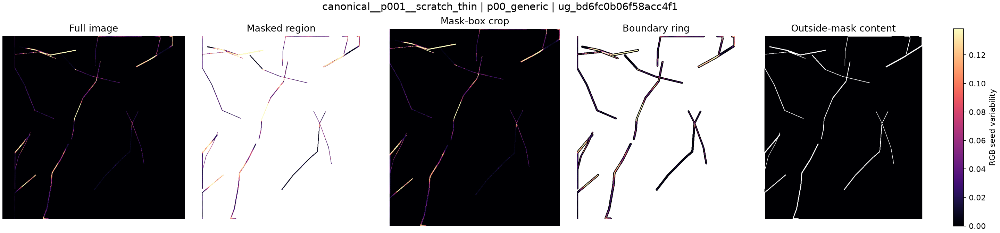

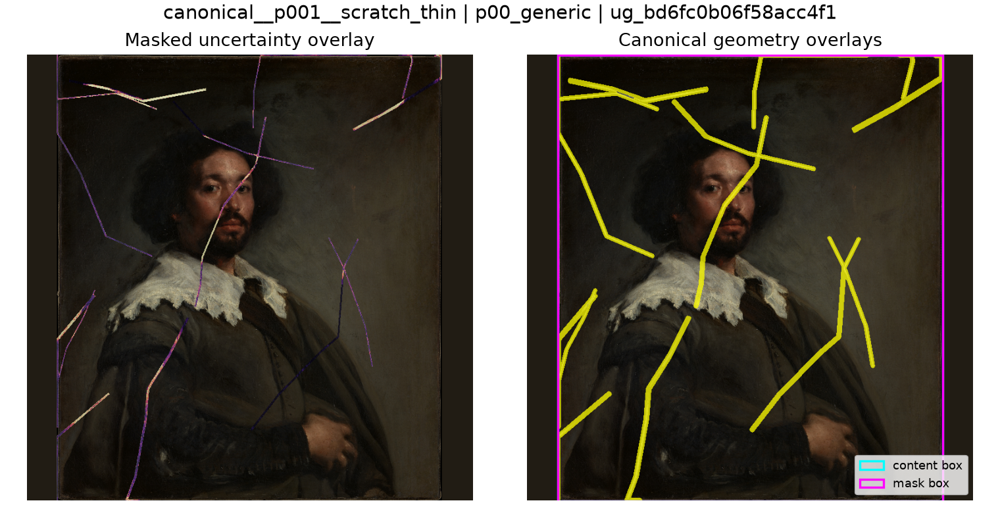

Canonical render preview: paired_scratch_aware canonical__p001__scratch_thin p05_scratch_aware


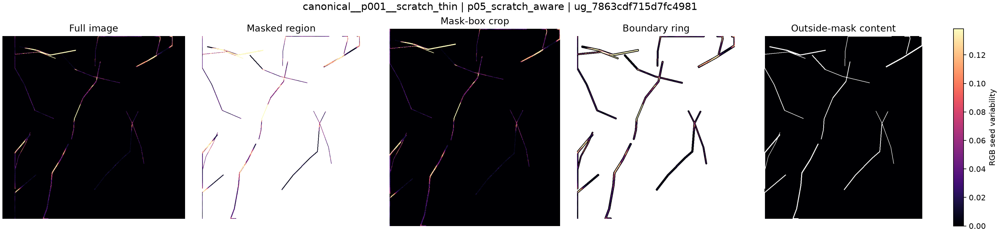

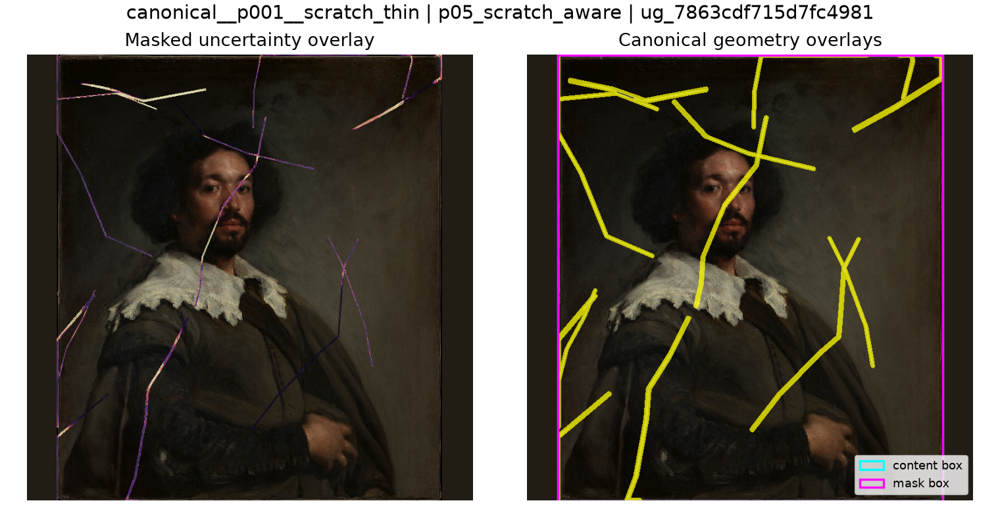

Canonical render preview: generic_non_scratch canonical__p031__mixed_damage p00_generic


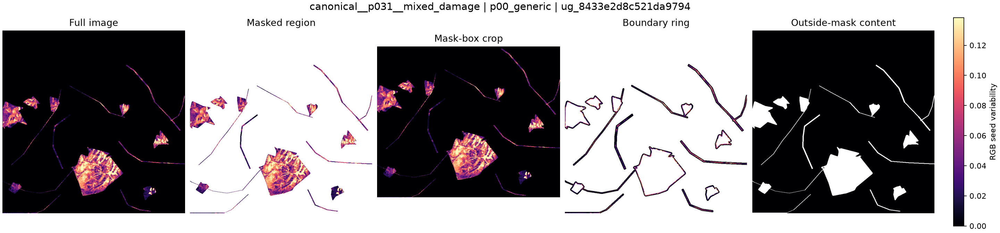

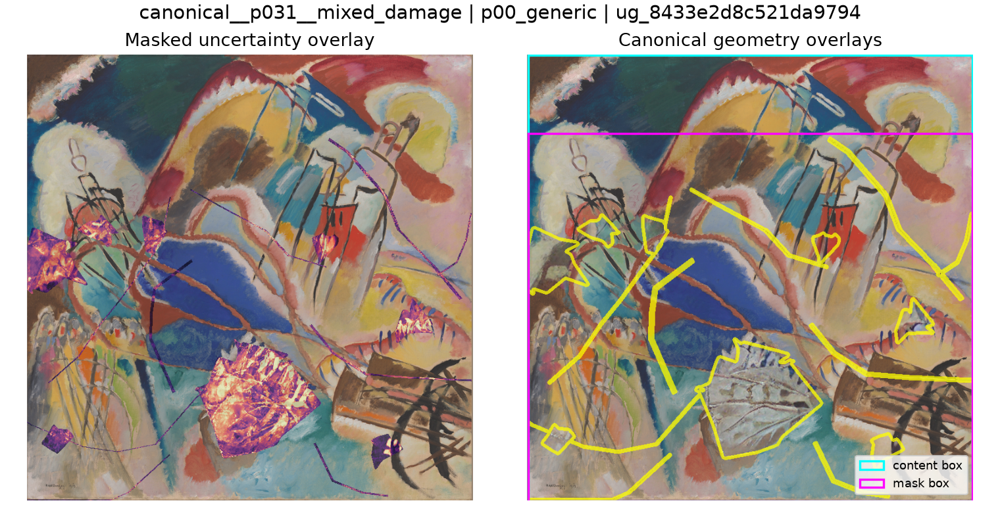

Notebook 19 rendered assets audited.
Rendered files audited: 260
Rendered map records: 260
Rendered record schema passed: True
Map records accumulated so far: 390
Canonical previews displayed: True


In [27]:
# ---------------------------------------------------------------------------
# Validate every canonical rendered file
# ---------------------------------------------------------------------------

render_checkpoint_lookup = {
    str(record["render_key"]): record
    for record in (
        render_checkpoint_df.to_dict(
            orient="records"
        )
    )
}

rendered_file_audit_records = []
rendered_map_record_list = []

for asset_number, plan in enumerate(
    render_plan_df.itertuples(
        index=False
    ),
    start=1,
):
    render_key = str(plan.render_key)

    checkpoint_record = (
        render_checkpoint_lookup[
            render_key
        ]
    )

    image_path = resolve_repo_path(
        plan.relative_path,
        PROJECT_ROOT,
        must_exist=False,
    )

    exists = image_path.is_file()

    observed_sha256 = (
        sha256_file(image_path)
        if exists
        else ""
    )

    checksum_matches = bool(
        exists
        and observed_sha256.lower()
        == str(
            checkpoint_record["sha256"]
        ).strip().lower()
    )

    with Image.open(image_path) as image:
        image.load()

        image_width = int(image.width)
        image_height = int(image.height)
        image_mode = image.mode
        image_format = image.format

        if image.mode == "RGBA":
            (
                alpha_minimum,
                alpha_maximum,
            ) = image.getchannel(
                "A"
            ).getextrema()
        else:
            alpha_minimum = np.nan
            alpha_maximum = np.nan

    expected_alpha_contract = bool(
        (
            plan.asset_kind
            == "uncertainty_panel"
            and alpha_minimum == 0
            and alpha_maximum == 255
        )
        or (
            plan.asset_kind
            == "uncertainty_overlay"
            and alpha_minimum == 255
            and alpha_maximum == 255
        )
    )

    rendered_file_audit_records.append(
        {
            "render_key": render_key,
            "uncertainty_group_id": (
                plan.uncertainty_group_id
            ),
            "asset_kind": plan.asset_kind,
            "relative_path": (
                plan.relative_path
            ),
            "exists": exists,
            "checksum_matches": (
                checksum_matches
            ),
            "width": image_width,
            "height": image_height,
            "image_mode": image_mode,
            "format": image_format,
            "alpha_minimum": (
                alpha_minimum
            ),
            "alpha_maximum": (
                alpha_maximum
            ),
            "alpha_contract_passed": (
                expected_alpha_contract
            ),
            "size_bytes": int(
                image_path.stat().st_size
            ),
        }
    )

    representative = dict(
        representative_lookup[
            str(
                plan.uncertainty_group_id
            )
        ]
    )

    representative[
        "uncertainty_group_id"
    ] = str(
        plan.uncertainty_group_id
    )

    if (
        plan.asset_kind
        == "uncertainty_panel"
    ):
        map_type = (
            "uncertainty_variants"
        )
        region_scope = (
            "full_masked_crop_boundary_outside"
        )
        no_data_policy = (
            NORMALIZATION_POLICY[
                "panel_no_data_policy"
            ]
        )

    else:
        map_type = (
            "uncertainty_overlay"
        )
        region_scope = (
            "masked_uncertainty_and_geometry"
        )
        no_data_policy = (
            "representative_restoration_base_"
            "visible_outside_mask"
        )

    rendered_map_record_list.append(
        build_map_asset_record(
            representative,
            asset_kind=(
                plan.asset_kind
            ),
            ownership="owned",
            map_type=map_type,
            relative_path=(
                plan.relative_path
            ),
            status="passed",
            region_scope=region_scope,
            source_artifact_key=(
                "spatial_explanations."
                "numeric_maps"
            ),
            sha256=observed_sha256,
            size_bytes=int(
                image_path.stat().st_size
            ),
            width=image_width,
            height=image_height,
            image_mode=image_mode,
            format=image_format,
            cmap=(
                NORMALIZATION_POLICY[
                    "cmap"
                ]
            ),
            vmin=float(
                global_uncertainty_normalization[
                    "vmin"
                ]
            ),
            vmax=float(
                global_uncertainty_normalization[
                    "vmax"
                ]
            ),
            center=np.nan,
            scale_scope=(
                global_uncertainty_normalization[
                    "scale_scope"
                ]
            ),
            normalization_policy_id=(
                global_uncertainty_normalization[
                    "normalization_policy_id"
                ]
            ),
            quantization_policy=(
                "matplotlib_rgba_png_"
                "visualization_only"
            ),
            no_data_policy=(
                no_data_policy
            ),
            renderer_version=(
                SPATIAL_EXPLANATION_RENDERER_VERSION
            ),
        )
    )

    if (
        asset_number
        % progress_interval
        == 0
        or asset_number
        == len(render_plan_df)
    ):
        print(
            "Rendered-file audit:",
            f"{asset_number}/"
            f"{len(render_plan_df)}",
            "latest:",
            render_key,
        )

rendered_file_audit_df = pd.DataFrame(
    rendered_file_audit_records
)

rendered_map_records_df = pd.DataFrame(
    rendered_map_record_list
)

rendered_map_record_schema = (
    validate_dataframe(
        rendered_map_records_df,
        SPATIAL_EXPLANATION_MAP_IMAGE_SCHEMA,
        allow_extra_columns=False,
    )
)

map_records_after_batch_6_df = (
    pd.concat(
        [
            numeric_map_records_df,
            rendered_map_records_df,
        ],
        ignore_index=True,
    )
)

map_records_after_batch_6_schema = (
    validate_dataframe(
        map_records_after_batch_6_df,
        SPATIAL_EXPLANATION_MAP_IMAGE_SCHEMA,
        allow_extra_columns=False,
    )
)


# ---------------------------------------------------------------------------
# Inline review of the three smoke-test groups at canonical scale
# ---------------------------------------------------------------------------

CANONICAL_RENDER_PREVIEW_DISPLAYED = False

for uncertainty_group_id in smoke_group_ids:
    preview_selection = (
        smoke_selection_df.loc[
            smoke_selection_df[
                "uncertainty_group_id"
            ].astype(str).eq(
                uncertainty_group_id
            )
        ]
        .iloc[0]
    )

    print(
        "Canonical render preview:",
        preview_selection[
            "smoke_role"
        ],
        preview_selection["case_id"],
        preview_selection[
            "prompt_variant_id"
        ],
    )

    for preview_path in (
        OUTPUTS[
            "uncertainty_images"
        ]
        / f"{uncertainty_group_id}.png",
        OUTPUTS[
            "overlay_images"
        ]
        / f"{uncertainty_group_id}.png",
    ):
        with Image.open(
            preview_path
        ) as image:
            image.load()
            display(
                image.convert(
                    "RGBA"
                ).copy()
            )

CANONICAL_RENDER_PREVIEW_DISPLAYED = True

print("Notebook 19 rendered assets audited.")
print(
    "Rendered files audited:",
    len(rendered_file_audit_df),
)
print(
    "Rendered map records:",
    len(rendered_map_records_df),
)
print(
    "Rendered record schema passed:",
    rendered_map_record_schema.passed,
)
print(
    "Map records accumulated so far:",
    len(map_records_after_batch_6_df),
)
print(
    "Canonical previews displayed:",
    CANONICAL_RENDER_PREVIEW_DISPLAYED,
)

In [28]:
# ---------------------------------------------------------------------------
# Batch 6 validation helper
# ---------------------------------------------------------------------------

VALIDATION_STAGE = (
    "batch_6_uncertainty_rendering"
)


def add_batch_6_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=VALIDATION_STAGE,
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


# ---------------------------------------------------------------------------
# Render plan, execution, and checkpoint
# ---------------------------------------------------------------------------

render_plan_contract = {
    "rows": len(render_plan_df),
    "unique_render_keys": int(
        render_plan_df[
            "render_key"
        ].nunique()
    ),
    "unique_paths": int(
        render_plan_df[
            "relative_path"
        ].nunique()
    ),
    "uncertainty_panels": int(
        render_plan_df[
            "asset_kind"
        ].eq(
            "uncertainty_panel"
        ).sum()
    ),
    "uncertainty_overlays": int(
        render_plan_df[
            "asset_kind"
        ].eq(
            "uncertainty_overlay"
        ).sum()
    ),
}

add_batch_6_check(
    "render_plan_contract",
    "The render plan contains two unique canonical assets per group.",
    {
        "rows": 260,
        "unique_render_keys": 260,
        "unique_paths": 260,
        "uncertainty_panels": 130,
        "uncertainty_overlays": 130,
    },
    render_plan_contract,
    (
        render_plan_contract
        == {
            "rows": 260,
            "unique_render_keys": 260,
            "unique_paths": 260,
            "uncertainty_panels": 130,
            "uncertainty_overlays": 130,
        }
    ),
)

render_execution_contract = {
    "rendered_assets": len(
        rendered_asset_keys
    ),
    "resumed_assets": len(
        resumed_asset_keys
    ),
    "total_assets": (
        len(rendered_asset_keys)
        + len(resumed_asset_keys)
    ),
    "overlap": len(
        set(rendered_asset_keys)
        & set(resumed_asset_keys)
    ),
}

add_batch_6_check(
    "render_execution_outcome",
    "Every planned asset was either rendered or strictly resumed.",
    {
        "total_assets": 260,
        "overlap": 0,
    },
    render_execution_contract,
    (
        render_execution_contract[
            "total_assets"
        ]
        == 260
        and render_execution_contract[
            "overlap"
        ]
        == 0
    ),
)

render_checkpoint_contract = {
    "rows": len(
        render_checkpoint_df
    ),
    "unique_render_keys": int(
        render_checkpoint_df[
            "render_key"
        ].nunique()
    ),
    "completed_rows": int(
        render_checkpoint_df[
            "status"
        ].astype(str).eq(
            "completed"
        ).sum()
    ),
    "unique_paths": int(
        render_checkpoint_df[
            "relative_path"
        ].nunique()
    ),
}

add_batch_6_check(
    "render_checkpoint_contract",
    "The render checkpoint covers all 260 assets exactly once.",
    {
        "rows": 260,
        "unique_render_keys": 260,
        "completed_rows": 260,
        "unique_paths": 260,
    },
    render_checkpoint_contract,
    (
        render_checkpoint_contract
        == {
            "rows": 260,
            "unique_render_keys": 260,
            "completed_rows": 260,
            "unique_paths": 260,
        }
    ),
)


# ---------------------------------------------------------------------------
# File, alpha, and normalized-record integrity
# ---------------------------------------------------------------------------

rendered_file_contract = {
    "rows": len(
        rendered_file_audit_df
    ),
    "existing": int(
        rendered_file_audit_df[
            "exists"
        ].astype(bool).sum()
    ),
    "checksum_matches": int(
        rendered_file_audit_df[
            "checksum_matches"
        ].astype(bool).sum()
    ),
    "rgba": int(
        rendered_file_audit_df[
            "image_mode"
        ].astype(str).eq(
            "RGBA"
        ).sum()
    ),
    "png": int(
        rendered_file_audit_df[
            "format"
        ].astype(str).eq(
            "PNG"
        ).sum()
    ),
    "positive_size": int(
        rendered_file_audit_df[
            "size_bytes"
        ].gt(0).sum()
    ),
    "minimum_width": int(
        rendered_file_audit_df[
            "width"
        ].min()
    ),
    "minimum_height": int(
        rendered_file_audit_df[
            "height"
        ].min()
    ),
}

add_batch_6_check(
    "rendered_file_integrity",
    "All canonical rendered files exist and satisfy their file contracts.",
    {
        "rows": 260,
        "existing": 260,
        "checksum_matches": 260,
        "rgba": 260,
        "png": 260,
        "positive_size": 260,
        "minimum_width": "> 500",
        "minimum_height": "> 300",
    },
    rendered_file_contract,
    (
        rendered_file_contract["rows"]
        == 260
        and rendered_file_contract[
            "existing"
        ]
        == 260
        and rendered_file_contract[
            "checksum_matches"
        ]
        == 260
        and rendered_file_contract[
            "rgba"
        ]
        == 260
        and rendered_file_contract[
            "png"
        ]
        == 260
        and rendered_file_contract[
            "positive_size"
        ]
        == 260
        and rendered_file_contract[
            "minimum_width"
        ]
        > 500
        and rendered_file_contract[
            "minimum_height"
        ]
        > 300
    ),
)

alpha_contract = {
    "transparent_panels": int(
        rendered_file_audit_df.loc[
            rendered_file_audit_df[
                "asset_kind"
            ].eq(
                "uncertainty_panel"
            ),
            "alpha_contract_passed",
        ].astype(bool).sum()
    ),
    "opaque_overlays": int(
        rendered_file_audit_df.loc[
            rendered_file_audit_df[
                "asset_kind"
            ].eq(
                "uncertainty_overlay"
            ),
            "alpha_contract_passed",
        ].astype(bool).sum()
    ),
}

add_batch_6_check(
    "rendered_alpha_contract",
    "Panels preserve transparent no-data while overlays preserve an opaque painting base.",
    {
        "transparent_panels": 130,
        "opaque_overlays": 130,
    },
    alpha_contract,
    (
        alpha_contract
        == {
            "transparent_panels": 130,
            "opaque_overlays": 130,
        }
    ),
)

rendered_record_contract = {
    "rows": len(
        rendered_map_records_df
    ),
    "unique_asset_ids": int(
        rendered_map_records_df[
            "map_asset_id"
        ].nunique()
    ),
    "schema_passed": (
        rendered_map_record_schema.passed
    ),
    "asset_kind_counts": {
        str(key): int(value)
        for key, value in (
            rendered_map_records_df[
                "asset_kind"
            ]
            .value_counts()
            .sort_index()
            .items()
        )
    },
    "status_values": sorted(
        rendered_map_records_df[
            "status"
        ].astype(str).unique().tolist()
    ),
}

add_batch_6_check(
    "rendered_map_records",
    "Every rendered asset has one schema-valid normalized manifest record.",
    {
        "rows": 260,
        "unique_asset_ids": 260,
        "schema_passed": True,
        "asset_kind_counts": {
            "uncertainty_overlay": 130,
            "uncertainty_panel": 130,
        },
        "status_values": ["passed"],
    },
    rendered_record_contract,
    (
        rendered_record_contract
        == {
            "rows": 260,
            "unique_asset_ids": 260,
            "schema_passed": True,
            "asset_kind_counts": {
                "uncertainty_overlay": 130,
                "uncertainty_panel": 130,
            },
            "status_values": ["passed"],
        }
    ),
)

recorded_vmax = pd.to_numeric(
    rendered_map_records_df[
        "vmax"
    ],
    errors="raise",
)

normalization_record_contract = {
    "unique_vmax_values": int(
        recorded_vmax.nunique()
    ),
    "maximum_vmax_difference": float(
        np.max(
            np.abs(
                recorded_vmax.to_numpy(
                    dtype=float
                )
                - global_uncertainty_normalization[
                    "vmax"
                ]
            )
        )
    ),
    "normalization_policies": sorted(
        rendered_map_records_df[
            "normalization_policy_id"
        ].astype(str).unique().tolist()
    ),
    "cmaps": sorted(
        rendered_map_records_df[
            "cmap"
        ].astype(str).unique().tolist()
    ),
}

add_batch_6_check(
    "render_normalization_records",
    "Every visual asset records the same canonical normalization.",
    {
        "unique_vmax_values": 1,
        "maximum_vmax_difference": (
            "<= 1e-12"
        ),
        "normalization_policies": [
            NORMALIZATION_POLICY[
                "policy_id"
            ]
        ],
        "cmaps": [
            NORMALIZATION_POLICY["cmap"]
        ],
    },
    normalization_record_contract,
    (
        normalization_record_contract[
            "unique_vmax_values"
        ]
        == 1
        and normalization_record_contract[
            "maximum_vmax_difference"
        ]
        <= 1e-12
        and normalization_record_contract[
            "normalization_policies"
        ]
        == [
            NORMALIZATION_POLICY[
                "policy_id"
            ]
        ]
        and normalization_record_contract[
            "cmaps"
        ]
        == [
            NORMALIZATION_POLICY[
                "cmap"
            ]
        ]
    ),
)

filename_contract = {
    "group_id_filename_matches": int(
        sum(
            Path(relative_path).stem
            == str(uncertainty_group_id)
            for relative_path, uncertainty_group_id
            in zip(
                rendered_map_records_df[
                    "relative_path"
                ].astype(str),
                rendered_map_records_df[
                    "uncertainty_group_id"
                ].astype(str),
            )
        )
    ),
    "unique_relative_paths": int(
        rendered_map_records_df[
            "relative_path"
        ].nunique()
    ),
}

add_batch_6_check(
    "prompt_safe_render_filenames",
    "Every PNG filename uses uncertainty_group_id and every path is unique.",
    {
        "group_id_filename_matches": 260,
        "unique_relative_paths": 260,
    },
    filename_contract,
    (
        filename_contract
        == {
            "group_id_filename_matches": 260,
            "unique_relative_paths": 260,
        }
    ),
)


# ---------------------------------------------------------------------------
# Canonical scope and inline QA
# ---------------------------------------------------------------------------

canonical_files_after_batch_6 = sorted(
    to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    for path in NOTEBOOK_OUTPUT_ROOT.rglob("*")
    if (
        path.is_file()
        and "work" not in path.relative_to(
            NOTEBOOK_OUTPUT_ROOT
        ).parts
    )
)

expected_canonical_files_after_batch_6 = sorted(
    [
        to_repo_relative(
            OUTPUTS["numeric_maps"],
            PROJECT_ROOT,
        ),
        to_repo_relative(
            OUTPUTS[
                "spatial_explanations"
            ],
            PROJECT_ROOT,
        ),
        *render_plan_df[
            "relative_path"
        ].astype(str).tolist(),
    ]
)

add_batch_6_check(
    "batch_6_canonical_file_scope",
    "The canonical scope contains exactly two numeric files and 260 rendered PNGs.",
    expected_canonical_files_after_batch_6,
    canonical_files_after_batch_6,
    (
        canonical_files_after_batch_6
        == expected_canonical_files_after_batch_6
    ),
)

add_batch_6_check(
    "canonical_render_preview",
    "Canonical generic, scratch-aware, and non-scratch previews were displayed inline.",
    True,
    CANONICAL_RENDER_PREVIEW_DISPLAYED,
    CANONICAL_RENDER_PREVIEW_DISPLAYED,
)

print("Notebook 19 Batch 6 checks assembled.")
print(
    "Batch 6 checks added:",
    int(
        VALIDATION.to_dataframe()[
            "validation_stage"
        ].eq(VALIDATION_STAGE).sum()
    ),
)

Notebook 19 Batch 6 checks assembled.
Batch 6 checks added: 10


In [29]:
# ---------------------------------------------------------------------------
# Batch 6 review tables and gate
# ---------------------------------------------------------------------------

all_validation_df = VALIDATION.to_dataframe()

batch_6_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq(VALIDATION_STAGE)
    ]
    .reset_index(drop=True)
)

render_summary_df = (
    rendered_file_audit_df.groupby(
        "asset_kind",
        as_index=False,
    )
    .agg(
        files=("render_key", "size"),
        total_size_bytes=(
            "size_bytes",
            "sum",
        ),
        minimum_width=("width", "min"),
        maximum_width=("width", "max"),
        minimum_height=("height", "min"),
        maximum_height=("height", "max"),
        checksum_matches=(
            "checksum_matches",
            "sum",
        ),
        alpha_contract_passed=(
            "alpha_contract_passed",
            "sum",
        ),
    )
)

display(render_summary_df)

display(
    render_resume_audit_df[
        [
            "checkpoint_row_present",
            "resume_valid",
        ]
    ]
    .value_counts(
        dropna=False
    )
    .rename("assets")
    .reset_index()
)

display(render_checkpoint_df.head(20))
display(rendered_file_audit_df.head(20))
display(rendered_map_records_df.head(20))
display(batch_6_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 19 Batch 6 summary")
print("---------------------------")
print(
    "Batch 6 validation checks:",
    len(batch_6_validation_df),
)
print(
    "Blocking failures across Batches 1–6:",
    len(VALIDATION.blocking_failures),
)
print(
    "Canonical uncertainty panels:",
    int(
        rendered_file_audit_df[
            "asset_kind"
        ].eq(
            "uncertainty_panel"
        ).sum()
    ),
)
print(
    "Canonical uncertainty overlays:",
    int(
        rendered_file_audit_df[
            "asset_kind"
        ].eq(
            "uncertainty_overlay"
        ).sum()
    ),
)
print(
    "Newly rendered assets:",
    len(rendered_asset_keys),
)
print(
    "Strictly resumed assets:",
    len(resumed_asset_keys),
)
print(
    "Rendered manifest records in memory:",
    len(rendered_map_records_df),
)
print(
    "Accumulated map records:",
    len(map_records_after_batch_6_df),
)
print(
    "Canonical files currently persisted:",
    len(canonical_files_after_batch_6),
)
print(
    "Canonical previews displayed:",
    CANONICAL_RENDER_PREVIEW_DISPLAYED,
)
print(
    "Batch 6 passed: all 130 uncertainty panels and "
    "130 representative-restoration overlays were rendered "
    "or strictly resumed, validated, displayed for bounded "
    "QA, and normalized through the same global scale."
)

,asset_kind,files,total_size_bytes,minimum_width,maximum_width,minimum_height,maximum_height,checksum_matches,alpha_contract_passed
0,uncertainty_overlay,130,157244316,1520,1520,768,768,130,130
1,uncertainty_panel,130,30706838,2880,2880,672,672,130,130


,checkpoint_row_present,resume_valid,assets
0,False,False,260


,render_key,uncertainty_group_id,asset_kind,renderer_fingerprint,relative_path,sha256,size_bytes,width,height,image_mode,format,alpha_minimum,alpha_maximum,completed_at_utc,status,issue
0,ug_02691ab42d9ccf28ea|uncertainty_overlay,ug_02691ab42d9ccf28ea,uncertainty_overlay,06eed9fd84b23fa5d7e021a1287abda8551abf879bef06...,outputs/19_uncertainty_and_spatial_explanation...,7c2f87311fff2930fc9ebc60050924bfb911dfc03a422a...,1138494,1520,768,RGBA,PNG,255,255,2026-08-30T14:23:19.643785Z,completed,
1,ug_02691ab42d9ccf28ea|uncertainty_panel,ug_02691ab42d9ccf28ea,uncertainty_panel,7359bf6ce11f6ff7800d2c8d9f5860312a28472bcd0790...,outputs/19_uncertainty_and_spatial_explanation...,49b861c33cb4b0eb155f91e284bc0b20f3cec291398e5f...,244281,2880,672,RGBA,PNG,0,255,2026-08-30T14:23:24.116077Z,completed,
2,ug_03c8f7fff975f51939|uncertainty_overlay,ug_03c8f7fff975f51939,uncertainty_overlay,7623f490c423638535e0413b9a0a465290406a4e47a0cb...,outputs/19_uncertainty_and_spatial_explanation...,94f492ce361e4c8880002b623547ed806bfdb67a30f0cc...,1315657,1520,768,RGBA,PNG,255,255,2026-08-30T14:23:28.135575Z,completed,
3,ug_03c8f7fff975f51939|uncertainty_panel,ug_03c8f7fff975f51939,uncertainty_panel,e76350942f839bb378abed9aea9e59a50e1253e78d914e...,outputs/19_uncertainty_and_spatial_explanation...,8ec28dbffadd71790645f2624fdaf8aa913d78c51d10be...,240428,2880,672,RGBA,PNG,0,255,2026-08-30T14:23:31.213011Z,completed,
4,ug_04f954c19d300ace02|uncertainty_overlay,ug_04f954c19d300ace02,uncertainty_overlay,761b334aa3b45c705ca40799bcd505a9b84bf1d2ff34ee...,outputs/19_uncertainty_and_spatial_explanation...,496d04a15ea8c679c31499b9926b8ecfc1bd70845440cc...,1306712,1520,768,RGBA,PNG,255,255,2026-08-30T14:23:34.278981Z,completed,
5,ug_04f954c19d300ace02|uncertainty_panel,ug_04f954c19d300ace02,uncertainty_panel,5d3661e946809290403f2d59ac22d99a71e20cbb1ac44f...,outputs/19_uncertainty_and_spatial_explanation...,1d1db5b88c718665713c0bc4cd4edbfa1ee9e4f1366c41...,194159,2880,672,RGBA,PNG,0,255,2026-08-30T14:23:36.375417Z,completed,
6,ug_05092f68b21a871cb8|uncertainty_overlay,ug_05092f68b21a871cb8,uncertainty_overlay,a2733f6a22371979129fe7362693b14de453f16faaff70...,outputs/19_uncertainty_and_spatial_explanation...,87e485337a9d64a8887e4828725f1759309d01b21faa26...,1309381,1520,768,RGBA,PNG,255,255,2026-08-30T14:23:38.863998Z,completed,
7,ug_05092f68b21a871cb8|uncertainty_panel,ug_05092f68b21a871cb8,uncertainty_panel,747ea01f85f37e446bafd27a79055f6d239a6830825ca2...,outputs/19_uncertainty_and_spatial_explanation...,98c8ccf5a11c989da1e90b1c2103e9f021504c266f8878...,196126,2880,672,RGBA,PNG,0,255,2026-08-30T14:23:41.217076Z,completed,
8,ug_05b4435212558b7035|uncertainty_overlay,ug_05b4435212558b7035,uncertainty_overlay,e784dc8165f4dd35cc872504c98478c1a13f412dac8c15...,outputs/19_uncertainty_and_spatial_explanation...,d19db1ab9583f04555b352efba8dfb137ebb744e16b5bc...,1202345,1520,768,RGBA,PNG,255,255,2026-08-30T14:23:44.653737Z,completed,
9,ug_05b4435212558b7035|uncertainty_panel,ug_05b4435212558b7035,uncertainty_panel,22032d2a7ab6bd07f182eaf8d45c0d526a9a900fb87d95...,outputs/19_uncertainty_and_spatial_explanation...,f0a764950e40fff1a5eac116e2154de5b4ff4b462f11aa...,136382,2880,672,RGBA,PNG,0,255,2026-08-30T14:23:47.936948Z,completed,


,render_key,uncertainty_group_id,asset_kind,relative_path,exists,checksum_matches,width,height,image_mode,format,alpha_minimum,alpha_maximum,alpha_contract_passed,size_bytes
0,ug_02691ab42d9ccf28ea|uncertainty_overlay,ug_02691ab42d9ccf28ea,uncertainty_overlay,outputs/19_uncertainty_and_spatial_explanation...,True,True,1520,768,RGBA,PNG,255,255,True,1138494
1,ug_02691ab42d9ccf28ea|uncertainty_panel,ug_02691ab42d9ccf28ea,uncertainty_panel,outputs/19_uncertainty_and_spatial_explanation...,True,True,2880,672,RGBA,PNG,0,255,True,244281
2,ug_03c8f7fff975f51939|uncertainty_overlay,ug_03c8f7fff975f51939,uncertainty_overlay,outputs/19_uncertainty_and_spatial_explanation...,True,True,1520,768,RGBA,PNG,255,255,True,1315657
3,ug_03c8f7fff975f51939|uncertainty_panel,ug_03c8f7fff975f51939,uncertainty_panel,outputs/19_uncertainty_and_spatial_explanation...,True,True,2880,672,RGBA,PNG,0,255,True,240428
4,ug_04f954c19d300ace02|uncertainty_overlay,ug_04f954c19d300ace02,uncertainty_overlay,outputs/19_uncertainty_and_spatial_explanation...,True,True,1520,768,RGBA,PNG,255,255,True,1306712
5,ug_04f954c19d300ace02|uncertainty_panel,ug_04f954c19d300ace02,uncertainty_panel,outputs/19_uncertainty_and_spatial_explanation...,True,True,2880,672,RGBA,PNG,0,255,True,194159
6,ug_05092f68b21a871cb8|uncertainty_overlay,ug_05092f68b21a871cb8,uncertainty_overlay,outputs/19_uncertainty_and_spatial_explanation...,True,True,1520,768,RGBA,PNG,255,255,True,1309381
7,ug_05092f68b21a871cb8|uncertainty_panel,ug_05092f68b21a871cb8,uncertainty_panel,outputs/19_uncertainty_and_spatial_explanation...,True,True,2880,672,RGBA,PNG,0,255,True,196126
8,ug_05b4435212558b7035|uncertainty_overlay,ug_05b4435212558b7035,uncertainty_overlay,outputs/19_uncertainty_and_spatial_explanation...,True,True,1520,768,RGBA,PNG,255,255,True,1202345
9,ug_05b4435212558b7035|uncertainty_panel,ug_05b4435212558b7035,uncertainty_panel,outputs/19_uncertainty_and_spatial_explanation...,True,True,2880,672,RGBA,PNG,0,255,True,136382


,map_asset_id,asset_kind,ownership,uncertainty_group_id,case_id,candidate_id,model_id,painting_id,prompt_variant_id,map_type,...,vmin,vmax,center,scale_scope,normalization_policy_id,quantization_policy,no_data_policy,renderer_version,status,issue
0,sxa_c05def9b388cc213b602,uncertainty_overlay,owned,ug_02691ab42d9ccf28ea,canonical__p037__scratch_thin,sd15__p00__s2026__6c045bfd77f6,stable_diffusion_inpainting,p037,p00_generic,uncertainty_overlay,...,0.0,0.138266,NaN,all 130 eligible prompt-specific uncertainty g...,global_content_p99_5.v1,matplotlib_rgba_png_visualization_only,representative_restoration_base_visible_outsid...,spatial_explanation_renderer.v1.1,passed,
1,sxa_bc5d3e24d65f40326120,uncertainty_panel,owned,ug_02691ab42d9ccf28ea,canonical__p037__scratch_thin,sd15__p00__s2026__6c045bfd77f6,stable_diffusion_inpainting,p037,p00_generic,uncertainty_variants,...,0.0,0.138266,NaN,all 130 eligible prompt-specific uncertainty g...,global_content_p99_5.v1,matplotlib_rgba_png_visualization_only,transparent_outside_selected_region,spatial_explanation_renderer.v1.1,passed,
2,sxa_3b1de0c01d91f723dae0,uncertainty_overlay,owned,ug_03c8f7fff975f51939,canonical__p050__scratch_thin,sd15__p00__s2026__4fda4473b132,stable_diffusion_inpainting,p050,p00_generic,uncertainty_overlay,...,0.0,0.138266,NaN,all 130 eligible prompt-specific uncertainty g...,global_content_p99_5.v1,matplotlib_rgba_png_visualization_only,representative_restoration_base_visible_outsid...,spatial_explanation_renderer.v1.1,passed,
3,sxa_f411f9e4b7da0bcb6974,uncertainty_panel,owned,ug_03c8f7fff975f51939,canonical__p050__scratch_thin,sd15__p00__s2026__4fda4473b132,stable_diffusion_inpainting,p050,p00_generic,uncertainty_variants,...,0.0,0.138266,NaN,all 130 eligible prompt-specific uncertainty g...,global_content_p99_5.v1,matplotlib_rgba_png_visualization_only,transparent_outside_selected_region,spatial_explanation_renderer.v1.1,passed,
4,sxa_aa443fac19814a664fa5,uncertainty_overlay,owned,ug_04f954c19d300ace02,canonical__p016__scratch_thin,sd15__p00__s2026__7315824f8629,stable_diffusion_inpainting,p016,p00_generic,uncertainty_overlay,...,0.0,0.138266,NaN,all 130 eligible prompt-specific uncertainty g...,global_content_p99_5.v1,matplotlib_rgba_png_visualization_only,representative_restoration_base_visible_outsid...,spatial_explanation_renderer.v1.1,passed,
5,sxa_24e0b1216854ff40d36e,uncertainty_panel,owned,ug_04f954c19d300ace02,canonical__p016__scratch_thin,sd15__p00__s2026__7315824f8629,stable_diffusion_inpainting,p016,p00_generic,uncertainty_variants,...,0.0,0.138266,NaN,all 130 eligible prompt-specific uncertainty g...,global_content_p99_5.v1,matplotlib_rgba_png_visualization_only,transparent_outside_selected_region,spatial_explanation_renderer.v1.1,passed,
6,sxa_02df0b7de5379abcdb56,uncertainty_overlay,owned,ug_05092f68b21a871cb8,canonical__p016__scratch_thin,sd15__p05__s2026__5c49321db0c7,stable_diffusion_inpainting,p016,p05_scratch_aware,uncertainty_overlay,...,0.0,0.138266,NaN,all 130 eligible prompt-specific uncertainty g...,global_content_p99_5.v1,matplotlib_rgba_png_visualization_only,representative_restoration_base_visible_outsid...,spatial_explanation_renderer.v1.1,passed,
7,sxa_d7e023a6b18a41d5f644,uncertainty_panel,owned,ug_05092f68b21a871cb8,canonical__p016__scratch_thin,sd15__p05__s2026__5c49321db0c7,stable_diffusion_inpainting,p016,p05_scratch_aware,uncertainty_variants,...,0.0,0.138266,NaN,all 130 eligible prompt-specific uncertainty g...,global_content_p99_5.v1,matplotlib_rgba_png_visualization_only,transparent_outside_selected_region,spatial_explanation_renderer.v1.1,passed,
8,sxa_22f94285e4f4428c0246,uncertainty_overlay,owned,ug_05b4435212558b7035,canonical__p039__scratch_thin,sd15__p00__s2026__7dee66f847f4,stable_diffusion_inpainting,p039,p00_generic,uncertainty_overlay,...,0.0,0.138266,NaN,all 130 eligible prompt-specific uncertainty g...,global_content_p99_5.v1,matplotlib_rgba_png_visualization_only,representative_restoration_base_visible_outsid...,

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_6_uncertainty_rendering,render_plan_contract,The render plan contains two unique canonical ...,blocking,"{""rows"": 260, ""uncertainty_overlays"": 130, ""un...","{""rows"": 260, ""uncertainty_overlays"": 130, ""un...",True,
1,batch_6_uncertainty_rendering,render_execution_outcome,Every planned asset was either rendered or str...,blocking,"{""overlap"": 0, ""total_assets"": 260}","{""overlap"": 0, ""rendered_assets"": 260, ""resume...",True,
2,batch_6_uncertainty_rendering,render_checkpoint_contract,The render checkpoint covers all 260 assets ex...,blocking,"{""completed_rows"": 260, ""rows"": 260, ""unique_p...","{""completed_rows"": 260, ""rows"": 260, ""unique_p...",True,
3,batch_6_uncertainty_rendering,rendered_file_integrity,All canonical rendered files exist and satisfy...,blocking,"{""checksum_matches"": 260, ""existing"": 260, ""mi...","{""checksum_matches"": 260, ""existing"": 260, ""mi...",True,
4,batch_6_uncertainty_rendering,rendered_alpha_contract,Panels preserve transparent no-data while over...,blocking,"{""opaque_overlays"": 130, ""transparent_panels"":...","{""opaque_overlays"": 130, ""transparent_panels"":...",True,
5,batch_6_uncertainty_rendering,rendered_map_records,Every rendered asset has one schema-valid norm...,blocking,"{""asset_kind_counts"": {""uncertainty_overlay"": ...","{""asset_kind_counts"": {""uncertainty_overlay"": ...",True,
6,batch_6_uncertainty_rendering,render_normalization_records,Every visual asset records the same canonical ...,blocking,"{""cmaps"": [""magma""], ""maximum_vmax_difference""...","{""cmaps"": [""magma""], ""maximum_vmax_difference""...",True,
7,batch_6_uncertainty_rendering,prompt_safe_render_filenames,Every PNG filename uses uncertainty_group_id a...,blocking,"{""group_id_filename_matches"": 260, ""unique_rel...","{""group_id_filename_matches"": 260, ""unique_rel...",True,
8,batch_6_uncertainty_rendering,batch_6_canonical_file_scope,The canonical scope contains exactly two numer...,blocking,"[""outputs/19_uncertainty_and_spatial_explanati...","[""outputs/19_uncertainty_and_spatial_explanati...",True,
9,batch_6_uncertainty_rendering,canonical_render_preview,"Canonical generic, scratch-aware, and non-scra...",blocking,True,True,True,


Notebook 19 Batch 6 summary
---------------------------
Batch 6 validation checks: 10
Blocking failures across Batches 1–6: 0
Canonical uncertainty panels: 130
Canonical uncertainty overlays: 130
Newly rendered assets: 260
Strictly resumed assets: 0
Rendered manifest records in memory: 260
Accumulated map records: 390
Canonical files currently persisted: 262
Canonical previews displayed: True
Batch 6 passed: all 130 uncertainty panels and 130 representative-restoration overlays were rendered or strictly resumed, validated, displayed for bounded QA, and normalized through the same global scale.


## Batch 7 — Scratch-aware texture, colour, and seam presentation maps

Notebook 17 generated texture, colour, and seam maps only for its primary
candidate population. The 50 scratch-aware representative candidates introduced
by the Stable Diffusion prompt ablation therefore have validated numerical
evidence but no corresponding local-map presentation assets.

This batch:

- recomputes no scientific metrics;
- derives Notebook 17's three global display scales from its canonical metric table;
- verifies those scales against Notebook 17's existing map manifest;
- renders texture, colour, and seam panels for the 50 scratch-aware seed-2026 representatives;
- uses the unchanged Notebook 17 helper, configuration, colour maps, and no-data policy;
- writes exactly 150 Notebook 19-owned component maps;
- supports strict checksum-based checkpoint resume;
- registers the new files in Notebook 19's normalized in-memory map manifest.

The maps remain separate diagnostic evidence families. They are not combined
with uncertainty or converted into a trustworthiness score.

In [30]:
from PIL import Image

from restoration_eval.local_consistency import (
    LOCAL_CONSISTENCY_RENDERER_VERSION,
    MAP_TYPES,
    compute_candidate_display_maps,
    compute_display_scales,
    save_family_map_panel,
)

from restoration_eval.spatial_explanations import (
    write_dataframe_atomic,
)


# ---------------------------------------------------------------------------
# Reconstruct Notebook 17's approved global display scales
# ---------------------------------------------------------------------------

LOCAL_SETTINGS = (
    LOCAL_CONSISTENCY_CONFIG_DOCUMENT[
        "local_consistency"
    ]
)

LOCAL_VISUAL_POLICY = (
    LOCAL_SETTINGS["visualization"]
)

canonical_local_display_scales = (
    compute_display_scales(
        local_consistency_df,
        config=LOCAL_CONSISTENCY_CONFIG_DOCUMENT,
    )
)

local_scale_audit_records = []

for map_type in MAP_TYPES:
    scale = canonical_local_display_scales[
        map_type
    ]

    reference_rows = (
        local_map_manifest_df.loc[
            local_map_manifest_df[
                "asset_kind"
            ].astype(str).eq(
                "candidate_map"
            )
            & local_map_manifest_df[
                "map_type"
            ].astype(str).eq(
                map_type
            )
            & local_map_manifest_df[
                "status"
            ].astype(str).eq(
                "passed"
            )
        ]
        .copy()
    )

    reference_vmax_values = sorted(
        pd.to_numeric(
            reference_rows["vmax"],
            errors="raise",
        )
        .abs()
        .unique()
        .tolist()
    )

    reference_cmaps = sorted(
        reference_rows[
            "cmap"
        ].astype(str).unique().tolist()
    )

    reference_scale_scopes = sorted(
        reference_rows[
            "scale_scope"
        ].astype(str).unique().tolist()
    )

    expected_cmap = (
        f"{scale['error_cmap']}|"
        f"{scale['improvement_cmap']}"
    )

    local_scale_audit_records.append(
        {
            "map_type": map_type,
            "computed_vmax": float(
                scale["vmax"]
            ),
            "reference_unique_vmax_count": len(
                reference_vmax_values
            ),
            "reference_vmax": (
                float(reference_vmax_values[0])
                if len(reference_vmax_values) == 1
                else np.nan
            ),
            "maximum_absolute_difference": (
                abs(
                    float(scale["vmax"])
                    - float(
                        reference_vmax_values[0]
                    )
                )
                if len(reference_vmax_values) == 1
                else np.inf
            ),
            "expected_cmap": expected_cmap,
            "reference_cmaps": (
                "|".join(reference_cmaps)
            ),
            "cmap_matches": (
                reference_cmaps
                == [expected_cmap]
            ),
            "scale_scope_matches": (
                reference_scale_scopes
                == [
                    str(
                        scale[
                            "scale_scope"
                        ]
                    )
                ]
            ),
            "vmax_matches": bool(
                len(reference_vmax_values) == 1
                and np.isclose(
                    float(scale["vmax"]),
                    float(
                        reference_vmax_values[0]
                    ),
                    rtol=1e-12,
                    atol=1e-12,
                )
            ),
        }
    )

local_scale_audit_df = pd.DataFrame(
    local_scale_audit_records
)


# ---------------------------------------------------------------------------
# Exact 50-candidate / 150-map scratch-aware population
# ---------------------------------------------------------------------------

owned_local_group_ids = set(
    missing_local_map_worklist_df[
        "uncertainty_group_id"
    ].astype(str)
)

owned_local_candidate_ids = set(
    missing_local_map_worklist_df[
        "candidate_id"
    ].astype(str)
)

owned_local_candidates_df = (
    representative_candidates_df.loc[
        representative_candidates_df[
            "uncertainty_group_id"
        ].astype(str).isin(
            owned_local_group_ids
        )
        & representative_candidates_df[
            "candidate_id"
        ].astype(str).isin(
            owned_local_candidate_ids
        )
    ]
    .sort_values(
        [
            "painting_id",
            "case_id",
            "uncertainty_group_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

owned_local_candidate_lookup = {
    str(row["uncertainty_group_id"]): row
    for _, row in (
        owned_local_candidates_df.iterrows()
    )
}

map_type_rank = {
    map_type: index
    for index, map_type in enumerate(
        MAP_TYPES
    )
}

owned_local_plan_df = (
    missing_local_map_worklist_df.copy()
)

owned_local_plan_df[
    "map_type_rank"
] = (
    owned_local_plan_df[
        "map_type"
    ].map(map_type_rank)
)

owned_local_plan_df = (
    owned_local_plan_df
    .sort_values(
        [
            "painting_id",
            "uncertainty_group_id",
            "map_type_rank",
        ],
        kind="stable",
    )
    .drop(
        columns=["map_type_rank"]
    )
    .reset_index(drop=True)
)

owned_local_plan_df[
    "render_key"
] = (
    owned_local_plan_df[
        "uncertainty_group_id"
    ].astype(str)
    + "|local_component|"
    + owned_local_plan_df[
        "map_type"
    ].astype(str)
)


# ---------------------------------------------------------------------------
# Renderer fingerprint
# ---------------------------------------------------------------------------

def build_owned_local_renderer_fingerprint(
    plan_row,
):
    uncertainty_group_id = str(
        plan_row["uncertainty_group_id"]
    )

    map_type = str(
        plan_row["map_type"]
    )

    candidate = (
        owned_local_candidate_lookup[
            uncertainty_group_id
        ]
    )

    scale = (
        canonical_local_display_scales[
            map_type
        ]
    )

    source_identity = {
        field: str(
            candidate.get(
                field,
                "",
            )
        )
        for field in (
            "candidate_id",
            "case_id",
            "input_image_path",
            "clean_image_path",
            "mask_or_effect_path",
            "restored_path",
            "input_sha256",
            "mask_sha256",
            "restored_sha256",
            "mask_threshold",
            "configuration_id",
            "prompt_policy_id",
            "prompt_variant_id",
            "seed",
        )
    }

    payload = {
        "uncertainty_group_id": (
            uncertainty_group_id
        ),
        "map_type": map_type,
        "relative_path": str(
            plan_row["relative_path"]
        ),
        "source_identity": source_identity,
        "local_config_sha256": (
            CONFIGURATION_CHECKSUMS[
                "local_consistency"
            ]
        ),
        "local_helper_sha256": (
            HELPER_CHECKSUMS[
                "local_consistency_helper"
            ]
        ),
        "renderer_version": (
            LOCAL_CONSISTENCY_RENDERER_VERSION
        ),
        "scale": {
            "vmax": float(scale["vmax"]),
            "error_cmap": str(
                scale["error_cmap"]
            ),
            "improvement_cmap": str(
                scale[
                    "improvement_cmap"
                ]
            ),
            "scale_scope": str(
                scale["scale_scope"]
            ),
        },
        "no_data_rgba": list(
            LOCAL_VISUAL_POLICY[
                "no_data_rgba"
            ]
        ),
        "png_compress_level": int(
            LOCAL_VISUAL_POLICY[
                "png_compress_level"
            ]
        ),
    }

    serialized = json.dumps(
        payload,
        sort_keys=True,
        separators=(",", ":"),
    )

    return hashlib.sha256(
        serialized.encode("utf-8")
    ).hexdigest()


owned_local_plan_df[
    "renderer_fingerprint"
] = (
    owned_local_plan_df.apply(
        build_owned_local_renderer_fingerprint,
        axis=1,
    )
)


# ---------------------------------------------------------------------------
# Strictly resumable checkpoint
# ---------------------------------------------------------------------------

OWNED_LOCAL_CHECKPOINT_COLUMNS = [
    "render_key",
    "uncertainty_group_id",
    "candidate_id",
    "map_type",
    "renderer_fingerprint",
    "relative_path",
    "sha256",
    "size_bytes",
    "width",
    "height",
    "image_mode",
    "format",
    "completed_at_utc",
    "status",
    "issue",
]

owned_local_checkpoint_path = (
    NOTEBOOK_OUTPUT_ROOT
    / "work"
    / "owned_local_map_checkpoint.csv"
)

if owned_local_checkpoint_path.is_file():
    existing_owned_local_checkpoint_df = (
        pd.read_csv(
            owned_local_checkpoint_path,
            low_memory=False,
        )
    )

    missing_checkpoint_columns = sorted(
        set(
            OWNED_LOCAL_CHECKPOINT_COLUMNS
        )
        - set(
            existing_owned_local_checkpoint_df.columns
        )
    )

    if missing_checkpoint_columns:
        raise ValueError(
            "Owned-local checkpoint is missing columns: "
            f"{missing_checkpoint_columns}"
        )

    existing_owned_local_checkpoint_df = (
        existing_owned_local_checkpoint_df[
            OWNED_LOCAL_CHECKPOINT_COLUMNS
        ].copy()
    )
else:
    existing_owned_local_checkpoint_df = (
        pd.DataFrame(
            columns=(
                OWNED_LOCAL_CHECKPOINT_COLUMNS
            )
        )
    )

if existing_owned_local_checkpoint_df[
    "render_key"
].duplicated().any():
    raise ValueError(
        "Owned-local checkpoint contains duplicate "
        "render keys."
    )

planned_local_render_keys = set(
    owned_local_plan_df[
        "render_key"
    ].astype(str)
)

unknown_checkpoint_keys = sorted(
    set(
        existing_owned_local_checkpoint_df[
            "render_key"
        ].astype(str)
    )
    - planned_local_render_keys
)

if unknown_checkpoint_keys:
    raise ValueError(
        "Owned-local checkpoint contains keys outside "
        "the approved plan: "
        f"{unknown_checkpoint_keys[:10]}"
    )


def inspect_owned_local_resume(
    plan_row,
):
    render_key = str(
        plan_row["render_key"]
    )

    checkpoint_rows = (
        existing_owned_local_checkpoint_df.loc[
            existing_owned_local_checkpoint_df[
                "render_key"
            ].astype(str).eq(
                render_key
            )
        ]
    )

    if len(checkpoint_rows) != 1:
        return False, "checkpoint_row_absent"

    checkpoint_row = (
        checkpoint_rows.iloc[0]
    )

    if str(
        checkpoint_row["status"]
    ) != "completed":
        return False, "checkpoint_not_completed"

    if str(
        checkpoint_row[
            "renderer_fingerprint"
        ]
    ) != str(
        plan_row[
            "renderer_fingerprint"
        ]
    ):
        return False, "renderer_fingerprint_mismatch"

    if str(
        checkpoint_row["relative_path"]
    ) != str(
        plan_row["relative_path"]
    ):
        return False, "relative_path_mismatch"

    target_path = (
        PROJECT_ROOT
        / Path(
            str(
                plan_row[
                    "relative_path"
                ]
            )
        )
    )

    if not target_path.is_file():
        return False, "file_missing"

    if sha256_file(
        target_path
    ) != str(
        checkpoint_row["sha256"]
    ):
        return False, "checksum_mismatch"

    try:
        with Image.open(
            target_path
        ) as image:
            image.load()

            valid_image = bool(
                image.format == "PNG"
                and image.mode == "RGBA"
                and image.width > 0
                and image.height > 0
            )
    except Exception:
        valid_image = False

    if not valid_image:
        return False, "image_contract_failed"

    return True, "strictly_validated"


owned_local_resume_audit_records = []

for _, plan_row in (
    owned_local_plan_df.iterrows()
):
    resume_valid, resume_reason = (
        inspect_owned_local_resume(
            plan_row
        )
    )

    owned_local_resume_audit_records.append(
        {
            "render_key": (
                plan_row["render_key"]
            ),
            "uncertainty_group_id": (
                plan_row[
                    "uncertainty_group_id"
                ]
            ),
            "candidate_id": (
                plan_row["candidate_id"]
            ),
            "map_type": (
                plan_row["map_type"]
            ),
            "checkpoint_row_present": (
                resume_reason
                != "checkpoint_row_absent"
            ),
            "resume_valid": resume_valid,
            "resume_reason": resume_reason,
        }
    )

owned_local_resume_audit_df = (
    pd.DataFrame(
        owned_local_resume_audit_records
    )
)

display(local_scale_audit_df)

display(
    owned_local_plan_df[
        [
            "uncertainty_group_id",
            "case_id",
            "candidate_id",
            "painting_id",
            "prompt_variant_id",
            "map_type",
            "relative_path",
        ]
    ].head(20)
)

print("Notebook 19 local-map render plan assembled.")
print(
    "Scratch-aware representative candidates:",
    len(owned_local_candidates_df),
)
print(
    "Planned local-map assets:",
    len(owned_local_plan_df),
)
print(
    "Map counts:",
    {
        str(key): int(value)
        for key, value in (
            owned_local_plan_df[
                "map_type"
            ]
            .value_counts()
            .sort_index()
            .items()
        )
    },
)
print(
    "Strictly resumable assets:",
    int(
        owned_local_resume_audit_df[
            "resume_valid"
        ].sum()
    ),
)
print(
    "Assets requiring rendering:",
    int(
        (
            ~owned_local_resume_audit_df[
                "resume_valid"
            ]
        ).sum()
    ),
)

,map_type,computed_vmax,reference_unique_vmax_count,reference_vmax,maximum_absolute_difference,expected_cmap,reference_cmaps,cmap_matches,scale_scope_matches,vmax_matches
0,texture,274.980882,1,274.980882,0.0,magma|RdBu_r,magma|RdBu_r,True,True,True
1,colour,100.000000,1,100.000000,0.0,magma|RdBu_r,magma|RdBu_r,True,True,True
2,seam,0.174858,1,0.174858,0.0,magma|RdBu_r,magma|RdBu_r,True,True,True


,uncertainty_group_id,case_id,candidate_id,painting_id,prompt_variant_id,map_type,relative_path
0,ug_7863cdf715d7fc4981,canonical__p001__scratch_thin,sd15__p05__s2026__b0c01d8159c0,p001,p05_scratch_aware,texture,outputs/19_uncertainty_and_spatial_explanation...
1,ug_7863cdf715d7fc4981,canonical__p001__scratch_thin,sd15__p05__s2026__b0c01d8159c0,p001,p05_scratch_aware,colour,outputs/19_uncertainty_and_spatial_explanation...
2,ug_7863cdf715d7fc4981,canonical__p001__scratch_thin,sd15__p05__s2026__b0c01d8159c0,p001,p05_scratch_aware,seam,outputs/19_uncertainty_and_spatial_explanation...
3,ug_72e2c41a819e63cd6b,canonical__p002__scratch_thin,sd15__p05__s2026__26d3935e7133,p002,p05_scratch_aware,texture,outputs/19_uncertainty_and_spatial_explanation...
4,ug_72e2c41a819e63cd6b,canonical__p002__scratch_thin,sd15__p05__s2026__26d3935e7133,p002,p05_scratch_aware,colour,outputs/19_uncertainty_and_spatial_explanation...
5,ug_72e2c41a819e63cd6b,canonical__p002__scratch_thin,sd15__p05__s2026__26d3935e7133,p002,p05_scratch_aware,seam,outputs/19_uncertainty_and_spatial_explanation...
6,ug_adb3728b31364bc2ac,canonical__p003__scratch_thin,sd15__p05__s2026__dc2594970bdb,p003,p05_scratch_aware,texture,outputs/19_uncertainty_and_spatial_explanation...
7,ug_adb3728b31364bc2ac,canonical__p003__scratch_thin,sd15__p05__s2026__dc2594970bdb,p003,p05_scratch_aware,colour,outputs/19_uncertainty_and_spatial_explanation...
8,ug_adb3728b31364bc2ac,canonical__p003__scratch_thin,sd15__p05__s2026__dc2594970bdb,p003,p05_scratch_aware,seam,outputs/19_uncertainty_and_spatial_explanation...
9,ug_d78bf5433741367943,canonical__p004__scratch_thin,sd15__p05__s2026__be19ce2e1d0a,p004,p05_scratch_aware,texture,outputs/19_uncertainty_and_spatial_explanation...


Notebook 19 local-map render plan assembled.
Scratch-aware representative candidates: 50
Planned local-map assets: 150
Map counts: {'colour': 50, 'seam': 50, 'texture': 50}
Strictly resumable assets: 0
Assets requiring rendering: 150


In [31]:
# ---------------------------------------------------------------------------
# Existing checkpoint records
# ---------------------------------------------------------------------------

owned_local_checkpoint_records = {
    str(record["render_key"]): record
    for record in (
        existing_owned_local_checkpoint_df
        .to_dict("records")
    )
}

reusable_owned_local_render_keys = set(
    owned_local_resume_audit_df.loc[
        owned_local_resume_audit_df[
            "resume_valid"
        ].astype(bool),
        "render_key",
    ].astype(str)
)

new_owned_local_render_keys = []
resumed_owned_local_render_keys = sorted(
    reusable_owned_local_render_keys
)


def persist_owned_local_checkpoint():
    checkpoint_frame = pd.DataFrame(
        [
            owned_local_checkpoint_records[
                render_key
            ]
            for render_key in sorted(
                owned_local_checkpoint_records
            )
            if render_key
            in planned_local_render_keys
        ],
        columns=(
            OWNED_LOCAL_CHECKPOINT_COLUMNS
        ),
    )

    write_dataframe_atomic(
        checkpoint_frame,
        owned_local_checkpoint_path,
        attempts=EXECUTION_POLICY[
            "atomic_replace_attempts"
        ],
        retry_delay_seconds=(
            EXECUTION_POLICY[
                "atomic_replace_retry_seconds"
            ]
        ),
    )

    return checkpoint_frame


# ---------------------------------------------------------------------------
# Render each candidate once and save its three family maps
# ---------------------------------------------------------------------------

owned_local_render_started = (
    time.perf_counter()
)

ordered_owned_local_groups = (
    owned_local_candidates_df[
        "uncertainty_group_id"
    ].astype(str).tolist()
)

progress_interval = int(
    EXECUTION_POLICY[
        "progress_interval_groups"
    ]
)

try:
    for group_number, uncertainty_group_id in enumerate(
        ordered_owned_local_groups,
        start=1,
    ):
        candidate_row = (
            owned_local_candidate_lookup[
                uncertainty_group_id
            ]
        )

        group_plan_df = (
            owned_local_plan_df.loc[
                owned_local_plan_df[
                    "uncertainty_group_id"
                ].astype(str).eq(
                    uncertainty_group_id
                )
            ]
            .sort_values(
                "map_type",
                key=lambda values: (
                    values.map(
                        map_type_rank
                    )
                ),
                kind="stable",
            )
            .reset_index(drop=True)
        )

        pending_group_plan_df = (
            group_plan_df.loc[
                ~group_plan_df[
                    "render_key"
                ].astype(str).isin(
                    reusable_owned_local_render_keys
                )
            ]
            .copy()
        )

        if not pending_group_plan_df.empty:
            family_maps, _ = (
                compute_candidate_display_maps(
                    candidate_row,
                    project_root=PROJECT_ROOT,
                    config=(
                        LOCAL_CONSISTENCY_CONFIG_DOCUMENT
                    ),
                )
            )

            for plan in (
                pending_group_plan_df.itertuples(
                    index=False
                )
            ):
                map_type = str(
                    plan.map_type
                )

                target_path = (
                    PROJECT_ROOT
                    / Path(
                        str(
                            plan.relative_path
                        )
                    )
                )

                save_family_map_panel(
                    family_maps[map_type],
                    target_path,
                    scale=(
                        canonical_local_display_scales[
                            map_type
                        ]
                    ),
                    no_data_rgba=(
                        LOCAL_VISUAL_POLICY[
                            "no_data_rgba"
                        ]
                    ),
                    compress_level=int(
                        LOCAL_VISUAL_POLICY[
                            "png_compress_level"
                        ]
                    ),
                )

                with Image.open(
                    target_path
                ) as image:
                    image.load()

                    if (
                        image.format != "PNG"
                        or image.mode != "RGBA"
                        or image.width <= 0
                        or image.height <= 0
                    ):
                        raise ValueError(
                            "Rendered local map violates "
                            "the PNG/RGBA contract: "
                            f"{target_path}"
                        )

                    image_width = int(
                        image.width
                    )
                    image_height = int(
                        image.height
                    )
                    image_mode = str(
                        image.mode
                    )
                    image_format = str(
                        image.format
                    )

                render_key = str(
                    plan.render_key
                )

                owned_local_checkpoint_records[
                    render_key
                ] = {
                    "render_key": render_key,
                    "uncertainty_group_id": (
                        uncertainty_group_id
                    ),
                    "candidate_id": str(
                        candidate_row[
                            "candidate_id"
                        ]
                    ),
                    "map_type": map_type,
                    "renderer_fingerprint": str(
                        plan.renderer_fingerprint
                    ),
                    "relative_path": str(
                        plan.relative_path
                    ),
                    "sha256": sha256_file(
                        target_path
                    ),
                    "size_bytes": int(
                        target_path.stat().st_size
                    ),
                    "width": image_width,
                    "height": image_height,
                    "image_mode": image_mode,
                    "format": image_format,
                    "completed_at_utc": (
                        utc_now_iso()
                    ),
                    "status": "completed",
                    "issue": "",
                }

                new_owned_local_render_keys.append(
                    render_key
                )

        if (
            group_number
            % progress_interval
            == 0
            or group_number
            == len(
                ordered_owned_local_groups
            )
        ):
            owned_local_checkpoint_df = (
                persist_owned_local_checkpoint()
            )

            elapsed_seconds = (
                time.perf_counter()
                - owned_local_render_started
            )

            print(
                "Scratch-aware local maps:",
                f"{group_number}/"
                f"{len(ordered_owned_local_groups)}",
                f"({100.0 * group_number / len(ordered_owned_local_groups):.1f}%)",
                "| elapsed:",
                f"{elapsed_seconds:.1f}s",
                "| throughput:",
                (
                    f"{group_number / max(elapsed_seconds, 1e-12):.3f} "
                    "candidates/s"
                ),
                "| rendered assets:",
                len(
                    new_owned_local_render_keys
                ),
                "| resumed assets:",
                len(
                    resumed_owned_local_render_keys
                ),
                "| latest group:",
                uncertainty_group_id,
            )

except BaseException as execution_error:
    try:
        owned_local_checkpoint_df = (
            persist_owned_local_checkpoint()
        )
    except Exception as checkpoint_error:
        print(
            "Additional checkpoint persistence error:",
            (
                f"{type(checkpoint_error).__name__}: "
                f"{checkpoint_error}"
            ),
        )

    print(
        "Scratch-aware local rendering stopped safely."
    )
    print(
        "Exception:",
        (
            f"{type(execution_error).__name__}: "
            f"{execution_error}"
        ),
    )
    print(
        "Rendered assets retained:",
        len(new_owned_local_render_keys),
    )
    print(
        "Strictly resumed assets:",
        len(
            resumed_owned_local_render_keys
        ),
    )
    print(
        "Rerun this cell to validate and resume."
    )

    raise


owned_local_render_elapsed_seconds = (
    time.perf_counter()
    - owned_local_render_started
)

owned_local_render_completed_at_utc = (
    utc_now_iso()
)

owned_local_checkpoint_df = (
    persist_owned_local_checkpoint()
)

print("Scratch-aware local-map rendering complete.")
print(
    "Newly rendered assets:",
    len(new_owned_local_render_keys),
)
print(
    "Strictly resumed assets:",
    len(resumed_owned_local_render_keys),
)
print(
    "Checkpoint rows:",
    len(owned_local_checkpoint_df),
)
print(
    "Elapsed seconds:",
    round(
        owned_local_render_elapsed_seconds,
        3,
    ),
)
print(
    "Completed at UTC:",
    owned_local_render_completed_at_utc,
)

Scratch-aware local maps: 10/50 (20.0%) | elapsed: 67.6s | throughput: 0.148 candidates/s | rendered assets: 30 | resumed assets: 0 | latest group: ug_617363a791fbef6b21
Scratch-aware local maps: 20/50 (40.0%) | elapsed: 118.4s | throughput: 0.169 candidates/s | rendered assets: 60 | resumed assets: 0 | latest group: ug_36438114d1c7f714eb
Scratch-aware local maps: 30/50 (60.0%) | elapsed: 171.2s | throughput: 0.175 candidates/s | rendered assets: 90 | resumed assets: 0 | latest group: ug_10182275b8ba22a909
Scratch-aware local maps: 40/50 (80.0%) | elapsed: 224.9s | throughput: 0.178 candidates/s | rendered assets: 120 | resumed assets: 0 | latest group: ug_95abbbf9946968f5ac
Scratch-aware local maps: 50/50 (100.0%) | elapsed: 278.3s | throughput: 0.180 candidates/s | rendered assets: 150 | resumed assets: 0 | latest group: ug_1b5764d6207674fea5
Scratch-aware local-map rendering complete.
Newly rendered assets: 150
Strictly resumed assets: 0
Checkpoint rows: 150
Elapsed seconds: 278.328

Owned local-map audit: 10/150 latest: ug_d78bf5433741367943|local_component|texture
Owned local-map audit: 20/150 latest: ug_8f3db6d854667169c7|local_component|colour
Owned local-map audit: 30/150 latest: ug_617363a791fbef6b21|local_component|seam
Owned local-map audit: 40/150 latest: ug_28e17feda67d8bb8b7|local_component|texture
Owned local-map audit: 50/150 latest: ug_30f3783630b3acdd0b|local_component|colour
Owned local-map audit: 60/150 latest: ug_36438114d1c7f714eb|local_component|seam
Owned local-map audit: 70/150 latest: ug_6be8c81f104b2dbcda|local_component|texture
Owned local-map audit: 80/150 latest: ug_d0b0a2343f3c3a7194|local_component|colour
Owned local-map audit: 90/150 latest: ug_10182275b8ba22a909|local_component|seam
Owned local-map audit: 100/150 latest: ug_a740fcc3c518ca8ba7|local_component|texture
Owned local-map audit: 110/150 latest: ug_813dbc39b325fe17cf|local_component|colour
Owned local-map audit: 120/150 latest: ug_95abbbf9946968f5ac|local_component|seam
Owned

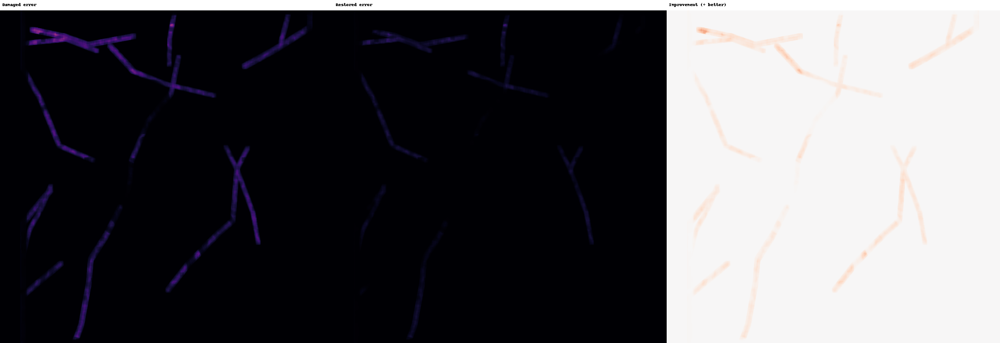

Map family: colour


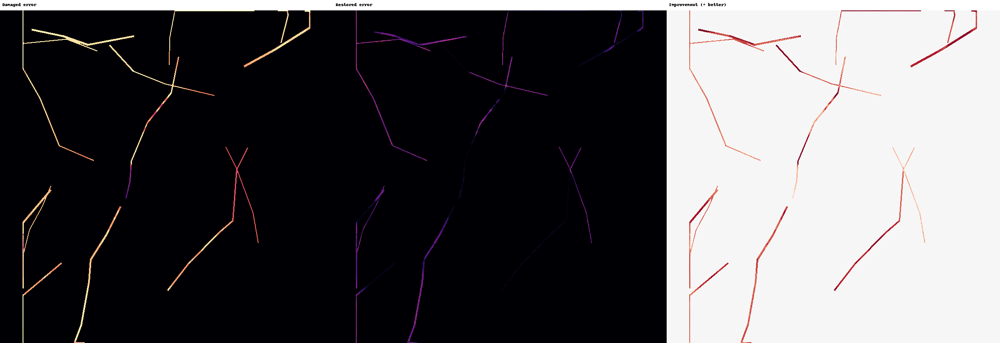

Map family: seam


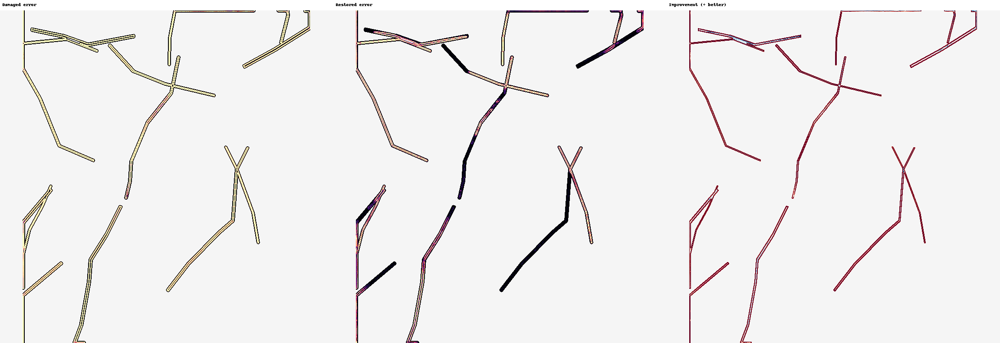

Notebook 19 owned local maps audited.
Audited map files: 150
Normalized owned records: 150
Owned-record schema passed: True
Map records accumulated so far: 540
Canonical files currently persisted: 412
Numerical uncertainty archive unchanged: True
Spatial metric table unchanged: True


In [32]:
# ---------------------------------------------------------------------------
# Reload the complete checkpoint
# ---------------------------------------------------------------------------

owned_local_checkpoint_df = pd.read_csv(
    owned_local_checkpoint_path,
    low_memory=False,
)

owned_local_checkpoint_lookup = {
    str(row["render_key"]): row
    for _, row in (
        owned_local_checkpoint_df.iterrows()
    )
}


# ---------------------------------------------------------------------------
# Audit every file and build normalized Notebook 19 records
# ---------------------------------------------------------------------------

owned_local_file_audit_records = []
owned_local_map_record_list = []

for asset_number, plan in enumerate(
    owned_local_plan_df.itertuples(
        index=False
    ),
    start=1,
):
    render_key = str(
        plan.render_key
    )

    checkpoint_row = (
        owned_local_checkpoint_lookup[
            render_key
        ]
    )

    target_path = (
        PROJECT_ROOT
        / Path(
            str(
                plan.relative_path
            )
        )
    )

    observed_sha256 = sha256_file(
        target_path
    )

    with Image.open(
        target_path
    ) as image:
        image.load()

        image_width = int(image.width)
        image_height = int(image.height)
        image_mode = str(image.mode)
        image_format = str(image.format)

        rgba_image = image.convert(
            "RGBA"
        )

        alpha_values = np.asarray(
            rgba_image.getchannel("A"),
            dtype=np.uint8,
        )

        alpha_minimum = int(
            alpha_values.min()
        )
        alpha_maximum = int(
            alpha_values.max()
        )

    uncertainty_group_id = str(
        plan.uncertainty_group_id
    )

    map_type = str(
        plan.map_type
    )

    scale = (
        canonical_local_display_scales[
            map_type
        ]
    )

    representative = (
        owned_local_candidate_lookup[
            uncertainty_group_id
        ]
    )

    owned_local_file_audit_records.append(
        {
            "render_key": render_key,
            "uncertainty_group_id": (
                uncertainty_group_id
            ),
            "candidate_id": str(
                plan.candidate_id
            ),
            "map_type": map_type,
            "relative_path": str(
                plan.relative_path
            ),
            "exists": target_path.is_file(),
            "checkpoint_status": str(
                checkpoint_row["status"]
            ),
            "relative_path_matches": (
                str(
                    checkpoint_row[
                        "relative_path"
                    ]
                )
                == str(
                    plan.relative_path
                )
            ),
            "fingerprint_matches": (
                str(
                    checkpoint_row[
                        "renderer_fingerprint"
                    ]
                )
                == str(
                    plan.renderer_fingerprint
                )
            ),
            "checksum_matches": (
                observed_sha256
                == str(
                    checkpoint_row[
                        "sha256"
                    ]
                )
            ),
            "size_bytes": int(
                target_path.stat().st_size
            ),
            "width": image_width,
            "height": image_height,
            "image_mode": image_mode,
            "format": image_format,
            "alpha_minimum": alpha_minimum,
            "alpha_maximum": alpha_maximum,
            "group_directory_matches": (
                target_path.parent.name
                == uncertainty_group_id
            ),
            "map_filename_matches": (
                target_path.stem
                == map_type
            ),
        }
    )

    owned_local_map_record_list.append(
        build_map_asset_record(
            representative,
            asset_kind="component_map",
            ownership="owned",
            map_type=map_type,
            relative_path=str(
                plan.relative_path
            ),
            status="passed",
            region_scope="full_image",
            selection_role=(
                "scratch_aware_"
                "representative_seed_2026"
            ),
            source_artifact_key=(
                "local_consistency.metrics"
            ),
            source_notebook=(
                "17_local_consistency_metrics"
            ),
            sha256=observed_sha256,
            size_bytes=int(
                target_path.stat().st_size
            ),
            width=image_width,
            height=image_height,
            image_mode=image_mode,
            format=image_format,
            cmap=(
                f"{scale['error_cmap']}|"
                f"{scale['improvement_cmap']}"
            ),
            vmin=-float(
                scale["vmax"]
            ),
            vmax=float(
                scale["vmax"]
            ),
            center=0.0,
            scale_scope=str(
                scale["scale_scope"]
            ),
            normalization_policy_id=(
                "notebook_17_global_"
                "family_scale"
            ),
            quantization_policy=(
                "RGBA uint8 presentation panel; "
                "metrics remain float"
            ),
            no_data_policy=(
                "configured neutral RGBA "
                "outside seam support"
            ),
            renderer_version=(
                LOCAL_CONSISTENCY_RENDERER_VERSION
            ),
        )
    )

    if (
        asset_number
        % 10
        == 0
        or asset_number
        == len(
            owned_local_plan_df
        )
    ):
        print(
            "Owned local-map audit:",
            f"{asset_number}/"
            f"{len(owned_local_plan_df)}",
            "latest:",
            render_key,
        )

owned_local_file_audit_df = (
    pd.DataFrame(
        owned_local_file_audit_records
    )
)

owned_local_map_records_df = (
    pd.DataFrame(
        owned_local_map_record_list
    )
)

owned_local_map_record_schema = (
    validate_dataframe(
        owned_local_map_records_df,
        SPATIAL_EXPLANATION_MAP_IMAGE_SCHEMA,
        allow_extra_columns=False,
    )
)

map_records_after_batch_7_df = (
    pd.concat(
        [
            map_records_after_batch_6_df,
            owned_local_map_records_df,
        ],
        ignore_index=True,
    )
)

map_records_after_batch_7_schema = (
    validate_dataframe(
        map_records_after_batch_7_df,
        SPATIAL_EXPLANATION_MAP_IMAGE_SCHEMA,
        allow_extra_columns=False,
    )
)


# ---------------------------------------------------------------------------
# Bounded inline review: p001 scratch-aware texture, colour, and seam
# ---------------------------------------------------------------------------

owned_local_preview_group_ids = (
    owned_local_candidates_df.loc[
        owned_local_candidates_df[
            "painting_id"
        ].astype(str).eq("p001"),
        "uncertainty_group_id",
    ]
    .astype(str)
    .unique()
    .tolist()
)

if len(
    owned_local_preview_group_ids
) != 1:
    raise ValueError(
        "Expected one p001 scratch-aware group for "
        "the bounded local-map preview."
    )

owned_local_preview_group_id = (
    owned_local_preview_group_ids[0]
)

owned_local_preview_plan_df = (
    owned_local_plan_df.loc[
        owned_local_plan_df[
            "uncertainty_group_id"
        ].astype(str).eq(
            owned_local_preview_group_id
        )
    ]
    .assign(
        map_type_rank=lambda frame: (
            frame[
                "map_type"
            ].map(map_type_rank)
        )
    )
    .sort_values(
        "map_type_rank",
        kind="stable",
    )
)

OWNED_LOCAL_PREVIEW_DISPLAYED = False

print(
    "Scratch-aware local-map preview:",
    owned_local_preview_group_id,
    "p001",
)

for preview in (
    owned_local_preview_plan_df.itertuples(
        index=False
    )
):
    preview_path = (
        PROJECT_ROOT
        / Path(
            str(
                preview.relative_path
            )
        )
    )

    print("Map family:", preview.map_type)

    with Image.open(
        preview_path
    ) as image:
        image.load()

        display(
            image.convert(
                "RGBA"
            ).copy()
        )

OWNED_LOCAL_PREVIEW_DISPLAYED = True


# ---------------------------------------------------------------------------
# Canonical scope and unchanged numerical evidence
# ---------------------------------------------------------------------------

canonical_files_after_batch_7 = sorted(
    to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    for path in (
        NOTEBOOK_OUTPUT_ROOT.rglob("*")
    )
    if (
        path.is_file()
        and "work"
        not in path.relative_to(
            NOTEBOOK_OUTPUT_ROOT
        ).parts
    )
)

expected_canonical_files_after_batch_7 = (
    sorted(
        [
            *expected_canonical_files_after_batch_6,
            *owned_local_plan_df[
                "relative_path"
            ].astype(str).tolist(),
        ]
    )
)

numeric_archive_unchanged = bool(
    sha256_file(
        OUTPUTS["numeric_maps"]
    )
    == numeric_archive_sha256
)

spatial_metrics_unchanged = bool(
    sha256_file(
        OUTPUTS[
            "spatial_explanations"
        ]
    )
    == spatial_metrics_sha256
)

print("Notebook 19 owned local maps audited.")
print(
    "Audited map files:",
    len(owned_local_file_audit_df),
)
print(
    "Normalized owned records:",
    len(owned_local_map_records_df),
)
print(
    "Owned-record schema passed:",
    owned_local_map_record_schema.passed,
)
print(
    "Map records accumulated so far:",
    len(map_records_after_batch_7_df),
)
print(
    "Canonical files currently persisted:",
    len(canonical_files_after_batch_7),
)
print(
    "Numerical uncertainty archive unchanged:",
    numeric_archive_unchanged,
)
print(
    "Spatial metric table unchanged:",
    spatial_metrics_unchanged,
)

In [33]:
# ---------------------------------------------------------------------------
# Batch 7 validation helper
# ---------------------------------------------------------------------------

VALIDATION_STAGE = (
    "batch_7_local_component_maps"
)


def add_batch_7_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=VALIDATION_STAGE,
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


# ---------------------------------------------------------------------------
# Scale and population contracts
# ---------------------------------------------------------------------------

scale_contract = {
    "map_types": sorted(
        local_scale_audit_df[
            "map_type"
        ].astype(str).tolist()
    ),
    "matching_vmax": int(
        local_scale_audit_df[
            "vmax_matches"
        ].astype(bool).sum()
    ),
    "matching_cmaps": int(
        local_scale_audit_df[
            "cmap_matches"
        ].astype(bool).sum()
    ),
    "matching_scale_scopes": int(
        local_scale_audit_df[
            "scale_scope_matches"
        ].astype(bool).sum()
    ),
}

add_batch_7_check(
    "notebook_17_display_scale_reproduction",
    "All local maps reuse Notebook 17's three canonical global display scales.",
    {
        "map_types": sorted(
            MAP_TYPES
        ),
        "matching_vmax": 3,
        "matching_cmaps": 3,
        "matching_scale_scopes": 3,
    },
    scale_contract,
    (
        scale_contract
        == {
            "map_types": sorted(
                MAP_TYPES
            ),
            "matching_vmax": 3,
            "matching_cmaps": 3,
            "matching_scale_scopes": 3,
        }
    ),
)

local_plan_contract = {
    "rows": len(
        owned_local_plan_df
    ),
    "groups": int(
        owned_local_plan_df[
            "uncertainty_group_id"
        ].nunique()
    ),
    "candidates": int(
        owned_local_plan_df[
            "candidate_id"
        ].nunique()
    ),
    "paintings": int(
        owned_local_plan_df[
            "painting_id"
        ].nunique()
    ),
    "map_type_counts": {
        str(key): int(value)
        for key, value in (
            owned_local_plan_df[
                "map_type"
            ]
            .value_counts()
            .sort_index()
            .items()
        )
    },
    "prompt_variants": sorted(
        owned_local_plan_df[
            "prompt_variant_id"
        ].astype(str).unique().tolist()
    ),
}

add_batch_7_check(
    "scratch_aware_local_map_plan",
    "The owned render plan contains three maps for each of 50 scratch-aware representatives.",
    {
        "rows": 150,
        "groups": 50,
        "candidates": 50,
        "paintings": 50,
        "map_type_counts": {
            "colour": 50,
            "seam": 50,
            "texture": 50,
        },
        "prompt_variants": [
            "p05_scratch_aware"
        ],
    },
    local_plan_contract,
    (
        local_plan_contract
        == {
            "rows": 150,
            "groups": 50,
            "candidates": 50,
            "paintings": 50,
            "map_type_counts": {
                "colour": 50,
                "seam": 50,
                "texture": 50,
            },
            "prompt_variants": [
                "p05_scratch_aware"
            ],
        }
    ),
)


# ---------------------------------------------------------------------------
# Execution and checkpoint contracts
# ---------------------------------------------------------------------------

local_execution_contract = {
    "newly_rendered": len(
        new_owned_local_render_keys
    ),
    "strictly_resumed": len(
        resumed_owned_local_render_keys
    ),
    "total": (
        len(new_owned_local_render_keys)
        + len(
            resumed_owned_local_render_keys
        )
    ),
    "overlap": len(
        set(
            new_owned_local_render_keys
        )
        & set(
            resumed_owned_local_render_keys
        )
    ),
}

add_batch_7_check(
    "owned_local_render_execution",
    "Every planned local map was either newly rendered or strictly resumed.",
    {
        "total": 150,
        "overlap": 0,
    },
    local_execution_contract,
    (
        local_execution_contract[
            "total"
        ]
        == 150
        and local_execution_contract[
            "overlap"
        ]
        == 0
    ),
)

local_checkpoint_contract = {
    "rows": len(
        owned_local_checkpoint_df
    ),
    "unique_render_keys": int(
        owned_local_checkpoint_df[
            "render_key"
        ].nunique()
    ),
    "completed_rows": int(
        owned_local_checkpoint_df[
            "status"
        ].astype(str).eq(
            "completed"
        ).sum()
    ),
    "unique_paths": int(
        owned_local_checkpoint_df[
            "relative_path"
        ].nunique()
    ),
}

add_batch_7_check(
    "owned_local_checkpoint_contract",
    "The checkpoint covers every owned local map exactly once.",
    {
        "rows": 150,
        "unique_render_keys": 150,
        "completed_rows": 150,
        "unique_paths": 150,
    },
    local_checkpoint_contract,
    (
        local_checkpoint_contract
        == {
            "rows": 150,
            "unique_render_keys": 150,
            "completed_rows": 150,
            "unique_paths": 150,
        }
    ),
)


# ---------------------------------------------------------------------------
# File and path integrity
# ---------------------------------------------------------------------------

local_file_contract = {
    "rows": len(
        owned_local_file_audit_df
    ),
    "existing": int(
        owned_local_file_audit_df[
            "exists"
        ].astype(bool).sum()
    ),
    "completed": int(
        owned_local_file_audit_df[
            "checkpoint_status"
        ].astype(str).eq(
            "completed"
        ).sum()
    ),
    "path_matches": int(
        owned_local_file_audit_df[
            "relative_path_matches"
        ].astype(bool).sum()
    ),
    "fingerprint_matches": int(
        owned_local_file_audit_df[
            "fingerprint_matches"
        ].astype(bool).sum()
    ),
    "checksum_matches": int(
        owned_local_file_audit_df[
            "checksum_matches"
        ].astype(bool).sum()
    ),
    "rgba_png": int(
        (
            owned_local_file_audit_df[
                "image_mode"
            ].astype(str).eq("RGBA")
            & owned_local_file_audit_df[
                "format"
            ].astype(str).eq("PNG")
        ).sum()
    ),
    "fully_opaque": int(
        (
            owned_local_file_audit_df[
                "alpha_minimum"
            ].eq(255)
            & owned_local_file_audit_df[
                "alpha_maximum"
            ].eq(255)
        ).sum()
    ),
    "positive_size": int(
        owned_local_file_audit_df[
            "size_bytes"
        ].gt(0).sum()
    ),
}

add_batch_7_check(
    "owned_local_file_integrity",
    "All owned local maps are valid, checksummed, opaque RGBA PNGs.",
    {
        "rows": 150,
        "existing": 150,
        "completed": 150,
        "path_matches": 150,
        "fingerprint_matches": 150,
        "checksum_matches": 150,
        "rgba_png": 150,
        "fully_opaque": 150,
        "positive_size": 150,
    },
    local_file_contract,
    (
        local_file_contract
        == {
            "rows": 150,
            "existing": 150,
            "completed": 150,
            "path_matches": 150,
            "fingerprint_matches": 150,
            "checksum_matches": 150,
            "rgba_png": 150,
            "fully_opaque": 150,
            "positive_size": 150,
        }
    ),
)

local_path_contract = {
    "group_directories": int(
        owned_local_file_audit_df[
            "group_directory_matches"
        ].astype(bool).sum()
    ),
    "map_filenames": int(
        owned_local_file_audit_df[
            "map_filename_matches"
        ].astype(bool).sum()
    ),
    "unique_paths": int(
        owned_local_file_audit_df[
            "relative_path"
        ].nunique()
    ),
}

add_batch_7_check(
    "prompt_safe_local_map_paths",
    "Owned local maps use uncertainty-group directories and compact family filenames.",
    {
        "group_directories": 150,
        "map_filenames": 150,
        "unique_paths": 150,
    },
    local_path_contract,
    (
        local_path_contract
        == {
            "group_directories": 150,
            "map_filenames": 150,
            "unique_paths": 150,
        }
    ),
)


# ---------------------------------------------------------------------------
# Normalized record integrity
# ---------------------------------------------------------------------------

owned_record_contract = {
    "rows": len(
        owned_local_map_records_df
    ),
    "unique_asset_ids": int(
        owned_local_map_records_df[
            "map_asset_id"
        ].nunique()
    ),
    "schema_passed": (
        owned_local_map_record_schema.passed
    ),
    "asset_kinds": sorted(
        owned_local_map_records_df[
            "asset_kind"
        ].astype(str).unique().tolist()
    ),
    "ownership": sorted(
        owned_local_map_records_df[
            "ownership"
        ].astype(str).unique().tolist()
    ),
    "renderer_versions": sorted(
        owned_local_map_records_df[
            "renderer_version"
        ].astype(str).unique().tolist()
    ),
    "source_notebooks": sorted(
        owned_local_map_records_df[
            "source_notebook"
        ].astype(str).unique().tolist()
    ),
}

add_batch_7_check(
    "owned_local_normalized_records",
    "Every owned local map has one schema-valid record with explicit provenance.",
    {
        "rows": 150,
        "unique_asset_ids": 150,
        "schema_passed": True,
        "asset_kinds": [
            "component_map"
        ],
        "ownership": ["owned"],
        "renderer_versions": [
            LOCAL_CONSISTENCY_RENDERER_VERSION
        ],
        "source_notebooks": [
            "17_local_consistency_metrics"
        ],
    },
    owned_record_contract,
    (
        owned_record_contract
        == {
            "rows": 150,
            "unique_asset_ids": 150,
            "schema_passed": True,
            "asset_kinds": [
                "component_map"
            ],
            "ownership": ["owned"],
            "renderer_versions": [
                LOCAL_CONSISTENCY_RENDERER_VERSION
            ],
            "source_notebooks": [
                "17_local_consistency_metrics"
            ],
        }
    ),
)

owned_scale_record_mismatches = 0

for map_type in MAP_TYPES:
    map_rows = (
        owned_local_map_records_df.loc[
            owned_local_map_records_df[
                "map_type"
            ].astype(str).eq(
                map_type
            )
        ]
    )

    expected_vmax = float(
        canonical_local_display_scales[
            map_type
        ]["vmax"]
    )

    observed_vmax = pd.to_numeric(
        map_rows["vmax"],
        errors="raise",
    ).to_numpy(dtype=float)

    observed_vmin = pd.to_numeric(
        map_rows["vmin"],
        errors="raise",
    ).to_numpy(dtype=float)

    owned_scale_record_mismatches += int(
        (
            ~np.isclose(
                observed_vmax,
                expected_vmax,
                rtol=1e-12,
                atol=1e-12,
            )
        ).sum()
    )

    owned_scale_record_mismatches += int(
        (
            ~np.isclose(
                observed_vmin,
                -expected_vmax,
                rtol=1e-12,
                atol=1e-12,
            )
        ).sum()
    )

add_batch_7_check(
    "owned_local_scale_records",
    "Every normalized local-map record retains its Notebook 17 global family scale.",
    0,
    owned_scale_record_mismatches,
    owned_scale_record_mismatches == 0,
)

accumulated_record_contract = {
    "rows": len(
        map_records_after_batch_7_df
    ),
    "unique_asset_ids": int(
        map_records_after_batch_7_df[
            "map_asset_id"
        ].nunique()
    ),
    "schema_passed": (
        map_records_after_batch_7_schema.passed
    ),
}

add_batch_7_check(
    "batch_7_accumulated_map_records",
    "Numeric, uncertainty-render, and owned-local records remain unique and schema-valid.",
    {
        "rows": 540,
        "unique_asset_ids": 540,
        "schema_passed": True,
    },
    accumulated_record_contract,
    (
        accumulated_record_contract
        == {
            "rows": 540,
            "unique_asset_ids": 540,
            "schema_passed": True,
        }
    ),
)


# ---------------------------------------------------------------------------
# Scientific non-mutation, scope, and preview
# ---------------------------------------------------------------------------

add_batch_7_check(
    "local_maps_are_presentation_only",
    "Rendering local component maps does not alter either canonical numerical output.",
    {
        "numeric_archive_unchanged": True,
        "spatial_metrics_unchanged": True,
        "spatial_metric_rows": 780,
    },
    {
        "numeric_archive_unchanged": (
            numeric_archive_unchanged
        ),
        "spatial_metrics_unchanged": (
            spatial_metrics_unchanged
        ),
        "spatial_metric_rows": len(
            spatial_explanations_full_df
        ),
    },
    (
        numeric_archive_unchanged
        and spatial_metrics_unchanged
        and len(
            spatial_explanations_full_df
        ) == 780
    ),
)

add_batch_7_check(
    "batch_7_canonical_file_scope",
    "The canonical scope contains the prior 262 files plus exactly 150 owned local maps.",
    expected_canonical_files_after_batch_7,
    canonical_files_after_batch_7,
    (
        canonical_files_after_batch_7
        == expected_canonical_files_after_batch_7
        and len(
            canonical_files_after_batch_7
        ) == 412
    ),
)

add_batch_7_check(
    "owned_local_preview",
    "The p001 scratch-aware texture, colour, and seam maps were displayed inline.",
    True,
    OWNED_LOCAL_PREVIEW_DISPLAYED,
    OWNED_LOCAL_PREVIEW_DISPLAYED,
)

print("Notebook 19 Batch 7 checks assembled.")
print(
    "Batch 7 checks added:",
    int(
        VALIDATION.to_dataframe()[
            "validation_stage"
        ].eq(
            VALIDATION_STAGE
        ).sum()
    ),
)

Notebook 19 Batch 7 checks assembled.
Batch 7 checks added: 12


In [34]:
# ---------------------------------------------------------------------------
# Batch 7 review tables and gate
# ---------------------------------------------------------------------------

all_validation_df = (
    VALIDATION.to_dataframe()
)

batch_7_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq(
            VALIDATION_STAGE
        )
    ]
    .reset_index(drop=True)
)

owned_local_summary_df = (
    owned_local_file_audit_df
    .groupby(
        "map_type",
        as_index=False,
    )
    .agg(
        files=("render_key", "size"),
        groups=(
            "uncertainty_group_id",
            "nunique",
        ),
        candidates=(
            "candidate_id",
            "nunique",
        ),
        total_size_bytes=(
            "size_bytes",
            "sum",
        ),
        minimum_width=("width", "min"),
        maximum_width=("width", "max"),
        minimum_height=("height", "min"),
        maximum_height=("height", "max"),
        checksum_matches=(
            "checksum_matches",
            "sum",
        ),
    )
    .sort_values(
        "map_type",
        kind="stable",
    )
    .reset_index(drop=True)
)

owned_local_execution_df = (
    pd.DataFrame(
        [
            {
                "execution_outcome": (
                    "newly_rendered"
                ),
                "assets": len(
                    new_owned_local_render_keys
                ),
            },
            {
                "execution_outcome": (
                    "strictly_resumed"
                ),
                "assets": len(
                    resumed_owned_local_render_keys
                ),
            },
        ]
    )
)

display(local_scale_audit_df)
display(owned_local_summary_df)
display(owned_local_execution_df)
display(owned_local_checkpoint_df.head(20))
display(owned_local_file_audit_df.head(20))
display(owned_local_map_records_df.head(20))
display(batch_7_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 19 Batch 7 summary")
print("---------------------------")
print(
    "Batch 7 validation checks:",
    len(batch_7_validation_df),
)
print(
    "Blocking failures across Batches 1–7:",
    len(VALIDATION.blocking_failures),
)
print(
    "Scratch-aware representatives:",
    len(owned_local_candidates_df),
)
print(
    "Owned texture maps:",
    int(
        owned_local_map_records_df[
            "map_type"
        ].astype(str).eq(
            "texture"
        ).sum()
    ),
)
print(
    "Owned colour maps:",
    int(
        owned_local_map_records_df[
            "map_type"
        ].astype(str).eq(
            "colour"
        ).sum()
    ),
)
print(
    "Owned seam maps:",
    int(
        owned_local_map_records_df[
            "map_type"
        ].astype(str).eq(
            "seam"
        ).sum()
    ),
)
print(
    "Newly rendered assets:",
    len(new_owned_local_render_keys),
)
print(
    "Strictly resumed assets:",
    len(resumed_owned_local_render_keys),
)
print(
    "Accumulated map records:",
    len(map_records_after_batch_7_df),
)
print(
    "Canonical files currently persisted:",
    len(canonical_files_after_batch_7),
)
print(
    "Preview displayed:",
    OWNED_LOCAL_PREVIEW_DISPLAYED,
)
print(
    "Batch 7 passed: all 150 missing scratch-aware "
    "texture, colour, and seam presentation maps were "
    "rendered or strictly resumed using Notebook 17's "
    "unchanged helper, configuration, and global scales, "
    "without altering canonical numerical evidence."
)

,map_type,computed_vmax,reference_unique_vmax_count,reference_vmax,maximum_absolute_difference,expected_cmap,reference_cmaps,cmap_matches,scale_scope_matches,vmax_matches
0,texture,274.980882,1,274.980882,0.0,magma|RdBu_r,magma|RdBu_r,True,True,True
1,colour,100.000000,1,100.000000,0.0,magma|RdBu_r,magma|RdBu_r,True,True,True
2,seam,0.174858,1,0.174858,0.0,magma|RdBu_r,magma|RdBu_r,True,True,True


,map_type,files,groups,candidates,total_size_bytes,minimum_width,maximum_width,minimum_height,maximum_height,checksum_matches
0,colour,50,50,50,5842977,2304,2304,792,792,50
1,seam,50,50,50,9511962,2304,2304,792,792,50
2,texture,50,50,50,5177268,2304,2304,792,792,50


,execution_outcome,assets
0,newly_rendered,150
1,strictly_resumed,0


,render_key,uncertainty_group_id,candidate_id,map_type,renderer_fingerprint,relative_path,sha256,size_bytes,width,height,image_mode,format,completed_at_utc,status,issue
0,ug_05092f68b21a871cb8|local_component|colour,ug_05092f68b21a871cb8,sd15__p05__s2026__5c49321db0c7,colour,4e243f88b6c8326e91bb1c639587dc2108ae04b87286cd...,outputs/19_uncertainty_and_spatial_explanation...,1dccb0069be90f6cabeddda1aca99024bfd3a94aba2ca0...,111977,2304,792,RGBA,PNG,2026-08-30T16:50:40.392804Z,completed,NaN
1,ug_05092f68b21a871cb8|local_component|seam,ug_05092f68b21a871cb8,sd15__p05__s2026__5c49321db0c7,seam,3dfd81fe3c89e2963f9b6a174b4f09e50c8c8d73de73d2...,outputs/19_uncertainty_and_spatial_explanation...,d03604aba82983f3339337d0fba178ea0dbe8bc24bb955...,194552,2304,792,RGBA,PNG,2026-08-30T16:50:41.181281Z,completed,NaN
2,ug_05092f68b21a871cb8|local_component|texture,ug_05092f68b21a871cb8,sd15__p05__s2026__5c49321db0c7,texture,1b8e3e2df24d29f7609eb4bf9f9874204794300587338b...,outputs/19_uncertainty_and_spatial_explanation...,61354aea39871af5f06240af8bded7ba31a674426f0fea...,31202,2304,792,RGBA,PNG,2026-08-30T16:50:39.825385Z,completed,NaN
3,ug_0c61f68bc3a27d72e2|local_component|colour,ug_0c61f68bc3a27d72e2,sd15__p05__s2026__b31444e4ca99,colour,070ccdc4ee1b660c394210db22e8b898932518df5970cd...,outputs/19_uncertainty_and_spatial_explanation...,c77153802bfd7064070383c7ffad3906e1b9bb3a968bae...,122318,2304,792,RGBA,PNG,2026-08-30T16:51:12.144919Z,completed,NaN
4,ug_0c61f68bc3a27d72e2|local_component|seam,ug_0c61f68bc3a27d72e2,sd15__p05__s2026__b31444e4ca99,seam,b2ecf31cda625077398432f76502b20497b6d17f88e7ce...,outputs/19_uncertainty_and_spatial_explanation...,4ce08e7f61ba3e8f7364b27ba60740966461a14ab7a419...,186293,2304,792,RGBA,PNG,2026-08-30T16:51:13.123882Z,completed,NaN
5,ug_0c61f68bc3a27d72e2|local_component|texture,ug_0c61f68bc3a27d72e2,sd15__p05__s2026__b31444e4ca99,texture,03b695f82c344ff7ef3905d46f7d3402942905aec0a324...,outputs/19_uncertainty_and_spatial_explanation...,ea0337033a85df5edf71c757d24150f27268393c65ad58...,115318,2304,792,RGBA,PNG,2026-08-30T16:51:11.535450Z,completed,NaN
6,ug_10182275b8ba22a909|local_component|colour,ug_10182275b8ba22a909,sd15__p05__s2026__e4bbe13d88d6,colour,ced17f9d22f903f9e9d0c27636ceef85979450da89ba94...,outputs/19_uncertainty_and_spatial_explanation...,3ed5aef6cbb291748aa70fc67fb832f1d9417735a0d463...,84900,2304,792,RGBA,PNG,2026-08-30T16:51:53.602701Z,completed,NaN
7,ug_10182275b8ba22a909|local_component|seam,ug_10182275b8ba22a909,sd15__p05__s2026__e4bbe13d88d6,seam,96a43b4585582e67c430e7c46ccb338f19c6849cb947bc...,outputs/19_uncertainty_and_spatial_explanation...,426291b2d35e0fb9323d1ac8500ee8625a992b0426cd46...,120497,2304,792,RGBA,PNG,2026-08-30T16:51:54.291714Z,completed,NaN
8,ug_10182275b8ba22a909|local_component|texture,ug_10182275b8ba22a909,sd15__p05__s2026__e4bbe13d88d6,texture,f688e448456ad8fc799a09313504b9fc6b95be26167f5a...,outputs/19_uncertainty_and_spatial_explanation...,af1815214c30e7cbfffaf5da31e75353cfe3aa0b878945...,94820,2304,792,RGBA,PNG,2026-08-30T16:51:53.107762Z,completed,NaN
9,ug_1642bb6a46df7fb975|local_component|colour,ug_1642bb6a46df7fb975,sd15__p05__s2026__0ce6c26e4c36,colour,bb78bccced3f3d14721abb18770fcc360695d9aa69b68e...,outputs/19_uncertainty_and_spatial_explanation...,db372a3abb10f90bd72ad1e6d1a804cacc4b1992ea2702...,150984,2304,792,RGBA,PNG,2026-08-30T16:50:55.369335Z,completed,NaN


,render_key,uncertainty_group_id,candidate_id,map_type,relative_path,exists,checkpoint_status,relative_path_matches,fingerprint_matches,checksum_matches,size_bytes,width,height,image_mode,format,alpha_minimum,alpha_maximum,group_directory_matches,map_filename_matches
0,ug_7863cdf715d7fc4981|local_component|texture,ug_7863cdf715d7fc4981,sd15__p05__s2026__b0c01d8159c0,texture,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,182157,2304,792,RGBA,PNG,255,255,True,True
1,ug_7863cdf715d7fc4981|local_component|colour,ug_7863cdf715d7fc4981,sd15__p05__s2026__b0c01d8159c0,colour,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,126014,2304,792,RGBA,PNG,255,255,True,True
2,ug_7863cdf715d7fc4981|local_component|seam,ug_7863cdf715d7fc4981,sd15__p05__s2026__b0c01d8159c0,seam,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,180952,2304,792,RGBA,PNG,255,255,True,True
3,ug_72e2c41a819e63cd6b|local_component|texture,ug_72e2c41a819e63cd6b,sd15__p05__s2026__26d3935e7133,texture,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,132413,2304,792,RGBA,PNG,255,255,True,True
4,ug_72e2c41a819e63cd6b|local_component|colour,ug_72e2c41a819e63cd6b,sd15__p05__s2026__26d3935e7133,colour,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,84392,2304,792,RGBA,PNG,255,255,True,True
5,ug_72e2c41a819e63cd6b|local_component|seam,ug_72e2c41a819e63cd6b,sd15__p05__s2026__26d3935e7133,seam,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,127902,2304,792,RGBA,PNG,255,255,True,True
6,ug_adb3728b31364bc2ac|local_component|texture,ug_adb3728b31364bc2ac,sd15__p05__s2026__dc2594970bdb,texture,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,156091,2304,792,RGBA,PNG,255,255,True,True
7,ug_adb3728b31364bc2ac|local_component|colour,ug_adb3728b31364bc2ac,sd15__p05__s2026__dc2594970bdb,colour,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,114405,2304,792,RGBA,PNG,255,255,True,True
8,ug_adb3728b31364bc2ac|local_component|seam,ug_adb3728b31364bc2ac,sd15__p05__s2026__dc2594970bdb,seam,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,169132,2304,792,RGBA,PNG,255,255,True,True
9,ug_d78bf5433741367943|local_component|texture,ug_d78bf5433741367943,sd15__p05__s2026__be19ce2e1d0a,texture,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,62045,2304,792,RGBA,PNG,255,255,True,True


,map_asset_id,asset_kind,ownership,uncertainty_group_id,case_id,candidate_id,model_id,painting_id,prompt_variant_id,map_type,...,vmin,vmax,center,scale_scope,normalization_policy_id,quantization_policy,no_data_policy,renderer_version,status,issue
0,sxa_d294671b852079714c06,component_map,owned,ug_7863cdf715d7fc4981,canonical__p001__scratch_thin,sd15__p05__s2026__b0c01d8159c0,stable_diffusion_inpainting,p001,p05_scratch_aware,texture,...,-274.980882,274.980882,0.0,global candidate metric 99th percentile; sourc...,notebook_17_global_family_scale,RGBA uint8 presentation panel; metrics remain ...,configured neutral RGBA outside seam support,local_consistency_map_renderer.v1,passed,
1,sxa_19cc02078cc94dbc2bae,component_map,owned,ug_7863cdf715d7fc4981,canonical__p001__scratch_thin,sd15__p05__s2026__b0c01d8159c0,stable_diffusion_inpainting,p001,p05_scratch_aware,colour,...,-100.000000,100.000000,0.0,global candidate metric 99th percentile; sourc...,notebook_17_global_family_scale,RGBA uint8 presentation panel; metrics remain ...,configured neutral RGBA outside seam support,local_consistency_map_renderer.v1,passed,
2,sxa_8cb2f3d82d5b760c3aad,component_map,owned,ug_7863cdf715d7fc4981,canonical__p001__scratch_thin,sd15__p05__s2026__b0c01d8159c0,stable_diffusion_inpainting,p001,p05_scratch_aware,seam,...,-0.174858,0.174858,0.0,global candidate metric 99th percentile; sourc...,notebook_17_global_family_scale,RGBA uint8 presentation panel; metrics remain ...,configured neutral RGBA outside seam support,local_consistency_map_renderer.v1,passed,
3,sxa_a1eb8ba2949badce7130,component_map,owned,ug_72e2c41a819e63cd6b,canonical__p002__scratch_thin,sd15__p05__s2026__26d3935e7133,stable_diffusion_inpainting,p002,p05_scratch_aware,texture,...,-274.980882,274.980882,0.0,global candidate metric 99th percentile; sourc...,notebook_17_global_family_scale,RGBA uint8 presentation panel; metrics remain ...,configured neutral RGBA outside seam support,local_consistency_map_renderer.v1,passed,
4,sxa_9e0a449cf0f073382ebe,component_map,owned,ug_72e2c41a819e63cd6b,canonical__p002__scratch_thin,sd15__p05__s2026__26d3935e7133,stable_diffusion_inpainting,p002,p05_scratch_aware,colour,...,-100.000000,100.000000,0.0,global candidate metric 99th percentile; sourc...,notebook_17_global_family_scale,RGBA uint8 presentation panel; metrics remain ...,configured neutral RGBA outside seam support,local_consistency_map_renderer.v1,passed,
5,sxa_f4c72f3fbe2c96fec550,component_map,owned,ug_72e2c41a819e63cd6b,canonical__p002__scratch_thin,sd15__p05__s2026__26d3935e7133,stable_diffusion_inpainting,p002,p05_scratch_aware,seam,...,-0.174858,0.174858,0.0,global candidate metric 99th percentile; sourc...,notebook_17_global_family_scale,RGBA uint8 presentation panel; metrics remain ...,configured neutral RGBA outside seam support,local_consistency_map_renderer.v1,passed,
6,sxa_717476f0522ed4f1d45d,component_map,owned,ug_adb3728b31364bc2ac,canonical__p003__scratch_thin,sd15__p05__s2026__dc2594970bdb,stable_diffusion_inpainting,p003,p05_scratch_aware,texture,...,-274.980882,274.980882,0.0,global candidate metric 99th percentile; sourc...,notebook_17_global_family_scale,RGBA uint8 presentation panel; metrics remain ...,configured neutral RGBA outside seam support,local_consistency_map_renderer.v1,passed,
7,sxa_57e3493e800f97e279d2,component_map,owned,ug_adb3728b31364bc2ac,canonical__p003__scratch_thin,sd15__p05__s2026__dc2594970bdb,stable_diffusion_inpainting,p003,p05_scratch_aware,colour,...,-100.000000,100.000000,0.0,global candidate metric 99th percentile; sourc...,notebook_17_global_family_scale,RGBA uint8 presentation panel; metrics remain ...,configured neutral RGBA outside seam support,local_consistency_map_renderer.v1,passed,
8,sxa_5e110296997a2da25a82,component_map,owned,ug_adb3728b31364bc2ac,canonical__p003__scratch_thin,sd15__p05__s2026__dc2594970bdb,stable_diffusion_inpainting,p003,p05_scratch_aware,seam,...,-0.174858,0.174858,0.0,global candidate metric 99th percentile; sour

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_7_local_component_maps,notebook_17_display_scale_reproduction,All local maps reuse Notebook 17's three canon...,blocking,"{""map_types"": [""colour"", ""seam"", ""texture""], ""...","{""map_types"": [""colour"", ""seam"", ""texture""], ""...",True,
1,batch_7_local_component_maps,scratch_aware_local_map_plan,The owned render plan contains three maps for ...,blocking,"{""candidates"": 50, ""groups"": 50, ""map_type_cou...","{""candidates"": 50, ""groups"": 50, ""map_type_cou...",True,
2,batch_7_local_component_maps,owned_local_render_execution,Every planned local map was either newly rende...,blocking,"{""overlap"": 0, ""total"": 150}","{""newly_rendered"": 150, ""overlap"": 0, ""strictl...",True,
3,batch_7_local_component_maps,owned_local_checkpoint_contract,The checkpoint covers every owned local map ex...,blocking,"{""completed_rows"": 150, ""rows"": 150, ""unique_p...","{""completed_rows"": 150, ""rows"": 150, ""unique_p...",True,
4,batch_7_local_component_maps,owned_local_file_integrity,"All owned local maps are valid, checksummed, o...",blocking,"{""checksum_matches"": 150, ""completed"": 150, ""e...","{""checksum_matches"": 150, ""completed"": 150, ""e...",True,
5,batch_7_local_component_maps,prompt_safe_local_map_paths,Owned local maps use uncertainty-group directo...,blocking,"{""group_directories"": 150, ""map_filenames"": 15...","{""group_directories"": 150, ""map_filenames"": 15...",True,
6,batch_7_local_component_maps,owned_local_normalized_records,Every owned local map has one schema-valid rec...,blocking,"{""asset_kinds"": [""component_map""], ""ownership""...","{""asset_kinds"": [""component_map""], ""ownership""...",True,
7,batch_7_local_component_maps,owned_local_scale_records,Every normalized local-map record retains its ...,blocking,0,0,True,
8,batch_7_local_component_maps,batch_7_accumulated_map_records,"Numeric, uncertainty-render, and owned-local r...",blocking,"{""rows"": 540, ""schema_passed"": true, ""unique_a...","{""rows"": 540, ""schema_passed"": true, ""unique_a...",True,
9,batch_7_local_component_maps,local_maps_are_presentation_only,Rendering local component maps does not alter ...,blocking,"{""numeric_archive_unchanged"": true, ""spatial_m...","{""numeric_archive_unchanged"": true, ""spatial_m...",True,


Notebook 19 Batch 7 summary
---------------------------
Batch 7 validation checks: 12
Blocking failures across Batches 1–7: 0
Scratch-aware representatives: 50
Owned texture maps: 50
Owned colour maps: 50
Owned seam maps: 50
Newly rendered assets: 150
Strictly resumed assets: 0
Accumulated map records: 540
Canonical files currently persisted: 412
Preview displayed: True
Batch 7 passed: all 150 missing scratch-aware texture, colour, and seam presentation maps were rendered or strictly resumed using Notebook 17's unchanged helper, configuration, and global scales, without altering canonical numerical evidence.


## Batch 8 — Auditable representative selection and combined explanation panels

This batch applies the three approved category-balanced selection rules:

1. the generic case nearest each category's median masked uncertainty;
2. the generic case with the greatest boundary-to-mask uncertainty concentration;
3. the scratch case with the greatest absolute generic-versus-scratch-aware
   masked-uncertainty difference.

One case is selected per rule and artwork category, producing exactly 15 panels.

Generic panels combine uncertainty, geometry, absolute-error,
signed-improvement, texture, colour, and seam evidence for one representative
candidate. Prompt-difference panels place the same seven evidence families for
the generic and scratch-aware arms side by side.

Every component retains its own declared scale and interpretation. The panels
do not create a combined explanation score, calibrated confidence estimate, or
final trustworthiness decision.

In [35]:
from restoration_eval.spatial_explanations import (
    render_selected_explanation_panel,
    select_representative_explanations,
)


# ---------------------------------------------------------------------------
# Deterministic 15-panel selection
# ---------------------------------------------------------------------------

selected_explanations_df = (
    select_representative_explanations(
        spatial_explanations_full_df,
        config=SPATIAL_CONFIG_DOCUMENT,
    )
)

repeated_selected_explanations_df = (
    select_representative_explanations(
        spatial_explanations_full_df,
        config=SPATIAL_CONFIG_DOCUMENT,
    )
)

selection_comparison_columns = [
    "selection_role",
    "selection_metric",
    "selection_value",
    "category",
    "case_id",
    "painting_id",
    "uncertainty_group_id",
    "prompt_variant_id",
    "representative_candidate_id",
]

selection_is_deterministic = bool(
    selected_explanations_df[
        selection_comparison_columns
    ].equals(
        repeated_selected_explanations_df[
            selection_comparison_columns
        ]
    )
)


# ---------------------------------------------------------------------------
# Independent selection-support tables
# ---------------------------------------------------------------------------

selection_index_columns = [
    "uncertainty_group_id",
    "case_id",
    "painting_id",
    "category",
    "case_label",
    "prompt_variant_id",
    "representative_candidate_id",
]

mean_spatial_table_df = (
    spatial_explanations_full_df
    .pivot_table(
        index=selection_index_columns,
        columns="region_id",
        values="mean_value",
        aggfunc="first",
    )
    .reset_index()
)

generic_prompt_id = (
    POPULATION_POLICY[
        "generic_prompt_variant_id"
    ]
)

scratch_aware_prompt_id = (
    POPULATION_POLICY[
        "scratch_aware_prompt_variant_id"
    ]
)

generic_spatial_table_df = (
    mean_spatial_table_df.loc[
        mean_spatial_table_df[
            "prompt_variant_id"
        ].astype(str).eq(
            generic_prompt_id
        )
    ]
    .copy()
)

generic_spatial_table_df[
    "boundary_concentration"
] = (
    generic_spatial_table_df[
        "boundary_ring"
    ]
    / np.maximum(
        generic_spatial_table_df[
            "masked_region"
        ],
        np.finfo(float).eps,
    )
)

scratch_prompt_pairs_df = (
    mean_spatial_table_df.loc[
        mean_spatial_table_df[
            "case_label"
        ].astype(str).eq(
            "scratch_thin"
        )
        & mean_spatial_table_df[
            "prompt_variant_id"
        ].astype(str).isin(
            [
                generic_prompt_id,
                scratch_aware_prompt_id,
            ]
        )
    ]
    .pivot_table(
        index=[
            "case_id",
            "painting_id",
            "category",
            "case_label",
        ],
        columns="prompt_variant_id",
        values="masked_region",
        aggfunc="first",
    )
    .reset_index()
)

scratch_prompt_pairs_df[
    "aware_minus_generic_masked_uncertainty"
] = (
    scratch_prompt_pairs_df[
        scratch_aware_prompt_id
    ]
    - scratch_prompt_pairs_df[
        generic_prompt_id
    ]
)

scratch_prompt_pairs_df[
    "absolute_prompt_difference"
] = (
    scratch_prompt_pairs_df[
        "aware_minus_generic_masked_uncertainty"
    ].abs()
)

masked_uncertainty_summary_df = (
    mean_spatial_table_df
    .groupby(
        [
            "category",
            "prompt_variant_id",
        ],
        as_index=False,
    )
    .agg(
        groups=(
            "uncertainty_group_id",
            "size",
        ),
        mean_masked_uncertainty=(
            "masked_region",
            "mean",
        ),
        median_masked_uncertainty=(
            "masked_region",
            "median",
        ),
        maximum_masked_uncertainty=(
            "masked_region",
            "max",
        ),
    )
    .sort_values(
        [
            "category",
            "prompt_variant_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

prompt_difference_summary_df = (
    scratch_prompt_pairs_df
    .groupby(
        "category",
        as_index=False,
    )
    .agg(
        paintings=("painting_id", "size"),
        mean_signed_difference=(
            "aware_minus_generic_masked_uncertainty",
            "mean",
        ),
        median_signed_difference=(
            "aware_minus_generic_masked_uncertainty",
            "median",
        ),
        mean_absolute_difference=(
            "absolute_prompt_difference",
            "mean",
        ),
        maximum_absolute_difference=(
            "absolute_prompt_difference",
            "max",
        ),
    )
    .sort_values(
        "category",
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Independently reproduce every rule winner
# ---------------------------------------------------------------------------

selection_rule_audit_records = []

for selection in (
    selected_explanations_df.itertuples(
        index=False
    )
):
    category = str(selection.category)
    role = str(selection.selection_role)

    if (
        role
        == "category_median_generic_masked_uncertainty"
    ):
        candidates = (
            generic_spatial_table_df.loc[
                generic_spatial_table_df[
                    "category"
                ].astype(str).eq(
                    category
                )
            ]
            .copy()
        )

        category_median = float(
            candidates[
                "masked_region"
            ].median()
        )

        candidates[
            "independent_selection_value"
        ] = (
            candidates[
                "masked_region"
            ]
            - category_median
        ).abs()

        expected = (
            candidates
            .sort_values(
                [
                    "independent_selection_value",
                    "case_id",
                    "uncertainty_group_id",
                ],
                kind="stable",
            )
            .iloc[0]
        )

    elif (
        role
        == "category_max_generic_boundary_concentration"
    ):
        candidates = (
            generic_spatial_table_df.loc[
                generic_spatial_table_df[
                    "category"
                ].astype(str).eq(
                    category
                )
            ]
            .copy()
        )

        candidates[
            "independent_selection_value"
        ] = (
            candidates[
                "boundary_concentration"
            ]
        )

        expected = (
            candidates
            .sort_values(
                [
                    "independent_selection_value",
                    "case_id",
                    "uncertainty_group_id",
                ],
                ascending=[
                    False,
                    True,
                    True,
                ],
                kind="stable",
            )
            .iloc[0]
        )

    elif (
        role
        == "category_max_absolute_scratch_prompt_difference"
    ):
        candidates = (
            scratch_prompt_pairs_df.loc[
                scratch_prompt_pairs_df[
                    "category"
                ].astype(str).eq(
                    category
                )
            ]
            .copy()
        )

        candidates[
            "independent_selection_value"
        ] = (
            candidates[
                "absolute_prompt_difference"
            ]
        )

        expected_pair = (
            candidates
            .sort_values(
                [
                    "independent_selection_value",
                    "case_id",
                ],
                ascending=[
                    False,
                    True,
                ],
                kind="stable",
            )
            .iloc[0]
        )

        expected = (
            mean_spatial_table_df.loc[
                mean_spatial_table_df[
                    "case_id"
                ].astype(str).eq(
                    str(
                        expected_pair[
                            "case_id"
                        ]
                    )
                )
                & mean_spatial_table_df[
                    "prompt_variant_id"
                ].astype(str).eq(
                    scratch_aware_prompt_id
                )
            ]
            .sort_values(
                "uncertainty_group_id",
                kind="stable",
            )
            .iloc[0]
            .copy()
        )

        expected[
            "independent_selection_value"
        ] = float(
            expected_pair[
                "absolute_prompt_difference"
            ]
        )

    else:
        raise ValueError(
            f"Unknown selection role: {role}"
        )

    selection_rule_audit_records.append(
        {
            "selection_role": role,
            "category": category,
            "observed_case_id": str(
                selection.case_id
            ),
            "expected_case_id": str(
                expected["case_id"]
            ),
            "observed_group_id": str(
                selection.uncertainty_group_id
            ),
            "expected_group_id": str(
                expected[
                    "uncertainty_group_id"
                ]
            ),
            "observed_selection_value": float(
                selection.selection_value
            ),
            "expected_selection_value": float(
                expected[
                    "independent_selection_value"
                ]
            ),
            "case_matches": (
                str(selection.case_id)
                == str(expected["case_id"])
            ),
            "group_matches": (
                str(
                    selection.uncertainty_group_id
                )
                == str(
                    expected[
                        "uncertainty_group_id"
                    ]
                )
            ),
            "value_matches": bool(
                np.isclose(
                    float(
                        selection.selection_value
                    ),
                    float(
                        expected[
                            "independent_selection_value"
                        ]
                    ),
                    rtol=1e-12,
                    atol=1e-12,
                )
            ),
        }
    )

selection_rule_audit_df = pd.DataFrame(
    selection_rule_audit_records
)

selection_rule_audit_df[
    "passed"
] = (
    selection_rule_audit_df[
        [
            "case_matches",
            "group_matches",
            "value_matches",
        ]
    ].all(axis=1)
)

display(masked_uncertainty_summary_df)
display(prompt_difference_summary_df)

display(
    selected_explanations_df[
        selection_comparison_columns
    ]
)

display(selection_rule_audit_df)

print("Notebook 19 representative selection complete.")
print(
    "Selected panels:",
    len(selected_explanations_df),
)
print(
    "Selections by role:",
    {
        str(key): int(value)
        for key, value in (
            selected_explanations_df[
                "selection_role"
            ]
            .value_counts()
            .sort_index()
            .items()
        )
    },
)
print(
    "Selections by category:",
    {
        str(key): int(value)
        for key, value in (
            selected_explanations_df[
                "category"
            ]
            .value_counts()
            .sort_index()
            .items()
        )
    },
)
print(
    "Selection is deterministic:",
    selection_is_deterministic,
)
print(
    "Independent rule checks passed:",
    int(
        selection_rule_audit_df[
            "passed"
        ].sum()
    ),
    "/",
    len(selection_rule_audit_df),
)

,category,prompt_variant_id,groups,mean_masked_uncertainty,median_masked_uncertainty,maximum_masked_uncertainty
0,abstraction_surrealism,p00_generic,16,0.069281,0.063477,0.116079
1,abstraction_surrealism,p05_scratch_aware,10,0.061018,0.060169,0.084900
2,architecture_structured,p00_generic,16,0.052159,0.050327,0.092874
3,architecture_structured,p05_scratch_aware,10,0.050885,0.051981,0.064595
4,high_texture_brushwork,p00_generic,16,0.055913,0.052614,0.115347
5,high_texture_brushwork,p05_scratch_aware,10,0.048659,0.049379,0.063274
6,landscape_natural,p00_generic,16,0.059568,0.051705,0.114426
7,landscape_natural,p05_scratch_aware,10,0.052168,0.051031,0.073748
8,portrait_figure,p00_generic,16,0.065099,0.062171,0.123133
9,portrait_figure,p05_scratch_aware,10,0.062464,0.062804,0.083002


,category,paintings,mean_signed_difference,median_signed_difference,mean_absolute_difference,maximum_absolute_difference
0,abstraction_surrealism,10,0.000863,0.001110,0.003048,0.006071
1,architecture_structured,10,0.002439,0.002178,0.002560,0.007014
2,high_texture_brushwork,10,0.000580,0.000301,0.001642,0.006079
3,landscape_natural,10,0.000551,0.000658,0.001763,0.004257
4,portrait_figure,10,0.002280,0.002311,0.004499,0.016157


,selection_role,selection_metric,selection_value,category,case_id,painting_id,uncertainty_group_id,prompt_variant_id,representative_candidate_id
0,category_median_generic_masked_uncertainty,absolute_distance_to_category_median_masked_un...,0.002268,abstraction_surrealism,canonical__p031__loss_small,p031,ug_90b41fd17b3769b65a,p00_generic,sd15__p00__s2026__32a9869946f5
1,category_median_generic_masked_uncertainty,absolute_distance_to_category_median_masked_un...,0.001926,architecture_structured,canonical__p026__scratch_thin,p026,ug_3b2023bd1ec979cce3,p00_generic,sd15__p00__s2026__be9aeee5735c
2,category_median_generic_masked_uncertainty,absolute_distance_to_category_median_masked_un...,0.000728,high_texture_brushwork,canonical__p044__scratch_thin,p044,ug_cdddbd734bbab6f465,p00_generic,sd15__p00__s2026__f5bd29d078fd
3,category_median_generic_masked_uncertainty,absolute_distance_to_category_median_masked_un...,0.000233,landscape_natural,canonical__p016__scratch_thin,p016,ug_04f954c19d300ace02,p00_generic,sd15__p00__s2026__7315824f8629
4,category_median_generic_masked_uncertainty,absolute_distance_to_category_median_masked_un...,0.000843,portrait_figure,canonical__p001__scratch_thin,p001,ug_bd6fc0b06f58acc4f1,p00_generic,sd15__p00__s2026__b039817c7170
5,category_max_generic_boundary_concentration,boundary_mean_divided_by_masked_mean,0.394766,abstraction_surrealism,canonical__p033__scratch_thin,p033,ug_9ffe72dccea885bcb3,p00_generic,sd15__p00__s2026__42c8bf8ce03c
6,category_max_generic_boundary_concentration,boundary_mean_divided_by_masked_mean,0.397134,architecture_structured,canonical__p027__scratch_thin,p027,ug_ddf7c3917f80b50fba,p00_generic,sd15__p00__s2026__cdd65f2ed3f5
7,category_max_generic_boundary_concentration,boundary_mean_divided_by_masked_mean,0.418951,high_texture_brushwork,canonical__p042__scratch_thin,p042,ug_5511b5f6f6ea83118d,p00_generic,sd15__p00__s2026__cb9a5982a1c9
8,category_max_generic_boundary_concentration,boundary_mean_divided_by_masked_mean,0.480893,landscape_natural,canonical__p011__mixed_damage,p011,ug_fb54abd75234479d38,p00_generic,sd15__p00__s2026__70fc394feef8
9,category_max_generic_boundary_concentration,boundary_mean_divided_by_masked_mean,0.427764,portrait_figure,canonical__p002__mixed_damage,p002,ug_ec6201c493d4f874fe,p00_generic,sd15__p00__s2026__49ca65d281c4


,selection_role,category,observed_case_id,expected_case_id,observed_group_id,expected_group_id,observed_selection_value,expected_selection_value,case_matches,group_matches,value_matches,passed
0,category_median_generic_masked_uncertainty,abstraction_surrealism,canonical__p031__loss_small,canonical__p031__loss_small,ug_90b41fd17b3769b65a,ug_90b41fd17b3769b65a,0.002268,0.002268,True,True,True,True
1,category_median_generic_masked_uncertainty,architecture_structured,canonical__p026__scratch_thin,canonical__p026__scratch_thin,ug_3b2023bd1ec979cce3,ug_3b2023bd1ec979cce3,0.001926,0.001926,True,True,True,True
2,category_median_generic_masked_uncertainty,high_texture_brushwork,canonical__p044__scratch_thin,canonical__p044__scratch_thin,ug_cdddbd734bbab6f465,ug_cdddbd734bbab6f465,0.000728,0.000728,True,True,True,True
3,category_median_generic_masked_uncertainty,landscape_natural,canonical__p016__scratch_thin,canonical__p016__scratch_thin,ug_04f954c19d300ace02,ug_04f954c19d300ace02,0.000233,0.000233,True,True,True,True
4,category_median_generic_masked_uncertainty,portrait_figure,canonical__p001__scratch_thin,canonical__p001__scratch_thin,ug_bd6fc0b06f58acc4f1,ug_bd6fc0b06f58acc4f1,0.000843,0.000843,True,True,True,True
5,category_max_generic_boundary_concentration,abstraction_surrealism,canonical__p033__scratch_thin,canonical__p033__scratch_thin,ug_9ffe72dccea885bcb3,ug_9ffe72dccea885bcb3,0.394766,0.394766,True,True,True,True
6,category_max_generic_boundary_concentration,architecture_structured,canonical__p027__scratch_thin,canonical__p027__scratch_thin,ug_ddf7c3917f80b50fba,ug_ddf7c3917f80b50fba,0.397134,0.397134,True,True,True,True
7,category_max_generic_boundary_concentration,high_texture_brushwork,canonical__p042__scratch_thin,canonical__p042__scratch_thin,ug_5511b5f6f6ea83118d,ug_5511b5f6f6ea83118d,0.418951,0.418951,True,True,True,True
8,category_max_generic_boundary_concentration,landscape_natural,canonical__p011__mixed_damage,canonical__p011__mixed_damage,ug_fb54abd75234479d38,ug_fb54abd75234479d38,0.480893,0.480893,True,True,True,True
9,category_max_generic_boundary_concentration,portrait_figure,canonical__p002__mixed_damage,canonical__p002__mixed_damage,ug_ec6201c493d4f874fe,ug_ec6201c493d4f874fe,0.427764,0.427764,True,True,True,True


Notebook 19 representative selection complete.
Selected panels: 15
Selections by role: {'category_max_absolute_scratch_prompt_difference': 5, 'category_max_generic_boundary_concentration': 5, 'category_median_generic_masked_uncertainty': 5}
Selections by category: {'abstraction_surrealism': 3, 'architecture_structured': 3, 'high_texture_brushwork': 3, 'landscape_natural': 3, 'portrait_figure': 3}
Selection is deterministic: True
Independent rule checks passed: 15 / 15


In [36]:
# ---------------------------------------------------------------------------
# Complete image-component lookup
# ---------------------------------------------------------------------------

component_panel_sources_df = (
    pd.concat(
        [
            rendered_map_records_df,
            upstream_component_links_df,
            owned_local_map_records_df,
        ],
        ignore_index=True,
    )
)

if component_panel_sources_df[
    "map_asset_id"
].duplicated().any():
    duplicate_ids = (
        component_panel_sources_df.loc[
            component_panel_sources_df[
                "map_asset_id"
            ].duplicated(
                keep=False
            ),
            "map_asset_id",
        ]
        .astype(str)
        .unique()
        .tolist()
    )

    raise ValueError(
        "Panel component lookup contains duplicate "
        f"map asset IDs: {duplicate_ids[:10]}"
    )

COMPONENT_MAP_TYPES = [
    (
        "uncertainty_variants",
        "Uncertainty variants",
    ),
    (
        "uncertainty_overlay",
        "Restoration and geometry overlay",
    ),
    (
        "restored_absolute_error",
        "Absolute restoration error",
    ),
    (
        "signed_improvement",
        "Signed improvement",
    ),
    (
        "texture",
        "Texture consistency",
    ),
    (
        "colour",
        "Colour drift",
    ),
    (
        "seam",
        "Seam evidence",
    ),
]

ROLE_CODES = {
    "category_median_generic_masked_uncertainty": (
        "median"
    ),
    "category_max_generic_boundary_concentration": (
        "boundary"
    ),
    "category_max_absolute_scratch_prompt_difference": (
        "prompt_diff"
    ),
}

ROLE_PANEL_MAP_TYPES = {
    "category_median_generic_masked_uncertainty": (
        "selected_median"
    ),
    "category_max_generic_boundary_concentration": (
        "selected_boundary_concentration"
    ),
    "category_max_absolute_scratch_prompt_difference": (
        "selected_prompt_difference"
    ),
}

ROLE_TITLES = {
    "category_median_generic_masked_uncertainty": (
        "Category-median generic masked uncertainty"
    ),
    "category_max_generic_boundary_concentration": (
        "Maximum generic boundary concentration"
    ),
    "category_max_absolute_scratch_prompt_difference": (
        "Maximum absolute scratch-prompt difference"
    ),
}


def get_panel_component_record(
    uncertainty_group_id,
    map_type,
):
    matches = (
        component_panel_sources_df.loc[
            component_panel_sources_df[
                "uncertainty_group_id"
            ].astype(str).eq(
                str(uncertainty_group_id)
            )
            & component_panel_sources_df[
                "map_type"
            ].astype(str).eq(
                str(map_type)
            )
            & component_panel_sources_df[
                "status"
            ].astype(str).eq(
                "passed"
            )
        ]
    )

    if len(matches) != 1:
        raise ValueError(
            "Expected one component record for "
            f"{uncertainty_group_id}/{map_type}; "
            f"observed {len(matches)}."
        )

    return matches.iloc[0]


# ---------------------------------------------------------------------------
# Build 15 panel plans and 140 source references
# ---------------------------------------------------------------------------

selected_panel_plan_records = []
selected_panel_source_audit_records = []

selected_panel_components_lookup = {}
selected_panel_metadata_lookup = {}

for panel_number, selection_row in enumerate(
    selected_explanations_df.to_dict(
        "records"
    ),
    start=1,
):
    role = str(
        selection_row["selection_role"]
    )

    category = str(
        selection_row["category"]
    )

    painting_id = str(
        selection_row["painting_id"]
    )

    selected_group_id = str(
        selection_row[
            "uncertainty_group_id"
        ]
    )

    panel_key = (
        f"selected_panel_{panel_number:02d}"
    )

    role_code = ROLE_CODES[role]

    filename = (
        f"{panel_number:02d}_"
        f"{role_code}_"
        f"{category}_"
        f"{painting_id}.png"
    )

    output_path = (
        OUTPUTS["selected_panels"]
        / filename
    )

    relative_path = to_repo_relative(
        output_path,
        PROJECT_ROOT,
    )

    component_specs = []

    if (
        role
        != "category_max_absolute_scratch_prompt_difference"
    ):
        for map_type, label in (
            COMPONENT_MAP_TYPES
        ):
            component_specs.append(
                (
                    selected_group_id,
                    map_type,
                    label,
                )
            )

        panel_title = (
            f"{ROLE_TITLES[role]} | "
            f"{category} | "
            f"{selection_row['case_id']} | "
            f"{selection_row['prompt_variant_id']}"
        )

    else:
        generic_group_matches = (
            spatial_group_index_df.loc[
                spatial_group_index_df[
                    "case_id"
                ].astype(str).eq(
                    str(
                        selection_row[
                            "case_id"
                        ]
                    )
                )
                & spatial_group_index_df[
                    "prompt_variant_id"
                ].astype(str).eq(
                    generic_prompt_id
                )
            ]
        )

        if len(generic_group_matches) != 1:
            raise ValueError(
                "Expected one generic comparison group "
                f"for {selection_row['case_id']}."
            )

        generic_group_id = str(
            generic_group_matches.iloc[0][
                "uncertainty_group_id"
            ]
        )

        for map_type, label in (
            COMPONENT_MAP_TYPES
        ):
            component_specs.extend(
                [
                    (
                        generic_group_id,
                        map_type,
                        f"Generic — {label}",
                    ),
                    (
                        selected_group_id,
                        map_type,
                        f"Scratch-aware — {label}",
                    ),
                ]
            )

        pair_row = (
            scratch_prompt_pairs_df.loc[
                scratch_prompt_pairs_df[
                    "case_id"
                ].astype(str).eq(
                    str(
                        selection_row[
                            "case_id"
                        ]
                    )
                )
            ]
            .iloc[0]
        )

        signed_difference = float(
            pair_row[
                "aware_minus_generic_masked_uncertainty"
            ]
        )

        panel_title = (
            f"{ROLE_TITLES[role]} | "
            f"{category} | "
            f"{selection_row['case_id']} | "
            f"aware − generic masked uncertainty = "
            f"{signed_difference:+.6f}"
        )

    component_pairs = []
    component_fingerprint_records = []

    for (
        component_group_id,
        component_map_type,
        component_label,
    ) in component_specs:
        component_record = (
            get_panel_component_record(
                component_group_id,
                component_map_type,
            )
        )

        component_path = (
            PROJECT_ROOT
            / Path(
                str(
                    component_record[
                        "relative_path"
                    ]
                )
            )
        )

        component_exists = (
            component_path.is_file()
        )

        component_checksum_matches = bool(
            component_exists
            and sha256_file(
                component_path
            )
            == str(
                component_record[
                    "sha256"
                ]
            )
        )

        selected_panel_source_audit_records.append(
            {
                "panel_key": panel_key,
                "selection_role": role,
                "category": category,
                "component_label": (
                    component_label
                ),
                "component_group_id": (
                    component_group_id
                ),
                "component_map_type": (
                    component_map_type
                ),
                "source_map_asset_id": str(
                    component_record[
                        "map_asset_id"
                    ]
                ),
                "source_ownership": str(
                    component_record[
                        "ownership"
                    ]
                ),
                "relative_path": str(
                    component_record[
                        "relative_path"
                    ]
                ),
                "exists": component_exists,
                "checksum_matches": (
                    component_checksum_matches
                ),
            }
        )

        if not component_checksum_matches:
            raise ValueError(
                "Panel component failed path/checksum "
                f"validation: {component_path}"
            )

        component_pairs.append(
            (
                component_label,
                component_path,
            )
        )

        component_fingerprint_records.append(
            {
                "label": component_label,
                "map_asset_id": str(
                    component_record[
                        "map_asset_id"
                    ]
                ),
                "relative_path": str(
                    component_record[
                        "relative_path"
                    ]
                ),
                "sha256": str(
                    component_record[
                        "sha256"
                    ]
                ),
            }
        )

    fingerprint_payload = {
        "panel_key": panel_key,
        "selection_role": role,
        "selection_metric": str(
            selection_row[
                "selection_metric"
            ]
        ),
        "selection_value": float(
            selection_row[
                "selection_value"
            ]
        ),
        "category": category,
        "case_id": str(
            selection_row["case_id"]
        ),
        "uncertainty_group_id": (
            selected_group_id
        ),
        "representative_candidate_id": str(
            selection_row[
                "representative_candidate_id"
            ]
        ),
        "relative_path": relative_path,
        "title": panel_title,
        "columns": 2,
        "dpi": 160,
        "renderer_version": (
            SPATIAL_EXPLANATION_RENDERER_VERSION
        ),
        "spatial_helper_sha256": (
            HELPER_CHECKSUMS[
                "spatial_explanations_helper"
            ]
        ),
        "spatial_config_sha256": (
            CONFIGURATION_CHECKSUMS[
                "spatial_explanations"
            ]
        ),
        "components": (
            component_fingerprint_records
        ),
    }

    renderer_fingerprint = hashlib.sha256(
        json.dumps(
            fingerprint_payload,
            sort_keys=True,
            separators=(",", ":"),
        ).encode("utf-8")
    ).hexdigest()

    selected_panel_components_lookup[
        panel_key
    ] = component_pairs

    selection_metadata = dict(
        selection_row
    )

    selection_metadata[
        "candidate_id"
    ] = str(
        selection_row[
            "representative_candidate_id"
        ]
    )

    selected_panel_metadata_lookup[
        panel_key
    ] = selection_metadata

    selected_panel_plan_records.append(
        {
            "panel_key": panel_key,
            "panel_number": panel_number,
            "selection_role": role,
            "panel_map_type": (
                ROLE_PANEL_MAP_TYPES[
                    role
                ]
            ),
            "selection_metric": str(
                selection_row[
                    "selection_metric"
                ]
            ),
            "selection_value": float(
                selection_row[
                    "selection_value"
                ]
            ),
            "category": category,
            "case_id": str(
                selection_row["case_id"]
            ),
            "painting_id": painting_id,
            "uncertainty_group_id": (
                selected_group_id
            ),
            "candidate_id": str(
                selection_row[
                    "representative_candidate_id"
                ]
            ),
            "prompt_variant_id": str(
                selection_row[
                    "prompt_variant_id"
                ]
            ),
            "component_count": len(
                component_pairs
            ),
            "title": panel_title,
            "columns": 2,
            "dpi": 160,
            "relative_path": relative_path,
            "renderer_fingerprint": (
                renderer_fingerprint
            ),
        }
    )

selected_panel_plan_df = (
    pd.DataFrame(
        selected_panel_plan_records
    )
)

selected_panel_source_audit_df = (
    pd.DataFrame(
        selected_panel_source_audit_records
    )
)


# ---------------------------------------------------------------------------
# Strict selected-panel checkpoint
# ---------------------------------------------------------------------------

SELECTED_PANEL_CHECKPOINT_COLUMNS = [
    "panel_key",
    "selection_role",
    "renderer_fingerprint",
    "relative_path",
    "sha256",
    "size_bytes",
    "width",
    "height",
    "image_mode",
    "format",
    "completed_at_utc",
    "status",
    "issue",
]

selected_panel_checkpoint_path = (
    NOTEBOOK_OUTPUT_ROOT
    / "work"
    / "selected_panel_checkpoint.csv"
)

if selected_panel_checkpoint_path.is_file():
    existing_selected_panel_checkpoint_df = (
        pd.read_csv(
            selected_panel_checkpoint_path,
            low_memory=False,
        )
    )

    missing_checkpoint_columns = sorted(
        set(
            SELECTED_PANEL_CHECKPOINT_COLUMNS
        )
        - set(
            existing_selected_panel_checkpoint_df.columns
        )
    )

    if missing_checkpoint_columns:
        raise ValueError(
            "Selected-panel checkpoint is missing "
            f"columns: {missing_checkpoint_columns}"
        )

    existing_selected_panel_checkpoint_df = (
        existing_selected_panel_checkpoint_df[
            SELECTED_PANEL_CHECKPOINT_COLUMNS
        ].copy()
    )
else:
    existing_selected_panel_checkpoint_df = (
        pd.DataFrame(
            columns=(
                SELECTED_PANEL_CHECKPOINT_COLUMNS
            )
        )
    )

if existing_selected_panel_checkpoint_df[
    "panel_key"
].duplicated().any():
    raise ValueError(
        "Selected-panel checkpoint contains "
        "duplicate panel keys."
    )

planned_selected_panel_keys = set(
    selected_panel_plan_df[
        "panel_key"
    ].astype(str)
)

unknown_selected_panel_keys = sorted(
    set(
        existing_selected_panel_checkpoint_df[
            "panel_key"
        ].astype(str)
    )
    - planned_selected_panel_keys
)

if unknown_selected_panel_keys:
    raise ValueError(
        "Selected-panel checkpoint contains keys "
        "outside the approved plan: "
        f"{unknown_selected_panel_keys[:10]}"
    )


def inspect_selected_panel_resume(
    plan_row,
):
    matches = (
        existing_selected_panel_checkpoint_df.loc[
            existing_selected_panel_checkpoint_df[
                "panel_key"
            ].astype(str).eq(
                str(
                    plan_row[
                        "panel_key"
                    ]
                )
            )
        ]
    )

    if len(matches) != 1:
        return False, "checkpoint_row_absent"

    checkpoint_row = matches.iloc[0]

    if str(
        checkpoint_row["status"]
    ) != "completed":
        return False, "checkpoint_not_completed"

    if str(
        checkpoint_row[
            "renderer_fingerprint"
        ]
    ) != str(
        plan_row[
            "renderer_fingerprint"
        ]
    ):
        return False, "renderer_fingerprint_mismatch"

    if str(
        checkpoint_row[
            "relative_path"
        ]
    ) != str(
        plan_row["relative_path"]
    ):
        return False, "relative_path_mismatch"

    target_path = (
        PROJECT_ROOT
        / Path(
            str(
                plan_row[
                    "relative_path"
                ]
            )
        )
    )

    if not target_path.is_file():
        return False, "file_missing"

    if sha256_file(
        target_path
    ) != str(
        checkpoint_row["sha256"]
    ):
        return False, "checksum_mismatch"

    try:
        with Image.open(
            target_path
        ) as image:
            image.load()

            valid_image = bool(
                image.format == "PNG"
                and image.mode == "RGBA"
                and image.width > 0
                and image.height > 0
            )
    except Exception:
        valid_image = False

    if not valid_image:
        return False, "image_contract_failed"

    return True, "strictly_validated"


selected_panel_resume_audit_records = []

for _, plan_row in (
    selected_panel_plan_df.iterrows()
):
    resume_valid, resume_reason = (
        inspect_selected_panel_resume(
            plan_row
        )
    )

    selected_panel_resume_audit_records.append(
        {
            "panel_key": (
                plan_row["panel_key"]
            ),
            "selection_role": (
                plan_row[
                    "selection_role"
                ]
            ),
            "resume_valid": resume_valid,
            "resume_reason": resume_reason,
        }
    )

selected_panel_resume_audit_df = (
    pd.DataFrame(
        selected_panel_resume_audit_records
    )
)

display(
    selected_panel_plan_df[
        [
            "panel_key",
            "selection_role",
            "category",
            "case_id",
            "prompt_variant_id",
            "component_count",
            "relative_path",
        ]
    ]
)

display(
    selected_panel_source_audit_df[
        [
            "panel_key",
            "component_label",
            "component_group_id",
            "component_map_type",
            "source_ownership",
            "exists",
            "checksum_matches",
        ]
    ].head(30)
)

print("Notebook 19 selected-panel plan assembled.")
print(
    "Planned panels:",
    len(selected_panel_plan_df),
)
print(
    "Component references:",
    len(selected_panel_source_audit_df),
)
print(
    "Component counts per panel:",
    {
        str(key): int(value)
        for key, value in (
            selected_panel_plan_df[
                "component_count"
            ]
            .value_counts()
            .sort_index()
            .items()
        )
    },
)
print(
    "Strictly resumable panels:",
    int(
        selected_panel_resume_audit_df[
            "resume_valid"
        ].sum()
    ),
)
print(
    "Panels requiring rendering:",
    int(
        (
            ~selected_panel_resume_audit_df[
                "resume_valid"
            ]
        ).sum()
    ),
)

,panel_key,selection_role,category,case_id,prompt_variant_id,component_count,relative_path
0,selected_panel_01,category_median_generic_masked_uncertainty,abstraction_surrealism,canonical__p031__loss_small,p00_generic,7,outputs/19_uncertainty_and_spatial_explanation...
1,selected_panel_02,category_median_generic_masked_uncertainty,architecture_structured,canonical__p026__scratch_thin,p00_generic,7,outputs/19_uncertainty_and_spatial_explanation...
2,selected_panel_03,category_median_generic_masked_uncertainty,high_texture_brushwork,canonical__p044__scratch_thin,p00_generic,7,outputs/19_uncertainty_and_spatial_explanation...
3,selected_panel_04,category_median_generic_masked_uncertainty,landscape_natural,canonical__p016__scratch_thin,p00_generic,7,outputs/19_uncertainty_and_spatial_explanation...
4,selected_panel_05,category_median_generic_masked_uncertainty,portrait_figure,canonical__p001__scratch_thin,p00_generic,7,outputs/19_uncertainty_and_spatial_explanation...
5,selected_panel_06,category_max_generic_boundary_concentration,abstraction_surrealism,canonical__p033__scratch_thin,p00_generic,7,outputs/19_uncertainty_and_spatial_explanation...
6,selected_panel_07,category_max_generic_boundary_concentration,architecture_structured,canonical__p027__scratch_thin,p00_generic,7,outputs/19_uncertainty_and_spatial_explanation...
7,selected_panel_08,category_max_generic_boundary_concentration,high_texture_brushwork,canonical__p042__scratch_thin,p00_generic,7,outputs/19_uncertainty_and_spatial_explanation...
8,selected_panel_09,category_max_generic_boundary_concentration,landscape_natural,canonical__p011__mixed_damage,p00_generic,7,outputs/19_uncertainty_and_spatial_explanation...
9,selected_panel_10,category_max_generic_boundary_concentration,portrait_figure,canonical__p002__mixed_damage,p00_generic,7,outputs/19_uncertainty_and_spatial_explanation...


,panel_key,component_label,component_group_id,component_map_type,source_ownership,exists,checksum_matches
0,selected_panel_01,Uncertainty variants,ug_90b41fd17b3769b65a,uncertainty_variants,owned,True,True
1,selected_panel_01,Restoration and geometry overlay,ug_90b41fd17b3769b65a,uncertainty_overlay,owned,True,True
2,selected_panel_01,Absolute restoration error,ug_90b41fd17b3769b65a,restored_absolute_error,upstream_link,True,True
3,selected_panel_01,Signed improvement,ug_90b41fd17b3769b65a,signed_improvement,upstream_link,True,True
4,selected_panel_01,Texture consistency,ug_90b41fd17b3769b65a,texture,upstream_link,True,True
5,selected_panel_01,Colour drift,ug_90b41fd17b3769b65a,colour,upstream_link,True,True
6,selected_panel_01,Seam evidence,ug_90b41fd17b3769b65a,seam,upstream_link,True,True
7,selected_panel_02,Uncertainty variants,ug_3b2023bd1ec979cce3,uncertainty_variants,owned,True,True
8,selected_panel_02,Restoration and geometry overlay,ug_3b2023bd1ec979cce3,uncertainty_overlay,owned,True,True
9,selected_panel_02,Absolute restoration error,ug_3b2023bd1ec979cce3,restored_absolute_error,upstream_link,True,True


Notebook 19 selected-panel plan assembled.
Planned panels: 15
Component references: 140
Component counts per panel: {'7': 10, '14': 5}
Strictly resumable panels: 0
Panels requiring rendering: 15


In [37]:
# ---------------------------------------------------------------------------
# Existing checkpoint state
# ---------------------------------------------------------------------------

selected_panel_checkpoint_records = {
    str(record["panel_key"]): record
    for record in (
        existing_selected_panel_checkpoint_df
        .to_dict("records")
    )
}

reusable_selected_panel_keys = set(
    selected_panel_resume_audit_df.loc[
        selected_panel_resume_audit_df[
            "resume_valid"
        ].astype(bool),
        "panel_key",
    ].astype(str)
)

new_selected_panel_keys = []
resumed_selected_panel_keys = sorted(
    reusable_selected_panel_keys
)


def persist_selected_panel_checkpoint():
    checkpoint_frame = pd.DataFrame(
        [
            selected_panel_checkpoint_records[
                panel_key
            ]
            for panel_key in sorted(
                selected_panel_checkpoint_records
            )
            if panel_key
            in planned_selected_panel_keys
        ],
        columns=(
            SELECTED_PANEL_CHECKPOINT_COLUMNS
        ),
    )

    write_dataframe_atomic(
        checkpoint_frame,
        selected_panel_checkpoint_path,
        attempts=EXECUTION_POLICY[
            "atomic_replace_attempts"
        ],
        retry_delay_seconds=(
            EXECUTION_POLICY[
                "atomic_replace_retry_seconds"
            ]
        ),
    )

    return checkpoint_frame


# ---------------------------------------------------------------------------
# Render or strictly resume all 15 panels
# ---------------------------------------------------------------------------

selected_panel_render_started = (
    time.perf_counter()
)

try:
    for panel_number, plan in enumerate(
        selected_panel_plan_df.itertuples(
            index=False
        ),
        start=1,
    ):
        panel_key = str(
            plan.panel_key
        )

        if (
            panel_key
            not in reusable_selected_panel_keys
        ):
            target_path = (
                PROJECT_ROOT
                / Path(
                    str(
                        plan.relative_path
                    )
                )
            )

            render_selected_explanation_panel(
                selected_panel_components_lookup[
                    panel_key
                ],
                target_path,
                title=str(plan.title),
                columns=int(plan.columns),
                dpi=int(plan.dpi),
            )

            with Image.open(
                target_path
            ) as image:
                image.load()

                if (
                    image.format != "PNG"
                    or image.mode != "RGBA"
                    or image.width <= 0
                    or image.height <= 0
                ):
                    raise ValueError(
                        "Selected panel violates the "
                        "PNG/RGBA contract: "
                        f"{target_path}"
                    )

                image_width = int(
                    image.width
                )
                image_height = int(
                    image.height
                )
                image_mode = str(
                    image.mode
                )
                image_format = str(
                    image.format
                )

            selected_panel_checkpoint_records[
                panel_key
            ] = {
                "panel_key": panel_key,
                "selection_role": str(
                    plan.selection_role
                ),
                "renderer_fingerprint": str(
                    plan.renderer_fingerprint
                ),
                "relative_path": str(
                    plan.relative_path
                ),
                "sha256": sha256_file(
                    target_path
                ),
                "size_bytes": int(
                    target_path.stat().st_size
                ),
                "width": image_width,
                "height": image_height,
                "image_mode": image_mode,
                "format": image_format,
                "completed_at_utc": (
                    utc_now_iso()
                ),
                "status": "completed",
                "issue": "",
            }

            new_selected_panel_keys.append(
                panel_key
            )

        if (
            panel_number
            % int(
                EXECUTION_POLICY[
                    "progress_interval_groups"
                ]
            )
            == 0
            or panel_number
            == len(
                selected_panel_plan_df
            )
        ):
            selected_panel_checkpoint_df = (
                persist_selected_panel_checkpoint()
            )

            elapsed_seconds = (
                time.perf_counter()
                - selected_panel_render_started
            )

            print(
                "Selected explanation panels:",
                f"{panel_number}/"
                f"{len(selected_panel_plan_df)}",
                f"({100.0 * panel_number / len(selected_panel_plan_df):.1f}%)",
                "| elapsed:",
                f"{elapsed_seconds:.1f}s",
                "| throughput:",
                (
                    f"{panel_number / max(elapsed_seconds, 1e-12):.3f} "
                    "panels/s"
                ),
                "| rendered:",
                len(new_selected_panel_keys),
                "| resumed:",
                len(
                    resumed_selected_panel_keys
                ),
                "| latest:",
                panel_key,
            )

except BaseException as execution_error:
    try:
        selected_panel_checkpoint_df = (
            persist_selected_panel_checkpoint()
        )
    except Exception as checkpoint_error:
        print(
            "Additional selected-panel checkpoint error:",
            (
                f"{type(checkpoint_error).__name__}: "
                f"{checkpoint_error}"
            ),
        )

    print(
        "Selected-panel rendering stopped safely."
    )
    print(
        "Exception:",
        (
            f"{type(execution_error).__name__}: "
            f"{execution_error}"
        ),
    )
    print(
        "Rendered panels retained:",
        len(new_selected_panel_keys),
    )
    print(
        "Strictly resumed panels:",
        len(resumed_selected_panel_keys),
    )
    print(
        "Rerun this cell to validate and resume."
    )

    raise

selected_panel_render_elapsed_seconds = (
    time.perf_counter()
    - selected_panel_render_started
)

selected_panel_render_completed_at_utc = (
    utc_now_iso()
)

selected_panel_checkpoint_df = (
    persist_selected_panel_checkpoint()
)

print("Selected explanation-panel rendering complete.")
print(
    "Newly rendered panels:",
    len(new_selected_panel_keys),
)
print(
    "Strictly resumed panels:",
    len(resumed_selected_panel_keys),
)
print(
    "Checkpoint rows:",
    len(selected_panel_checkpoint_df),
)
print(
    "Elapsed seconds:",
    round(
        selected_panel_render_elapsed_seconds,
        3,
    ),
)
print(
    "Completed at UTC:",
    selected_panel_render_completed_at_utc,
)

Selected explanation panels: 10/15 (66.7%) | elapsed: 54.5s | throughput: 0.184 panels/s | rendered: 10 | resumed: 0 | latest: selected_panel_10
Selected explanation panels: 15/15 (100.0%) | elapsed: 105.9s | throughput: 0.142 panels/s | rendered: 15 | resumed: 0 | latest: selected_panel_15
Selected explanation-panel rendering complete.
Newly rendered panels: 15
Strictly resumed panels: 0
Checkpoint rows: 15
Elapsed seconds: 105.931
Completed at UTC: 2026-08-30T17:04:39.070286Z


Selected-panel preview: category_median_generic_masked_uncertainty abstraction_surrealism canonical__p031__loss_small


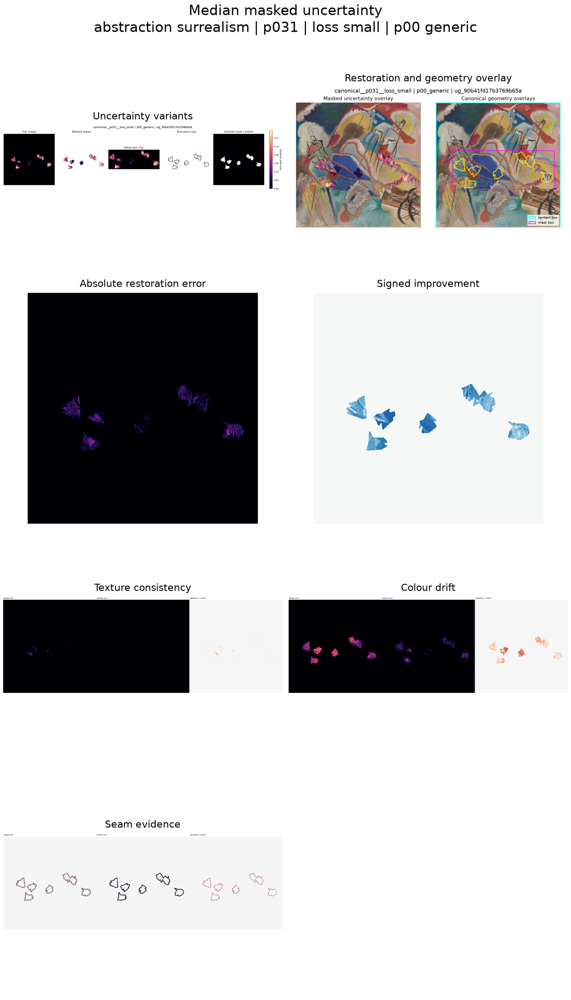

Selected-panel preview: category_max_generic_boundary_concentration abstraction_surrealism canonical__p033__scratch_thin


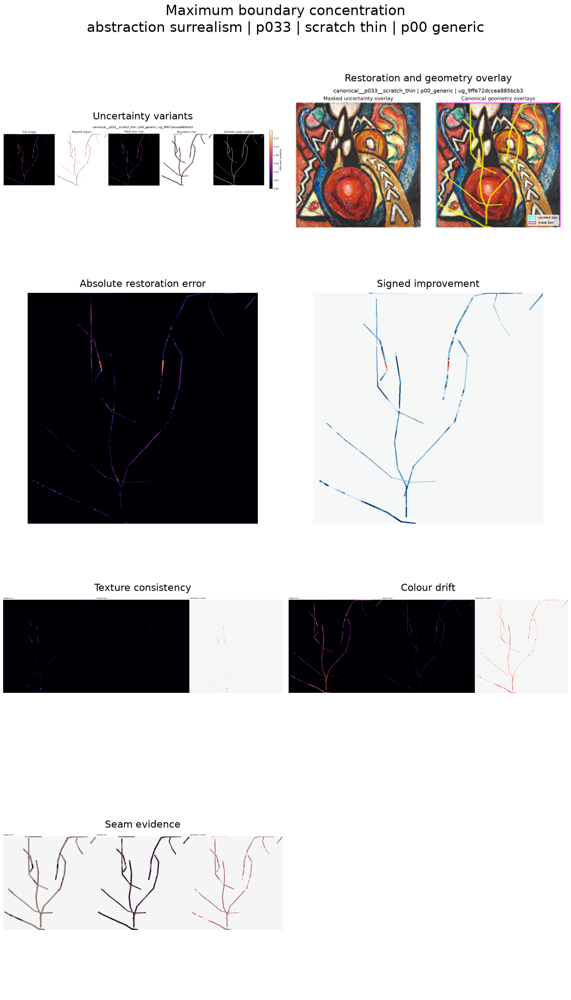

Selected-panel preview: category_max_absolute_scratch_prompt_difference abstraction_surrealism canonical__p036__scratch_thin


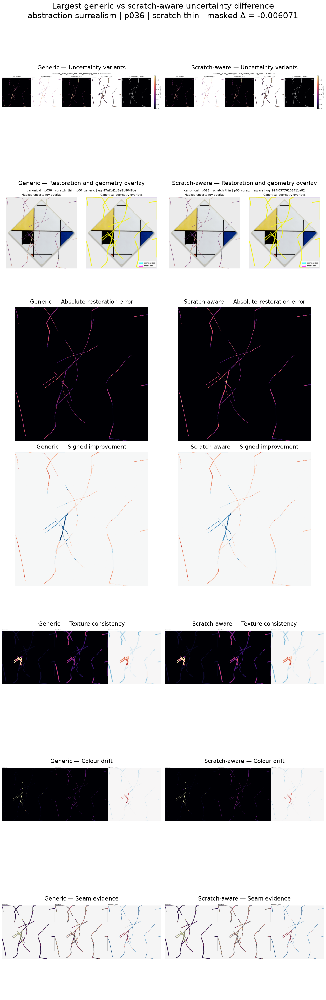

Notebook 19 selected panels audited.
Selected-panel files: 15
Selected-panel manifest records: 15
Selected-panel schema passed: True
Map records accumulated so far: 555
Canonical files currently persisted: 427
Preview panels displayed: 3
Standalone report files: 0


In [42]:
# ---------------------------------------------------------------------------
# Reload checkpoint and audit all 15 panels
# ---------------------------------------------------------------------------

selected_panel_checkpoint_df = pd.read_csv(
    selected_panel_checkpoint_path,
    low_memory=False,
)

selected_panel_checkpoint_lookup = {
    str(row["panel_key"]): row
    for _, row in (
        selected_panel_checkpoint_df.iterrows()
    )
}

selected_panel_file_audit_records = []
selected_panel_map_record_list = []

for plan in (
    selected_panel_plan_df.itertuples(
        index=False
    )
):
    panel_key = str(
        plan.panel_key
    )

    checkpoint_row = (
        selected_panel_checkpoint_lookup[
            panel_key
        ]
    )

    panel_path = (
        PROJECT_ROOT
        / Path(
            str(
                plan.relative_path
            )
        )
    )

    observed_sha256 = sha256_file(
        panel_path
    )

    with Image.open(
        panel_path
    ) as image:
        image.load()

        image_width = int(image.width)
        image_height = int(image.height)
        image_mode = str(image.mode)
        image_format = str(image.format)

        alpha_values = np.asarray(
            image.convert(
                "RGBA"
            ).getchannel("A"),
            dtype=np.uint8,
        )

        alpha_minimum = int(
            alpha_values.min()
        )
        alpha_maximum = int(
            alpha_values.max()
        )

    selected_panel_file_audit_records.append(
        {
            "panel_key": panel_key,
            "selection_role": str(
                plan.selection_role
            ),
            "category": str(
                plan.category
            ),
            "case_id": str(
                plan.case_id
            ),
            "component_count": int(
                plan.component_count
            ),
            "relative_path": str(
                plan.relative_path
            ),
            "exists": panel_path.is_file(),
            "checkpoint_status": str(
                checkpoint_row["status"]
            ),
            "relative_path_matches": (
                str(
                    checkpoint_row[
                        "relative_path"
                    ]
                )
                == str(
                    plan.relative_path
                )
            ),
            "fingerprint_matches": (
                str(
                    checkpoint_row[
                        "renderer_fingerprint"
                    ]
                )
                == str(
                    plan.renderer_fingerprint
                )
            ),
            "checksum_matches": (
                observed_sha256
                == str(
                    checkpoint_row[
                        "sha256"
                    ]
                )
            ),
            "size_bytes": int(
                panel_path.stat().st_size
            ),
            "width": image_width,
            "height": image_height,
            "image_mode": image_mode,
            "format": image_format,
            "alpha_minimum": alpha_minimum,
            "alpha_maximum": alpha_maximum,
        }
    )

    selection_metadata = (
        selected_panel_metadata_lookup[
            panel_key
        ]
    )

    selected_panel_map_record_list.append(
        build_map_asset_record(
            selection_metadata,
            asset_kind="selected_panel",
            ownership="owned",
            map_type=str(
                plan.panel_map_type
            ),
            relative_path=str(
                plan.relative_path
            ),
            status="passed",
            region_scope=(
                "multi_region_combined_diagnostic"
            ),
            selection_role=str(
                plan.selection_role
            ),
            source_artifact_key=(
                "multi_source_spatial_"
                "explanation_components"
            ),
            sha256=observed_sha256,
            size_bytes=int(
                panel_path.stat().st_size
            ),
            width=image_width,
            height=image_height,
            image_mode=image_mode,
            format=image_format,
            cmap="mixed_component_scales",
            vmin=np.nan,
            vmax=np.nan,
            center=np.nan,
            scale_scope=(
                "component-specific declared scales; "
                "no combined scale"
            ),
            normalization_policy_id=(
                "preserve_component_declared_scales"
            ),
            quantization_policy=(
                "matplotlib composite RGBA PNG"
            ),
            no_data_policy=(
                "component-specific declared "
                "no-data policies"
            ),
            renderer_version=(
                SPATIAL_EXPLANATION_RENDERER_VERSION
            ),
        )
    )

selected_panel_file_audit_df = (
    pd.DataFrame(
        selected_panel_file_audit_records
    )
)

selected_panel_map_records_df = (
    pd.DataFrame(
        selected_panel_map_record_list
    )
)

selected_panel_record_schema = (
    validate_dataframe(
        selected_panel_map_records_df,
        SPATIAL_EXPLANATION_MAP_IMAGE_SCHEMA,
        allow_extra_columns=False,
    )
)

map_records_after_batch_8_df = (
    pd.concat(
        [
            map_records_after_batch_7_df,
            selected_panel_map_records_df,
        ],
        ignore_index=True,
    )
)

map_records_after_batch_8_schema = (
    validate_dataframe(
        map_records_after_batch_8_df,
        SPATIAL_EXPLANATION_MAP_IMAGE_SCHEMA,
        allow_extra_columns=False,
    )
)


# ---------------------------------------------------------------------------
# Display one panel from each selection rule
# ---------------------------------------------------------------------------

role_order = {
    role: index
    for index, role in enumerate(
        SELECTION_POLICY["rules"]
    )
}

selected_panel_preview_df = (
    selected_panel_plan_df
    .assign(
        role_order=lambda frame: (
            frame[
                "selection_role"
            ].map(role_order)
        )
    )
    .sort_values(
        [
            "role_order",
            "category",
            "panel_key",
        ],
        kind="stable",
    )
    .groupby(
        "selection_role",
        as_index=False,
        sort=False,
    )
    .head(1)
    .sort_values(
        "role_order",
        kind="stable",
    )
    .reset_index(drop=True)
)

if len(
    selected_panel_preview_df
) != int(
    SELECTION_POLICY[
        "preview_panel_count"
    ]
):
    raise ValueError(
        "Selected-panel preview count disagrees "
        "with configuration."
    )

SELECTED_PANEL_PREVIEWS_DISPLAYED = False

for preview in (
    selected_panel_preview_df.itertuples(
        index=False
    )
):
    preview_path = (
        PROJECT_ROOT
        / Path(
            str(
                preview.relative_path
            )
        )
    )

    print(
        "Selected-panel preview:",
        preview.selection_role,
        preview.category,
        preview.case_id,
    )

    with Image.open(
        preview_path
    ) as image:
        image.load()

        display(
            image.convert(
                "RGBA"
            ).copy()
        )

SELECTED_PANEL_PREVIEWS_DISPLAYED = True


# ---------------------------------------------------------------------------
# Canonical scope and unchanged numerical evidence
# ---------------------------------------------------------------------------

canonical_files_after_batch_8 = sorted(
    to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    for path in (
        NOTEBOOK_OUTPUT_ROOT.rglob("*")
    )
    if (
        path.is_file()
        and "work"
        not in path.relative_to(
            NOTEBOOK_OUTPUT_ROOT
        ).parts
    )
)

expected_canonical_files_after_batch_8 = (
    sorted(
        [
            *expected_canonical_files_after_batch_7,
            *selected_panel_plan_df[
                "relative_path"
            ].astype(str).tolist(),
        ]
    )
)

numeric_archive_unchanged_after_batch_8 = bool(
    sha256_file(
        OUTPUTS["numeric_maps"]
    )
    == numeric_archive_sha256
)

spatial_metrics_unchanged_after_batch_8 = bool(
    sha256_file(
        OUTPUTS[
            "spatial_explanations"
        ]
    )
    == spatial_metrics_sha256
)

report_files_after_batch_8 = sorted(
    to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    for path in (
        NOTEBOOK_OUTPUT_ROOT
        / "reports"
    ).rglob("*")
    if path.is_file()
) if (
    NOTEBOOK_OUTPUT_ROOT
    / "reports"
).exists() else []

print("Notebook 19 selected panels audited.")
print(
    "Selected-panel files:",
    len(selected_panel_file_audit_df),
)
print(
    "Selected-panel manifest records:",
    len(selected_panel_map_records_df),
)
print(
    "Selected-panel schema passed:",
    selected_panel_record_schema.passed,
)
print(
    "Map records accumulated so far:",
    len(map_records_after_batch_8_df),
)
print(
    "Canonical files currently persisted:",
    len(canonical_files_after_batch_8),
)
print(
    "Preview panels displayed:",
    len(selected_panel_preview_df),
)
print(
    "Standalone report files:",
    len(report_files_after_batch_8),
)

In [39]:
# ---------------------------------------------------------------------------
# Batch 8 validation helper
# ---------------------------------------------------------------------------

VALIDATION_STAGE = (
    "batch_8_selected_explanation_panels"
)


def add_batch_8_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=VALIDATION_STAGE,
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


# ---------------------------------------------------------------------------
# Selection checks
# ---------------------------------------------------------------------------

selection_contract = {
    "rows": len(
        selected_explanations_df
    ),
    "roles": int(
        selected_explanations_df[
            "selection_role"
        ].nunique()
    ),
    "categories": int(
        selected_explanations_df[
            "category"
        ].nunique()
    ),
    "unique_role_category_pairs": int(
        selected_explanations_df[
            [
                "selection_role",
                "category",
            ]
        ].drop_duplicates().shape[0]
    ),
    "role_counts": {
        str(key): int(value)
        for key, value in (
            selected_explanations_df[
                "selection_role"
            ]
            .value_counts()
            .sort_index()
            .items()
        )
    },
    "category_counts": {
        str(key): int(value)
        for key, value in (
            selected_explanations_df[
                "category"
            ]
            .value_counts()
            .sort_index()
            .items()
        )
    },
}

expected_role_counts = {
    str(role): 5
    for role in (
        SELECTION_POLICY["rules"]
    )
}

expected_category_counts = {
    str(category): 3
    for category in (
        SELECTION_POLICY["categories"]
    )
}

add_batch_8_check(
    "representative_selection_contract",
    "The selection contains one case per rule/category stratum.",
    {
        "rows": 15,
        "roles": 3,
        "categories": 5,
        "unique_role_category_pairs": 15,
        "role_counts": (
            expected_role_counts
        ),
        "category_counts": (
            expected_category_counts
        ),
    },
    selection_contract,
    (
        selection_contract
        == {
            "rows": 15,
            "roles": 3,
            "categories": 5,
            "unique_role_category_pairs": 15,
            "role_counts": (
                expected_role_counts
            ),
            "category_counts": (
                expected_category_counts
            ),
        }
    ),
)

add_batch_8_check(
    "representative_selection_determinism",
    "Repeating the rule-based selection returns the identical ordered result.",
    True,
    selection_is_deterministic,
    selection_is_deterministic,
)

add_batch_8_check(
    "independent_selection_rule_audit",
    "Every selected case independently reproduces its declared rule winner.",
    15,
    int(
        selection_rule_audit_df[
            "passed"
        ].sum()
    ),
    selection_rule_audit_df[
        "passed"
    ].all(),
)


# ---------------------------------------------------------------------------
# Component and render-plan checks
# ---------------------------------------------------------------------------

component_source_contract = {
    "rows": len(
        selected_panel_source_audit_df
    ),
    "panels": int(
        selected_panel_source_audit_df[
            "panel_key"
        ].nunique()
    ),
    "existing": int(
        selected_panel_source_audit_df[
            "exists"
        ].astype(bool).sum()
    ),
    "checksum_matches": int(
        selected_panel_source_audit_df[
            "checksum_matches"
        ].astype(bool).sum()
    ),
    "map_type_counts": {
        str(key): int(value)
        for key, value in (
            selected_panel_source_audit_df[
                "component_map_type"
            ]
            .value_counts()
            .sort_index()
            .items()
        )
    },
}

expected_component_type_counts = {
    map_type: 20
    for map_type, _ in (
        COMPONENT_MAP_TYPES
    )
}

add_batch_8_check(
    "selected_panel_component_sources",
    "All 140 component references exist and match their registered checksums.",
    {
        "rows": 140,
        "panels": 15,
        "existing": 140,
        "checksum_matches": 140,
        "map_type_counts": (
            expected_component_type_counts
        ),
    },
    component_source_contract,
    (
        component_source_contract
        == {
            "rows": 140,
            "panels": 15,
            "existing": 140,
            "checksum_matches": 140,
            "map_type_counts": (
                expected_component_type_counts
            ),
        }
    ),
)

panel_plan_contract = {
    "rows": len(
        selected_panel_plan_df
    ),
    "unique_keys": int(
        selected_panel_plan_df[
            "panel_key"
        ].nunique()
    ),
    "unique_paths": int(
        selected_panel_plan_df[
            "relative_path"
        ].nunique()
    ),
    "component_count_distribution": {
        str(int(key)): int(value)
        for key, value in (
            selected_panel_plan_df[
                "component_count"
            ]
            .value_counts()
            .sort_index()
            .items()
        )
    },
}

add_batch_8_check(
    "selected_panel_render_plan",
    "Ten single-arm and five paired-arm panels form the exact 15-panel plan.",
    {
        "rows": 15,
        "unique_keys": 15,
        "unique_paths": 15,
        "component_count_distribution": {
            "7": 10,
            "14": 5,
        },
    },
    panel_plan_contract,
    (
        panel_plan_contract
        == {
            "rows": 15,
            "unique_keys": 15,
            "unique_paths": 15,
            "component_count_distribution": {
                "7": 10,
                "14": 5,
            },
        }
    ),
)


# ---------------------------------------------------------------------------
# Execution, checkpoint, and file checks
# ---------------------------------------------------------------------------

panel_execution_contract = {
    "newly_rendered": len(
        new_selected_panel_keys
    ),
    "strictly_resumed": len(
        resumed_selected_panel_keys
    ),
    "total": (
        len(new_selected_panel_keys)
        + len(
            resumed_selected_panel_keys
        )
    ),
    "overlap": len(
        set(new_selected_panel_keys)
        & set(
            resumed_selected_panel_keys
        )
    ),
}

add_batch_8_check(
    "selected_panel_execution",
    "Every selected panel was either rendered or strictly resumed.",
    {
        "total": 15,
        "overlap": 0,
    },
    panel_execution_contract,
    (
        panel_execution_contract[
            "total"
        ]
        == 15
        and panel_execution_contract[
            "overlap"
        ]
        == 0
    ),
)

panel_checkpoint_contract = {
    "rows": len(
        selected_panel_checkpoint_df
    ),
    "unique_keys": int(
        selected_panel_checkpoint_df[
            "panel_key"
        ].nunique()
    ),
    "completed": int(
        selected_panel_checkpoint_df[
            "status"
        ].astype(str).eq(
            "completed"
        ).sum()
    ),
    "unique_paths": int(
        selected_panel_checkpoint_df[
            "relative_path"
        ].nunique()
    ),
}

add_batch_8_check(
    "selected_panel_checkpoint",
    "The selected-panel checkpoint covers all 15 panels exactly once.",
    {
        "rows": 15,
        "unique_keys": 15,
        "completed": 15,
        "unique_paths": 15,
    },
    panel_checkpoint_contract,
    (
        panel_checkpoint_contract
        == {
            "rows": 15,
            "unique_keys": 15,
            "completed": 15,
            "unique_paths": 15,
        }
    ),
)

selected_panel_file_contract = {
    "rows": len(
        selected_panel_file_audit_df
    ),
    "existing": int(
        selected_panel_file_audit_df[
            "exists"
        ].astype(bool).sum()
    ),
    "completed": int(
        selected_panel_file_audit_df[
            "checkpoint_status"
        ].astype(str).eq(
            "completed"
        ).sum()
    ),
    "path_matches": int(
        selected_panel_file_audit_df[
            "relative_path_matches"
        ].astype(bool).sum()
    ),
    "fingerprint_matches": int(
        selected_panel_file_audit_df[
            "fingerprint_matches"
        ].astype(bool).sum()
    ),
    "checksum_matches": int(
        selected_panel_file_audit_df[
            "checksum_matches"
        ].astype(bool).sum()
    ),
    "rgba_png": int(
        (
            selected_panel_file_audit_df[
                "image_mode"
            ].astype(str).eq("RGBA")
            & selected_panel_file_audit_df[
                "format"
            ].astype(str).eq("PNG")
        ).sum()
    ),
    "fully_opaque": int(
        (
            selected_panel_file_audit_df[
                "alpha_minimum"
            ].eq(255)
            & selected_panel_file_audit_df[
                "alpha_maximum"
            ].eq(255)
        ).sum()
    ),
    "positive_size": int(
        selected_panel_file_audit_df[
            "size_bytes"
        ].gt(0).sum()
    ),
}

add_batch_8_check(
    "selected_panel_file_integrity",
    "All selected panels are checksummed, fully opaque RGBA PNGs.",
    {
        "rows": 15,
        "existing": 15,
        "completed": 15,
        "path_matches": 15,
        "fingerprint_matches": 15,
        "checksum_matches": 15,
        "rgba_png": 15,
        "fully_opaque": 15,
        "positive_size": 15,
    },
    selected_panel_file_contract,
    (
        selected_panel_file_contract
        == {
            "rows": 15,
            "existing": 15,
            "completed": 15,
            "path_matches": 15,
            "fingerprint_matches": 15,
            "checksum_matches": 15,
            "rgba_png": 15,
            "fully_opaque": 15,
            "positive_size": 15,
        }
    ),
)


# ---------------------------------------------------------------------------
# Manifest, scope, and scientific-policy checks
# ---------------------------------------------------------------------------

selected_record_contract = {
    "rows": len(
        selected_panel_map_records_df
    ),
    "unique_asset_ids": int(
        selected_panel_map_records_df[
            "map_asset_id"
        ].nunique()
    ),
    "schema_passed": (
        selected_panel_record_schema.passed
    ),
    "asset_kinds": sorted(
        selected_panel_map_records_df[
            "asset_kind"
        ].astype(str).unique().tolist()
    ),
    "ownership": sorted(
        selected_panel_map_records_df[
            "ownership"
        ].astype(str).unique().tolist()
    ),
    "map_type_counts": {
        str(key): int(value)
        for key, value in (
            selected_panel_map_records_df[
                "map_type"
            ]
            .value_counts()
            .sort_index()
            .items()
        )
    },
}

add_batch_8_check(
    "selected_panel_normalized_records",
    "Every selected panel has one schema-valid owned manifest record.",
    {
        "rows": 15,
        "unique_asset_ids": 15,
        "schema_passed": True,
        "asset_kinds": [
            "selected_panel"
        ],
        "ownership": ["owned"],
        "map_type_counts": {
            "selected_boundary_concentration": 5,
            "selected_median": 5,
            "selected_prompt_difference": 5,
        },
    },
    selected_record_contract,
    (
        selected_record_contract
        == {
            "rows": 15,
            "unique_asset_ids": 15,
            "schema_passed": True,
            "asset_kinds": [
                "selected_panel"
            ],
            "ownership": ["owned"],
            "map_type_counts": {
                "selected_boundary_concentration": 5,
                "selected_median": 5,
                "selected_prompt_difference": 5,
            },
        }
    ),
)

accumulated_batch_8_record_contract = {
    "rows": len(
        map_records_after_batch_8_df
    ),
    "unique_asset_ids": int(
        map_records_after_batch_8_df[
            "map_asset_id"
        ].nunique()
    ),
    "schema_passed": (
        map_records_after_batch_8_schema.passed
    ),
}

add_batch_8_check(
    "batch_8_accumulated_map_records",
    "All owned map records remain unique and schema-valid.",
    {
        "rows": 555,
        "unique_asset_ids": 555,
        "schema_passed": True,
    },
    accumulated_batch_8_record_contract,
    (
        accumulated_batch_8_record_contract
        == {
            "rows": 555,
            "unique_asset_ids": 555,
            "schema_passed": True,
        }
    ),
)

add_batch_8_check(
    "selected_panels_preserve_numeric_evidence",
    "Panel rendering does not alter either canonical numerical output.",
    {
        "numeric_archive_unchanged": True,
        "spatial_metrics_unchanged": True,
    },
    {
        "numeric_archive_unchanged": (
            numeric_archive_unchanged_after_batch_8
        ),
        "spatial_metrics_unchanged": (
            spatial_metrics_unchanged_after_batch_8
        ),
    },
    (
        numeric_archive_unchanged_after_batch_8
        and spatial_metrics_unchanged_after_batch_8
    ),
)

add_batch_8_check(
    "batch_8_canonical_file_scope",
    "The canonical scope contains the prior 412 files plus exactly 15 selected panels.",
    expected_canonical_files_after_batch_8,
    canonical_files_after_batch_8,
    (
        canonical_files_after_batch_8
        == expected_canonical_files_after_batch_8
        and len(
            canonical_files_after_batch_8
        ) == 427
    ),
)

add_batch_8_check(
    "selected_panel_previews",
    "Exactly one panel from each selection rule was displayed inline.",
    3,
    len(
        selected_panel_preview_df
    )
    if SELECTED_PANEL_PREVIEWS_DISPLAYED
    else 0,
    (
        SELECTED_PANEL_PREVIEWS_DISPLAYED
        and len(
            selected_panel_preview_df
        ) == 3
    ),
)

add_batch_8_check(
    "no_standalone_report",
    "Notebook 19 does not generate a standalone report.",
    [],
    report_files_after_batch_8,
    not report_files_after_batch_8,
)

print("Notebook 19 Batch 8 checks assembled.")
print(
    "Batch 8 checks added:",
    int(
        VALIDATION.to_dataframe()[
            "validation_stage"
        ].eq(
            VALIDATION_STAGE
        ).sum()
    ),
)

Notebook 19 Batch 8 checks assembled.
Batch 8 checks added: 14


In [40]:
# ---------------------------------------------------------------------------
# Batch 8 review tables and gate
# ---------------------------------------------------------------------------

all_validation_df = (
    VALIDATION.to_dataframe()
)

batch_8_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq(
            VALIDATION_STAGE
        )
    ]
    .reset_index(drop=True)
)

selected_panel_summary_df = (
    selected_panel_file_audit_df
    .groupby(
        "selection_role",
        as_index=False,
    )
    .agg(
        panels=("panel_key", "size"),
        categories=("category", "nunique"),
        component_references=(
            "component_count",
            "sum",
        ),
        total_size_bytes=(
            "size_bytes",
            "sum",
        ),
        minimum_width=("width", "min"),
        maximum_width=("width", "max"),
        minimum_height=("height", "min"),
        maximum_height=("height", "max"),
        checksum_matches=(
            "checksum_matches",
            "sum",
        ),
    )
    .sort_values(
        "selection_role",
        kind="stable",
    )
    .reset_index(drop=True)
)

selected_panel_execution_df = (
    pd.DataFrame(
        [
            {
                "execution_outcome": (
                    "newly_rendered"
                ),
                "panels": len(
                    new_selected_panel_keys
                ),
            },
            {
                "execution_outcome": (
                    "strictly_resumed"
                ),
                "panels": len(
                    resumed_selected_panel_keys
                ),
            },
        ]
    )
)

display(masked_uncertainty_summary_df)
display(prompt_difference_summary_df)
display(selection_rule_audit_df)
display(selected_panel_summary_df)
display(selected_panel_execution_df)
display(selected_panel_checkpoint_df)
display(selected_panel_file_audit_df)
display(selected_panel_map_records_df)
display(batch_8_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 19 Batch 8 summary")
print("---------------------------")
print(
    "Batch 8 validation checks:",
    len(batch_8_validation_df),
)
print(
    "Blocking failures across Batches 1–8:",
    len(VALIDATION.blocking_failures),
)
print(
    "Rule-selected panels:",
    len(selected_panel_plan_df),
)
print(
    "Component references:",
    len(selected_panel_source_audit_df),
)
print(
    "Newly rendered panels:",
    len(new_selected_panel_keys),
)
print(
    "Strictly resumed panels:",
    len(resumed_selected_panel_keys),
)
print(
    "Selected-panel manifest records:",
    len(selected_panel_map_records_df),
)
print(
    "Accumulated owned map records:",
    len(map_records_after_batch_8_df),
)
print(
    "Canonical files currently persisted:",
    len(canonical_files_after_batch_8),
)
print(
    "Preview panels displayed:",
    len(selected_panel_preview_df),
)
print(
    "Standalone reports:",
    len(report_files_after_batch_8),
)
print(
    "Batch 8 passed: all 15 category-balanced "
    "representative explanation panels were selected "
    "through independently verified rules, rendered from "
    "140 checksum-validated evidence components, and "
    "registered without collapsing evidence families or "
    "altering numerical results."
)

,category,prompt_variant_id,groups,mean_masked_uncertainty,median_masked_uncertainty,maximum_masked_uncertainty
0,abstraction_surrealism,p00_generic,16,0.069281,0.063477,0.116079
1,abstraction_surrealism,p05_scratch_aware,10,0.061018,0.060169,0.084900
2,architecture_structured,p00_generic,16,0.052159,0.050327,0.092874
3,architecture_structured,p05_scratch_aware,10,0.050885,0.051981,0.064595
4,high_texture_brushwork,p00_generic,16,0.055913,0.052614,0.115347
5,high_texture_brushwork,p05_scratch_aware,10,0.048659,0.049379,0.063274
6,landscape_natural,p00_generic,16,0.059568,0.051705,0.114426
7,landscape_natural,p05_scratch_aware,10,0.052168,0.051031,0.073748
8,portrait_figure,p00_generic,16,0.065099,0.062171,0.123133
9,portrait_figure,p05_scratch_aware,10,0.062464,0.062804,0.083002


,category,paintings,mean_signed_difference,median_signed_difference,mean_absolute_difference,maximum_absolute_difference
0,abstraction_surrealism,10,0.000863,0.001110,0.003048,0.006071
1,architecture_structured,10,0.002439,0.002178,0.002560,0.007014
2,high_texture_brushwork,10,0.000580,0.000301,0.001642,0.006079
3,landscape_natural,10,0.000551,0.000658,0.001763,0.004257
4,portrait_figure,10,0.002280,0.002311,0.004499,0.016157


,selection_role,category,observed_case_id,expected_case_id,observed_group_id,expected_group_id,observed_selection_value,expected_selection_value,case_matches,group_matches,value_matches,passed
0,category_median_generic_masked_uncertainty,abstraction_surrealism,canonical__p031__loss_small,canonical__p031__loss_small,ug_90b41fd17b3769b65a,ug_90b41fd17b3769b65a,0.002268,0.002268,True,True,True,True
1,category_median_generic_masked_uncertainty,architecture_structured,canonical__p026__scratch_thin,canonical__p026__scratch_thin,ug_3b2023bd1ec979cce3,ug_3b2023bd1ec979cce3,0.001926,0.001926,True,True,True,True
2,category_median_generic_masked_uncertainty,high_texture_brushwork,canonical__p044__scratch_thin,canonical__p044__scratch_thin,ug_cdddbd734bbab6f465,ug_cdddbd734bbab6f465,0.000728,0.000728,True,True,True,True
3,category_median_generic_masked_uncertainty,landscape_natural,canonical__p016__scratch_thin,canonical__p016__scratch_thin,ug_04f954c19d300ace02,ug_04f954c19d300ace02,0.000233,0.000233,True,True,True,True
4,category_median_generic_masked_uncertainty,portrait_figure,canonical__p001__scratch_thin,canonical__p001__scratch_thin,ug_bd6fc0b06f58acc4f1,ug_bd6fc0b06f58acc4f1,0.000843,0.000843,True,True,True,True
5,category_max_generic_boundary_concentration,abstraction_surrealism,canonical__p033__scratch_thin,canonical__p033__scratch_thin,ug_9ffe72dccea885bcb3,ug_9ffe72dccea885bcb3,0.394766,0.394766,True,True,True,True
6,category_max_generic_boundary_concentration,architecture_structured,canonical__p027__scratch_thin,canonical__p027__scratch_thin,ug_ddf7c3917f80b50fba,ug_ddf7c3917f80b50fba,0.397134,0.397134,True,True,True,True
7,category_max_generic_boundary_concentration,high_texture_brushwork,canonical__p042__scratch_thin,canonical__p042__scratch_thin,ug_5511b5f6f6ea83118d,ug_5511b5f6f6ea83118d,0.418951,0.418951,True,True,True,True
8,category_max_generic_boundary_concentration,landscape_natural,canonical__p011__mixed_damage,canonical__p011__mixed_damage,ug_fb54abd75234479d38,ug_fb54abd75234479d38,0.480893,0.480893,True,True,True,True
9,category_max_generic_boundary_concentration,portrait_figure,canonical__p002__mixed_damage,canonical__p002__mixed_damage,ug_ec6201c493d4f874fe,ug_ec6201c493d4f874fe,0.427764,0.427764,True,True,True,True


,selection_role,panels,categories,component_references,total_size_bytes,minimum_width,maximum_width,minimum_height,maximum_height,checksum_matches
0,category_max_absolute_scratch_prompt_difference,5,5,70,3351269,1280,1280,3920,3920,5
1,category_max_generic_boundary_concentration,5,5,35,2666190,1280,1280,2240,2240,5
2,category_median_generic_masked_uncertainty,5,5,35,2486937,1280,1280,2240,2240,5


,execution_outcome,panels
0,newly_rendered,15
1,strictly_resumed,0


,panel_key,selection_role,renderer_fingerprint,relative_path,sha256,size_bytes,width,height,image_mode,format,completed_at_utc,status,issue
0,selected_panel_01,category_median_generic_masked_uncertainty,9e75d2e97a9c40419368821734831a6a9e4be2ee178443...,outputs/19_uncertainty_and_spatial_explanation...,bce5045620bb3517f75414a59b0e4956e34e3e7df89f9a...,546824,1280,2240,RGBA,PNG,2026-08-30T17:02:58.433183Z,completed,NaN
1,selected_panel_02,category_median_generic_masked_uncertainty,93860a798987a1008a20ac460db45b840c00f044f06e39...,outputs/19_uncertainty_and_spatial_explanation...,5ab969e4f4d45fbde97d703a818dd8bf4c6951156cbb9e...,505563,1280,2240,RGBA,PNG,2026-08-30T17:03:03.728753Z,completed,NaN
2,selected_panel_03,category_median_generic_masked_uncertainty,5867a5bc86e2434af1e1ab718df8544f13211586c8d337...,outputs/19_uncertainty_and_spatial_explanation...,826bbb9b8a8fc8516d137d836d7637cab6f0231dbdb149...,453616,1280,2240,RGBA,PNG,2026-08-30T17:03:09.194539Z,completed,NaN
3,selected_panel_04,category_median_generic_masked_uncertainty,efd47057aaf49e7e8966da6d56fe6532f77c23c56b5e8f...,outputs/19_uncertainty_and_spatial_explanation...,d7d928806e4daf460e7d075c9a63fcbab8d64f71ce87b6...,465359,1280,2240,RGBA,PNG,2026-08-30T17:03:15.134626Z,completed,NaN
4,selected_panel_05,category_median_generic_masked_uncertainty,bf136f24d31173c978e59d34b78f03f71f678285e0a588...,outputs/19_uncertainty_and_spatial_explanation...,7bcae289dca1e459158761d574b8c22ca3a66cd474c5f8...,515575,1280,2240,RGBA,PNG,2026-08-30T17:03:19.932537Z,completed,NaN
5,selected_panel_06,category_max_generic_boundary_concentration,368ac6c3bbec64450a1e8c01dc086a38f87a6a21b171a5...,outputs/19_uncertainty_and_spatial_explanation...,68a2fd851324f0bc04b96af7589839d998aa452a88e08d...,659052,1280,2240,RGBA,PNG,2026-08-30T17:03:24.986689Z,completed,NaN
6,selected_panel_07,category_max_generic_boundary_concentration,6c66e4842e993bd714b134ddced420da6f94c30fcd15f9...,outputs/19_uncertainty_and_spatial_explanation...,c2ab8bc2a0981864a44442192b13100880d513f124cca6...,504622,1280,2240,RGBA,PNG,2026-08-30T17:03:32.642201Z,completed,NaN
7,selected_panel_08,category_max_generic_boundary_concentration,5f6252c681dfc081591255e1ab63b08edecf062161a663...,outputs/19_uncertainty_and_spatial_explanation...,3231946a35db1641faf0368924e71305f088efa037750c...,435131,1280,2240,RGBA,PNG,2026-08-30T17:03:38.388083Z,completed,NaN
8,selected_panel_09,category_max_generic_boundary_concentration,422313c0fd1d74c21b5ccda7ac9ca5207ad38279cdce07...,outputs/19_uncertainty_and_spatial_explanation...,2d06ba60b87c7fef5b74016e9f88b4c890941ad67f1913...,562513,1280,2240,RGBA,PNG,2026-08-30T17:03:43.076428Z,completed,NaN
9,selected_panel_10,category_max_generic_boundary_concentration,716f6974dda89735446b90d5a3503f097ae5ebc0b64dff...,outputs/19_uncertainty_and_spatial_explanation...,805499e03e2325fd5be71d1f87fc1891ed802899dede12...,504872,1280,2240,RGBA,PNG,2026-08-30T17:03:47.632238Z,completed,NaN


,panel_key,selection_role,category,case_id,component_count,relative_path,exists,checkpoint_status,relative_path_matches,fingerprint_matches,checksum_matches,size_bytes,width,height,image_mode,format,alpha_minimum,alpha_maximum
0,selected_panel_01,category_median_generic_masked_uncertainty,abstraction_surrealism,canonical__p031__loss_small,7,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,546824,1280,2240,RGBA,PNG,255,255
1,selected_panel_02,category_median_generic_masked_uncertainty,architecture_structured,canonical__p026__scratch_thin,7,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,505563,1280,2240,RGBA,PNG,255,255
2,selected_panel_03,category_median_generic_masked_uncertainty,high_texture_brushwork,canonical__p044__scratch_thin,7,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,453616,1280,2240,RGBA,PNG,255,255
3,selected_panel_04,category_median_generic_masked_uncertainty,landscape_natural,canonical__p016__scratch_thin,7,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,465359,1280,2240,RGBA,PNG,255,255
4,selected_panel_05,category_median_generic_masked_uncertainty,portrait_figure,canonical__p001__scratch_thin,7,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,515575,1280,2240,RGBA,PNG,255,255
5,selected_panel_06,category_max_generic_boundary_concentration,abstraction_surrealism,canonical__p033__scratch_thin,7,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,659052,1280,2240,RGBA,PNG,255,255
6,selected_panel_07,category_max_generic_boundary_concentration,architecture_structured,canonical__p027__scratch_thin,7,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,504622,1280,2240,RGBA,PNG,255,255
7,selected_panel_08,category_max_generic_boundary_concentration,high_texture_brushwork,canonical__p042__scratch_thin,7,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,435131,1280,2240,RGBA,PNG,255,255
8,selected_panel_09,category_max_generic_boundary_concentration,landscape_natural,canonical__p011__mixed_damage,7,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,562513,1280,2240,RGBA,PNG,255,255
9,selected_panel_10,category_max_generic_boundary_concentration,portrait_figure,canonical__p002__mixed_damage,7,outputs/19_uncertainty_and_spatial_explanation...,True,completed,True,True,True,504872,1280,2240,RGBA,PNG,255,255


,map_asset_id,asset_kind,ownership,uncertainty_group_id,case_id,candidate_id,model_id,painting_id,prompt_variant_id,map_type,...,vmin,vmax,center,scale_scope,normalization_policy_id,quantization_policy,no_data_policy,renderer_version,status,issue
0,sxa_a651c3dd998a93f24481,selected_panel,owned,ug_90b41fd17b3769b65a,canonical__p031__loss_small,sd15__p00__s2026__32a9869946f5,,p031,p00_generic,selected_median,...,NaN,NaN,NaN,component-specific declared scales; no combine...,preserve_component_declared_scales,matplotlib composite RGBA PNG,component-specific declared no-data policies,spatial_explanation_renderer.v1.1,passed,
1,sxa_7f4c83c7d30e25432a35,selected_panel,owned,ug_3b2023bd1ec979cce3,canonical__p026__scratch_thin,sd15__p00__s2026__be9aeee5735c,,p026,p00_generic,selected_median,...,NaN,NaN,NaN,component-specific declared scales; no combine...,preserve_component_declared_scales,matplotlib composite RGBA PNG,component-specific declared no-data policies,spatial_explanation_renderer.v1.1,passed,
2,sxa_6697d71ae27009961141,selected_panel,owned,ug_cdddbd734bbab6f465,canonical__p044__scratch_thin,sd15__p00__s2026__f5bd29d078fd,,p044,p00_generic,selected_median,...,NaN,NaN,NaN,component-specific declared scales; no combine...,preserve_component_declared_scales,matplotlib composite RGBA PNG,component-specific declared no-data policies,spatial_explanation_renderer.v1.1,passed,
3,sxa_1d590d0d9aa4245845ef,selected_panel,owned,ug_04f954c19d300ace02,canonical__p016__scratch_thin,sd15__p00__s2026__7315824f8629,,p016,p00_generic,selected_median,...,NaN,NaN,NaN,component-specific declared scales; no combine...,preserve_component_declared_scales,matplotlib composite RGBA PNG,component-specific declared no-data policies,spatial_explanation_renderer.v1.1,passed,
4,sxa_e686aec5e14b5aec19fe,selected_panel,owned,ug_bd6fc0b06f58acc4f1,canonical__p001__scratch_thin,sd15__p00__s2026__b039817c7170,,p001,p00_generic,selected_median,...,NaN,NaN,NaN,component-specific declared scales; no combine...,preserve_component_declared_scales,matplotlib composite RGBA PNG,component-specific declared no-data policies,spatial_explanation_renderer.v1.1,passed,
5,sxa_81657e08109d6ea2de94,selected_panel,owned,ug_9ffe72dccea885bcb3,canonical__p033__scratch_thin,sd15__p00__s2026__42c8bf8ce03c,,p033,p00_generic,selected_boundary_concentration,...,NaN,NaN,NaN,component-specific declared scales; no combine...,preserve_component_declared_scales,matplotlib composite RGBA PNG,component-specific declared no-data policies,spatial_explanation_renderer.v1.1,passed,
6,sxa_eaa4a6d0eead7349e943,selected_panel,owned,ug_ddf7c3917f80b50fba,canonical__p027__scratch_thin,sd15__p00__s2026__cdd65f2ed3f5,,p027,p00_generic,selected_boundary_concentration,...,NaN,NaN,NaN,component-specific declared scales; no combine...,preserve_component_declared_scales,matplotlib composite RGBA PNG,component-specific declared no-data policies,spatial_explanation_renderer.v1.1,passed,
7,sxa_4cf079d2afd2a284171a,selected_panel,owned,ug_5511b5f6f6ea83118d,canonical__p042__scratch_thin,sd15__p00__s2026__cb9a5982a1c9,,p042,p00_generic,selected_boundary_concentration,...,NaN,NaN,NaN,component-specific declared scales; no combine...,preserve_component_declared_scales,matplotlib composite RGBA PNG,component-specific declared no-data policies,spatial_explanation_renderer.v1.1,passed,
8,sxa_065c5e82b395ef3e4fa8,selected_panel,owned,ug_fb54abd75234479d38,canonical__p011__mixed_damage,sd15__p00__s2026__70fc394feef8,,p011,p00_generic,selected_boundary_concentration,...,NaN,NaN,NaN,component-specific declared scales; no combine...,preserve_component_declared_scales,matplotlib composite RGBA PNG,component-specific declared no-data policies,spatial_explanation_renderer.v1.1,passed,
9,sxa_3542d686629263eea860,selected_panel,owned,ug_ec6201c493d4f874fe,canonical__p002__mixed_damage,sd15__p00__s2026__49ca65d281c4,,p002,p00_generic,selected_boundary_concentration,...,NaN,NaN,NaN,component-specific declared scales; no combine.

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_8_selected_explanation_panels,representative_selection_contract,The selection contains one case per rule/categ...,blocking,"{""categories"": 5, ""category_counts"": {""abstrac...","{""categories"": 5, ""category_counts"": {""abstrac...",True,
1,batch_8_selected_explanation_panels,representative_selection_determinism,Repeating the rule-based selection returns the...,blocking,True,True,True,
2,batch_8_selected_explanation_panels,independent_selection_rule_audit,Every selected case independently reproduces i...,blocking,15,15,True,
3,batch_8_selected_explanation_panels,selected_panel_component_sources,All 140 component references exist and match t...,blocking,"{""checksum_matches"": 140, ""existing"": 140, ""ma...","{""checksum_matches"": 140, ""existing"": 140, ""ma...",True,
4,batch_8_selected_explanation_panels,selected_panel_render_plan,Ten single-arm and five paired-arm panels form...,blocking,"{""component_count_distribution"": {""14"": 5, ""7""...","{""component_count_distribution"": {""14"": 5, ""7""...",True,
5,batch_8_selected_explanation_panels,selected_panel_execution,Every selected panel was either rendered or st...,blocking,"{""overlap"": 0, ""total"": 15}","{""newly_rendered"": 15, ""overlap"": 0, ""strictly...",True,
6,batch_8_selected_explanation_panels,selected_panel_checkpoint,The selected-panel checkpoint covers all 15 pa...,blocking,"{""completed"": 15, ""rows"": 15, ""unique_keys"": 1...","{""completed"": 15, ""rows"": 15, ""unique_keys"": 1...",True,
7,batch_8_selected_explanation_panels,selected_panel_file_integrity,"All selected panels are checksummed, fully opa...",blocking,"{""checksum_matches"": 15, ""completed"": 15, ""exi...","{""checksum_matches"": 15, ""completed"": 15, ""exi...",True,
8,batch_8_selected_explanation_panels,selected_panel_normalized_records,Every selected panel has one schema-valid owne...,blocking,"{""asset_kinds"": [""selected_panel""], ""map_type_...","{""asset_kinds"": [""selected_panel""], ""map_type_...",True,
9,batch_8_selected_explanation_panels,batch_8_accumulated_map_records,All owned map records remain unique and schema...,blocking,"{""rows"": 555, ""schema_passed"": true, ""unique_a...","{""rows"": 555, ""schema_passed"": true, ""unique_a...",True,


Notebook 19 Batch 8 summary
---------------------------
Batch 8 validation checks: 14
Blocking failures across Batches 1–8: 0
Rule-selected panels: 15
Component references: 140
Newly rendered panels: 15
Strictly resumed panels: 0
Selected-panel manifest records: 15
Accumulated owned map records: 555
Canonical files currently persisted: 427
Preview panels displayed: 3
Standalone reports: 0
Batch 8 passed: all 15 category-balanced representative explanation panels were selected through independently verified rules, rendered from 140 checksum-validated evidence components, and registered without collapsing evidence families or altering numerical results.


In [41]:
# ---------------------------------------------------------------------------
# Correct clipped selected-panel titles without changing selections/evidence
# ---------------------------------------------------------------------------

SELECTED_PANEL_LAYOUT_VERSION = (
    "selected_explanation_panel_layout.v1.1"
)

SHORT_ROLE_TITLES = {
    "category_median_generic_masked_uncertainty": (
        "Median masked uncertainty"
    ),
    "category_max_generic_boundary_concentration": (
        "Maximum boundary concentration"
    ),
    "category_max_absolute_scratch_prompt_difference": (
        "Largest generic vs scratch-aware uncertainty difference"
    ),
}


def readable_label(value):
    return str(value).replace(
        "_",
        " ",
    )


# ---------------------------------------------------------------------------
# Replace long one-line titles with bounded two-line titles
# ---------------------------------------------------------------------------

for row_index, plan_row in (
    selected_panel_plan_df.iterrows()
):
    role = str(
        plan_row["selection_role"]
    )

    category_label = readable_label(
        plan_row["category"]
    )

    case_label = readable_label(
        selected_panel_metadata_lookup[
            plan_row["panel_key"]
        ]["case_label"]
    )

    if (
        role
        == "category_max_absolute_scratch_prompt_difference"
    ):
        prompt_pair_row = (
            scratch_prompt_pairs_df.loc[
                scratch_prompt_pairs_df[
                    "case_id"
                ].astype(str).eq(
                    str(
                        plan_row[
                            "case_id"
                        ]
                    )
                )
            ]
            .iloc[0]
        )

        signed_difference = float(
            prompt_pair_row[
                "aware_minus_generic_masked_uncertainty"
            ]
        )

        second_line = (
            f"{category_label} | "
            f"{plan_row['painting_id']} | "
            f"{case_label} | "
            f"masked Δ = {signed_difference:+.6f}"
        )
    else:
        prompt_label = readable_label(
            plan_row[
                "prompt_variant_id"
            ]
        )

        second_line = (
            f"{category_label} | "
            f"{plan_row['painting_id']} | "
            f"{case_label} | "
            f"{prompt_label}"
        )

    corrected_title = (
        f"{SHORT_ROLE_TITLES[role]}\n"
        f"{second_line}"
    )

    component_fingerprints = []

    for (
        component_label,
        component_path,
    ) in selected_panel_components_lookup[
        plan_row["panel_key"]
    ]:
        component_fingerprints.append(
            {
                "label": str(
                    component_label
                ),
                "relative_path": (
                    to_repo_relative(
                        component_path,
                        PROJECT_ROOT,
                    )
                ),
                "sha256": sha256_file(
                    component_path
                ),
            }
        )

    fingerprint_payload = {
        "panel_key": str(
            plan_row["panel_key"]
        ),
        "layout_version": (
            SELECTED_PANEL_LAYOUT_VERSION
        ),
        "selection_role": role,
        "selection_metric": str(
            plan_row[
                "selection_metric"
            ]
        ),
        "selection_value": float(
            plan_row[
                "selection_value"
            ]
        ),
        "title": corrected_title,
        "columns": 2,
        "dpi": 160,
        "renderer_version": (
            SPATIAL_EXPLANATION_RENDERER_VERSION
        ),
        "spatial_helper_sha256": (
            HELPER_CHECKSUMS[
                "spatial_explanations_helper"
            ]
        ),
        "components": (
            component_fingerprints
        ),
    }

    corrected_fingerprint = hashlib.sha256(
        json.dumps(
            fingerprint_payload,
            sort_keys=True,
            separators=(",", ":"),
        ).encode("utf-8")
    ).hexdigest()

    selected_panel_plan_df.at[
        row_index,
        "title",
    ] = corrected_title

    selected_panel_plan_df.at[
        row_index,
        "renderer_fingerprint",
    ] = corrected_fingerprint


# ---------------------------------------------------------------------------
# Rerender only the 15 selected panels
# ---------------------------------------------------------------------------

selected_panel_render_started = (
    time.perf_counter()
)

corrected_checkpoint_records = []

for panel_number, plan in enumerate(
    selected_panel_plan_df.itertuples(
        index=False
    ),
    start=1,
):
    panel_path = (
        PROJECT_ROOT
        / Path(
            str(
                plan.relative_path
            )
        )
    )

    render_selected_explanation_panel(
        selected_panel_components_lookup[
            plan.panel_key
        ],
        panel_path,
        title=str(plan.title),
        columns=int(plan.columns),
        dpi=int(plan.dpi),
    )

    with Image.open(
        panel_path
    ) as image:
        image.load()

        if (
            image.format != "PNG"
            or image.mode != "RGBA"
            or image.width <= 0
            or image.height <= 0
        ):
            raise ValueError(
                "Corrected selected panel violates "
                "the PNG/RGBA contract: "
                f"{panel_path}"
            )

        image_width = int(image.width)
        image_height = int(image.height)
        image_mode = str(image.mode)
        image_format = str(image.format)

    corrected_checkpoint_records.append(
        {
            "panel_key": str(
                plan.panel_key
            ),
            "selection_role": str(
                plan.selection_role
            ),
            "renderer_fingerprint": str(
                plan.renderer_fingerprint
            ),
            "relative_path": str(
                plan.relative_path
            ),
            "sha256": sha256_file(
                panel_path
            ),
            "size_bytes": int(
                panel_path.stat().st_size
            ),
            "width": image_width,
            "height": image_height,
            "image_mode": image_mode,
            "format": image_format,
            "completed_at_utc": (
                utc_now_iso()
            ),
            "status": "completed",
            "issue": "",
        }
    )

    if (
        panel_number % 10 == 0
        or panel_number
        == len(
            selected_panel_plan_df
        )
    ):
        elapsed_seconds = (
            time.perf_counter()
            - selected_panel_render_started
        )

        print(
            "Corrected selected panels:",
            f"{panel_number}/"
            f"{len(selected_panel_plan_df)}",
            f"({100.0 * panel_number / len(selected_panel_plan_df):.1f}%)",
            "| elapsed:",
            f"{elapsed_seconds:.1f}s",
            "| latest:",
            plan.panel_key,
        )

selected_panel_checkpoint_df = (
    pd.DataFrame(
        corrected_checkpoint_records,
        columns=(
            SELECTED_PANEL_CHECKPOINT_COLUMNS
        ),
    )
)

write_dataframe_atomic(
    selected_panel_checkpoint_df,
    selected_panel_checkpoint_path,
    attempts=EXECUTION_POLICY[
        "atomic_replace_attempts"
    ],
    retry_delay_seconds=(
        EXECUTION_POLICY[
            "atomic_replace_retry_seconds"
        ]
    ),
)

selected_panel_render_elapsed_seconds = (
    time.perf_counter()
    - selected_panel_render_started
)

selected_panel_render_completed_at_utc = (
    utc_now_iso()
)

display(
    selected_panel_plan_df[
        [
            "panel_key",
            "selection_role",
            "category",
            "title",
            "relative_path",
        ]
    ]
)

print("Selected-panel title correction complete.")
print(
    "Corrected panels:",
    len(selected_panel_checkpoint_df),
)
print(
    "Unique checkpoint keys:",
    selected_panel_checkpoint_df[
        "panel_key"
    ].nunique(),
)
print(
    "Elapsed seconds:",
    round(
        selected_panel_render_elapsed_seconds,
        3,
    ),
)
print(
    "Layout version:",
    SELECTED_PANEL_LAYOUT_VERSION,
)

Corrected selected panels: 10/15 (66.7%) | elapsed: 44.6s | latest: selected_panel_10
Corrected selected panels: 15/15 (100.0%) | elapsed: 86.8s | latest: selected_panel_15


,panel_key,selection_role,category,title,relative_path
0,selected_panel_01,category_median_generic_masked_uncertainty,abstraction_surrealism,Median masked uncertainty\nabstraction surreal...,outputs/19_uncertainty_and_spatial_explanation...
1,selected_panel_02,category_median_generic_masked_uncertainty,architecture_structured,Median masked uncertainty\narchitecture struct...,outputs/19_uncertainty_and_spatial_explanation...
2,selected_panel_03,category_median_generic_masked_uncertainty,high_texture_brushwork,Median masked uncertainty\nhigh texture brushw...,outputs/19_uncertainty_and_spatial_explanation...
3,selected_panel_04,category_median_generic_masked_uncertainty,landscape_natural,Median masked uncertainty\nlandscape natural |...,outputs/19_uncertainty_and_spatial_explanation...
4,selected_panel_05,category_median_generic_masked_uncertainty,portrait_figure,Median masked uncertainty\nportrait figure | p...,outputs/19_uncertainty_and_spatial_explanation...
5,selected_panel_06,category_max_generic_boundary_concentration,abstraction_surrealism,Maximum boundary concentration\nabstraction su...,outputs/19_uncertainty_and_spatial_explanation...
6,selected_panel_07,category_max_generic_boundary_concentration,architecture_structured,Maximum boundary concentration\narchitecture s...,outputs/19_uncertainty_and_spatial_explanation...
7,selected_panel_08,category_max_generic_boundary_concentration,high_texture_brushwork,Maximum boundary concentration\nhigh texture b...,outputs/19_uncertainty_and_spatial_explanation...
8,selected_panel_09,category_max_generic_boundary_concentration,landscape_natural,Maximum boundary concentration\nlandscape natu...,outputs/19_uncertainty_and_spatial_explanation...
9,selected_panel_10,category_max_generic_boundary_concentration,portrait_figure,Maximum boundary concentration\nportrait figur...,outputs/19_uncertainty_and_spatial_explanation...


Selected-panel title correction complete.
Corrected panels: 15
Unique checkpoint keys: 15
Elapsed seconds: 86.826
Layout version: selected_explanation_panel_layout.v1.1


## Batch 9 — Final manifests, traceability, validation, and handoff

This final batch:

- assembles the complete normalized 1,055-row map manifest;
- validates every owned and upstream-linked map path and checksum;
- verifies every Notebook 19 roadmap responsibility;
- removes notebook-owned temporary checkpoints only after canonical evidence passes;
- persists consolidated validation, artifact, and run manifests;
- updates the global project-path registry;
- independently reloads and verifies the complete 431-file canonical output contract.

Notebook 19 produces no standalone report and no combined explanation or
trustworthiness score.

In [45]:
# ---------------------------------------------------------------------------
# Correct selected-panel model provenance before final manifest assembly
# ---------------------------------------------------------------------------

selected_panel_model_lookup_df = (
    spatial_group_index_df[
        [
            "uncertainty_group_id",
            "model_id",
        ]
    ]
    .drop_duplicates()
    .reset_index(drop=True)
)

if selected_panel_model_lookup_df[
    "uncertainty_group_id"
].duplicated().any():
    raise ValueError(
        "Model provenance is not unique by uncertainty group."
    )

selected_panel_model_lookup = dict(
    zip(
        selected_panel_model_lookup_df[
            "uncertainty_group_id"
        ].astype(str),
        selected_panel_model_lookup_df[
            "model_id"
        ].astype(str),
    )
)

selected_panel_map_records_df = (
    selected_panel_map_records_df.copy()
)

resolved_selected_panel_models = (
    selected_panel_map_records_df[
        "uncertainty_group_id"
    ]
    .astype(str)
    .map(selected_panel_model_lookup)
)

unresolved_selected_panel_models = (
    resolved_selected_panel_models.isna()
    | resolved_selected_panel_models
    .astype(str)
    .str.strip()
    .eq("")
)

if unresolved_selected_panel_models.any():
    unresolved_groups = sorted(
        selected_panel_map_records_df.loc[
            unresolved_selected_panel_models,
            "uncertainty_group_id",
        ]
        .astype(str)
        .unique()
        .tolist()
    )

    raise ValueError(
        "Could not resolve model provenance for selected "
        f"panel groups: {unresolved_groups}"
    )

selected_panel_map_records_df[
    "model_id"
] = resolved_selected_panel_models.astype(str)

# Keep the metadata lookup internally consistent as well.
for panel_key, metadata in (
    selected_panel_metadata_lookup.items()
):
    group_id = str(
        metadata["uncertainty_group_id"]
    )

    metadata["model_id"] = str(
        selected_panel_model_lookup[group_id]
    )

# Reassemble the cumulative owned-map records from their
# canonical components, avoiding duplicated selected-panel rows.
map_records_after_batch_8_df = (
    pd.concat(
        [
            map_records_after_batch_7_df,
            selected_panel_map_records_df,
        ],
        ignore_index=True,
    )
)

selected_panel_record_schema = (
    validate_dataframe(
        selected_panel_map_records_df,
        SPATIAL_EXPLANATION_MAP_IMAGE_SCHEMA,
        allow_extra_columns=False,
    )
)

map_records_after_batch_8_schema = (
    validate_dataframe(
        map_records_after_batch_8_df,
        SPATIAL_EXPLANATION_MAP_IMAGE_SCHEMA,
        allow_extra_columns=False,
    )
)

blank_selected_panel_models = int(
    selected_panel_map_records_df[
        "model_id"
    ]
    .fillna("")
    .astype(str)
    .str.strip()
    .eq("")
    .sum()
)

if (
    not selected_panel_record_schema.passed
    or not map_records_after_batch_8_schema.passed
    or blank_selected_panel_models != 0
):
    raise RuntimeError(
        "Selected-panel model-provenance correction "
        "did not pass validation."
    )

print("Selected-panel model provenance corrected.")
print(
    "Selected-panel rows:",
    len(selected_panel_map_records_df),
)
print(
    "Resolved model counts:",
    selected_panel_map_records_df[
        "model_id"
    ].value_counts().to_dict(),
)
print(
    "Blank model IDs:",
    blank_selected_panel_models,
)
print(
    "Selected-panel schema passed:",
    selected_panel_record_schema.passed,
)
print(
    "Accumulated map-record schema passed:",
    map_records_after_batch_8_schema.passed,
)

Selected-panel model provenance corrected.
Selected-panel rows: 15
Resolved model counts: {'stable_diffusion_inpainting': 15}
Blank model IDs: 0
Selected-panel schema passed: True
Accumulated map-record schema passed: True


In [46]:
import gc
import shutil

from restoration_eval.manifests import (
    artifact_records_dataframe,
    build_artifact_record,
    build_run_manifest,
    sha256_path,
    write_run_manifest,
)

from restoration_eval.paths import (
    upsert_project_path_artifacts,
    write_project_paths_registry,
)

from restoration_eval.schemas import (
    ARTIFACT_MANIFEST_SCHEMA,
    VALIDATION_CHECKS_SCHEMA,
)

from restoration_eval.spatial_explanations import (
    validate_map_manifest as validate_spatial_map_manifest,
    validate_spatial_explanations,
)


FINAL_CANONICAL_FILE_COUNT = int(
    EXPECTED_COUNTS[
        "canonical_file_count"
    ]
)

FINAL_ARTIFACT_RECORD_COUNT = int(
    EXPECTED_COUNTS[
        "artifact_records"
    ]
)


# ---------------------------------------------------------------------------
# Complete 1,055-row map manifest
# ---------------------------------------------------------------------------

final_map_manifest_df = (
    pd.concat(
        [
            map_records_after_batch_8_df,
            upstream_component_links_df,
        ],
        ignore_index=True,
    )
    .sort_values(
        [
            "asset_kind",
            "ownership",
            "map_type",
            "uncertainty_group_id",
            "map_asset_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

final_map_manifest_schema = (
    validate_dataframe(
        final_map_manifest_df,
        SPATIAL_EXPLANATION_MAP_IMAGE_SCHEMA,
        allow_extra_columns=False,
    )
)

final_map_manifest_validation = (
    validate_spatial_map_manifest(
        final_map_manifest_df,
        config=SPATIAL_CONFIG_DOCUMENT,
    )
)

if final_map_manifest_df[
    "map_asset_id"
].duplicated().any():
    raise ValueError(
        "Final map manifest contains duplicate "
        "map asset IDs."
    )


# ---------------------------------------------------------------------------
# Reconcile repeated archive references and unique files
# ---------------------------------------------------------------------------

path_checksum_cardinality_df = (
    final_map_manifest_df
    .groupby(
        "relative_path",
        as_index=False,
    )
    .agg(
        checksum_variants=(
            "sha256",
            "nunique",
        ),
        manifest_rows=(
            "map_asset_id",
            "size",
        ),
    )
)

conflicting_path_checksums_df = (
    path_checksum_cardinality_df.loc[
        path_checksum_cardinality_df[
            "checksum_variants"
        ].ne(1)
    ]
)

if not conflicting_path_checksums_df.empty:
    raise ValueError(
        "The same map path is registered with "
        "different checksums."
    )

unique_map_file_references_df = (
    final_map_manifest_df[
        [
            "relative_path",
            "sha256",
            "format",
        ]
    ]
    .drop_duplicates(
        "relative_path"
    )
    .sort_values(
        "relative_path",
        kind="stable",
    )
    .reset_index(drop=True)
)

final_map_file_audit_records = []

for file_number, reference in enumerate(
    unique_map_file_references_df.itertuples(
        index=False
    ),
    start=1,
):
    file_path = (
        PROJECT_ROOT
        / Path(
            str(
                reference.relative_path
            )
        )
    )

    exists = file_path.is_file()

    observed_checksum = (
        sha256_file(file_path)
        if exists
        else ""
    )

    final_map_file_audit_records.append(
        {
            "relative_path": str(
                reference.relative_path
            ),
            "expected_sha256": str(
                reference.sha256
            ),
            "observed_sha256": (
                observed_checksum
            ),
            "exists": exists,
            "checksum_matches": bool(
                exists
                and observed_checksum
                == str(
                    reference.sha256
                )
            ),
            "size_bytes": (
                int(
                    file_path.stat().st_size
                )
                if exists
                else 0
            ),
        }
    )

    if (
        file_number % 100 == 0
        or file_number
        == len(
            unique_map_file_references_df
        )
    ):
        print(
            "Final map-file audit:",
            f"{file_number}/"
            f"{len(unique_map_file_references_df)}",
            "| latest:",
            reference.relative_path,
        )

final_map_file_audit_df = (
    pd.DataFrame(
        final_map_file_audit_records
    )
)

final_map_file_failures_df = (
    final_map_file_audit_df.loc[
        ~final_map_file_audit_df[
            [
                "exists",
                "checksum_matches",
            ]
        ].all(axis=1)
    ]
)


# ---------------------------------------------------------------------------
# Persist and reload map manifest
# ---------------------------------------------------------------------------

write_dataframe_atomic(
    final_map_manifest_df,
    OUTPUTS["map_manifest"],
    attempts=EXECUTION_POLICY[
        "atomic_replace_attempts"
    ],
    retry_delay_seconds=(
        EXECUTION_POLICY[
            "atomic_replace_retry_seconds"
        ]
    ),
)

reloaded_final_map_manifest_df = (
    pd.read_csv(
        OUTPUTS["map_manifest"],
        low_memory=False,
    )
)

reloaded_map_manifest_schema = (
    validate_dataframe(
        reloaded_final_map_manifest_df,
        SPATIAL_EXPLANATION_MAP_IMAGE_SCHEMA,
        allow_extra_columns=False,
    )
)

reloaded_map_manifest_validation = (
    validate_spatial_map_manifest(
        reloaded_final_map_manifest_df,
        config=SPATIAL_CONFIG_DOCUMENT,
    )
)


# ---------------------------------------------------------------------------
# Semantic CSV round-trip comparison
# ---------------------------------------------------------------------------

MAP_MANIFEST_NUMERIC_COLUMNS = {
    "size_bytes",
    "width",
    "height",
    "vmin",
    "vmax",
    "center",
}

map_manifest_roundtrip_records = []

original_manifest = (
    final_map_manifest_df
    .sort_values(
        "map_asset_id",
        kind="stable",
    )
    .reset_index(drop=True)
)

reloaded_manifest = (
    reloaded_final_map_manifest_df
    .sort_values(
        "map_asset_id",
        kind="stable",
    )
    .reset_index(drop=True)
)

same_manifest_columns = bool(
    list(original_manifest.columns)
    == list(reloaded_manifest.columns)
)

same_manifest_rows = bool(
    len(original_manifest)
    == len(reloaded_manifest)
)

if (
    same_manifest_columns
    and same_manifest_rows
):
    for column in (
        original_manifest.columns
    ):
        if (
            column
            in MAP_MANIFEST_NUMERIC_COLUMNS
        ):
            original_values = pd.to_numeric(
                original_manifest[column],
                errors="coerce",
            ).to_numpy(dtype=float)

            reloaded_values = pd.to_numeric(
                reloaded_manifest[column],
                errors="coerce",
            ).to_numpy(dtype=float)

            matches = bool(
                np.allclose(
                    original_values,
                    reloaded_values,
                    rtol=1e-10,
                    atol=1e-12,
                    equal_nan=True,
                )
            )
        else:
            matches = bool(
                original_manifest[column]
                .fillna("")
                .astype(str)
                .eq(
                    reloaded_manifest[column]
                    .fillna("")
                    .astype(str)
                )
                .all()
            )

        map_manifest_roundtrip_records.append(
            {
                "column": column,
                "matches": matches,
            }
        )

map_manifest_roundtrip_df = (
    pd.DataFrame(
        map_manifest_roundtrip_records
    )
)

map_manifest_roundtrip_passed = bool(
    same_manifest_columns
    and same_manifest_rows
    and not map_manifest_roundtrip_df.empty
    and map_manifest_roundtrip_df[
        "matches"
    ].all()
)

map_manifest_sha256 = sha256_file(
    OUTPUTS["map_manifest"]
)


# ---------------------------------------------------------------------------
# Canonical scope after map-manifest persistence
# ---------------------------------------------------------------------------

canonical_files_after_map_manifest = sorted(
    to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    for path in (
        NOTEBOOK_OUTPUT_ROOT.rglob("*")
    )
    if (
        path.is_file()
        and "work"
        not in path.relative_to(
            NOTEBOOK_OUTPUT_ROOT
        ).parts
    )
)

expected_canonical_files_after_map_manifest = (
    sorted(
        [
            *expected_canonical_files_after_batch_8,
            to_repo_relative(
                OUTPUTS["map_manifest"],
                PROJECT_ROOT,
            ),
        ]
    )
)

display(
    final_map_manifest_df[
        [
            "asset_kind",
            "ownership",
            "map_type",
        ]
    ]
    .value_counts()
    .rename("rows")
    .reset_index()
)

display(map_manifest_roundtrip_df)
display(final_map_file_failures_df)

print("Notebook 19 final map manifest persisted.")
print(
    "Manifest rows:",
    len(reloaded_final_map_manifest_df),
)
print(
    "Unique map asset IDs:",
    reloaded_final_map_manifest_df[
        "map_asset_id"
    ].nunique(),
)
print(
    "Ownership counts:",
    {
        str(key): int(value)
        for key, value in (
            reloaded_final_map_manifest_df[
                "ownership"
            ]
            .value_counts()
            .sort_index()
            .items()
        )
    },
)
print(
    "Unique referenced files:",
    len(unique_map_file_references_df),
)
print(
    "File/checksum failures:",
    len(final_map_file_failures_df),
)
print(
    "Manifest validation passed:",
    reloaded_map_manifest_validation[
        "passed"
    ],
)
print(
    "CSV round-trip passed:",
    map_manifest_roundtrip_passed,
)
print(
    "Map-manifest SHA-256:",
    map_manifest_sha256,
)
print(
    "Canonical files before handoff metadata:",
    len(canonical_files_after_map_manifest),
)

Final map-file audit: 100/926 | latest: outputs/16_difference_maps_and_spatial_diagnostics/images/maps/stable_diffusion_inpainting/spm_5a32c33753b40d39/signed_improvement.png
Final map-file audit: 200/926 | latest: outputs/16_difference_maps_and_spatial_diagnostics/images/maps/stable_diffusion_inpainting/spm_c6d1b2656cbf2c66/signed_improvement.png
Final map-file audit: 300/926 | latest: outputs/17_local_consistency_metrics/images/maps/stable_diffusion_inpainting/lcm_2594eb0bf28e332a/colour.png
Final map-file audit: 400/926 | latest: outputs/17_local_consistency_metrics/images/maps/stable_diffusion_inpainting/lcm_9cce79faefd6dc6b/seam.png
Final map-file audit: 500/926 | latest: outputs/17_local_consistency_metrics/images/maps/stable_diffusion_inpainting/lcm_ff3f21cd18e0c0c1/texture.png
Final map-file audit: 600/926 | latest: outputs/19_uncertainty_and_spatial_explanation_maps/images/integrated_local/stable_diffusion_inpainting/ug_813dbc39b325fe17cf/texture.png
Final map-file audit: 700/

,asset_kind,ownership,map_type,rows
0,component_map,upstream_link,restored_absolute_error,130
1,component_map,upstream_link,signed_improvement,130
2,raw_numeric_map,owned,uncertainty_numeric,130
3,uncertainty_overlay,owned,uncertainty_overlay,130
4,uncertainty_panel,owned,uncertainty_variants,130
5,component_map,upstream_link,colour,80
6,component_map,upstream_link,seam,80
7,component_map,upstream_link,texture,80
8,component_map,owned,colour,50
9,component_map,owned,seam,50


,column,matches
0,map_asset_id,True
1,asset_kind,True
2,ownership,True
3,uncertainty_group_id,True
4,case_id,True
5,candidate_id,True
6,model_id,True
7,painting_id,True
8,prompt_variant_id,True
9,map_type,True


,relative_path,expected_sha256,observed_sha256,exists,checksum_matches,size_bytes


Notebook 19 final map manifest persisted.
Manifest rows: 1055
Unique map asset IDs: 1055
Ownership counts: {'owned': 555, 'upstream_link': 500}
Unique referenced files: 926
File/checksum failures: 0
Manifest validation passed: True
CSV round-trip passed: True
Map-manifest SHA-256: be791e3d1f205407563f018cfa35ceef6bdf24f4dbf1669759126b8a8aaa4843
Canonical files before handoff metadata: 428


In [47]:
# ---------------------------------------------------------------------------
# Direct Notebook 18 mean-value alignment
# ---------------------------------------------------------------------------

notebook_19_mean_reference_df = (
    spatial_explanations_full_df[
        [
            "uncertainty_group_id",
            "region_id",
            "mean_value",
        ]
    ]
    .copy()
)

notebook_18_mean_reference_df = (
    notebook_18_map_reference_df[
        [
            "uncertainty_group_id",
            "region_id",
            "value",
        ]
    ]
    .rename(
        columns={
            "value": (
                "notebook_18_mean_value"
            ),
        }
    )
)

final_notebook_18_alignment_df = (
    notebook_19_mean_reference_df
    .merge(
        notebook_18_mean_reference_df,
        on=[
            "uncertainty_group_id",
            "region_id",
        ],
        how="left",
        validate="one_to_one",
    )
)

final_notebook_18_alignment_df[
    "absolute_difference"
] = np.abs(
    pd.to_numeric(
        final_notebook_18_alignment_df[
            "mean_value"
        ],
        errors="raise",
    )
    - pd.to_numeric(
        final_notebook_18_alignment_df[
            "notebook_18_mean_value"
        ],
        errors="raise",
    )
)

maximum_notebook_18_alignment_error = float(
    final_notebook_18_alignment_df[
        "absolute_difference"
    ].max()
)


# ---------------------------------------------------------------------------
# Roadmap responsibility-by-responsibility traceability
# ---------------------------------------------------------------------------

manifest_map_type_counts = {
    str(key): int(value)
    for key, value in (
        reloaded_final_map_manifest_df[
            "map_type"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

manifest_asset_kind_counts = {
    str(key): int(value)
    for key, value in (
        reloaded_final_map_manifest_df[
            "asset_kind"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

manifest_ownership_counts = {
    str(key): int(value)
    for key, value in (
        reloaded_final_map_manifest_df[
            "ownership"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

traceability_records = [
    {
        "requirement_id": "N19-R01",
        "roadmap_requirement": (
            "Generate per-pixel diffusion uncertainty "
            "heatmaps for every eligible group."
        ),
        "implementation_evidence": (
            "130 uncertainty_numeric and 130 "
            "uncertainty_variants records."
        ),
        "passed": (
            manifest_map_type_counts.get(
                "uncertainty_numeric",
                0,
            )
            == 130
            and manifest_map_type_counts.get(
                "uncertainty_variants",
                0,
            )
            == 130
        ),
    },
    {
        "requirement_id": "N19-R02",
        "roadmap_requirement": (
            "Provide full, masked, crop, boundary, "
            "and outside-mask variants."
        ),
        "implementation_evidence": (
            "Every group contains all six canonical "
            "regional summary rows and one variant panel."
        ),
        "passed": (
            spatial_explanations_full_df[
                "uncertainty_group_id"
            ].nunique()
            == 130
            and spatial_explanations_full_df.groupby(
                "uncertainty_group_id"
            )[
                "region_id"
            ].nunique().eq(6).all()
        ),
    },
    {
        "requirement_id": "N19-R03",
        "roadmap_requirement": (
            "Use and record one consistent global "
            "uncertainty normalization."
        ),
        "implementation_evidence": (
            "One recorded normalization policy and vmax "
            "across all uncertainty groups."
        ),
        "passed": (
            spatial_explanations_full_df[
                "normalization_policy_id"
            ].nunique()
            == 1
            and pd.to_numeric(
                spatial_explanations_full_df[
                    "normalization_vmax"
                ],
                errors="raise",
            ).nunique()
            == 1
        ),
    },
    {
        "requirement_id": "N19-R04",
        "roadmap_requirement": (
            "Retain raw numeric uncertainty maps "
            "where practical."
        ),
        "implementation_evidence": (
            "Compressed NPZ archive with 130 registered "
            "float16 map entries."
        ),
        "passed": (
            OUTPUTS["numeric_maps"].is_file()
            and manifest_map_type_counts.get(
                "uncertainty_numeric",
                0,
            )
            == 130
        ),
    },
    {
        "requirement_id": "N19-R05",
        "roadmap_requirement": (
            "Produce visual heatmaps and restoration overlays."
        ),
        "implementation_evidence": (
            "130 uncertainty panels and 130 overlays."
        ),
        "passed": (
            manifest_map_type_counts.get(
                "uncertainty_variants",
                0,
            )
            == 130
            and manifest_map_type_counts.get(
                "uncertainty_overlay",
                0,
            )
            == 130
        ),
    },
    {
        "requirement_id": "N19-R06",
        "roadmap_requirement": (
            "Integrate texture-inconsistency maps."
        ),
        "implementation_evidence": (
            "80 upstream-linked and 50 Notebook 19-owned "
            "texture maps."
        ),
        "passed": (
            manifest_map_type_counts.get(
                "texture",
                0,
            )
            == 130
        ),
    },
    {
        "requirement_id": "N19-R07",
        "roadmap_requirement": (
            "Integrate colour-drift maps."
        ),
        "implementation_evidence": (
            "80 upstream-linked and 50 Notebook 19-owned "
            "colour maps."
        ),
        "passed": (
            manifest_map_type_counts.get(
                "colour",
                0,
            )
            == 130
        ),
    },
    {
        "requirement_id": "N19-R08",
        "roadmap_requirement": (
            "Integrate seam maps."
        ),
        "implementation_evidence": (
            "80 upstream-linked and 50 Notebook 19-owned "
            "seam maps."
        ),
        "passed": (
            manifest_map_type_counts.get(
                "seam",
                0,
            )
            == 130
        ),
    },
    {
        "requirement_id": "N19-R09",
        "roadmap_requirement": (
            "Integrate absolute-error and "
            "signed-improvement maps."
        ),
        "implementation_evidence": (
            "130 linked maps for each Notebook 16 family."
        ),
        "passed": (
            manifest_map_type_counts.get(
                "restored_absolute_error",
                0,
            )
            == 130
            and manifest_map_type_counts.get(
                "signed_improvement",
                0,
            )
            == 130
        ),
    },
    {
        "requirement_id": "N19-R10",
        "roadmap_requirement": (
            "Add mask, content-box, mask-box, and "
            "boundary overlays."
        ),
        "implementation_evidence": (
            "130 geometry-overlay assets rendered from "
            "the canonical region implementation."
        ),
        "passed": (
            manifest_asset_kind_counts.get(
                "uncertainty_overlay",
                0,
            )
            == 130
        ),
    },
    {
        "requirement_id": "N19-R11",
        "roadmap_requirement": (
            "Create combined diagnostic panels without "
            "collapsing evidence into one score."
        ),
        "implementation_evidence": (
            "15 selected panels retain component-specific "
            "scales; no combined score is stored."
        ),
        "passed": (
            manifest_asset_kind_counts.get(
                "selected_panel",
                0,
            )
            == 15
            and not any(
                "combined"
                in str(column).lower()
                for column in (
                    spatial_explanations_full_df.columns
                )
            )
        ),
    },
    {
        "requirement_id": "N19-R12",
        "roadmap_requirement": (
            "Record map provenance, scales, paths, "
            "and completeness."
        ),
        "implementation_evidence": (
            "Complete normalized 1,055-row map manifest."
        ),
        "passed": (
            len(
                reloaded_final_map_manifest_df
            )
            == 1055
            and reloaded_final_map_manifest_df[
                "status"
            ].astype(str).eq(
                "passed"
            ).all()
        ),
    },
    {
        "requirement_id": "N19-R13",
        "roadmap_requirement": (
            "Validate image and metadata coverage."
        ),
        "implementation_evidence": (
            "Every unique registered file exists and "
            "matches its SHA-256."
        ),
        "passed": (
            final_map_file_failures_df.empty
        ),
    },
    {
        "requirement_id": "N19-R14",
        "roadmap_requirement": (
            "Select representative maps through "
            "auditable rules."
        ),
        "implementation_evidence": (
            "15 independently reproduced rule/category "
            "selections."
        ),
        "passed": (
            len(selection_rule_audit_df)
            == 15
            and selection_rule_audit_df[
                "passed"
            ].all()
        ),
    },
    {
        "requirement_id": "N19-R15",
        "roadmap_requirement": (
            "Prepare assets for downstream semantic, "
            "flagging, reporting, and dashboard stages."
        ),
        "implementation_evidence": (
            "Versioned numerical tables, images, panels, "
            "and normalized map index."
        ),
        "passed": (
            len(
                SPATIAL_CONFIG[
                    "downstream_consumers"
                ]
            )
            >= 6
            and len(
                reloaded_final_map_manifest_df
            )
            == 1055
        ),
    },
    {
        "requirement_id": "N19-C01",
        "roadmap_requirement": (
            "Preserve the 130 prompt-specific groups "
            "with collision-safe identifiers."
        ),
        "implementation_evidence": (
            "80 generic and 50 scratch-aware groups use "
            "uncertainty_group_id filenames."
        ),
        "passed": (
            spatial_group_index_df[
                "uncertainty_group_id"
            ].nunique()
            == 130
            and prompt_group_counts
            == {
                "p00_generic": 80,
                "p05_scratch_aware": 50,
            }
        ),
    },
    {
        "requirement_id": "N19-C02",
        "roadmap_requirement": (
            "Reproduce Notebook 18's pixel-variability "
            "regional summaries."
        ),
        "implementation_evidence": (
            "780 mean comparisons remain within the "
            "declared tolerance."
        ),
        "passed": (
            len(
                final_notebook_18_alignment_df
            )
            == 780
            and maximum_notebook_18_alignment_error
            <= float(
                MAP_POLICY[
                    "cross_notebook_summary_tolerance"
                ]
            )
        ),
    },
    {
        "requirement_id": "N19-C03",
        "roadmap_requirement": (
            "Keep unclipped numeric evidence separate "
            "from globally clipped PNGs."
        ),
        "implementation_evidence": (
            "NPZ numeric archive and separately normalized "
            "presentation assets."
        ),
        "passed": (
            OUTPUTS["numeric_maps"].is_file()
            and OUTPUTS[
                "uncertainty_images"
            ].is_dir()
        ),
    },
    {
        "requirement_id": "N19-C04",
        "roadmap_requirement": (
            "Link validated Notebook 16/17 assets and "
            "render only missing scratch-aware local maps."
        ),
        "implementation_evidence": (
            "500 upstream links and 150 owned "
            "scratch-aware local components."
        ),
        "passed": (
            manifest_ownership_counts
            == {
                "owned": 555,
                "upstream_link": 500,
            }
            and len(
                owned_local_map_records_df
            )
            == 150
        ),
    },
    {
        "requirement_id": "N19-C05",
        "roadmap_requirement": (
            "Do not generate a standalone report."
        ),
        "implementation_evidence": (
            "No report file exists or is declared."
        ),
        "passed": (
            not report_files_after_batch_8
            and "report" not in OUTPUTS
        ),
    },
]

requirement_traceability_df = (
    pd.DataFrame(
        traceability_records
    )
)

traceability_failures_df = (
    requirement_traceability_df.loc[
        ~requirement_traceability_df[
            "passed"
        ].astype(bool)
    ]
)


# ---------------------------------------------------------------------------
# Safe notebook-owned work cleanup
# ---------------------------------------------------------------------------

work_root = (
    NOTEBOOK_OUTPUT_ROOT
    / "work"
).resolve()

resolved_output_root = (
    NOTEBOOK_OUTPUT_ROOT.resolve()
)

if (
    work_root.parent
    != resolved_output_root
    or work_root.name != "work"
):
    raise RuntimeError(
        "Refusing cleanup because the resolved work "
        "directory is outside Notebook 19's output root."
    )

cleanup_ready = bool(
    reloaded_map_manifest_validation[
        "passed"
    ]
    and map_manifest_roundtrip_passed
    and final_map_file_failures_df.empty
    and traceability_failures_df.empty
    and canonical_files_after_map_manifest
    == expected_canonical_files_after_map_manifest
    and len(
        VALIDATION.blocking_failures
    )
    == 0
)

if not cleanup_ready:
    raise RuntimeError(
        "Temporary cleanup is blocked because final "
        "canonical evidence has not passed."
    )

work_files_before_cleanup = (
    sum(
        1
        for path in work_root.rglob("*")
        if path.is_file()
    )
    if work_root.exists()
    else 0
)


def remove_notebook_work_directory(
    directory,
    attempts=8,
):
    directory = Path(directory)

    for attempt in range(
        1,
        attempts + 1,
    ):
        if not directory.exists():
            return True

        try:
            shutil.rmtree(directory)

            if not directory.exists():
                return True

        except (
            PermissionError,
            OSError,
        ):
            gc.collect()

            time.sleep(
                min(
                    0.25 * attempt,
                    2.0,
                )
            )

    return not directory.exists()


work_cleanup_succeeded = (
    remove_notebook_work_directory(
        work_root
    )
)

if not work_cleanup_succeeded:
    raise RuntimeError(
        "Notebook 19 work-directory cleanup failed."
    )


# ---------------------------------------------------------------------------
# Exact 428-file pre-metadata scope
# ---------------------------------------------------------------------------

expected_pre_metadata_files = {
    (
        PROJECT_ROOT
        / Path(relative_path)
    ).resolve()
    for relative_path in (
        expected_canonical_files_after_map_manifest
    )
}

observed_pre_metadata_files = {
    path.resolve()
    for path in (
        NOTEBOOK_OUTPUT_ROOT.rglob("*")
    )
    if path.is_file()
}

display(requirement_traceability_df)
display(traceability_failures_df)

print("Notebook 19 roadmap traceability complete.")
print(
    "Roadmap requirements:",
    len(requirement_traceability_df),
)
print(
    "Traceability failures:",
    len(traceability_failures_df),
)
print(
    "Maximum Notebook 18 alignment error:",
    maximum_notebook_18_alignment_error,
)
print(
    "Work files removed:",
    work_files_before_cleanup,
)
print(
    "Work directory exists:",
    work_root.exists(),
)
print(
    "Pre-metadata canonical files:",
    len(observed_pre_metadata_files),
)
print(
    "Pre-metadata scope exact:",
    (
        observed_pre_metadata_files
        == expected_pre_metadata_files
    ),
)

,requirement_id,roadmap_requirement,implementation_evidence,passed
0,N19-R01,Generate per-pixel diffusion uncertainty heatm...,130 uncertainty_numeric and 130 uncertainty_va...,True
1,N19-R02,"Provide full, masked, crop, boundary, and outs...",Every group contains all six canonical regiona...,True
2,N19-R03,Use and record one consistent global uncertain...,One recorded normalization policy and vmax acr...,True
3,N19-R04,Retain raw numeric uncertainty maps where prac...,Compressed NPZ archive with 130 registered flo...,True
4,N19-R05,Produce visual heatmaps and restoration overlays.,130 uncertainty panels and 130 overlays.,True
5,N19-R06,Integrate texture-inconsistency maps.,80 upstream-linked and 50 Notebook 19-owned te...,True
6,N19-R07,Integrate colour-drift maps.,80 upstream-linked and 50 Notebook 19-owned co...,True
7,N19-R08,Integrate seam maps.,80 upstream-linked and 50 Notebook 19-owned se...,True
8,N19-R09,Integrate absolute-error and signed-improvemen...,130 linked maps for each Notebook 16 family.,True
9,N19-R10,"Add mask, content-box, mask-box, and boundary ...",130 geometry-overlay assets rendered from the ...,True


,requirement_id,roadmap_requirement,implementation_evidence,passed


Notebook 19 roadmap traceability complete.
Roadmap requirements: 20
Traceability failures: 0
Maximum Notebook 18 alignment error: 1.7557959086644814e-08
Work files removed: 134
Work directory exists: False
Pre-metadata canonical files: 428
Pre-metadata scope exact: True


In [48]:
# ---------------------------------------------------------------------------
# Safely rerunnable completion-validation stage
# ---------------------------------------------------------------------------

FINAL_VALIDATION_STAGE = (
    "batch_9_completion_gate"
)

retained_validation_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != FINAL_VALIDATION_STAGE
]

VALIDATION = ValidationCollector()

VALIDATION.extend(
    retained_validation_checks
)


def add_completion_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            FINAL_VALIDATION_STAGE
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


# ---------------------------------------------------------------------------
# Independent canonical reloads
# ---------------------------------------------------------------------------

canonical_spatial_explanations_df = (
    pd.read_csv(
        OUTPUTS[
            "spatial_explanations"
        ],
        low_memory=False,
    )
)

canonical_numeric_maps = (
    load_numeric_map_archive(
        OUTPUTS["numeric_maps"]
    )
)

completion_spatial_validation = (
    validate_spatial_explanations(
        canonical_spatial_explanations_df,
        config=SPATIAL_CONFIG_DOCUMENT,
    )
)

completion_map_manifest_validation = (
    validate_spatial_map_manifest(
        reloaded_final_map_manifest_df,
        config=SPATIAL_CONFIG_DOCUMENT,
    )
)

current_helper_checksums = {
    key: sha256_file(path)
    for key, path in (
        HELPER_PATHS.items()
    )
}

maximum_selected_title_line_characters = max(
    len(line)
    for title in (
        selected_panel_plan_df[
            "title"
        ].astype(str)
    )
    for line in title.splitlines()
)


# ---------------------------------------------------------------------------
# Completion-check specifications
# ---------------------------------------------------------------------------

completion_check_specifications = [
    {
        "check_id": "persisted_spatial_metrics",
        "description": (
            "The reloaded 780-row spatial table "
            "passes canonical validation."
        ),
        "expected": True,
        "observed": (
            completion_spatial_validation
        ),
        "passed": (
            completion_spatial_validation[
                "passed"
            ]
        ),
    },
    {
        "check_id": "persisted_numeric_archive",
        "description": (
            "The numeric archive reloads exactly "
            "130 uncertainty maps."
        ),
        "expected": 130,
        "observed": len(
            canonical_numeric_maps
        ),
        "passed": (
            len(
                canonical_numeric_maps
            )
            == 130
        ),
    },
    {
        "check_id": "persisted_map_manifest",
        "description": (
            "The reloaded 1,055-row normalized "
            "map manifest passes validation."
        ),
        "expected": True,
        "observed": (
            completion_map_manifest_validation
        ),
        "passed": (
            completion_map_manifest_validation[
                "passed"
            ]
        ),
    },
    {
        "check_id": "map_manifest_roundtrip",
        "description": (
            "The map manifest is semantically "
            "unchanged by CSV round-tripping."
        ),
        "expected": True,
        "observed": (
            map_manifest_roundtrip_passed
        ),
        "passed": (
            map_manifest_roundtrip_passed
        ),
    },
    {
        "check_id": "map_file_checksum_coverage",
        "description": (
            "Every uniquely referenced map file exists "
            "and matches its SHA-256."
        ),
        "expected": 0,
        "observed": len(
            final_map_file_failures_df
        ),
        "passed": (
            final_map_file_failures_df.empty
        ),
        "details": (
            final_map_file_failures_df
            .to_dict("records")
        ),
    },
    {
        "check_id": "map_manifest_population",
        "description": (
            "The final map manifest has exact "
            "owned/link and evidence-family counts."
        ),
        "expected": {
            "rows": 1055,
            "owned": 555,
            "upstream_link": 500,
        },
        "observed": {
            "rows": len(
                reloaded_final_map_manifest_df
            ),
            **manifest_ownership_counts,
        },
        "passed": (
            len(
                reloaded_final_map_manifest_df
            )
            == 1055
            and manifest_ownership_counts
            == {
                "owned": 555,
                "upstream_link": 500,
            }
        ),
    },
    {
        "check_id": "notebook_18_alignment",
        "description": (
            "Notebook 19's regional means reproduce "
            "Notebook 18 within tolerance."
        ),
        "expected": (
            f"<= "
            f"{MAP_POLICY['cross_notebook_summary_tolerance']}"
        ),
        "observed": (
            maximum_notebook_18_alignment_error
        ),
        "passed": (
            maximum_notebook_18_alignment_error
            <= float(
                MAP_POLICY[
                    "cross_notebook_summary_tolerance"
                ]
            )
        ),
    },
    {
        "check_id": "roadmap_traceability",
        "description": (
            "Every Notebook 19 roadmap responsibility "
            "has validated implementation evidence."
        ),
        "expected": 0,
        "observed": len(
            traceability_failures_df
        ),
        "passed": (
            traceability_failures_df.empty
        ),
        "details": (
            traceability_failures_df
            .to_dict("records")
        ),
    },
    {
        "check_id": "selected_panel_layout",
        "description": (
            "All 15 selected panels use corrected "
            "bounded two-line titles."
        ),
        "expected": {
            "layout_version": (
                SELECTED_PANEL_LAYOUT_VERSION
            ),
            "panels": 15,
            "maximum_title_line_characters": (
                "<= 70"
            ),
        },
        "observed": {
            "layout_version": (
                SELECTED_PANEL_LAYOUT_VERSION
            ),
            "panels": len(
                selected_panel_plan_df
            ),
            "maximum_title_line_characters": (
                maximum_selected_title_line_characters
            ),
        },
        "passed": (
            SELECTED_PANEL_LAYOUT_VERSION
            == (
                "selected_explanation_"
                "panel_layout.v1.1"
            )
            and len(
                selected_panel_plan_df
            )
            == 15
            and maximum_selected_title_line_characters
            <= 70
        ),
    },
    {
        "check_id": "pre_metadata_output_contract",
        "description": (
            "Exactly 428 canonical files exist before "
            "validation and handoff metadata."
        ),
        "expected": {
            "file_count": 428,
            "exact_scope": True,
        },
        "observed": {
            "file_count": len(
                observed_pre_metadata_files
            ),
            "exact_scope": (
                observed_pre_metadata_files
                == expected_pre_metadata_files
            ),
        },
        "passed": (
            len(
                observed_pre_metadata_files
            )
            == 428
            and observed_pre_metadata_files
            == expected_pre_metadata_files
        ),
    },
    {
        "check_id": "temporary_work_cleanup",
        "description": (
            "Validated Notebook 19 temporary work "
            "state has been removed."
        ),
        "expected": False,
        "observed": work_root.exists(),
        "passed": not work_root.exists(),
    },
    {
        "check_id": "helper_checksums_current",
        "description": (
            "Recorded helper checksums match the "
            "current repository files."
        ),
        "expected": (
            current_helper_checksums
        ),
        "observed": HELPER_CHECKSUMS,
        "passed": (
            current_helper_checksums
            == HELPER_CHECKSUMS
        ),
    },
    {
        "check_id": "no_combined_explanation_score",
        "description": (
            "Notebook 19 retains separate evidence "
            "families and no combined score."
        ),
        "expected": False,
        "observed": {
            "combined_columns": [
                column
                for column in (
                    canonical_spatial_explanations_df.columns
                )
                if "combined"
                in str(column).lower()
            ],
            "policy_retained": bool(
                EVIDENCE_POLICY[
                    "combined_explanation_score_retained"
                ]
            ),
        },
        "passed": (
            not any(
                "combined"
                in str(column).lower()
                for column in (
                    canonical_spatial_explanations_df.columns
                )
            )
            and not bool(
                EVIDENCE_POLICY[
                    "combined_explanation_score_retained"
                ]
            )
        ),
    },
    {
        "check_id": "sdxl_not_applicable",
        "description": (
            "SDXL remains explicitly unavailable for "
            "empirical seed-uncertainty mapping."
        ),
        "expected": (
            "not_applicable_"
            "insufficient_seed_coverage"
        ),
        "observed": (
            POPULATION_POLICY[
                "sdxl_policy"
            ]
        ),
        "passed": (
            POPULATION_POLICY[
                "sdxl_policy"
            ]
            == (
                "not_applicable_"
                "insufficient_seed_coverage"
            )
        ),
    },
    {
        "check_id": "no_standalone_report",
        "description": (
            "Notebook 19 produces no standalone report."
        ),
        "expected": [],
        "observed": (
            report_files_after_batch_8
        ),
        "passed": (
            not report_files_after_batch_8
            and "report" not in OUTPUTS
        ),
    },
]

for specification in (
    completion_check_specifications
):
    add_completion_check(
        check_id=(
            specification[
                "check_id"
            ]
        ),
        description=(
            specification[
                "description"
            ]
        ),
        expected=(
            specification[
                "expected"
            ]
        ),
        observed=(
            specification[
                "observed"
            ]
        ),
        passed=(
            specification[
                "passed"
            ]
        ),
        details=specification.get(
            "details",
            "",
        ),
    )

warning_failures_before_completion = int(
    (
        ~VALIDATION.to_dataframe()[
            "passed"
        ].astype(bool)
        & VALIDATION.to_dataframe()[
            "severity"
        ].eq("warning")
    ).sum()
)

add_completion_check(
    "zero_warning_failures",
    "No warning-level validation failure remains.",
    0,
    warning_failures_before_completion,
    warning_failures_before_completion == 0,
)

blocking_failures_before_completion = len(
    VALIDATION.blocking_failures
)

add_completion_check(
    "zero_blocking_failures",
    "No blocking validation failure remains.",
    0,
    blocking_failures_before_completion,
    blocking_failures_before_completion == 0,
)

VALIDATION.raise_for_blocking()

completion_validation_df = (
    VALIDATION.to_dataframe()
)

write_dataframe_atomic(
    completion_validation_df,
    OUTPUTS["validation"],
    attempts=EXECUTION_POLICY[
        "atomic_replace_attempts"
    ],
    retry_delay_seconds=(
        EXECUTION_POLICY[
            "atomic_replace_retry_seconds"
        ]
    ),
)

reloaded_completion_validation_df = (
    pd.read_csv(
        OUTPUTS["validation"],
        keep_default_na=False,
    )
)

reloaded_completion_validation_schema = (
    validate_dataframe(
        reloaded_completion_validation_df,
        VALIDATION_CHECKS_SCHEMA,
        allow_extra_columns=False,
    )
)

display(
    completion_validation_df.loc[
        completion_validation_df[
            "validation_stage"
        ].eq(
            FINAL_VALIDATION_STAGE
        )
    ].reset_index(drop=True)
)

print("Notebook 19 completion checks persisted.")
print(
    "Final-stage checks:",
    int(
        completion_validation_df[
            "validation_stage"
        ].eq(
            FINAL_VALIDATION_STAGE
        ).sum()
    ),
)
print(
    "Total validation checks:",
    len(completion_validation_df),
)
print(
    "Blocking failures:",
    len(VALIDATION.blocking_failures),
)
print(
    "Validation schema passed:",
    reloaded_completion_validation_schema.passed,
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_9_completion_gate,persisted_spatial_metrics,The reloaded 780-row spatial table passes cano...,blocking,True,"{""complete_region_groups"": 130, ""group_count"":...",True,
1,batch_9_completion_gate,persisted_numeric_archive,The numeric archive reloads exactly 130 uncert...,blocking,130,130,True,
2,batch_9_completion_gate,persisted_map_manifest,"The reloaded 1,055-row normalized map manifest...",blocking,True,"{""blank_passed_paths"": 0, ""ownership_counts"": ...",True,
3,batch_9_completion_gate,map_manifest_roundtrip,The map manifest is semantically unchanged by ...,blocking,True,True,True,
4,batch_9_completion_gate,map_file_checksum_coverage,Every uniquely referenced map file exists and ...,blocking,0,0,True,[]
5,batch_9_completion_gate,map_manifest_population,The final map manifest has exact owned/link an...,blocking,"{""owned"": 555, ""rows"": 1055, ""upstream_link"": ...","{""owned"": 555, ""rows"": 1055, ""upstream_link"": ...",True,
6,batch_9_completion_gate,notebook_18_alignment,Notebook 19's regional means reproduce Noteboo...,blocking,<= 1e-06,1.7557959086644814e-08,True,
7,batch_9_completion_gate,roadmap_traceability,Every Notebook 19 roadmap responsibility has v...,blocking,0,0,True,[]
8,batch_9_completion_gate,selected_panel_layout,All 15 selected panels use corrected bounded t...,blocking,"{""layout_version"": ""selected_explanation_panel...","{""layout_version"": ""selected_explanation_panel...",True,
9,batch_9_completion_gate,pre_metadata_output_contract,Exactly 428 canonical files exist before valid...,blocking,"{""exact_scope"": true, ""file_count"": 428}","{""exact_scope"": true, ""file_count"": 428}",True,


Notebook 19 completion checks persisted.
Final-stage checks: 17
Total validation checks: 149
Blocking failures: 0
Validation schema passed: True


In [49]:
# ---------------------------------------------------------------------------
# Normalized artifact records
# ---------------------------------------------------------------------------

artifact_specifications = [
    {
        "artifact_key": (
            "spatial_explanations.numeric_maps"
        ),
        "path": OUTPUTS["numeric_maps"],
        "artifact_type": (
            "numeric_map_archive"
        ),
        "artifact_role": (
            "raw_spatial_uncertainty_evidence"
        ),
        "schema_version": (
            "spatial_uncertainty_"
            "numeric_archive.v1"
        ),
        "row_count": 130,
    },
    {
        "artifact_key": (
            "spatial_explanations.metrics"
        ),
        "path": OUTPUTS[
            "spatial_explanations"
        ],
        "artifact_type": "table",
        "artifact_role": (
            "regional_spatial_explanation_evidence"
        ),
        "schema_version": (
            SPATIAL_EXPLANATIONS_SCHEMA.version
        ),
        "row_count": 780,
    },
    {
        "artifact_key": (
            "spatial_explanations."
            "uncertainty_images"
        ),
        "path": OUTPUTS[
            "uncertainty_images"
        ],
        "artifact_type": (
            "image_collection"
        ),
        "artifact_role": (
            "uncertainty_variant_panels"
        ),
        "schema_version": (
            SPATIAL_EXPLANATION_RENDERER_VERSION
        ),
        "row_count": 130,
    },
    {
        "artifact_key": (
            "spatial_explanations."
            "overlay_images"
        ),
        "path": OUTPUTS[
            "overlay_images"
        ],
        "artifact_type": (
            "image_collection"
        ),
        "artifact_role": (
            "uncertainty_geometry_overlays"
        ),
        "schema_version": (
            SPATIAL_EXPLANATION_RENDERER_VERSION
        ),
        "row_count": 130,
    },
    {
        "artifact_key": (
            "spatial_explanations."
            "integrated_local_images"
        ),
        "path": OUTPUTS[
            "integrated_local_images"
        ],
        "artifact_type": (
            "image_collection"
        ),
        "artifact_role": (
            "scratch_aware_local_component_maps"
        ),
        "schema_version": (
            LOCAL_CONSISTENCY_RENDERER_VERSION
        ),
        "row_count": 150,
    },
    {
        "artifact_key": (
            "spatial_explanations."
            "selected_panels"
        ),
        "path": OUTPUTS[
            "selected_panels"
        ],
        "artifact_type": (
            "figure_collection"
        ),
        "artifact_role": (
            "rule_selected_combined_diagnostics"
        ),
        "schema_version": (
            SELECTED_PANEL_LAYOUT_VERSION
        ),
        "row_count": 15,
    },
    {
        "artifact_key": (
            "spatial_explanations.map_manifest"
        ),
        "path": OUTPUTS[
            "map_manifest"
        ],
        "artifact_type": "table",
        "artifact_role": (
            "normalized_spatial_map_index"
        ),
        "schema_version": (
            SPATIAL_EXPLANATION_MAP_IMAGE_SCHEMA
            .version
        ),
        "row_count": 1055,
    },
    {
        "artifact_key": (
            "validation."
            "19_uncertainty_and_spatial_"
            "explanation_maps"
        ),
        "path": OUTPUTS["validation"],
        "artifact_type": (
            "validation_table"
        ),
        "artifact_role": (
            "validation_evidence"
        ),
        "schema_version": (
            VALIDATION_CHECKS_SCHEMA.version
        ),
        "row_count": len(
            completion_validation_df
        ),
    },
]

final_artifact_records = []

for artifact_number, specification in enumerate(
    artifact_specifications,
    start=1,
):
    print(
        f"[{artifact_number}/"
        f"{len(artifact_specifications)}] "
        "Registering "
        f"{specification['artifact_key']}..."
    )

    final_artifact_records.append(
        build_artifact_record(
            artifact_key=(
                specification[
                    "artifact_key"
                ]
            ),
            producer_notebook=(
                NOTEBOOK_STEM
            ),
            path=specification["path"],
            artifact_type=(
                specification[
                    "artifact_type"
                ]
            ),
            artifact_role=(
                specification[
                    "artifact_role"
                ]
            ),
            schema_version=(
                specification[
                    "schema_version"
                ]
            ),
            dataset_scope=(
                "controlled_50"
            ),
            experiment_id=(
                "spatial_explanation_mapping"
            ),
            validation_status="passed",
            row_count=(
                specification[
                    "row_count"
                ]
            ),
            project_root=PROJECT_ROOT,
        )
    )

final_artifacts_df = (
    artifact_records_dataframe(
        final_artifact_records
    )
)

final_artifact_schema = (
    validate_dataframe(
        final_artifacts_df,
        ARTIFACT_MANIFEST_SCHEMA,
        allow_extra_columns=False,
    )
)

if not final_artifact_schema.passed:
    raise RuntimeError(
        "Final artifact manifest violates "
        "artifact_manifest.v1."
    )

write_dataframe_atomic(
    final_artifacts_df,
    OUTPUTS["artifacts"],
    attempts=EXECUTION_POLICY[
        "atomic_replace_attempts"
    ],
    retry_delay_seconds=(
        EXECUTION_POLICY[
            "atomic_replace_retry_seconds"
        ]
    ),
)


# ---------------------------------------------------------------------------
# Universal run manifest
# ---------------------------------------------------------------------------

FINAL_COMPLETED_AT_UTC = (
    utc_now_iso()
)

configuration_paths_for_manifest = [
    to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    for path in (
        CONFIGURATION_PATHS.values()
    )
]

configuration_checksums_for_manifest = {
    to_repo_relative(
        path,
        PROJECT_ROOT,
    ): sha256_file(path)
    for path in (
        CONFIGURATION_PATHS.values()
    )
}

helper_versions_for_manifest = {
    "spatial_explanations": (
        SPATIAL_EXPLANATIONS_MODULE_VERSION
    ),
    "diffusion_uncertainty": (
        DIFFUSION_UNCERTAINTY_MODULE_VERSION
    ),
    "error_maps": ERROR_MAP_VERSION,
    "local_consistency": (
        LOCAL_CONSISTENCY_MODULE_VERSION
    ),
    "evaluation_inputs": (
        EVALUATION_INPUTS_MODULE_VERSION
    ),
    "regions": REGIONS_MODULE_VERSION,
    "schemas": SCHEMAS_MODULE_VERSION,
    "paths": PATHS_MODULE_VERSION,
    "manifests": MANIFESTS_MODULE_VERSION,
    "validation": VALIDATION_MODULE_VERSION,
}

manifest_outputs = [
    {
        "artifact_key": (
            specification[
                "artifact_key"
            ]
        ),
        "relative_path": (
            to_repo_relative(
                specification["path"],
                PROJECT_ROOT,
            )
        ),
        "artifact_type": (
            specification[
                "artifact_type"
            ]
        ),
        "artifact_role": (
            specification[
                "artifact_role"
            ]
        ),
        "schema_version": (
            specification[
                "schema_version"
            ]
        ),
        "expected_row_count": (
            specification[
                "row_count"
            ]
        ),
    }
    for specification in (
        artifact_specifications
    )
]

manifest_outputs.extend(
    [
        {
            "artifact_key": (
                "spatial_explanations.artifacts"
            ),
            "relative_path": (
                to_repo_relative(
                    OUTPUTS["artifacts"],
                    PROJECT_ROOT,
                )
            ),
            "artifact_type": "manifest",
            "artifact_role": (
                "artifact_discovery"
            ),
            "schema_version": (
                ARTIFACT_MANIFEST_SCHEMA.version
            ),
            "expected_row_count": (
                FINAL_ARTIFACT_RECORD_COUNT
            ),
        },
        {
            "artifact_key": (
                "spatial_explanations.run_manifest"
            ),
            "relative_path": (
                to_repo_relative(
                    OUTPUTS["run_manifest"],
                    PROJECT_ROOT,
                )
            ),
            "artifact_type": "manifest",
            "artifact_role": (
                "run_provenance"
            ),
            "schema_version": (
                "run_manifest.v1"
            ),
            "expected_row_count": 1,
        },
    ]
)

dataset_versions_for_manifest = {
    manifest_key: {
        "run_id": str(
            manifest.get(
                "run_id",
                "",
            )
        ),
        "run_status": str(
            manifest.get(
                "run_status",
                "",
            )
        ),
    }
    for manifest_key, manifest in (
        upstream_manifests.items()
    )
}

final_run_manifest = build_run_manifest(
    notebook_id=NOTEBOOK_ID,
    notebook_name=NOTEBOOK_STEM,
    origin=SPATIAL_CONFIG["origin"],
    run_status="completed",
    started_at_utc=RUN_STARTED_AT_UTC,
    completed_at_utc=FINAL_COMPLETED_AT_UTC,
    inventory_run_id=str(
        inventory_run[
            "inventory_run_id"
        ]
    ),
    dataset_versions=(
        dataset_versions_for_manifest
    ),
    configuration_paths=(
        configuration_paths_for_manifest
    ),
    configuration_checksums_by_path=(
        configuration_checksums_for_manifest
    ),
    helper_versions=(
        helper_versions_for_manifest
    ),
    inputs=json.loads(
        input_contract_df.to_json(
            orient="records"
        )
    ),
    outputs=manifest_outputs,
    expected_counts={
        **EXPECTED_COUNTS,
        "canonical_file_count": (
            FINAL_CANONICAL_FILE_COUNT
        ),
        "artifact_record_count": (
            FINAL_ARTIFACT_RECORD_COUNT
        ),
        "validation_row_count": len(
            completion_validation_df
        ),
        "temporary_work_file_count": 0,
        "blocking_validation_failures": 0,
        "warning_validation_failures": 0,
    },
    observed_counts={
        "uncertainty_groups": 130,
        "unique_cases": 80,
        "candidates": 520,
        "seeds_per_group": 4,
        "generic_groups": 80,
        "scratch_aware_groups": 50,
        "spatial_explanation_rows": 780,
        "numeric_archive_entries": 130,
        "uncertainty_panels": 130,
        "overlay_panels": 130,
        "upstream_component_links": 500,
        "owned_local_component_maps": 150,
        "selected_panels": 15,
        "map_manifest_rows": 1055,
        "artifact_record_count": len(
            final_artifacts_df
        ),
        "validation_row_count": len(
            completion_validation_df
        ),
        "canonical_file_count": (
            FINAL_CANONICAL_FILE_COUNT
        ),
        "temporary_work_file_count": 0,
    },
    validation_summary=(
        VALIDATION.summary()
    ),
    known_limitations=list(
        SPATIAL_CONFIG[
            "known_limitations"
        ]
    ),
    project_root=PROJECT_ROOT,
    package_names=(
        "numpy",
        "pandas",
        "Pillow",
        "matplotlib",
        "opencv-python",
        "scipy",
        "scikit-image",
        "PyYAML",
    ),
    hardware={
        "execution_device": "cpu",
        "gpu_generation_performed": False,
    },
)

final_run_manifest.update(
    {
        "validation_status": "passed",
        "refactor_status": "refactored",
        "completion_gate_passed": True,
        "helper_checksums": dict(
            current_helper_checksums
        ),
        "map_manifest_checksum": (
            map_manifest_sha256
        ),
        "artifact_manifest_checksum": (
            sha256_file(
                OUTPUTS["artifacts"]
            )
        ),
        "selected_panel_layout_version": (
            SELECTED_PANEL_LAYOUT_VERSION
        ),
        "scientific_interpretation": (
            EVIDENCE_POLICY[
                "interpretation"
            ]
        ),
        "combined_explanation_score_retained": (
            False
        ),
        "sdxl_uncertainty_status": (
            POPULATION_POLICY[
                "sdxl_policy"
            ]
        ),
        "roadmap_requirement_count": len(
            requirement_traceability_df
        ),
        "roadmap_traceability_failures": len(
            traceability_failures_df
        ),
    }
)


# ---------------------------------------------------------------------------
# Windows-safe metadata writes
# ---------------------------------------------------------------------------

def call_with_permission_retry(
    function,
    *args,
    attempts=8,
    retry_delay_seconds=0.25,
):
    last_error = None

    for attempt in range(
        1,
        attempts + 1,
    ):
        try:
            result = function(
                *args
            )

            return {
                "result": result,
                "attempts": attempt,
            }

        except PermissionError as error:
            last_error = error

            if attempt >= attempts:
                raise

            time.sleep(
                retry_delay_seconds
                * attempt
            )

    raise PermissionError(
        f"Write failed: {last_error}"
    )


run_manifest_write_result = (
    call_with_permission_retry(
        write_run_manifest,
        OUTPUTS["run_manifest"],
        final_run_manifest,
        attempts=EXECUTION_POLICY[
            "atomic_replace_attempts"
        ],
        retry_delay_seconds=(
            EXECUTION_POLICY[
                "atomic_replace_retry_seconds"
            ]
        ),
    )
)


# ---------------------------------------------------------------------------
# Project-path registry handoff
# ---------------------------------------------------------------------------

latest_project_paths_registry = (
    load_project_paths_registry(
        PROJECT_ROOT
    )
)

final_project_paths_registry = (
    upsert_project_path_artifacts(
        latest_project_paths_registry,
        final_artifact_records,
    )
)

registry_errors = (
    validate_project_paths_registry(
        final_project_paths_registry
    )
)

if registry_errors:
    raise RuntimeError(
        "Proposed project-path registry is invalid: "
        + "; ".join(registry_errors)
    )

registry_write_result = (
    call_with_permission_retry(
        write_project_paths_registry,
        final_project_paths_registry,
        PROJECT_ROOT,
        attempts=EXECUTION_POLICY[
            "atomic_replace_attempts"
        ],
        retry_delay_seconds=(
            EXECUTION_POLICY[
                "atomic_replace_retry_seconds"
            ]
        ),
    )
)

print("Notebook 19 final handoff persisted.")
print(
    "Artifact records:",
    len(final_artifacts_df),
)
print(
    "Validation rows:",
    len(completion_validation_df),
)
print(
    "Run-manifest write attempts:",
    run_manifest_write_result[
        "attempts"
    ],
)
print(
    "Registry write attempts:",
    registry_write_result[
        "attempts"
    ],
)
print(
    "Run status:",
    final_run_manifest["run_status"],
)
print(
    "Refactor status:",
    final_run_manifest[
        "refactor_status"
    ],
)

[1/8] Registering spatial_explanations.numeric_maps...
[2/8] Registering spatial_explanations.metrics...
[3/8] Registering spatial_explanations.uncertainty_images...
[4/8] Registering spatial_explanations.overlay_images...
[5/8] Registering spatial_explanations.integrated_local_images...
[6/8] Registering spatial_explanations.selected_panels...
[7/8] Registering spatial_explanations.map_manifest...
[8/8] Registering validation.19_uncertainty_and_spatial_explanation_maps...
Notebook 19 final handoff persisted.
Artifact records: 8
Validation rows: 149
Run-manifest write attempts: 1
Registry write attempts: 1
Run status: completed
Refactor status: refactored


In [50]:
# ---------------------------------------------------------------------------
# Independent final reload
# ---------------------------------------------------------------------------

persisted_spatial_explanations_df = (
    pd.read_csv(
        OUTPUTS[
            "spatial_explanations"
        ],
        low_memory=False,
    )
)

persisted_numeric_maps = (
    load_numeric_map_archive(
        OUTPUTS["numeric_maps"]
    )
)

persisted_map_manifest_df = (
    pd.read_csv(
        OUTPUTS["map_manifest"],
        low_memory=False,
    )
)

persisted_validation_df = pd.read_csv(
    OUTPUTS["validation"],
    keep_default_na=False,
)

persisted_artifacts_df = pd.read_csv(
    OUTPUTS["artifacts"],
    keep_default_na=False,
)

with OUTPUTS[
    "run_manifest"
].open(
    "r",
    encoding="utf-8",
) as handle:
    persisted_run_manifest = json.load(
        handle
    )

persisted_project_paths_registry = (
    load_project_paths_registry(
        PROJECT_ROOT
    )
)


# ---------------------------------------------------------------------------
# Independent schema and scientific validation
# ---------------------------------------------------------------------------

persisted_spatial_validation = (
    validate_spatial_explanations(
        persisted_spatial_explanations_df,
        config=SPATIAL_CONFIG_DOCUMENT,
    )
)

persisted_map_validation = (
    validate_spatial_map_manifest(
        persisted_map_manifest_df,
        config=SPATIAL_CONFIG_DOCUMENT,
    )
)

persisted_validation_schema = (
    validate_dataframe(
        persisted_validation_df,
        VALIDATION_CHECKS_SCHEMA,
        allow_extra_columns=False,
    )
)

persisted_artifact_schema = (
    validate_dataframe(
        persisted_artifacts_df,
        ARTIFACT_MANIFEST_SCHEMA,
        allow_extra_columns=False,
    )
)

persisted_registry_errors = (
    validate_project_paths_registry(
        persisted_project_paths_registry
    )
)

persisted_registry_records = {
    record["artifact_key"]: record
    for record in (
        persisted_project_paths_registry[
            "artifacts"
        ]
    )
}


# ---------------------------------------------------------------------------
# Artifact checksums and registry records
# ---------------------------------------------------------------------------

artifact_checksum_failures = []
registry_record_failures = []

for record in (
    persisted_artifacts_df.to_dict(
        "records"
    )
):
    artifact_path = resolve_repo_path(
        record["relative_path"],
        PROJECT_ROOT,
        must_exist=True,
    )

    if (
        sha256_path(artifact_path)
        != str(record["checksum"])
    ):
        artifact_checksum_failures.append(
            record["artifact_key"]
        )

    registry_record = (
        persisted_registry_records.get(
            record["artifact_key"]
        )
    )

    if (
        registry_record is None
        or str(
            registry_record[
                "relative_path"
            ]
        )
        != str(
            record["relative_path"]
        )
        or str(
            registry_record[
                "validation_status"
            ]
        )
        != "passed"
        or str(
            registry_record[
                "checksum"
            ]
        )
        != str(
            record["checksum"]
        )
    ):
        registry_record_failures.append(
            record["artifact_key"]
        )


# ---------------------------------------------------------------------------
# Exact owned-file and validation state
# ---------------------------------------------------------------------------

expected_final_owned_files = {
    *expected_pre_metadata_files,
    OUTPUTS["validation"].resolve(),
    OUTPUTS["artifacts"].resolve(),
    OUTPUTS["run_manifest"].resolve(),
}

observed_final_owned_files = {
    path.resolve()
    for path in (
        NOTEBOOK_OUTPUT_ROOT.rglob("*")
    )
    if path.is_file()
}

persisted_passed_values = (
    persisted_validation_df[
        "passed"
    ]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

persisted_blocking_failures = int(
    (
        ~persisted_passed_values
        & persisted_validation_df[
            "severity"
        ].astype(str).eq(
            "blocking"
        )
    ).sum()
)

persisted_warning_failures = int(
    (
        ~persisted_passed_values
        & persisted_validation_df[
            "severity"
        ].astype(str).eq(
            "warning"
        )
    ).sum()
)


# ---------------------------------------------------------------------------
# Final assertions
# ---------------------------------------------------------------------------

final_failures = []

if not persisted_spatial_validation[
    "passed"
]:
    final_failures.append(
        "spatial metrics"
    )

if len(
    persisted_numeric_maps
) != 130:
    final_failures.append(
        "numeric map archive"
    )

if not persisted_map_validation[
    "passed"
]:
    final_failures.append(
        "map manifest"
    )

if not persisted_validation_schema.passed:
    final_failures.append(
        "validation schema"
    )

if not persisted_artifact_schema.passed:
    final_failures.append(
        "artifact schema"
    )

if len(
    persisted_spatial_explanations_df
) != 780:
    final_failures.append(
        "spatial metric row count"
    )

if len(
    persisted_map_manifest_df
) != 1055:
    final_failures.append(
        "map-manifest row count"
    )

if len(
    persisted_artifacts_df
) != FINAL_ARTIFACT_RECORD_COUNT:
    final_failures.append(
        "artifact record count"
    )

if (
    observed_final_owned_files
    != expected_final_owned_files
    or len(
        observed_final_owned_files
    )
    != FINAL_CANONICAL_FILE_COUNT
):
    final_failures.append(
        "canonical output contract"
    )

if artifact_checksum_failures:
    final_failures.append(
        "artifact checksums"
    )

if registry_record_failures:
    final_failures.append(
        "project-path registry records"
    )

if persisted_registry_errors:
    final_failures.append(
        "project-path registry schema"
    )

if persisted_blocking_failures:
    final_failures.append(
        "blocking validation failures"
    )

if persisted_warning_failures:
    final_failures.append(
        "warning validation failures"
    )

if not traceability_failures_df.empty:
    final_failures.append(
        "roadmap traceability"
    )

if (
    persisted_run_manifest[
        "run_status"
    ]
    != "completed"
    or persisted_run_manifest[
        "validation_status"
    ]
    != "passed"
    or persisted_run_manifest[
        "refactor_status"
    ]
    != "refactored"
    or not persisted_run_manifest[
        "completion_gate_passed"
    ]
):
    final_failures.append(
        "run-manifest completion status"
    )

if (
    int(
        persisted_run_manifest[
            "validation_summary"
        ]["check_count"]
    )
    != len(persisted_validation_df)
):
    final_failures.append(
        "run-manifest validation count"
    )

if (
    persisted_run_manifest[
        "map_manifest_checksum"
    ]
    != sha256_file(
        OUTPUTS["map_manifest"]
    )
):
    final_failures.append(
        "run-manifest map checksum"
    )

if (
    persisted_run_manifest[
        "artifact_manifest_checksum"
    ]
    != sha256_file(
        OUTPUTS["artifacts"]
    )
):
    final_failures.append(
        "run-manifest artifact checksum"
    )

if work_root.exists():
    final_failures.append(
        "temporary work directory"
    )

if final_failures:
    raise RuntimeError(
        "Notebook 19 final completion assertion failed: "
        + ", ".join(final_failures)
    )


# ---------------------------------------------------------------------------
# Final human-readable handoff
# ---------------------------------------------------------------------------

final_validation_stage_summary_df = (
    persisted_validation_df
    .groupby(
        "validation_stage",
        as_index=False,
    )
    .agg(
        checks=("check_id", "size"),
        passed=(
            "passed",
            lambda values: int(
                values.astype(str)
                .str.strip()
                .str.lower()
                .eq("true")
                .sum()
            ),
        ),
    )
)

registered_notebook_19_artifacts_df = (
    pd.DataFrame(
        [
            persisted_registry_records[
                record["artifact_key"]
            ]
            for record in (
                final_artifact_records
            )
        ]
    )
)

display(final_validation_stage_summary_df)
display(persisted_artifacts_df)
display(registered_notebook_19_artifacts_df)
display(requirement_traceability_df)

print("Notebook 19 completion gate passed.")
print(
    "Spatial metric rows:",
    len(
        persisted_spatial_explanations_df
    ),
)
print(
    "Numeric map entries:",
    len(persisted_numeric_maps),
)
print(
    "Map-manifest rows:",
    len(persisted_map_manifest_df),
)
print(
    "Validation rows:",
    len(persisted_validation_df),
)
print(
    "Blocking failures:",
    persisted_blocking_failures,
)
print(
    "Warning failures:",
    persisted_warning_failures,
)
print(
    "Canonical files:",
    len(observed_final_owned_files),
)
print(
    "Registered downstream artifacts:",
    len(
        registered_notebook_19_artifacts_df
    ),
)
print(
    "Roadmap requirements:",
    len(requirement_traceability_df),
)
print(
    "Missing roadmap requirements:",
    len(traceability_failures_df),
)
print(
    "Artifact checksum failures:",
    artifact_checksum_failures,
)
print(
    "Registry failures:",
    registry_record_failures,
)
print(
    "Run status:",
    persisted_run_manifest[
        "run_status"
    ],
)
print(
    "Validation status:",
    persisted_run_manifest[
        "validation_status"
    ],
)
print(
    "Refactor status:",
    persisted_run_manifest[
        "refactor_status"
    ],
)
print(
    "Completion gate:",
    persisted_run_manifest[
        "completion_gate_passed"
    ],
)
print(
    "Temporary work directory exists:",
    work_root.exists(),
)

,validation_stage,checks,passed
0,batch_1_preflight,35,35
1,batch_2_input_loading,29,29
2,batch_3_smoke_test,12,12
3,batch_4_full_execution,10,10
4,batch_5_numeric_persistence,10,10
5,batch_6_uncertainty_rendering,10,10
6,batch_7_local_component_maps,12,12
7,batch_8_selected_explanation_panels,14,14
8,batch_9_completion_gate,17,17


,artifact_id,artifact_key,producer_notebook,artifact_type,artifact_role,relative_path,format,dataset_scope,experiment_id,schema_version,row_count,file_count,size_bytes,checksum,validation_status
0,artifact_130e915d178c973e1df5,spatial_explanations.numeric_maps,19_uncertainty_and_spatial_explanation_maps,numeric_map_archive,raw_spatial_uncertainty_evidence,outputs/19_uncertainty_and_spatial_explanation...,npz,controlled_50,spatial_explanation_mapping,spatial_uncertainty_numeric_archive.v1,130,1,4862090,dcadaaefa27047ce9eb0f4149b4938b5912ea4bc228b9b...,passed
1,artifact_f49f24c8194132c3549f,spatial_explanations.metrics,19_uncertainty_and_spatial_explanation_maps,table,regional_spatial_explanation_evidence,outputs/19_uncertainty_and_spatial_explanation...,csv,controlled_50,spatial_explanation_mapping,spatial_explanations.v1,780,1,794959,97db00153de398b8a2cc61e156addb5a092d817e87b2f2...,passed
2,artifact_2d9b722d7c9570033225,spatial_explanations.uncertainty_images,19_uncertainty_and_spatial_explanation_maps,image_collection,uncertainty_variant_panels,outputs/19_uncertainty_and_spatial_explanation...,directory,controlled_50,spatial_explanation_mapping,spatial_explanation_renderer.v1.1,130,130,30706838,1a3a3fd48950dc58353623915657c123604fec69798ffc...,passed
3,artifact_91de4e97f0fae4dfa1f7,spatial_explanations.overlay_images,19_uncertainty_and_spatial_explanation_maps,image_collection,uncertainty_geometry_overlays,outputs/19_uncertainty_and_spatial_explanation...,directory,controlled_50,spatial_explanation_mapping,spatial_explanation_renderer.v1.1,130,130,157244316,53aa0bd5fe775a623a6ca11e67639ea668b469862b5912...,passed
4,artifact_c5ca784a3db55c3c2353,spatial_explanations.integrated_local_images,19_uncertainty_and_spatial_explanation_maps,image_collection,scratch_aware_local_component_maps,outputs/19_uncertainty_and_spatial_explanation...,directory,controlled_50,spatial_explanation_mapping,local_consistency_map_renderer.v1,150,150,20532207,2784354dd7a301132612ce7a625e7ee01b43a20b62f803...,passed
5,artifact_816744f91b6c9dfb2ff1,spatial_explanations.selected_panels,19_uncertainty_and_spatial_explanation_maps,figure_collection,rule_selected_combined_diagnostics,outputs/19_uncertainty_and_spatial_explanation...,directory,controlled_50,spatial_explanation_mapping,selected_explanation_panel_layout.v1.1,15,15,8598757,d7d2e1562131d6236d171a727a55e631deeb2f11154e8a...,passed
6,artifact_3ce23d58c849e3f46a31,spatial_explanations.map_manifest,19_uncertainty_and_spatial_explanation_maps,table,normalized_spatial_map_index,outputs/19_uncertainty_and_spatial_explanation...,csv,controlled_50,spatial_explanation_mapping,spatial_explanation_map_images.v1,1055,1,775219,be791e3d1f205407563f018cfa35ceef6bdf24f4dbf166...,passed
7,artifact_a16b60d82bb6b7a6f095,validation.19_uncertainty_and_spatial_explanat...,19_uncertainty_and_spatial_explanation_maps,validation_table,validation_evidence,outputs/19_uncertainty_and_spatial_explanation...,csv,controlled_50,spatial_explanation_mapping,validation_checks.v1,149,1,341563,960ba63bdfe77b38e3a8a16e128bb17cb58db24b5f950c...,passed


,artifact_key,producer_notebook,relative_path,artifact_type,artifact_role,schema_version,dataset_scope,experiment_scope,validation_status,row_count,file_count,checksum
0,spatial_explanations.numeric_maps,19_uncertainty_and_spatial_explanation_maps,outputs/19_uncertainty_and_spatial_explanation...,numeric_map_archive,raw_spatial_uncertainty_evidence,spatial_uncertainty_numeric_archive.v1,controlled_50,spatial_explanation_mapping,passed,130,1,dcadaaefa27047ce9eb0f4149b4938b5912ea4bc228b9b...
1,spatial_explanations.metrics,19_uncertainty_and_spatial_explanation_maps,outputs/19_uncertainty_and_spatial_explanation...,table,regional_spatial_explanation_evidence,spatial_explanations.v1,controlled_50,spatial_explanation_mapping,passed,780,1,97db00153de398b8a2cc61e156addb5a092d817e87b2f2...
2,spatial_explanations.uncertainty_images,19_uncertainty_and_spatial_explanation_maps,outputs/19_uncertainty_and_spatial_explanation...,image_collection,uncertainty_variant_panels,spatial_explanation_renderer.v1.1,controlled_50,spatial_explanation_mapping,passed,130,130,1a3a3fd48950dc58353623915657c123604fec69798ffc...
3,spatial_explanations.overlay_images,19_uncertainty_and_spatial_explanation_maps,outputs/19_uncertainty_and_spatial_explanation...,image_collection,uncertainty_geometry_overlays,spatial_explanation_renderer.v1.1,controlled_50,spatial_explanation_mapping,passed,130,130,53aa0bd5fe775a623a6ca11e67639ea668b469862b5912...
4,spatial_explanations.integrated_local_images,19_uncertainty_and_spatial_explanation_maps,outputs/19_uncertainty_and_spatial_explanation...,image_collection,scratch_aware_local_component_maps,local_consistency_map_renderer.v1,controlled_50,spatial_explanation_mapping,passed,150,150,2784354dd7a301132612ce7a625e7ee01b43a20b62f803...
5,spatial_explanations.selected_panels,19_uncertainty_and_spatial_explanation_maps,outputs/19_uncertainty_and_spatial_explanation...,figure_collection,rule_selected_combined_diagnostics,selected_explanation_panel_layout.v1.1,controlled_50,spatial_explanation_mapping,passed,15,15,d7d2e1562131d6236d171a727a55e631deeb2f11154e8a...
6,spatial_explanations.map_manifest,19_uncertainty_and_spatial_explanation_maps,outputs/19_uncertainty_and_spatial_explanation...,table,normalized_spatial_map_index,spatial_explanation_map_images.v1,controlled_50,spatial_explanation_mapping,passed,1055,1,be791e3d1f205407563f018cfa35ceef6bdf24f4dbf166...
7,validation.19_uncertainty_and_spatial_explanat...,19_uncertainty_and_spatial_explanation_maps,outputs/19_uncertainty_and_spatial_explanation...,validation_table,validation_evidence,validation_checks.v1,controlled_50,spatial_explanation_mapping,passed,149,1,960ba63bdfe77b38e3a8a16e128bb17cb58db24b5f950c...


,requirement_id,roadmap_requirement,implementation_evidence,passed
0,N19-R01,Generate per-pixel diffusion uncertainty heatm...,130 uncertainty_numeric and 130 uncertainty_va...,True
1,N19-R02,"Provide full, masked, crop, boundary, and outs...",Every group contains all six canonical regiona...,True
2,N19-R03,Use and record one consistent global uncertain...,One recorded normalization policy and vmax acr...,True
3,N19-R04,Retain raw numeric uncertainty maps where prac...,Compressed NPZ archive with 130 registered flo...,True
4,N19-R05,Produce visual heatmaps and restoration overlays.,130 uncertainty panels and 130 overlays.,True
5,N19-R06,Integrate texture-inconsistency maps.,80 upstream-linked and 50 Notebook 19-owned te...,True
6,N19-R07,Integrate colour-drift maps.,80 upstream-linked and 50 Notebook 19-owned co...,True
7,N19-R08,Integrate seam maps.,80 upstream-linked and 50 Notebook 19-owned se...,True
8,N19-R09,Integrate absolute-error and signed-improvemen...,130 linked maps for each Notebook 16 family.,True
9,N19-R10,"Add mask, content-box, mask-box, and boundary ...",130 geometry-overlay assets rendered from the ...,True


Notebook 19 completion gate passed.
Spatial metric rows: 780
Numeric map entries: 130
Map-manifest rows: 1055
Validation rows: 149
Blocking failures: 0
Warning failures: 0
Canonical files: 431
Registered downstream artifacts: 8
Roadmap requirements: 20
Missing roadmap requirements: 0
Artifact checksum failures: []
Registry failures: []
Run status: completed
Validation status: passed
Refactor status: refactored
Completion gate: True
Temporary work directory exists: False
